In [1]:
# imports
import pandas as pd

# This tells matplotlib not to try opening a new window for each plot.
%matplotlib inline

# Import a bunch of libraries.
import json
import time
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

import os
import sys
import io
import re
from csv import reader
import matplotlib.pyplot as plt

import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib.ticker import PercentFormatter

# cnn imports
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Flatten, LSTM, Bidirectional, Layer, Input
from tensorflow.python.keras.layers import Input, Dense, Embedding, BatchNormalization, Dropout, Lambda
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.preprocessing.sequence import pad_sequences

from tensorflow.python.keras.layers import Lambda
from tensorflow.keras.backend import sparse_categorical_crossentropy
from tensorflow.keras.layers import Dense, TimeDistributed

from tensorflow.keras import backend as K

#from keras.utils.np_utils import to_categorical
from keras.utils import np_utils

from numpy import array

from datetime import datetime


# Set the randomizer seed so results are the same each time.
np.random.seed(0)

Using TensorFlow backend.


In [2]:
gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.9)

tf.Session(config=tf.ConfigProto(gpu_options=gpu_options,allow_soft_placement=True))

In [3]:
local_bert_path =   '<your local BERT path>' # change as needed
#data_path = '<your data path>'  # path to ner_dataset.csv file , from 
data_path = 'data\\'  # path to ner_dataset.csv file , from 

now = datetime.now() # current date and time

# make sure that the paths are accessible within the notebook
sys.path.insert(0,local_bert_path)
sys.path.insert(0,data_path)

In [4]:
import optimization
import run_classifier
import tokenization
import run_classifier_with_tfhub

In [5]:
# Tensorflow hub path to BERT module of choice
bert_url = "https://tfhub.dev/google/bert_cased_L-12_H-768_A-12/1"

# Define maximal length of input 'sentences' (post tokenization).
max_length = 30

In [6]:
# Load data
bodies_df = pd.read_csv("train_bodies.csv")
stances_df =  pd.read_csv("train_stances.csv")

# Examine data shape
bodies_df.shape
bodies_df.head()

stances_df.shape
stances_df.head()

stances_df.head()
#combine body and stance tables
combined = pd.concat([stances_df.set_index('Body ID'),bodies_df.set_index('Body ID')], axis=1, join='inner').reset_index()

combined.shape

combined.head()

combined_df_t=combined[['Headline', 'articleBody', 'Stance']]

combined_df_t.head()

# Extract column for just labels
labels_t = combined_df_t['Stance']


In [7]:
# Examine data shape
bodies_df.shape

(1683, 2)

In [8]:
stances_df.shape

(49972, 3)

In [9]:
combined_df_t.head()

,Headline,articleBody,Stance
0,Police find mass graves with at least '15 bodi...,Danny Boyle is directing the untitled film\n\n...,unrelated
1,Hundreds of Palestinians flee floods in Gaza a...,Hundreds of Palestinians were evacuated from t...,agree
2,"Christian Bale passes on role of Steve Jobs, a...",30-year-old Moscow resident was hospitalized w...,unrelated
3,HBO and Apple in Talks for $15/Month Apple TV ...,(Reuters) - A Canadian soldier was shot at the...,unrelated
4,Spider burrowed through tourist's stomach and ...,"Fear not arachnophobes, the story of Bunbury's...",disagree


In [10]:
combined_df_t.shape

(49972, 3)

In [11]:
# Drop columns that are strings
all_data_processed = combined_df_t.drop(['Stance'], axis=1)
#all_data_processed = combined_df_t.drop(['articleBody'], axis=1)

In [12]:
new_labels1= labels_t.copy()

new_labels1[new_labels1=='agree']=3
new_labels1[new_labels1=='unrelated']=2
new_labels1[new_labels1=='disagree']=0
new_labels1[new_labels1=='discuss']=1

#new_labels1[new_labels1=='agree']= np.array(0,0,0,1)
#new_labels1[new_labels1=='unrelated']=1
#new_labels1[new_labels1=='disagree']=0
#new_labels1[new_labels1=='discuss']=1

#new_labels1h = pd.get_dummies(new_labels1)

new_labels1h = np_utils.to_categorical(new_labels1)

#dummy_y = np_utils.to_categorical(new_labels1)

In [13]:
new_labels1h

array([[0., 0., 1., 0.],
       [0., 0., 0., 1.],
       [0., 0., 1., 0.],
       ...,
       [0., 0., 0., 1.],
       [0., 1., 0., 0.],
       [0., 0., 1., 0.]], dtype=float32)

In [14]:
all_data_processed.head()

,Headline,articleBody
0,Police find mass graves with at least '15 bodi...,Danny Boyle is directing the untitled film\n\n...
1,Hundreds of Palestinians flee floods in Gaza a...,Hundreds of Palestinians were evacuated from t...
2,"Christian Bale passes on role of Steve Jobs, a...",30-year-old Moscow resident was hospitalized w...
3,HBO and Apple in Talks for $15/Month Apple TV ...,(Reuters) - A Canadian soldier was shot at the...
4,Spider burrowed through tourist's stomach and ...,"Fear not arachnophobes, the story of Bunbury's..."


In [15]:
# Set some variables to hold test, dev, and training data.
test_data, test_labels = all_data_processed[:1000], new_labels1[:1000]
dev_data, dev_labels = all_data_processed[1001:3000], new_labels1[1001:3000]
train_data, train_labels = all_data_processed[3001:], new_labels1[3001:]

In [16]:
test_labels_1h = new_labels1h[:1000]
dev_labels_1h = new_labels1h[1001:3000]
train_labels_1h = new_labels1h[3001:]

In [17]:
new_labels1h

array([[0., 0., 1., 0.],
       [0., 0., 0., 1.],
       [0., 0., 1., 0.],
       ...,
       [0., 0., 0., 1.],
       [0., 1., 0., 0.],
       [0., 0., 1., 0.]], dtype=float32)

In [18]:
len(test_data)

1000

In [19]:
len(train_data)

46971

In [20]:
# Used GLoVE embeddings
embeddings_dict = {}
with open("glove.6B.50d.txt", 'r', encoding='utf-8') as f:
    for line in f:
        values = line.split()
        token = values[0]
        vector = np.asarray(values[1:], "float32")
        embeddings_dict[token] = vector

In [21]:
def sent_to_ids(sentences):
    """
    converting a list of strings to a list of lists of word ids
    """
    
    # TODO - Update Regular Expression for parsing (TINA)
    # Improvement Option (Remove trailing 's') Check Missing list for optimization
    
    #re.sub('[^A-Za-z0-9]+', '', mystring)
    #cleanString = re.sub('\W+','', string ) 
    
    bad_chars = [';', ':', '!', "*"] 
    
    text_ids = []
    example = []
    sentences = sentences.replace('.','')
    sentences = sentences.replace('\'','')
    sentences = sentences.replace(',','')
    sentences = sentences.replace('$','')
    sentences = sentences.replace('/',' ')
    sentences = sentences.replace('','')
    for word in sentences.split(' '):
        #word.lower()
        temp = word.lower()
        #temp.replace('\'','')
        if temp in embeddings_dict:
            example.append(embeddings_dict[temp])
        else:
            print("Missing ", temp)            
    text_ids.append(example)

    return  text_ids   

In [22]:
all_data_emb = all_data_processed.copy()

In [23]:
all_data_processed['Headline'][1]

'Hundreds of Palestinians flee floods in Gaza as Israel opens dams'

In [24]:
train_data

,Headline,articleBody
3001,Jihadi John ‘identified as British man from We...,Some iPhone 6 users say they are literally pul...
3002,Dog abandoned at Scotland train station with s...,Offers have been pouring in to re-home a dog f...
3003,The Man Who Says Comcast Got Him Fired Has Fil...,A photo provided by the Nicaraguan Army shows ...
3004,Iraqi media says ISIS militants have contracte...,It's what national security organizations have...
3005,An accidental delivery of arms to the Islamic ...,We're just two months away from the Apple Watc...
...,...,...
49967,Urgent: The Leader of ISIL 'Abu Bakr al-Baghda...,(CNN) -- Boko Haram laughed off Nigeria's anno...
49968,Brian Williams slams social media for speculat...,Along with unveiling the Apple Watch earlier t...
49969,Mexico Says Missing Students Not Found In Firs...,The bodies found in a mass grave were confirme...
49970,US Lawmaker: Ten ISIS Fighters Have Been Appre...,Rep. Duncan Hunter (R-CA) told Greta Van Suste...


In [25]:
all_data_token = combined_df_t['Headline']+combined_df_t['articleBody']

In [26]:
# prepare tokenizer
t = Tokenizer()
t.fit_on_texts(all_data_token)
vocab_size = len(t.word_index) + 1
# integer encode the documents
encoded_docs = t.texts_to_sequences(test_data)
#print(encoded_docs)

In [27]:
embeddings_index_ex = dict()
with open("glove.6B.50d.txt", 'r', encoding='utf-8') as f:
    for line in f:
        values = line.split()
        word = values[0]
        coefs = np.asarray(values[1:], dtype='float32')
        embeddings_index_ex[word] = coefs
#    f.close()
print('Loaded %s word vectors.' % len(embeddings_index_ex))

Loaded 400000 word vectors.


In [28]:
# create a weight matrix for words in training docs
embedding_matrix_ex = np.zeros((vocab_size, 50))
for word, i in t.word_index.items():
    embedding_vector = embeddings_index_ex.get(word)
    if embedding_vector is not None:
        embedding_matrix_ex[i] = embedding_vector

In [29]:
# This is a hepler method to display and plot results
def showResults(history):
    val_acc = np.array(history.history['val_main_output_acc'])
    train_ac = np.array(history.history['main_output_acc'])
    print("Best validation Accuracy: %.4f" % max(val_acc))
    print("Best train Accuracy: %.4f" %  max(train_ac))

    plt.figure(figsize=(14, 4))
    ax = plt.subplot(121)

    # Plot Loss Vs Epoch for Train and validation Sets
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.plot( [i + 1 for i in range(len(history.history['loss']))], history.history['loss'],  '-gD', marker='o', label="Training loss")
    plt.plot( [i + 1 for i in range(len(history.history['val_loss']))], history.history['val_loss'],  '-bD', marker='o', label="Validation loss")
    plt.legend(loc="best")

    # Plot Accuracy Vs Epoch for Train and validation Sets
    ax = plt.subplot(122)
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.plot( [i + 1 for i in range(len(history.history['main_output_acc']))], history.history['main_output_acc'],  '-gD', marker='o', label="Train Accuracy")
    plt.plot( [i + 1 for i in range(len(history.history['val_main_output_acc']))], history.history['val_main_output_acc'],  '-bD', marker='o', label="Validation Accuracy")
    plt.legend(loc="best")

In [30]:
def encodeDoc(data, size):
# integer encode the documents
#encoded_docs = t.texts_to_sequences(all_data_processed['Headline'])
#encoded_docs = t.texts_to_sequences(train_data)
    encoded_docs = t.texts_to_sequences(data)

    #print(encoded_docs)
    # pad documents to a max length of 4 words
    max_length = size
    padded_docs = pad_sequences(encoded_docs, maxlen=max_length, padding='post')
    #print(padded_docs)
    
    return padded_docs

In [31]:
padded_docs_h = encodeDoc(dev_data['Headline'],10)
padded_docs_b = encodeDoc(dev_data['articleBody'], 35)
padded_test_docs_h = encodeDoc(test_data['Headline'],10)
padded_test_docs_b = encodeDoc(test_data['articleBody'], 35)


In [32]:
# Note that we can name any layer by passing it a "name" argument.
headline_input = Input(shape=(10,), dtype='int32', name='headline_input')

# This embedding layer will encode the input sequence
# into a sequence of dense 512-dimensional vectors.
emb_h = Embedding(vocab_size, 50, weights=[embedding_matrix_ex], input_length=10, trainable=False)(headline_input)

# A LSTM will transform the vector sequence into a single vector,
# containing information about the entire sequence
lstm_out_h = LSTM(32)(emb_h)
#headline_out = Dense(1, activation='sigmoid', name='headline_out')(lstm_out_h)
headline_out = Dense(4, activation='softmax', name='headline_out')(lstm_out_h)

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
If using Keras pass *_constraint arguments to layers.


In [33]:
# Note that we can name any layer by passing it a "name" argument.
body_input = Input(shape=(35,), dtype='int32', name='body_input')

# This embedding layer will encode the input sequence
# into a sequence of dense 512-dimensional vectors.
emb_b = Embedding(vocab_size, 50, weights=[embedding_matrix_ex], input_length=35, trainable=False)(body_input)

# A LSTM will transform the vector sequence into a single vector,
# containing information about the entire sequence
lstm_out_b = LSTM(32)(emb_b)
#body_out = Dense(1, activation='sigmoid', name='body_out')(lstm_out_b)
body_out = Dense(4, activation='softmax', name='body_out')(lstm_out_b)

In [34]:
#x = keras.layers.concatenate([headline_out, body_out])
conc = tf.keras.layers.concatenate([headline_out, body_out])

# We stack a deep densely-connected network on top
x = Dense(64, activation='relu')(conc)
x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001, center=True, scale=True, beta_initializer='zeros', gamma_initializer='ones', moving_mean_initializer='zeros', moving_variance_initializer='ones', beta_regularizer=None, gamma_regularizer=None, beta_constraint=None, gamma_constraint=None)(x)
x = Dropout(0.5)(x)
x = Dense(64, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(64, activation='relu')(x)

# And finally we add the main logistic regression layer
main_output = Dense(4, activation='softmax', name='main_output')(x)
#main_output = Dense(3, activation='sigmoid', name='main_output')(x)

In [35]:
model5 = Model(inputs=[headline_input, body_input], outputs=[main_output, headline_out, body_out ])

In [36]:
model5.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
headline_input (InputLayer)     [(None, 10)]         0                                            
__________________________________________________________________________________________________
body_input (InputLayer)         [(None, 35)]         0                                            
__________________________________________________________________________________________________
embedding (Embedding)           (None, 10, 50)       2487000     headline_input[0][0]             
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 35, 50)       2487000     body_input[0][0]                 
______________________________________________________________________________________________

In [37]:
model5.compile(optimizer='adam', loss='categorical_crossentropy',metrics=['accuracy'])
#model5.compile(optimizer='adam', loss='binary_crossentropy',metrics=['accuracy'])

In [38]:
dev_labels_1h.shape

(1999, 4)

In [39]:
dev_labels_1h

array([[0., 0., 1., 0.],
       [0., 1., 0., 0.],
       [0., 0., 1., 0.],
       ...,
       [0., 0., 1., 0.],
       [0., 0., 1., 0.],
       [0., 0., 1., 0.]], dtype=float32)

In [40]:
# fit the model
batch_size = 30
#history = model5.fit([padded_docs_h, padded_docs_b], [dev_labels,dev_labels,dev_labels], batch_size=batch_size, epochs=80, validation_split= 0.2)
history = model5.fit([padded_docs_h, padded_docs_b], [dev_labels_1h,dev_labels_1h,dev_labels_1h], batch_size=batch_size, epochs=80, validation_split= 0.2)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Train on 1599 samples, validate on 400 samples
Epoch 1/80
1599/1599 [==============================] - 4s 2ms/sample - loss: 2.9510 - main_output_loss: 1.0139 - headline_out_loss: 0.9697 - body_out_loss: 0.9622 - main_output_acc: 0.6698 - headline_out_acc: 0.6379 - body_out_acc: 0.6585 - val_loss: 2.4670 - val_main_output_loss: 0.8906 - val_headline_out_loss: 0.7705 - val_body_out_loss: 0.7760 - val_main_output_acc: 0.7475 - val_headline_out_acc: 0.7450 - val_body_out_acc: 0.7475
Epoch 2/80
1599/1599 [==============================] - 3s 2ms/sample - loss: 2.3824 - main_output_loss: 0.8275 - headline_out_loss: 0.7752 - body_out_loss: 0.7773 - main_output_acc: 0.7417 - headline_out_acc: 0.7436 - body_out_acc: 0.7442 - val_loss: 2.3258 - val_main_output_loss: 0.7704 - val_headline_out_loss: 0.7563 - val_body_out_loss: 0.7505 - val_main_output_acc: 0.7475 - val_headline_out_acc: 0.7450 - val_body

1599/1599 [==============================] - 3s 2ms/sample - loss: 1.7658 - main_output_loss: 0.4939 - headline_out_loss: 0.6441 - body_out_loss: 0.6265 - main_output_acc: 0.7992 - headline_out_acc: 0.7455 - body_out_acc: 0.7586 - val_loss: 2.4438 - val_main_output_loss: 0.9402 - val_headline_out_loss: 0.7936 - val_body_out_loss: 0.7302 - val_main_output_acc: 0.6625 - val_headline_out_acc: 0.7475 - val_body_out_acc: 0.7400
Epoch 19/80
1599/1599 [==============================] - 3s 2ms/sample - loss: 1.7240 - main_output_loss: 0.4874 - headline_out_loss: 0.6311 - body_out_loss: 0.6084 - main_output_acc: 0.8130 - headline_out_acc: 0.7448 - body_out_acc: 0.7667 - val_loss: 2.5219 - val_main_output_loss: 0.9930 - val_headline_out_loss: 0.7983 - val_body_out_loss: 0.7590 - val_main_output_acc: 0.6325 - val_headline_out_acc: 0.7475 - val_body_out_acc: 0.7250
Epoch 20/80
1599/1599 [==============================] - 3s 2ms/sample - loss: 1.6984 - main_output_loss: 0.4635 - headline_out_loss: 

Epoch 37/80
1599/1599 [==============================] - 3s 2ms/sample - loss: 1.1537 - main_output_loss: 0.2094 - headline_out_loss: 0.4855 - body_out_loss: 0.4526 - main_output_acc: 0.9306 - headline_out_acc: 0.7855 - body_out_acc: 0.8243 - val_loss: 3.2023 - val_main_output_loss: 1.4956 - val_headline_out_loss: 0.8923 - val_body_out_loss: 0.7336 - val_main_output_acc: 0.7000 - val_headline_out_acc: 0.6825 - val_body_out_acc: 0.7325
Epoch 38/80
1599/1599 [==============================] - 3s 2ms/sample - loss: 1.1262 - main_output_loss: 0.2123 - headline_out_loss: 0.4827 - body_out_loss: 0.4380 - main_output_acc: 0.9281 - headline_out_acc: 0.7855 - body_out_acc: 0.8280 - val_loss: 3.5030 - val_main_output_loss: 1.8107 - val_headline_out_loss: 0.9276 - val_body_out_loss: 0.7809 - val_main_output_acc: 0.7200 - val_headline_out_acc: 0.7200 - val_body_out_acc: 0.7675
Epoch 39/80
1599/1599 [==============================] - 3s 2ms/sample - loss: 1.0916 - main_output_loss: 0.1795 - headlin

1599/1599 [==============================] - 3s 2ms/sample - loss: 0.8592 - main_output_loss: 0.1060 - headline_out_loss: 0.4087 - body_out_loss: 0.3450 - main_output_acc: 0.9669 - headline_out_acc: 0.8030 - body_out_acc: 0.8643 - val_loss: 4.0244 - val_main_output_loss: 2.1694 - val_headline_out_loss: 1.0551 - val_body_out_loss: 0.8462 - val_main_output_acc: 0.6850 - val_headline_out_acc: 0.6075 - val_body_out_acc: 0.7225
Epoch 56/80
1599/1599 [==============================] - 3s 2ms/sample - loss: 0.8523 - main_output_loss: 0.1101 - headline_out_loss: 0.4009 - body_out_loss: 0.3404 - main_output_acc: 0.9644 - headline_out_acc: 0.8180 - body_out_acc: 0.8605 - val_loss: 3.8957 - val_main_output_loss: 2.0444 - val_headline_out_loss: 1.0521 - val_body_out_loss: 0.8508 - val_main_output_acc: 0.7050 - val_headline_out_acc: 0.6225 - val_body_out_acc: 0.7250
Epoch 57/80
1599/1599 [==============================] - 3s 2ms/sample - loss: 0.8016 - main_output_loss: 0.0801 - headline_out_loss: 

Epoch 74/80
1599/1599 [==============================] - 3s 2ms/sample - loss: 0.6966 - main_output_loss: 0.0570 - headline_out_loss: 0.3542 - body_out_loss: 0.2867 - main_output_acc: 0.9825 - headline_out_acc: 0.8305 - body_out_acc: 0.8849 - val_loss: 4.4471 - val_main_output_loss: 2.3716 - val_headline_out_loss: 1.2641 - val_body_out_loss: 0.9281 - val_main_output_acc: 0.6975 - val_headline_out_acc: 0.5975 - val_body_out_acc: 0.7125
Epoch 75/80
1599/1599 [==============================] - 3s 2ms/sample - loss: 0.6914 - main_output_loss: 0.0691 - headline_out_loss: 0.3486 - body_out_loss: 0.2722 - main_output_acc: 0.9781 - headline_out_acc: 0.8305 - body_out_acc: 0.8843 - val_loss: 4.4295 - val_main_output_loss: 2.4274 - val_headline_out_loss: 1.2344 - val_body_out_loss: 0.9055 - val_main_output_acc: 0.7075 - val_headline_out_acc: 0.6000 - val_body_out_acc: 0.7200
Epoch 76/80
1599/1599 [==============================] - 3s 2ms/sample - loss: 0.7450 - main_output_loss: 0.0977 - headlin

In [41]:
# evaluate the model
accuracy = model5.evaluate([padded_test_docs_h,padded_test_docs_b], [test_labels_1h,test_labels_1h,test_labels_1h], verbose=1)
print('Loss: %f' % (accuracy[0]))
print('Combined Loss: %f' % (accuracy[1]))
print('Headline Loss: %f' % (accuracy[2]))
print('Body Loss: %f' % (accuracy[3]))
print('Accuracy: %f' % (accuracy[4]))
print('Headline Accuracy: %f' % (accuracy[5]))
print('Body Accuracy: %f' % (accuracy[6]))

1000/1000 [==============================] - 0s 358us/sample - loss: 4.8765 - main_output_loss: 2.5842 - headline_out_loss: 1.3389 - body_out_loss: 1.0892 - main_output_acc: 0.6880 - headline_out_acc: 0.5850 - body_out_acc: 0.6720
Loss: 4.876526
Combined Loss: 2.584182
Headline Loss: 1.338934
Body Loss: 1.089210
Accuracy: 0.688000
Headline Accuracy: 0.585000
Body Accuracy: 0.672000


Best validation Accuracy: 0.7475
Best train Accuracy: 0.9837


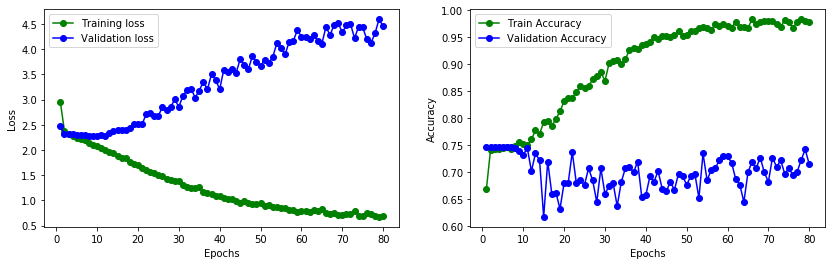

In [42]:
showResults(history)

In [43]:
results = model5.predict([padded_test_docs_h,padded_test_docs_b])

In [44]:
results

[array([[4.0782457e-08, 9.6159965e-01, 3.8381889e-02, 1.8434876e-05],
        [1.0032585e-06, 4.1374892e-06, 9.9999380e-01, 1.0787634e-06],
        [8.9365526e-10, 2.2414712e-08, 1.0000000e+00, 7.3106441e-09],
        ...,
        [1.7545088e-07, 1.0707764e-05, 9.9998426e-01, 4.8362967e-06],
        [2.9660288e-05, 4.8043413e-04, 9.9910176e-01, 3.8813226e-04],
        [4.0794683e-07, 4.7624263e-01, 5.2370483e-01, 5.2145460e-05]],
       dtype=float32),
 array([[1.3996084e-03, 4.5876652e-02, 9.4634324e-01, 6.3804318e-03],
        [6.3407622e-02, 2.5487298e-02, 9.0777206e-01, 3.3330254e-03],
        [2.7208560e-05, 9.1563846e-04, 9.9893457e-01, 1.2247678e-04],
        ...,
        [9.8762838e-03, 1.1048475e-01, 8.7776804e-01, 1.8709152e-03],
        [2.8750807e-02, 1.0671580e-01, 5.5179369e-01, 3.1273976e-01],
        [3.0676866e-04, 1.5331026e-03, 9.9774408e-01, 4.1606853e-04]],
       dtype=float32),
 array([[4.0116915e-03, 9.5555705e-01, 2.6537079e-02, 1.3894185e-02],
        [1.09110

In [45]:
test_labels_1h


array([[0., 0., 1., 0.],
       [0., 0., 0., 1.],
       [0., 0., 1., 0.],
       ...,
       [0., 0., 0., 1.],
       [0., 0., 1., 0.],
       [0., 1., 0., 0.]], dtype=float32)

## III. Data Preprocessing <a id="preprocess" />

### III.1 BERT Tokenizer<a id="tokenizer" />

We first start by defining and exploring the BERT tokenizer:

In [46]:
def create_tokenizer_from_hub_module():
    """Get the vocab file and casing info from the Hub module."""
    with tf.Graph().as_default():
        bert_module = hub.Module(bert_url)
        tokenization_info = bert_module(signature="tokenization_info", as_dict=True)
        with tf.Session() as sess:
            vocab_file, do_lower_case = sess.run([tokenization_info["vocab_file"],
                                            tokenization_info["do_lower_case"]])
      
    return tokenization.FullTokenizer(
      vocab_file=vocab_file, do_lower_case=do_lower_case)

tokenizer = create_tokenizer_from_hub_module()


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [47]:
tok = tokenizer.tokenize(all_data_processed['Headline'][1])
tok

['Hundreds',
 'of',
 'Palestinians',
 'flee',
 'floods',
 'in',
 'Gaza',
 'as',
 'Israel',
 'opens',
 'dams']

In [48]:
tok.insert(0,'[CLS]')

In [49]:
tokenizer.convert_tokens_to_ids(tok)

[101, 25793, 1104, 23755, 10556, 15501, 1107, 15109, 1112, 3103, 7086, 20245]

### III.2. Extraction<a id="extract"/>


We have seen above how the data set looks. We can now turn to the pre-processing and creating the input for BERT. Specifically, we need to:

1) Tokenize the sentences. Note again that one word can be split into multiple tokens, and we need to insert custom labels when that happens to make sure we don't mess up the alignment. We choose a new 'nerX' label here.

2) Create BERT tokens and add [CLS], [PAD], etc.

3) Convert these tokens into ids, also via the tokenizer. These qill create the sentence_ids.

4) Create the mask ids. Mask out all of the padding tokens.

5) Create the sequence ids. In our case, they are all '0' as we do not compare or even have multiple sentences in one example.

To do this, we first define a helper function:

In [50]:
#def addWord(word, pos, ner):
def addWord(word):    
    """
    Convert a word into a word token and add supplied NER and POS labels. Note that the word can be  
    tokenized to two or more tokens. Correspondingly, we add - for now - custom 'X' tokens to the labels in order to 
    maintain the 1:1 mappings between word tokens and labels.
    
    arguments: word, pos label, ner label
    returns: dictionary with tokens and labels
    """
    # the dataset contains various '"""' combinations which we choose to truncate to '"', etc. 
    if word == '""""':
        word = '"'
    elif word == '``':
        word = '`'
        
    tokens = tokenizer.tokenize(word)
    tokenLength = len(tokens)      # find number of tokens corresponfing to word to later add 'X' tokens to labels
    
    addDict = dict()
    
    addDict['wordToken'] = tokens
    #addDict['posToken'] = [pos] + ['posX'] * (tokenLength - 1)
    #addDict['nerToken'] = [ner] + ['nerX'] * (tokenLength - 1)
    addDict['tokenLength'] = tokenLength
    
    
    return addDict


In [51]:
"""
Read the file line by line and construct sentences. A sentence end is marked by the word 'sentence' in the next row.
You need to take care of that. Also, you need to cap sentence length using max_length. Sentences which are shorter than 
max_length need to be padded. Also, we choose to end all sentences with a [SEP] token, padded or not. 
"""

with io.open(data_path + 'ner_dataset.csv', 'r', encoding='utf-8', errors='ignore') as train:
    text = train.readlines()
text

['Sentence #,Word,POS,Tag\n',
 'Sentence: 1,Thousands,NNS,O\n',
 ',of,IN,O\n',
 ',demonstrators,NNS,O\n',
 ',have,VBP,O\n',
 ',marched,VBN,O\n',
 ',through,IN,O\n',
 ',London,NNP,B-geo\n',
 ',to,TO,O\n',
 ',protest,VB,O\n',
 ',the,DT,O\n',
 ',war,NN,O\n',
 ',in,IN,O\n',
 ',Iraq,NNP,B-geo\n',
 ',and,CC,O\n',
 ',demand,VB,O\n',
 ',the,DT,O\n',
 ',withdrawal,NN,O\n',
 ',of,IN,O\n',
 ',British,JJ,B-gpe\n',
 ',troops,NNS,O\n',
 ',from,IN,O\n',
 ',that,DT,O\n',
 ',country,NN,O\n',
 ',.,.,O\n',
 'Sentence: 2,Families,NNS,O\n',
 ',of,IN,O\n',
 ',soldiers,NNS,O\n',
 ',killed,VBN,O\n',
 ',in,IN,O\n',
 ',the,DT,O\n',
 ',conflict,NN,O\n',
 ',joined,VBD,O\n',
 ',the,DT,O\n',
 ',protesters,NNS,O\n',
 ',who,WP,O\n',
 ',carried,VBD,O\n',
 ',banners,NNS,O\n',
 ',with,IN,O\n',
 ',such,JJ,O\n',
 ',slogans,NNS,O\n',
 ',as,IN,O\n',
 ',"""",``,O\n',
 ',Bush,NNP,B-per\n',
 ',Number,NN,O\n',
 ',One,CD,O\n',
 ',Terrorist,NN,O\n',
 ',"""",``,O\n',
 ',and,CC,O\n',
 ',"""",``,O\n',
 ',Stop,VB,O\n',
 ',the,DT,O\n'

In [52]:
text = all_data_processed['Headline']

In [53]:
len(text)

49972

In [54]:
for line in text:
    #print(line)
    x = line.split(' ')
    #print(x)
    print(x[0])
    for y in x:
        print(y)

Police
Police
find
mass
graves
with
at
least
'15
bodies'
near
Mexico
town
where
43
students
disappeared
after
police
clash
Hundreds
Hundreds
of
Palestinians
flee
floods
in
Gaza
as
Israel
opens
dams
Christian
Christian
Bale
passes
on
role
of
Steve
Jobs,
actor
reportedly
felt
he
wasn't
right
for
part
HBO
HBO
and
Apple
in
Talks
for
$15/Month
Apple
TV
Streaming
Service
Launching
in
April
Spider
Spider
burrowed
through
tourist's
stomach
and
up
into
his
chest
'Nasa
'Nasa
Confirms
Earth
Will
Experience
6
Days
of
Total
Darkness
in
December'
Fake
News
Story
Goes
Viral
Accused
Accused
Boston
Marathon
Bomber
Severely
Injured
In
Prison,
May
Never
Walk
Or
Talk
Again
Identity
Identity
of
ISIS
terrorist
known
as
'Jihadi
John'
reportedly
revealed
Banksy
Banksy
'Arrested
&
Real
Identity
Revealed'
Is
The
Same
Hoax
From
Last
Year
British
British
Aid
Worker
Confirmed
Murdered
By
ISIS
Gateway
Gateway
Pundit
Woman
Woman
detained
in
Lebanon
is
not
al-Baghdadi's
wife,
Iraq
says
Kidnapped
Kidnapped
Nigerian
sc

smiling
sun-baby
ISIS
ISIS
cracks
down
on
five
confirmed
Ebola
cases
among
fighters:
official
Media
Media
outlets
identify
'Jihadi
John'
J.J.
J.J.
Abrams
Asks
Disney
To
Move
Up
'Star
Wars:
The
Force
Awakens'
Release
Date
iPhone
iPhone
Game
Developer
Quits
Job
By
Hiding
The
Greatest
Letter
Of
Resignation
Ever
Inside
His
Game
Lego
Lego
letter
to
parents
in
1974
on
gender
equality
still
resonates
40
years
on
FIDEL
FIDEL
CASTRO
DEATH
WATCH:
RUMORS
HEAT
UP,
CUBA
DENIES
Christian
Christian
Bale
Won't
Play
Steve
Jobs
After
All
Suspected
Suspected
meteorite
leaves
crater
in
Managua,
is
linked
to
asteroid
KIM
KIM
DINE
WITH
ME:
Porky
president
Kim
Jong-un
to
open
UK
restaurant
serving
DOG
Canadian
Canadian
Soldier
Shot
At
Ottawa
War
Memorial:
Report
'They
'They
ate
through
the
ceilings
and
pooped
on
the
keyboards':
Rats
are
'taking
over'
Vogue's
new
World
Trade
Center
office
and
Anna
Wintour
'no
longer
wants
to
work
there'
Mexico
Mexico
prosecutor:
Students
not
in
1st
mass
graves
Audio
Audio
rec

Big
Mac,
Apple
Pies
And
Eliminating
Large
Size
Options
Cold
Cold
Turkey
Founding
Founding
Fathers-Era
Time
Capsule
Found
in
Boston
ISIS
ISIS
Appears
To
Behead
American
Photojournalist
In
YouTube
Video
BREAKING
BREAKING
NEWS:
British-born
U.S.
photojournalist
held
hostage
by
al-Qaeda
killed
in
failed
rescue
attempt
in
Yemen
You
You
may
be
able
to
make
appointments
at
the
Apple
Store
to
try
on
the
Apple
Watch
when
it
launches
Soldier
Soldier
shot
at
War
Memorial;
multiple
shots
fired
in
Parliament
Mass
Mass
Graves
Found
In
Mexico,
Near
Place
Where
43
Students
Went
Missing
Whiz
Whiz
kid
stock
picker:
I
didn't
actually
make
$72M
trading
Isis
Isis
video
claims
to
show
beheading
of
British
hostage
David
Haines
Soldier
Soldier
shot
near
Canadian
parliament
building
ISIS
ISIS
leader
dead?
Sick
Sick
Kansas
City
man
said
not
to
have
Ebola,
U.S.
plans
new
steps
to
fight
virus
British
British
rapper
a
suspect
in
ISIS
beheading
Jose
Jose
Canseco
shoots
self
in
hand
New
New
policy
could
reduce
marij

further
into
White
House
than
Secret
Service
said
Is
Is
There
an
ISIS
Threat
on
the
Texas-Mexico
Border
or
Not?
A
A
Predator
Drone
Has
Reportedly
Been
Spotted
Circling
Above
ISIS's
Capital
City
No,
No,
Banksy
Didn't
Create
That
'Charlie
Hebdo'
Tribute
Cartoon,
But
That
Doesn't
Mean
You
Can't
Appreciate
It
Sources:
Sources:
Guns
N'
Roses
Frontman
Axl
Rose
Found
Dead
in
West
Hollywood
Home
at
Age
52
BREAKING:
BREAKING:
Islamic
State,
in
video,
beheads
American
journalist
James
Wright
Foley
who
was
kidnapped
in
2012
-@BNONews
Explosion
Explosion
reported
near
the
Nicaraguan
capital
attributed
to
meteorite
impact,
but
experts,
including
NASA,
cast
doubt
on
claims
Mexico
Mexico
finds
4
more
graves
at
site
of
suspected
student
massacre
Shocking
Shocking
picture
shows
mother
trying
to
sell
her
own
son
to
pay
for
twin
daughter's
cancer
treatment
Dog
Dog
found
abandoned
at
Scottish
train
station
with
suitcase
of
belongings
ISIS
ISIS
Unleash
"Scorpion"
Bombs
In
Iraq
Report
Report
claims
Kim
Jong

al-Baghdadi
held
in
Lebanon,
officials
say
James
James
Wright
Foley,
Kidnapped
Journalist,
Apparently
Executed
by
ISIS
Alleged
Alleged
audio
of
Michael
Brown
shooting
released
Bodies
Bodies
In
Mexico
Mass
Grave
Apparently
Not
Those
Of
Missing
Students
Catholic
Catholic
Priest
Dead
For
48
Minutes,
Is
Miraculously
Revived
–
His
Revelations
About
God
Are
Even
More
Shocking
Bali
Bali
spider
burrows
under
Aussie’s
chest
North
North
Korean
leader
Kim
Jong
Un
had
ankle
surgery,
report
says
Boko
Boko
Haram
leader
denies
ceasefire
deal,
says
200
abducted
girls
married
off

Journalist
Journalist
James
Wright
Foley
reportedly
beheaded
by
ISIS
Electric
Electric
shock
turns
Russian
boy
into
Marvel's
Magneto
Islamic
Islamic
State
training
fighter
pilots
in
captured
jets,
monitoring
group
says
Once
Once
Again,
The
Banksy
'Arrest'
Is
A
Giant
Hoax.
Repeat:
A
Hoax.
Report:
Report:
Israeli-Canadian
woman
fighting
Islamic
State
has
been
kidnapped
by
terror
group
Rats
Rats
are
still
running
around
at
Vogue

Pizza
delivery
man
gets
$2,000
tip
Pentagon
Pentagon
Denies
It
Killed
ISIS
Chief
As
Airstrikes
Hit
Top
Extremists
Nigeria
Nigeria
claims
deal
with
Boko
Haram
on
ceasefire,
kidnapped
girls
After
After
Giving
A
Homeless
Man
$100,
This
Guy
Secretly
Filmed
Him...
Canadian-Israeli
Canadian-Israeli
Woman
May
Have
Been
Captured
In
Syria:
Reports
Vogue's
Vogue's
Anna
Wintour
Pissed
Off
With
New
1
World
Trade
Center
Offices,
Infested
With
Rats
Durex
Durex
Is
Not
Making
Pumpkin
Spice
Condoms
After
All:
A
Hoax
Debunked
Macaulay
Macaulay
Culkin
Victim
of
Another
Online
Death
Hoax
Apple
Apple
Watch
Stainless
Steel
variant
reportedly
priced
at
$500,
$4,000
for
the
gold
variant
ISIS
ISIS
fighters
‘have
contracted
Ebola’
IRAQI
IRAQI
AND
KURDISH
MEDIA
REPORTS:
ISIS
FIGHTERS
HAVE
CONTRACTED
EBOLA
Macaulay
Macaulay
Culkin
Dead?
Another
Death
Hoax
Circulates
On
Facebook
Jess
Jess
Smith,
19,
Claims
She
Was
Teletubbies'
Giggling
Baby:
What
Did
She
Get
Paid?
Shots
Shots
Heard
In
Alleged
Brown
Shooting
Record

£1.5million
Bugatti
Veyron
Insiders
Insiders
Claim
Steel
Apple
Watch
to
Start
at
$500,
Gold
at
$4,000
Islamic
Islamic
State
killer
'Jihadi
John'
named
as
Mohammed
Emwazi
Media
Media
reports
identify
Londoner
as
Islamic
State's
‘Jihadi
John’
Boko
Boko
Haram
leader
denies
ceasefire
deal,
says
200
abducted
girls
married
off

Don't
Don't
forget
to
tip...especially
if
you
spend
$300,000
Man
Man
chops
off
his
own
penis
after
girlfriend
told
him
he
was
no
good
in
bed
Once
Once
Again,
The
Banksy
'Arrest'
Is
A
Giant
Hoax.
Repeat:
A
Hoax.
ISIS
ISIS
militants
appear
to
behead
abducted
American
journalist
James
Wright
Foley
in
graphic
video
Penis
Penis
graffiti
drawn
on
£1.5million
Bugatti
Veyron
Predator
Predator
Drone
Reportedly
Spotted
Over
ISIS
Hotbed
in
Syria;
Airstrikes
Hit
ISIS
Targets
Dead
Dead
for
48
minutes,
this
Catholic
Priest
claims
God
is
female
Managua
Managua
explosion
not
a
meteorite,
NASA
suggests
Watch
Watch
US
Marine
get
shot
in
HEAD
by
Taliban
sniper
-
and
live
to
tell
tale
Ne

Fur
Coats
Former
Former
British
Rapper
Reportedly
Under
Investigation
for
James
Foley
Beheading
Urgent:
Urgent:
The
Leader
of
ISIL
'Abu
Bakr
al-Baghdadi'
Killed!
/
Photo
'Jihadi
'Jihadi
John'
named
as
Mohammed
Emwazi
from
London
It’s
It’s
About
To
Get
Harder
To
Be
Arrested
For
Pot
Possession
In
New
York
City
Turkish
Turkish
Leader
Says
U.S.
Airdrop
Aided
ISIS
Militants
Christian
Christian
Bale
Drops
Out
of
Steve
Jobs
Biopic
Here
Here
Are
Microsoft's
New
Robot
Security
Guards
Apple
Apple
Watch
battery
will
require
nightly
charging
Nigeria
Nigeria
says
it
has
deal
with
Boko
Haram
to
release
kidnapped
girls
Satirical
Satirical
news
site
attacks
China’s
weird
English
names
U.S.
U.S.
Hostage
Luke
Somers
Killed
During
Yemen
Rescue
Bid:
Family
ISIS
ISIS
launch
SCORPION
BOMBS
to
spread
panic
in
Iraq
More
More
than
200
kidnapped
Nigerian
girls
to
be
released
after
deal
reached
with
Boko
Haram
ISIS
ISIS
Militants
Allegedly
Contracted
Ebola
Kim
Kim
Jong-Un
planning
Scottish
restaurant
Canada
Cana

State
jihadists
in
‘message’
to
United
States
Obama,
Obama,
Outraged
Over
Beheading,
Vows
to
Stay
on
Course
Dog
Dog
abandoned
at
Ayr
station
with
belongings
in
suitcase
Apple
Apple
Watch
Gold
Edition
rumored
to
be
priced
at
$1200:
Will
you
buy?
Audio
Audio
recording
allegedly
captures
at
least
10
shots
fired
in
Michael
Brown
killing
ISIS
ISIS
Claims
It
Kidnapped
Gill
Rosenberg,
The
First
Western
Woman
To
Fall
Into
The
Group's
Hands
North
North
Korea
dictator
Kim
Jong-un
'set
to
open
a
new
restaurant
in
SCOTLAND'
Audio
Audio
recording
of
Michael
Brown
being
gunned
down
WAS
made
at
the
time
he
was
killed:
App
company
appears
to
confirm
tape
of
ELEVEN
bullets
being
fired
-
including
final
volley
of
'kill
shots'
Nigeria
Nigeria
Claims
Boko
Haram
Will
Release
the
Kidnapped
Schoolgirls
ISIS
ISIS
executioner
'Jihadi
John'
identified
as
Mohammed
Emwazi
Nicaragua
Nicaragua
Meteorite
Impact
Theory
May
Be
Meteor-wrong
Rumors
Rumors
of
ISIS
leader's
death
debunked
Missing
Missing
Libyan
aircraft
s

Plant
ripped
up
$800M
Led
Zeppelin
reunion
contract
New
New
Audio
Reveals
Pause
in
Gunfire
When
Michael
Brown
Was
Shot:
Attorney
Penis
Penis
Spray-Painted
on
a
$2.5
Million
Car
Was
Just
for
a
Prank
Video
Kim
Kim
Jong
ill?
Analysts
say
27-year-old
sister
Kim
Yo
Jong
may
be
running
North
Korea
(VIDEO)
Vogue's
Vogue's
Anna
Wintour
Pissed
Off
With
New
1
World
Trade
Center
Offices,
Infested
With
Rats
Did
Did
Kim
Yo-Jong
Take
Kim
Jong
Un’s
Role?
North
Korea
Ill
Health
Rumors
Are
‘Fabricated’
Nigeria
Nigeria
announces
truce
with
Boko
Haram;
fate
of
schoolgirls
unclear
Expert
Expert
casts
doubt
on
Bunbury
man
Dylan
Thomas’s
burrowing
stomach-spider
story
US
US
hostage
Luke
Somers
dies
after
rescue
bid
UPDATED
UPDATED
'Jihadi
John'
identified
as
Mohammed
Emwazi
of
London,
reports
say
Batmobile
Batmobile
Stolen
From
"Batman
v
Superman:
Dawn
of
Justice"
Set,
Zack
Snyder
Knows
Who
Did
It
ISIL
ISIL
allegedly
kills
US
journalist
in
video
Missing
Missing
Libyan
aircraft
spark
fears
of
9/11-style
atta

Boston
Marathon
Bomber
Severely
Injured
In
Prison,
May
Never
Walk
Or
Talk
Again
Kim
Kim
Jong-un:
obese
leader
'fractured
both
ankles'
Detroit
Detroit
Police
Issue
Statement
That
The
Batmobile
Is
Safe
The
The
Unluckiest
Man
In
The
World
Set
His
College
On
Fire
With
A
Fireworks
Marriage
Proposal
Report:
Report:
ISIS
kidnaps
Canadian-Israeli,
former
IDF
soldier
who
went
to
fight
with
the
Kurds
US
US
airstrike
targets
Al
Shabaab
leader
Ahmed
Abdi
Godane
in
Somalia
What
What
This
Homeless
Guy
Did
With
$100
Completely
Stunned
The
Man
Who
Gave
It
To
Him
Steve
Steve
Jobs
Biopic
Eyes
Seth
Rogen
to
Play
Apple
Co-Founder
Steve
Wozniak
Fidel
Fidel
Castro
Is
Dead,
According
to
Viral
Twitter
Rumors
CPWD
CPWD
official
sacked
for
absence
from
duty
for
25
years
Yang
Yang
Hu,
worker
in
Zhejiang,
cuts
off
own
penis
over
desperation
of
finding
love
Dog
Dog
Found
Abandoned
With
Suitcase
Filled
With
His
Belongings
Nigeria
Nigeria
says
ceasefire
agreed
with
Boko
Haram
Nun
Nun
gives
birth
to
surprise
baby
aft

Apple
TV
Streaming
Service
Launching
in
April
Spider
Spider
burrowed
through
tourist's
stomach
and
up
into
his
chest
Fidel
Fidel
Castro
Rumors
Sweep
Internet,
but
No
Sign
in
Cuba
Has
Has
Apple
quietly
fixed
its
iPhone
6
Plus
‘Bendgate’
problem?
6
6
hidden
mass
graves
may
hold
missing
Mexican
students
This
This
Is
The
Most
Epic
Way
To
Quit
Your
Job
Nasty
Nasty
iOS
8
Bug
Could
Erase
Your
iCloud
Drive
Documents
Iraqi
Iraqi
media:
ISIS
militants
have
contracted
Ebola
Is
Is
There
an
ISIS
Threat
on
the
Texas-Mexico
Border
or
Not?
ISIS
ISIS
Fighters
Getting
Caught
Coming
Across
the
U.S.-Mexican
Border?
Two
Two
GOP
Congressmen
Say
Suspected
Terrorists
Caught
Crossing
U.S.–Mexico
Border
Abdel-Majed
Abdel-Majed
Abdel
Bary
in
Foley
beheading:
London
rapper
songs
help
identify
him
Saudi
Saudi
cleric
says
snowmen
are
anti-Islamic
Priest
Priest
who
died
for
48
minutes
says
he
met
God
and
she’s
a
woman
7
7
teen
girls
get
pregnant
on
school
trip
Read
more
at
http://www.wnd.com/2014/12/7-teen-girls-get

Throws
Down
$300K
on
Lavish
Vegas
Dinner
No,
No,
Pumpkin
Spice
Condoms
Are
Not
A
Real
Thing
NET
NET
Extra:
Back-from-the-dead
Catholic
priest
claims
God
is
a
female
ISIS
ISIS
Beheading
of
U.S.
Journalist
James
Foley
Posted
to
YouTube
Brian
Brian
Williams
Demands
Apology
From
Social
Media
Over
Erroneous
Urination
Reports
(Video)
Nigeria:
Nigeria:
hopes
for
return
of
kidnapped
schoolgirls
rise
after
ceasefire
reported
No,
No,
Banksy
has
not
been
arrested
(sigh)
ISIS
ISIS
Video
Purports
To
Show
Beheading
Of
British
Aid
Worker
Report:
Report:
NYPD
to
stop
arresting
people
for
minor
marijuana
offenses
Predator
Predator
Drone
Reportedly
Spotted
Over
ISIS
Stronghold
American
American
hostage
killed
in
rescue
attempt
in
Yemen
-
senior
official
Nasa
Nasa
questions
whether
crater
in
Nicaragua
caused
by
meteorite
Report:
Report:
Former
Baseball
Star
Jose
Canseco
Accidentally
Shot
At
Home
Newly
Newly
Discovered
Mass
Grave
Linked
to
Missing
Mexican
Students
New
New
Audio
Reveals
Pause
in
Gunfire
Wh

infected
Isis
militants
in
Mosul?
Meteorite
Meteorite
'caused
mysterious
boom
in
Nicaragua'
#ISIS
#ISIS
beheads
photojournalist
James
Wright
Foley
in
a
massage
to
US
to
end
its
intervention
in
#Iraq.
Star
Star
Wars
VII
for
a
New
SUMMER
Release
Date!?
Time
Time
Capsule
from
Paul
Revere
and
Samuel
Adams
Discovered
in
Boston
IS
IS
Beheads
Briton
David
Cawthorne
Haines,
Threatens
to
Execute
Another
Briton,
Alan
Henning
Canadian-Israeli
Canadian-Israeli
Woman
May
Have
Been
Captured
In
Syria:
Reports
Isis
Isis
Syria
News:
Video
Shows
US
Airdropped
Weapons
and
Grenades
'Captured
by
Islamic
State'
Media
Media
Fooled
Again?
Story
Claims
7
of
28
Girls
On
School
Trip
Came
Home
Pregnant
Expert
Expert
casts
doubt
on
Bunbury
man
Dylan
Thomas’s
burrowing
stomach-spider
story
New
New
Audio
Reveals
Pause
in
Gunfire
When
Michael
Brown
Was
Shot:
Attorney
Soldier
Soldier
shot,
Parliament
locked
down
after
gunfire
erupts
at
war
memorial
Senior
Senior
Western
Intelligence
Official
Confirms
London
Rapper
Abd

crawl
through
a
man's
body
for
several
days
Islamic
Islamic
State
claims
to
have
beheaded
American
journalist
Unconfirmed:
Unconfirmed:
ISIS
Claims
Kayla
Mueller,
American
Female
Hostage,
Is
Dead
FIDEL
FIDEL
CASTRO
DEATH
WATCH:
RUMORS
HEAT
UP,
CUBA
DENIES
Suspected
Suspected
meteorite
leaves
crater
in
Managua,
is
linked
to
asteroid
'They
'They
ate
through
the
ceilings
and
pooped
on
the
keyboards':
Rats
are
'taking
over'
Vogue's
new
World
Trade
Center
office
and
Anna
Wintour
'no
longer
wants
to
work
there'
ISIS
ISIS
beheads
American
photo-journalist
James
Wright
Foley,
threatens
more
to
come
U.S.
U.S.
Hostage
Luke
Somers
Killed
During
Yemen
Rescue
Bid:
Family
Anna
Anna
Wintour
'refuses
to
work
at
new
World
Trade
Center
Vogue
office
due
to
rat
infestation'
Alleged
Alleged
Ottawa
gunman:
What
we
know
so
far
about
Michael
Zehaf-Bibeau
NEWS/
NEWS/
You'll
Never
Guess
How
a
Homeless
Man
Spent
$100—Watch
the
Touching
Video!
Boko
Boko
Haram
denies
truce
to
release
kidnapped
schoolgirls
L.
L.
Ji

Bomber
Severely
Injured
In
Prison,
May
Never
Walk
Or
Talk
Again
Another
Another
American
hostage
at
risk
by
Islamic
state
James
James
Foley
remembered
as
'brave
and
tireless'
journalist
Priest
Priest
who
died
for
48
minutes
says
he
met
God
and
she’s
a
woman
US
US
Drones,
Hunting
for
ISIS
Leader,
Seen
Flying
over
Syrian
Airspace
White
White
House
Fence
Jumper
Actually
Made
It
Pretty
Far
Inside
Report:
Report:
Apple
Watch
Will
Need
Charging
Every
Day
Seth
Seth
Rogen
to
Star
as
Steve
Wozniak
in
Sony's
Steve
Jobs
Biopic
[Updated]
Report:
Report:
Former
Baseball
Star
Jose
Canseco
Accidentally
Shot
At
Home
Ottawa
Ottawa
investigates
reports
that
Isis
has
captured
Canadian-Israeli
woman
Vice
Vice
CEO
Shane
Smith
reportedly
spent
$300,000
on
a
steak
dinner
at
CES
Report
Report
claims
Kim
Jong-un
underwent
surgery
to
repair
fractured
ankles
Thanks
Thanks
Uncle
Sam,
we
have
your
weapons
airdrop:
ISIS
taunts
America
over
intercepted
weapons
meant
for
Kurds
Christian
Christian
Bale
in
talks
to
pla

capital
attributed
to
meteorite
impact,
but
experts,
including
NASA,
cast
doubt
on
claims
An
An
audio
recording
of
the
Michael
Brown
shooting
has
reportedly
surfaced
Staff
Staff
Reporter
God
God
is
a
woman-
Priest
who
died
for
48
minutes
claims
A
A
soldier
has
been
shot
at
Canada’s
war
memorial
just
steps
away
from
the
nation’s
parliament
Israel
Israel
opens
dams,
floods
Gaza
Boko
Boko
Haram
Denies
Ceasefire,
Says
Kidnapped
Girls
Are
Now
Married
Vice's
Vice's
Shane
Smith
drops
$300,000
on
Vegas
dinner
Nun
Nun
Gives
Birth
To
Baby
Boy
After
Suffering
Intense
Stomach
Pains
How
How
Canadian
Sergeant-at-Arms
Kevin
Vickers
killed
shooter
in
parliament
Matt
Matt
Taibbi
Disappears
From
Omidyar’s
First
Look
Media
Hero
Hero
soldier
Nathan
Cirillo
killed
by
convicted
criminal
Michael
Zehaf-Bibeau
#Hairgate:
#Hairgate:
Reports
of
iPhone
6
pulling
out
hair,
beards,
likely
exaggerated
No,
No,
Banksy
hasn’t
been
arrested
Canterbury
Canterbury
Christ
Church
University
student
Jess
Smith,
from
Chatham,

State
claims
to
have
beheaded
American
journalist
Mohammed
Mohammed
Islam
Denies
Making
$72
Million
From
Stock
Market
Trading
Sergeant-at-Arms
Sergeant-at-Arms
stopped
shooter
on
Parliament
Hill
Latest
Latest
iOS
8
bug
reportedly
causes
unwanted
deletion
of
iCloud
Drive
documents
Video
Video
Purports
to
Show
Beheading
of
American
Journalist
IRAQI
IRAQI
AND
KURDISH
MEDIA
REPORTS:
ISIS
FIGHTERS
HAVE
CONTRACTED
EBOLA
Pants
Pants
on
Fire:
Duncan
Hunter
makes
unconfirmed
claim
Border
Patrol
caught
at
least
10
ISIS
fighters
Man
Man
Known
as
‘Jihadi
John’
Is
Identified
as
Mohammed
Emwazi
Blundering
Blundering
boyfriend
burns
down
college
after
trying
to
impress
his
girlfriend
with
elaborate
marriage
proposal
This
This
Week
In
Weird
News:
Horrible
Human
Slaps
Elderly
Woman
For
Sneezing
Catholic
Catholic
Priest
Dead
For
48
Minutes,
Is
Miraculously
Revived
–
His
Revelations
About
God
Are
Even
More
Shocking
Ottawa
Ottawa
Gunman
Identified
As
Michael
Zehaf-Bibeau
11
11
jetliners
'missing'
after
Is

BREAKING
Gill
Rosenberg
former
IDF
soldier
was
captured
by
ISIS
IRAQI
IRAQI
AND
KURDISH
MEDIA
REPORTS:
ISIS
FIGHTERS
HAVE
CONTRACTED
EBOLA
Is
Is
Kim
Jong-un’s
sister
now
the
power
behind
the
North
Korean
throne?
Lawmaker
Lawmaker
Says
‘At
Least
10′
Islamic
State
Fighters
Have
Been
Captured
at
the
Southern
U.S.
Border
White
White
House
Fence
Jumper
Got
Farther
Than
Previously
Thought,
Sources
Say
Islamic
Islamic
State
claims
it
executed
American
photojournalist
James
Foley
Cheese
Cheese
blamed
for
North
Korean
leader
Kim
Jong-un's
broken
ankles
Banksy
Banksy
arrest
hoax:
US
website
claims
street
artist
caught
in
Watford
Does
Does
ISIS
have
an
airforce?
Terrorist
'fighter
pilots'
are
being
trained
on
captured
MiGs
by
Saddam
Hussein's
ex-air
force
officers
BiH:
BiH:
Seven
Primary
School
Students
Pregnant
After
Five-Day
Excursion
Resetting
Resetting
iOS
8
Preferences
May
Wipe
iCloud
Files
Al-Shabab
Al-Shabab
leader
who
ordered
Kenya
mall
massacre
believed
killed
in
US
drone
attack
in
Somal

Home
at
Age
52
Report:
Report:
Stainless
steel
Apple
Watch
will
be
priced
$500,
gold
at
$5,000
Officials
Officials
Refute
Iraqi
Media
Reports
That
ISIS
Members
Have
Contracted
Ebola
In
Mosul
Christian
Christian
Bale
won't
play
Steve
Jobs
UPDATE:
UPDATE:
BATMAN
v
SUPERMAN
Batmobile
Reportedly
Stolen
By
(Shocker!)
Detroit
Locals
CNN
CNN
audio:
Is
this
the
moment
Michael
Brown
was
shot?
An
An
Audio
Recording
of
the
Michael
Brown
Shooting
Has
Reportedly
Surfaced
Christian
Christian
Bale
will
not
play
Steve
Jobs
Thanks
Thanks
Uncle
Sam,
we
have
your
weapons
airdrop:
ISIS
taunts
America
over
intercepted
weapons
meant
for
Kurds
Christian
Christian
Bale
Won't
Play
Steve
Jobs
After
All
Large
Large
space
object
slams
Nicaragua’s
capital
as
asteroid
passes
Earth
Former
Former
British
Rapper
Reportedly
Under
Investigation
for
James
Foley
Beheading
Comfort
Comfort
eating?
Chinese
woman,
26,
spends
an
entire
WEEK
in
KFC
after
being
dumped
by
boyfriend
ISIS
ISIS
Unleash
"Scorpion"
Bombs
In
Iraq
ISIS


from
West
London’
'American
'American
bombing
had
signed
my
death
certificate':
Missing
US
journalist
James
Wright
Foley
goes
unflinching
to
his
death
as
ISIS
behead
him
in
horrific
video,
as
a
warning
to
Obama
Star
Star
Wars:
The
Force
Awakens
to
be
released
this
summer?
CARLISLE
CARLISLE
HEAD
SLAPPER
ATTACKS
SNEEZING
WOMEN
Rumors
Rumors
of
ISIS
leader's
death
debunked
India:
India:
400
men
cut
off
their
testicles
to
'get
closer
to
God'
following
advice
from
'guru'
BREAKING
BREAKING
NEWS:
ISIS
beheads
missing
American
journalist
James
Wright
Foley
as
warning
to
US
to
cease
action
in
Iraq
Sick
Sick
Kansas
City
man
said
not
to
have
Ebola,
U.S.
plans
new
steps
to
fight
virus
Fears
Fears
journalist
James
Wright
Foley
beheaded
by
Islamic
State
jihadists
in
‘message’
to
United
States
Dog
Dog
abandoned
at
Ayr
station
with
belongings
in
suitcase
NYPD
NYPD
to
stop
arresting
for
low-level
marijuana
charges,
will
issue
tickets
instead:
source
Explosion
Explosion
reported
near
the
Nicaraguan
capi

who
slaps
people
around
the
head
for
sneezing
hunted
by
police
An
An
audio
recording
of
the
Michael
Brown
shooting
has
reportedly
surfaced
Sadly,
Sadly,
Pumpkin
Spice
Condoms
Aren't
A
Thing
After
All
First
First
bendgate...
now
it's
HAIRGATE:
Angry
iPhone
6
owners
claim
design
is
causing
chunks
of
their
hair
to
be
ripped
out
when
they
make
a
phone
call
Did
Did
Paul
Rudd
Help
Tackle
That
Dallas
Airport
Gay-Basher?
Isilkulskom
Isilkulskom
student
has
gained
superhero
powers
after
shock
Vice's
Vice's
Shane
Smith
drops
$300,000
on
Vegas
dinner
Lady
Lady
on
FB:
I'm
41,
Intersex,
and
Fucked
Michael
Phelps
on
First
Date
WSJ:
WSJ:
Apple
cut
watch
health
features
due
to
erratic
sensors
Alleged
Alleged
audio
of
Michael
Brown
shooting
released
The
The
rapper,
the
hacker
and
the
terror
travel
guide
writer.
Is
one
of
these
British
extremists
Jihadi
John?
Three
potential
Islamic
State
'Beatles'
emerge
as
MI5
'zeroes
in'
on
murderer
who
beheaded
U.S.
journalist
James
Foley
Texas
Texas
Plumber
Isn't
S

ASBO
after
noise
complaint
Islamic
Islamic
State
fighters
detonate
'SCORPION
bombs'
in
terror
siege
Mexico
Mexico
finds
4
more
graves
at
site
of
suspected
student
massacre
Web
Web
of
confusion
as
scientists
cast
doubt
on
man's
claims
that
a
spider
burrowed
into
his
stomach
through
his
SCAR
New
New
iOS
8
bug
can
delete
all
of
your
iCloud
documents
#ISIS
#ISIS
beheads
photojournalist
James
Wright
Foley
in
a
massage
to
US
to
end
its
intervention
in
#Iraq.
ISIS
ISIS
cracks
down
on
five
confirmed
Ebola
cases
among
fighters:
official
Boko
Boko
Haram
agrees
to
ceasefire,
release
of
school
girls
Nigeria
Nigeria
Boko
Haram
blamed
for
raids
despite
truce
claim
Nicaragua
Nicaragua
Meteorite
Impact
Theory
May
Be
Meteor-wrong
ISIL
ISIL
video
claims
beheading
of
kidnapped
journalist
James
Foley
Canadian-Israeli
Canadian-Israeli
Woman
Says
She
Hasn’t
Been
Captured
By
ISIS
Isis
Isis
claims
to
behead
US
journalist
Rep.
Rep.
Duncan
Hunter:
'At
Least
10'
ISIS
Fighters
Caught
at
Mexican
Border
Ferguson
Fe

ISIS
leader's
'wife'
ISIS
ISIS
militants
appear
to
behead
abducted
American
journalist
James
Wright
Foley
in
graphic
video
Conde
Conde
Nast's
rat
problem
at
One
World
Trade
Centre:
From
red
carpets
to
rodent
droppings
Pure
Pure
Evil:
Islamic
State
Beheads
American
Journalist
James
Wright
Foley
Nigeria
Nigeria
says
ceasefire
agreed
with
Boko
Haram
Sources:
Sources:
Guns
N'
Roses
Frontman
Axl
Rose
Found
Dead
in
West
Hollywood
Home
at
Age
52
BREAKING:
BREAKING:
Islamic
State,
in
video,
beheads
American
journalist
James
Wright
Foley
who
was
kidnapped
in
2012
-@BNONews
Explosion
Explosion
reported
near
the
Nicaraguan
capital
attributed
to
meteorite
impact,
but
experts,
including
NASA,
cast
doubt
on
claims
Emotional
Emotional
sergeant-at-arms
is
greeted
back
to
parliament
with
a
rousing
standing
ovation
a
day
after
he
heroically
shot
dead
terrorist
-
the
first
time
he
used
weapon
in
30
year
career
ISIL
ISIL
militant
'Jihadi
John'
named
by
media
Nigeria
Nigeria
Claims
Boko
Haram
Will
Release


Video
Video
messaging
service
verifies
timing
of
CNN
audio
recording
Meteorite
Meteorite
leaves
crater
in
Nicaraguan
capital
Managua
Report:
Report:
A
Radically
Redesigned
12-Inch
MacBook
Air
Is
Coming
Dog
Dog
abandoned
at
Scotland
train
station
with
suitcase
London
London
hip-hop
artist
Abdel-Majed
Abdel
Bary
key
suspect
in
hunt
for
killer
of
American
journalist
James
Foley
Seth
Seth
Rogen
to
Play
Apple’s
Steve
Wozniak
Questions
Questions
raised
over
Nicaragua
'meteorite'
What
What
This
Homeless
Guy
Did
With
$100
Completely
Stunned
The
Man
Who
Gave
It
To
Him
Does
Does
Vogue's
New
Office
Have
a
Rat
Infestation?
‘Evil
‘Evil
straight
from
the
pits
of
hell':
American
journalist
James
Foley
reportedly
beheaded
by
ISIS
Militant
Militant
Group
Says
It
Killed
American
Journalist
in
Syria
Sugarhill
Sugarhill
Gang
co-founder
Big
Bank
Hank
dies
Video
Video
shows
dramatic
moment
bullet
strikes
U.S.
Marine’s
head
—
and
he
survives
thanks
to
kevlar
helmet
U.S.
U.S.
arms
airdrop
fell
into
ISIS
hands

and
was
paid
just
£250
and
a
box
of
toys
Insurgents
Insurgents
killed
in
Nigeria
despite
alleged
truce
with
Boko
Haram
New
New
iOS
8
bug
can
delete
all
of
your
iCloud
documents
NYC
NYC
High
School
Student
Nicknamed
‘Teen
Wolf’
Made
$72
Million
On
Stock
Market
Sugarhill
Sugarhill
Gang
Rapper
‘Big
Bank
Hank’
Dies
at
57
ISIS
ISIS
Extremists
Claim
to
Behead
British
Hostage
David
Haines
ISIL
ISIL
video
claims
beheading
of
kidnapped
journalist
James
Foley
Schoolboy
Schoolboy
who
got
electric
shock
from
lamppost
claims
he
now
has
magnetic
powers
Man
Man
chops
off
own
penis,
throws
it
in
a
dustbin
after
poor
show
in
bed
Report:
Report:
Christian
Bale
Will
Play
Steve
Jobs
It’s
It’s
About
To
Get
Harder
To
Be
Arrested
For
Pot
Possession
In
New
York
City
Expert
Expert
casts
doubt
on
Bunbury
man
Dylan
Thomas’s
burrowing
stomach-spider
story
Nigerians
Nigerians
doubtful
of
girls'
release
after
Boko
Haram
'truce'
breached
Angry
Angry
mob
hacks
off
alleged
rapist's
genitals
with
meat
cleaver
after
dra

In
Libya,
Sparking
Terror
Attack
Fears
ISIL
ISIL
Beheads
American
Photojournalist
in
Iraq
FBI
FBI
Probing
Alleged
Audio
of
Michael
Brown
Shooting
Seven
Seven
girls
as
young
as
13
become
pregnant
on
a
school
trip
Russian
Russian
TV
actor
wakes
up
to
find
his
testicles
stolen
Six
Six
months
after
abducting
Nigerian
schoolgirls,
Boko
Haram
reportedly
wants
to
free
them
Seth
Seth
Rogen
to
Play
Apple’s
Steve
Wozniak
Fears
Fears
journalist
James
Wright
Foley
beheaded
by
Islamic
State
jihadists
in
‘message’
to
United
States
Jihadi
Jihadi
John
‘identified
as
British
man
from
West
London’
The
The
Pumpkin-Spice
Condom
Is
Just
a
Figment
of
Your
Own
Gross
Imagination
'American
'American
bombing
had
signed
my
death
certificate':
Missing
US
journalist
James
Wright
Foley
goes
unflinching
to
his
death
as
ISIS
behead
him
in
horrific
video,
as
a
warning
to
Obama
Small
Small
Meteorite
Strikes
in
Nicaragua's
Capital
City
of
Managua
Stainless
Stainless
steel
Apple
Watch
could
cost
just
$499,
but
gold
will


because
it's
a
boy?
Mexico
Mexico
finds
4
more
graves
at
site
of
suspected
student
massacre
#ISIS
#ISIS
beheads
photojournalist
James
Wright
Foley
in
a
massage
to
US
to
end
its
intervention
in
#Iraq.
Vandals
Vandals
add
rude
paint
job
to
$2.5m
Bugatti
(but
luckily
for
the
owner
it
all
turned
out
to
be
a
hoax)
Sons
Sons
of
Anarchy
Movie?
No,
Kurt
Sutter
Announces
Charlie
Hunnam,
Brad
Pitt
Film
Article
is
Fake
CNN
CNN
audio:
Is
this
the
moment
Michael
Brown
was
shot?
Nigeria,
Nigeria,
Boko
Haram
reach
ceasefire
deal,
kidnapped
girls
to
go
free,
official
says
Brian
Brian
Williams
slams
social
media
for
speculation
weatherman
Mike
Seidel
relieved
himself
on
air
Boko
Boko
Haram
denies
cease-fire,
leader
says
he
married
off
kidnapped
girls
Apple
Apple
Watch
to
Be
Shower-Proof,
Have
100,000
Apps
at
Launch:
Reports
WHO
WHO
says
reports
of
suspected
Ebola
cases
in
Iraq
are
untrue
Google
Google
Grows
With
$1.6
Billion
in
California
Office
Deals
NBC
NBC
weatherman
caught
urinating
in
the
woods
li

Parliament
Hill
shootings
Hope
Hope
Fades
for
Girls'
Release
After
Boko
Haram
'Truce'
Breached
Mexico
Mexico
prosecutor:
Students
not
in
1st
mass
graves
Pumpkin
Pumpkin
Spice
condoms?
Don't
fall
for
this
hoax.
Taylor
Taylor
Lianne
Chandler:
Michael
Phelps'
Cougar
Girlfriend
Revealed?
Sorry,
Sorry,
Fido.
Pope
Francis
did
NOT
say
our
pets
are
going
to
heaven
Boko
Boko
Haram
denies
cease-fire,
leader
says
he
married
off
kidnapped
girls
CNN
CNN
Posts
Alleged
Audio
of
Michael
Brown
Shooting
Want
Want
a
Gold
Apple
Watch?
All
You
Need
is
$5,000
This
This
College
Student
Claims
She
Was
The
'Teletubbies'
Sun
Baby
Photo
Photo
gallery:
Amazing
£300
operation
by
North
Walsham
vet
on
constipated
goldfish
'Jihadi
'Jihadi
John'
identified:
ISIS
killer
named
as
Mohammed
Emwazi
from
West
London
Boko
Boko
Haram
Could
Release
Kidnapped
Girls,
Nigerian
Officials
Say
ISIS
ISIS
Appears
To
Behead
American
Photojournalist
In
YouTube
Video
James
James
Foley
Killer
‘Jihadi
John’
Believed
to
Be
Former
London
Rap

her
break
up
Holy
Holy
Theft!
Batmobile
Stolen
from
'Batman
v
Superman'???
Michael
Michael
Zehaf-Bibeau
ID’d
as
Canadian
Shooting
Suspect
in
Ottawa
Islamic
Islamic
State
Militants
Claim
to
Have
Beheaded
US
Journalist
James
Wright
Foley
Islamic
Islamic
State
militants
claim
to
behead
missing
American
journalist
US
US
drones
hunt
Isis
leader
in
Syria
"Categorically
"Categorically
False":
DHS
Debunks
Right-Wing
Fiction
That
ISIS
Attempted
To
Cross
The
U.S.-
Mexico
Border
Tiger
Tiger
Woods
PED,
PGA
Tour
Suspension
Allegations
Retracted
by
Dan
Olsen
Willie
Willie
Nelson
Dead?
Viral
Hoax
Fools
Internet
Michael
Michael
Phelps’
‘girlfriend’
reveals
she
was
born
a
man
–
and
never
told
the
swimmer
Popular
Popular
'Banksy'
Instagram
account
offers
powerful
message
of
perseverance
after
Paris
attack
Michael
Michael
Brown
shooting
audio
caught
on
tape?
Married
Married
TV
actor
wakes
up
to
find
his
testicles
have
been
stolen
after
kissing
young
woman
in
sauna
Forty
Forty
years
ago,
Lego
wrote
a
powe

in
Ottawa
White
White
House
Fence
Jumper
Pushed
Past
Female
Guard
Insurgents
Insurgents
killed
in
Nigeria
despite
alleged
truce
with
Boko
Haram
Tips
Tips
for
Chinese
choosing
an
English
name
Devoted
Devoted
pet
owner
spends
£300
to
save
his
GOLDFISH
after
it
became
constipated
Son
Son
Pays
Off
His
Parents’
Mortgage
for
Christmas
iFixit
iFixit
Debunks
iPhone
6
Plus
Reinforcement
Claims
Audio
Audio
recording
allegedly
captures
moment
Michael
Brown
was
shot
Report:
Report:
Apple
Watch
to
start
at
$500
in
stainless
steel,
thousands
for
gold
model
Missing
Missing
Libyan
aircraft
spark
fears
of
9/11-style
attack
in
North
Africa
Breaking:
Breaking:
Soldier
shot
at
National
War
Memorial
in
Ottawa
Kim
Kim
Jong-Un
'bans
the
name
Kim
Jong-un'
ISIS
ISIS
leader
dead?
Cold
Cold
Turkey
FBI
FBI
Probing
Alleged
Audio
of
Michael
Brown
Shooting
North
North
Korean
dictator
Kim
Jong-Un
to
open
restaurant
in
Scotland
Boko
Boko
Haram
leader
denies
ceasefire
deal,
says
200
abducted
girls
married
off

Journali

Actor
Found
Dead
In
Apartment
North
North
Korean
leader
Kim
Jong-un
not
missing,
just
having
ankle
surgery
Confusion
Confusion
swirls,
details
murky
in
arrest
of
ISIS
leader's
'wife'
The
The
Man
Who
Says
Comcast
Got
Him
Fired
Has
Filed
a
Lawsuit
ESPN
ESPN
to
save
NFL's
image
with
all-male
domestic
abuse
discussion
Seth
Seth
Rogen
reportedly
nabs
Steve
Wozniak
role
in
Steve
Jobs
filmSteve
Jobs
Iconic
Moments
New
New
Audio
Recording
From
Ferguson
May
Capture
Michael
Brown
Shooting
It's
It's
back!
The
incredible
new
Batmobile
takes
a
spin
around
Detroit...
after
rumors
it
had
been
STOLEN
Homeland
Homeland
Security:
No
ISIL
fighters
on
U.S.
border
YPG
YPG
Confirms:
Gill
Rosenberg
Not
Captured
in
Kobani
Iraq
Iraq
claims
ISIS
leader
al-Baghdadi’s
wife
has
NOT
been
arrested,
despite
Lebanon
insisting
woman
detained
at
border
told
them
she
was
Islamist
extremist’s
spouse
Islamic
Islamic
State
using
'SCORPION
bombs'
to
terrorise
victims
ISIS
ISIS
Getting
Ebola
Etats-Unis:
Etats-Unis:
Mort
penda

the
problem
with
airdrops
#RIPFidel
#RIPFidel
fuels
false
rumors
of
Cuban
leader's
death
after
another
Fidel
Castro
dies
Fake
Fake
Fox
News
Website
Reports
Judd
Nelson’s
Death
for
Some
Reason
Canada
Canada
probes
Michael
Zehaf-Bibeau
as
possible
suspect
in
Ottawa
shooting
-
source
N
N
Korean
leader
misses
annual
ritual;
sister
‘takes
over
duties’
Amazon
Amazon
Reportedly
Planning
An
Ad-Supported
Video
Service
That
Will
Be
Cheaper
Than
Netflix
Former
Former
PGA
Tour
player:
Tiger
Woods
suspended
for
drug
test
failure
"This
"This
is
the
recording
you
thought
you'd
lost
forever"
In
In
Kim
Jong
Un's
absence,
his
sister
may
rule.
Or
not.
Texas,
Texas,
Hold
'Em
Vice's
Vice's
Shane
Smith
drops
$300,000
on
Vegas
dinner
Here
Here
Are
Microsoft's
New
Robot
Security
Guards
ISIS
ISIS
Leader
Killed:
Abu
Bakr
Al-Baghdadi
Reportedly
Killed
By
U.S.
Airstrike
Moment
Moment
U.S.
Marine
is
saved
by
his
Kevlar
helmet
as
Taliban
sniper
bullet
hits
him
in
head
James
James
Foley,
Missing
American
Photojourna

An
Elaborate
Hoax!?
Saudi
Saudi
cleric
condemns
snowmen
as
anti-Islamic
Islamic
Islamic
State
May
Have
Fighter
Jets
Now
After
Seizing
Russian-Made
MiGs
Bunbury
Bunbury
local
discovered
a
spider
had
burrowed
under
his
skin
on
Bali
holiday
Italian
Italian
fisherman
catches
monstrous
280-pound
catfish
Nigeria:
Nigeria:
hopes
for
return
of
kidnapped
schoolgirls
rise
after
ceasefire
reported
Mexican
Mexican
cartel
leader
kills
self;
bodies
in
grave
not
missing
students
Kurds
Kurds
fear
Isis
use
of
chemical
weapon
in
Kobani
Nigeria
Nigeria
claims
deal
with
Boko
Haram
on
ceasefire,
kidnapped
girls
Islamic
Islamic
State
claims
to
have
beheaded
American
journalist
’6
’6
Days
Darkness
in
December
2014′
100%
Fake;
NASA
Confirmed
3
Days
Total
Darkness
Hoax
as
Well
Apple
Apple
Reportedly
Preparing
12-inch
MacBook
Air,
Thinner
and
Lighter
than
Existing
Models
Boko
Boko
Haram
denies
it
has
agreed
ceasefire
The
The
Apple
Watch
Will
Debut
by
Late
March
[Report]
DHS:
DHS:
GOP
Rep.’s
Claim
ISIS
Members
C

Castro
after
rumours
sweep
Twitter
(but
are
they
confusing
him
with
recently
departed
Fidel
Castro
Odinga
from
Nairobi?)
Nigeria:
Nigeria:
hopes
for
return
of
kidnapped
schoolgirls
rise
after
ceasefire
reported
Penis
Penis
Drawn
On
Bugatti
Veyron
Could
Be
World's
Most
Expensive
Car
Vandalism
RCMP
RCMP
release
security
footage
of
Michael
Zehaf
Bibeau
during
attack,
say
he
shot
soldier
in
back
ISIS
ISIS
Blasts
'Scorpion
Bombs'
At
Civilian
Areas
In
Iraq;
Mosul
Residents
Living
In
Fear
Could
Could
Gold
Apple
Watch
cost
$5,000?
ISIS
ISIS
Video
Shows
Execution
of
David
Cawthorne
Haines,
British
Aid
Worker
New
New
Audio
Shows
Michael
Brown
Was
Shot
at
11
Times
MACAULAY
MACAULAY
CULKIN
IS
THE
LATEST
VICTIM
OF
A
CELEBRITY
DEATH
HOAX
—
AND
THESE
9
STARS
KNOW
EXACTLY
HOW
HE
FEELS!
Has
Has
Ebola
infected
Isis
militants
in
Mosul?
The
The
Arrest
of
the
ISIS
Leader's
Wife
and
Son
Alleged
Alleged
audio
of
Michael
Brown
shooting
released
Nun
Nun
Complains
Of
Stomach
Pains,
Later
Gives
Birth
To
Baby
Boy

his
ankles’
An
An
accidental
delivery
of
arms
to
the
Islamic
State
and
the
problem
with
airdrops
Kidnapped
Kidnapped
Nigerian
schoolgirls:
Government
claims
ceasefire
deal
with
Boko
Haram
that
will
bring
missing
girls
home
Macaulay
Macaulay
Culkin
dead:
The
death
hoax
is
once
again
on
the
child
actor
McDonald’s
McDonald’s
Will
Stop
Serving
Overweight
Customers
Beginning
1/1/15
Tiger
Tiger
Woods
selling
Swedish
villa
—
island
included
Vice's
Vice's
Shane
Smith
drops
$300,000
on
Vegas
dinner
ISIS
ISIS
Executioner
'Jihadi
John'
Is
Named
as
Mohammed
Emwazi
Boko
Boko
Haram
denies
cease-fire,
leader
says
he
married
off
kidnapped
girls
Iraqi
Iraqi
and
Kurdish
media
reports
cases
of
Ebola
among
Islamic
State
fighters
in
Mosul
Homeless
Homeless
man
who
received
a
meal
and
hotel
stay
after
spending
$100
donation
on
food
for
friends
insists
it
was
NOT
a
hoax
–
despite
new
witness
insisting
there
was
no
way
he
could
have
been
secretly
filmed
Norfolk
Norfolk
Man
Pays
£300
For
His
Constipated
Goldfi

Did
It
Islamic
Islamic
State
flying
three
jets
in
Syria:
monitor
The
The
next
Apple
Watch
could
be
platinum
Tropical
Tropical
spider
burrows
under
man's
skin,
lives
there
for
three
days
The
The
Story
Of
The
High
School
Trader
Who
Made
$72
Million
Is
A
Rumor
Spun
Out
Of
Control
Tim
Tim
Cook
Reportedly
Reveals
Apple
Watch
Waterproofing
Has
Improved
Pentagon:
Pentagon:
death
of
al
Shabaab
leader
in
U.S.
strike
would
be
major
blow
Saudi
Saudi
fatwa
banning
snowmen
triggers
heated
debate
Small
Small
Meteorite
Strikes
in
Nicaragua's
Capital
City
of
Managua
80's
80's
Brat
Pack
star
Judd
Nelson
forced
to
deny
that
he's
dead
after
fake
news
story
starts
trending
on
social
media
Nigeria's
Nigeria's
missing
girls
'to
be
released
by
Boko
Haram',
government
aide
claims
CNN
CNN
Plays
Alleged
Audiotape
of
Michael
Brown
ShootingMilitarization
Of
Police
Nicaragua
Nicaragua
says
meteorite
probable
cause
of
blast
in
capital
Boko
Boko
Haram
denies
truce,
says
kidnapped
girls
married
N
N
Korean
leader
miss

Home
Nun
Nun
'has
surprise
baby'
after
complaining
of
stomach
pains
Ottawa
Ottawa
investigates
reports
that
Isis
has
captured
Canadian-Israeli
woman
At
At
CBS
Detroit,
Fan
Site
'Scuttlebutt'
Is
Enough
to
Publish
Batmobile
Rumor
This
This
Powerful
Cartoon
About
The
Charlie
Hebdo
Attack
Is
Not
By
Banksy
White
White
House
Fence
Jumper
Made
It
Further
Into
Building
Than
Reported
Christian
Christian
Bale
in
Talks
to
Play
Steve
Jobs
in
Danny
Boyle's
Biopic
ISIS
ISIS
Beheads
American
Journalist
US
US
officials:
Video
shows
American's
execution
Video
Video
shows
ISIL
beheading
of
photojournalist
James
Foley
Accountant
Accountant
Says
Comcast
Got
Him
Fired
for
Contesting
Bogus
Charges
Everyone
Everyone
chill!
Banksy
has
NOT
been
arrested
ISIS
ISIS
militants
appear
to
behead
abducted
American
journalist
James
Wright
Foley
in
graphic
video
Conde
Conde
Nast's
rat
problem
at
One
World
Trade
Centre:
From
red
carpets
to
rodent
droppings
Citi
Citi
sees
Apple
Watch
price
points
of
$550
and
$950;
myriad

School
Trader
Who
Made
$72
Million
Is
A
Rumor
Spun
Out
Of
Control
Police
Police
hunt
tweed-jacket
wearing
man
who
slaps
shoppers
for
SNEEZING
Wife
Wife
Of
ISIS
Leader
Abu
Bakr
al-Baghdadi
Detained
In
Lebanon
Despite
Despite
ceasefire
announcement,
new
Boko
Haram
attacks
reported
Michael
Michael
Brown
shooting
audio
caught
on
tape?
Small
Small
Meteorite
Strikes
in
Nicaragua's
Capital
City
of
Managua
Jihadi
Jihadi
John
identity
revealed
as
Mohammed
Emwazi:
live
Nicaragua
Nicaragua
says
meteorite
probable
cause
of
blast
in
capital
7
7
teen
girls
get
pregnant
on
school
trip
Read
more
at
http://www.wnd.com/2014/12/7-teen-girls-get-pregnant-on-school-trip/#F5filOd6yFpASPV9.99
New
New
iOS
8
bug
can
delete
all
of
your
iCloud
documents
Nigeria:
Nigeria:
hopes
for
return
of
kidnapped
schoolgirls
rise
after
ceasefire
reported
Pentagon:
Pentagon:
ISIS
seized
materials
airdropped
to
Kurds
ISIS
ISIS
executioner
'Jihadi
John'
named
by
media
Russians
Russians
Bag
Better
Bigfoot
Footage
Daash
Daash
Ebo

for
low-level
marijuana
charges,
will
issue
tickets
instead:
source
Robert
Robert
Plant
Reportedly
Tears
Up
$800
Million
Led
Zeppelin
Reunion
Contract
Batmobile
Batmobile
Stolen
From
'Batman
V
Superman:
Dawn
Of
Justice'
Set?
Report
Claims
That
One
Of
The
Batmobile
Models
Is
Missing!
Detroit
Locals
Responsible?
Daash
Daash
Ebola
transferred
to
Mosul
{Google
Translate]
Hundreds
Hundreds
mourn
the
'death'
of
Fidel
Castro
after
rumours
sweep
Twitter
(but
are
they
confusing
him
with
recently
departed
Fidel
Castro
Odinga
from
Nairobi?)
Video
Video
showing
American
journalist
beheaded
believed
real,
officials
and
family
say
Hoax
Hoax
'Banksy
Arrested
in
London'
Story
Dupes
the
Internet
Again
Mystery
Mystery
man
slaps
shoppers
around
head
for
sneezing
Sugarhill
Sugarhill
Gang
Rapper
‘Big
Bank
Hank’
Dies
at
57
ISIL
ISIL
video
claims
beheading
of
kidnapped
journalist
James
Foley
No,
No,
Banksy
hasn’t
been
arrested
Apple
Apple
to
Take
Reservations
for
Trying
On
Apple
Watch,
Considered
Platinum
Mo

In
Mosul
WHO
WHO
says
reports
of
suspected
Ebola
cases
in
Iraq
are
untrue
Chinese
Chinese
'mistress'
is
stripped
naked
and
beaten
senseless
in
backlash
against
booming
country's
'concubine
culture'
Nasa
Nasa
questions
whether
crater
in
Nicaragua
caused
by
meteorite
Watch
Watch
moment
TV
weatherman
is
caught
urinating
in
the
bushes
LIVE
on
camera
Woman
Woman
Stays
In
KFC
For
A
Week
To
Get
Over
Her
Break-Up
No,
No,
Saudi
TV
Did
Not
Blur
Out
Images
of
Michelle
Obama
Saudi
Saudi
Arabian
cleric
issues
fatwa
against
snowmen
The
The
famous
“Dog
whisperer”
Cesar
Millan
died
of
a
heart
attack
this
morning.
Boko
Boko
Haram
Denies
Truce,
Says
Kidnapped
Girls
Have
Been
“Married
Off”
Apple
Apple
Watch
to
Be
Shower-Proof,
Have
100,000
Apps
at
Launch:
Reports
Report:
Report:
Exec
popped
for
$300k
dinner
after
run
at
blackjack
ISIL
ISIL
allegedly
kills
US
journalist
in
video
North
North
Korea
denies
reports
Kim
Jong-un
is
to
open
state-backed
restaurant
in
Scotland
Shots
Shots
Heard
In
Alleged
Brown
S

device
is
ripping
out
their
hair
Is
Is
Ebola
Virus
Spreading
Among
ISIS
Militants?
Reports
Claim
Jihadists
Seeking
Cure
at
Mosul
Hospital
Oscar
Oscar
winner
Christian
Bale
to
play
Steve
Jobs
in
upcoming
biopic
This
This
Is
What
The
Sun
Baby
From
‘Teletubbies’
Looks
Like
Now
See
See
How
This
Homeless
Man
Spends
A
Hundred
Dollars,
And
Keep
A
Tissue
Handy
[Video]
Guantanamo
Guantanamo
detainee
freed
in
Bowe
Bergdahl
swap
'back
to
terrorism'
Someone
Someone
painted
a
graffiti
dick
on
a
$2.5
million
car
Nun
Nun
gives
birth
to
surprise
baby
after
complaining
of
stomach
pains
James
James
Foley
beheading:
London
rapper
turned
jihadist
believed
to
be
under
investigation
for
murder
of
journalist
in
Syria
Missing
Missing
American
journalist
reportedly
beheaded
by
Islamic
State

Islamic
Islamic
State
claims
to
have
beheaded
American
journalist
Boko
Boko
Haram
Cease-Fire:
Abducted
Nigerian
Schoolgirls
To
Be
Released,
Officials
Say
Priest
Priest
who
died
for
48
minutes
says
he
met
God
and
she’s
a
wo

Service
Issue
Boko
Boko
Haram
agrees
to
ceasefire,
release
of
school
girls
6
6
Islamist
militants
killed
in
US
attack
in
Somalia
ISIL
ISIL
video
claims
beheading
of
kidnapped
journalist
James
Foley
Islamic
Islamic
Tribunal
Using
Sharia
Law
In
Texas
Has
Been
Confirmed
Tribunal
members
say
they
will
avoid
Sharia's
"criminal
law."
Woman
Woman
detained
in
Lebanon
is
not
Isis
leader’s
wife,
says
Iraq
Boko
Boko
Haram
Denies
Truce,
Says
Kidnapped
Girls
Have
Been
“Married
Off”
This
This
Is
Why
Rumors
That
ISIS
Is
Crossing
The
Border
Into
The
U.S.
Aren’t
Going
Away
Seth
Seth
Rogen
Is
Woz
ISIS
ISIS
Claims
to
Have
Intercepted
Supplies
From
U.S.
Airdrop
Iraqi
Iraqi
social-media
rumors
claim
IS
leader
slain
Lego
Lego
letter
from
the
1970s
still
offers
a
powerful
message
to
parents
40
years
later
An
An
Indian
Civil
Servant
Just
Got
Sacked
After
Not
Turning
Up
For
Work
For
25
Years
Islamic
Islamic
State
training
fighter
pilots
in
captured
jets,
monitoring
group
says
Seth
Seth
Rogen
reported
to
play
W

Heroes
Who
Took
Down
the
Homophobe
Fears
Fears
journalist
James
Wright
Foley
beheaded
by
Islamic
State
jihadists
in
‘message’
to
United
States
ISIS
ISIS
Video
Purports
To
Show
Beheading
Of
British
Aid
Worker
New
New
Audio
Shows
Michael
Brown
Was
Shot
at
11
Times
Banksy
Banksy
'Arrested
&
Real
Identity
Revealed'
Is
The
Same
Hoax
From
Last
Year
Macaulay
Macaulay
Culkin
Dead?
Hoax
Goes
Viral,
Claims
Actor
Found
Dead
in
Apartment
James
James
Foley
remembered
as
'brave
and
tireless'
journalist
Apple
Apple
was
forced
to
nix
key
health
features
from
its
smartwatch
--
report
I
I
aborted
my
baby
because
it
was
a
boy
No,
No,
a
spider
(probably)
didn't
crawl
through
a
man's
body
for
several
days
Vice's
Vice's
Shane
Smith
drops
$300,000
on
Vegas
dinner
Led
Led
Zeppelin’s
Robert
Plant
ripped
up
a
$924
million
reunion
contract
Nun
Nun
Gives
Birth
To
Baby
Boy
After
Suffering
Intense
Stomach
Pains
Isis
Isis
militants
claim
to
have
killed
US
journalist
James
Foley
Canadian-Israeli
Canadian-Israeli
Woma

now
the
power
behind
the
North
Korean
throne?
US
US
Intel:
Taliban
Man
Released
From
Gitmo
in
Bergdahl
Deal
is
Back
to
Militant
Activity
Catholic
Catholic
Priest
Dead
For
48
Minutes,
Is
Miraculously
Revived
–
His
Revelations
About
God
Are
Even
More
Shocking
Kim
Kim
Jong-un:
obese
leader
'fractured
both
ankles'
Christian
Christian
Bale
to
Play
Steve
Jobs
in
New
Movie
ISIS
ISIS
leader
dead?
Tim
Tim
Cook
Reportedly
Reveals
Apple
Watch
Waterproofing
Has
Improved
UPDATE:
UPDATE:
Internet
report
of
Ebola
outbreak
in
Purdon
not
true
ISIS
ISIS
Beheading
of
U.S.
Journalist
James
Foley
Posted
to
YouTube
Report:
Report:
Audio
Reveals
Pause
Between
Gunshots
When
Michael
Brown
Was
Shot
Soldier
Soldier
shot
near
Canadian
parliament
building
Sugarhill
Sugarhill
Gang’s
Big
Bank
Hank
dead
at
57
Meteorite
Meteorite
Leaves
House-Sized
Crater
in
Nicaragua’s
Capital
CNN
CNN
plays
chilling
audio
recording
allegedly
from
Michael
Brown
shooting:
“At
least
11
shots”
Wife
Wife
and
son
of
Islamic
State
leader
Ab

Alleged
Audio
of
Michael
Brown
Shooting
Rapper
Rapper
Big
Bank
Hank
of
Sugarhill
Gang
dies
at
57
Iraq
Iraq
Says
Arrested
Woman
Is
Not
The
Wife
of
ISIS
Leader
al-Baghdadi
Christian
Christian
Bale
set
to
play
Steve
Jobs
in
forthcoming
biopic
of
Apple
co-founder
Nigeria
Nigeria
says
it
has
deal
with
Boko
Haram
to
release
kidnapped
girls
Big
Big
Bank
Hank
dead:
Sugarhill
Gang
member
and
rapper
dies
aged
57
Non,
Non,
le
lancement
du
nouveau
«Star
Wars»
ne
sera
pas
devancé
à
cet
été
Jihadi
Jihadi
John
UNMASKED:
Islamic
State
killer
NAMED
as
west
Londoner
Mohammed
Emwazi
ISIS
ISIS
militants
appear
to
behead
abducted
American
journalist
James
Wright
Foley
in
graphic
video
Al-Shabaab
Al-Shabaab
Terror
Group
Leader
Killed
in
U.S.
Airstrike
Another
Another
American
hostage
at
risk
by
Islamic
state
New
New
Audio
Recording
From
Ferguson
May
Capture
Michael
Brown
Shooting
BREAKING:
BREAKING:
ISIS
Beheads
American
Journalist
James
Wright
Foley
Watch
Watch
US
Marine
get
shot
in
HEAD
by
Taliban
sniper


STOLEN
FROM
LIBYA
COULD
BE
USED
TO
ATTACK
U.S.
ON
9/11
Zack
Zack
Snyder
Makes
Fun
of
Stolen
Batmobile
Rumor
with
New
Image
Tom
Tom
Brokaw
'wants
Brian
Williams
out':
NBC
legend
'furious'
at
Iraq
war
lie,
as
it's
claimed
executives
warned
anchor
to
stop
exaggerating
the
story
in
the
past
Vice
Vice
CEO
Throws
Down
$300K
on
Lavish
Vegas
Dinner
ISIS
ISIS
Beheading
of
U.S.
Journalist
James
Foley
Posted
to
YouTube
AWESOME!
AWESOME!
Canadian
Parliament’s
Sergeant-at-Arms
Kevin
Vickers
Takes
Out
Gunman
Lynch
Lynch
Mob
Castrates
Alleged
Rapist
In
Rajasthan
Homeless
Homeless
man
receives
$100...
then
shocks
everyone
with
how
he
spends
it
US
US
probing
claims
ISIS
fighters
seized
airdropped
weapons
meant
for
Kurds
Hundreds
Hundreds
mourn
the
'death'
of
Fidel
Castro
after
rumours
sweep
Twitter
(but
are
they
confusing
him
with
recently
departed
Fidel
Castro
Odinga
from
Nairobi?)
WFB’s
WFB’s
Bill
Gertz:
Obama
Administration
‘Trying
to
Play
Down’
Missing
Libyan
Airliners
Amazon
Amazon
Reportedly
Plan

after
making
SEX
TAPE
with
teenager
Nigeria
Nigeria
Boko
Haram
blamed
for
raids
despite
truce
claim
Vogue's
Vogue's
new
digs
are
reportedly
swarming
with
rats
Penis
Penis
Spray-Painted
on
a
$2.5
Million
Car
Was
Just
for
a
Prank
Video
Seven
Seven
girls
as
young
as
13
become
pregnant
on
a
school
trip
Gill
Gill
Rosenberg,
Canadian-Israeli
Woman
Feared
Kidnapped
By
ISIS,
Says
She's
Safe
Bug
Bug
in
iOS
8's
'Reset
All
Settings'
Option
Also
Erases
iCloud
Drive
Documents
Alleged
Alleged
audio
of
Michael
Brown
shooting
released
Audio
Audio
recording
allegedly
captures
moment
Michael
Brown
was
shot
Apple’s
Apple’s
next
MacBook
could
be
a
12-inch
MacBook
Air
Report:
Report:
Jose
Canseco
accidentally
shot
'Jihadi
'Jihadi
John'
identified:
ISIS
killer
named
as
Mohammed
Emwazi
from
West
London
Vogue’s
Vogue’s
Shiny
New
Office
Has
a
Big
Rat
Problem
Islamic
Islamic
State,
in
video
titled
"A
Message
to
America,"
beheads
American
journalist
James
Wright
Foley
who
was
kidnapped
in
2012
Holy
Holy
Theft!
B

Canadian
official
identifies
dead
Ottawa
gunman
as
Michael
Zehaf-Bibeau
Reports:
Reports:
Big
Bank
Hank
of
pioneering
rap
group
Sugarhill
Gang
has
died
Homeless
Homeless
man
who
became
a
YouTube
sensation
after
spending
$100
on
food
for
his
beggar
friends
gets
a
surprise
Christmas
meal,
makeover
and
night
in
a
hotel
in
new
video...
but
is
it
all
a
hoax
by
a
'serial
prankster'?
Apple
Apple
Watch
reportedly
set
to
ship
in
the
U.S.
by
March
James
James
Foley
remembered
as
'brave
and
tireless'
journalist
Iraq
Iraq
claims
ISIS
leader
al-Baghdadi’s
wife
has
NOT
been
arrested,
despite
Lebanon
insisting
woman
detained
at
border
told
them
she
was
Islamist
extremist’s
spouse
Report:
Report:
Nearly
a
Dozen
Commercial
Airliners
Missing
Ahead
of
9/11
Anniversary
After
Islamists
Overrun
Libyan
Airport
Christian
Christian
Bale
quits
Steve
Jobs
movie
Homeless
Homeless
man
receives
$100...
then
shocks
everyone
with
how
he
spends
it
MPs
MPs
credit
sergeant-at-arms
for
saving
lives
in
Parliament
Hill
sho

Beheading
of
U.S.
Journalist
James
Foley
Posted
to
YouTube
New
New
York
City
Plans
to
End
Arrests
for
Possession
of
Small
Amounts
of
Marijuana
CNN
CNN
Plays
Alleged
Audiotape
of
Michael
Brown
ShootingMilitarization
Of
Police
Missing
Missing
American
journalist
reportedly
beheaded
by
Islamic
State

Is
Is
the
Alleged
Audio
of
the
Gunshots
That
Killed
Michael
Brown
a
Hoax?
ISIS
ISIS
Video
Claims
to
Show
Beheading
of
British
Hostage
Apple
Apple
is
limiting
features
on
the
Apple
Watch
to
save
battery
life,
according
to
developers
Report:
Report:
Possible
audio
tape
of
Michael
Brown
shooting
Mexico
Mexico
finds
4
more
graves
at
site
of
suspected
student
massacre
11
11
Tripoli
Planes
Still
Missing,
Sparks
9/11
Concerns
Ferguson
Ferguson
riots:
audio
may
have
captured
Michael
Brown
shooting
Rajasthan:
Rajasthan:
Man
Tries
to
Rape
Teenager,
Angry
Mob
Chops
His
Penis
Off
Viral
Viral
Video
Of
Homeless
Man
Spending
$100
On
Food
For
Other
Homeless
Was
Faked,
Witness
Says
Report:
Report:
Secret
Serv

Lunch
Isis
Isis
Syria
News:
Iraqi
Pilots
'Training
Isis
Fighters'
to
Fly
Captured
Planes
Iraqi
Iraqi
Official
Dismisses
‘Unfounded’
Reports
That
ISIS
Fighters
Have
Ebola
Rare
Rare
Case:
Seven
Bosnian
Girls,
Aged
13
And
14,
Fall
Pregnant
After
Five-Day
School
Trip;
Parents
Outraged
After
School
Cites
'Parental
Neglect'
The
The
Arrest
of
the
ISIS
Leader's
Wife
and
Son
Suspected
Suspected
meteorite
leaves
crater
in
Managua,
is
linked
to
asteroid
Video
Video
Purports
To
Show
Beheading
Of
U.S.
Journalist
By
Militants
WATCH:
WATCH:
Bird
Launches
Airstrike
on
Putin’s
Shoulder
(UPDATED)
ISIS
ISIS
Kobani
Update:
Possible
ISIS
Chemical
Attack
On
Kurdish
Civilians
In
Kobani
#Hairgate:
#Hairgate:
Reports
of
iPhone
6
pulling
out
hair,
beards,
likely
exaggerated
James
James
Wright
Foley,
Kidnapped
Journalist,
Apparently
Executed
by
ISIS
World's
World's
oldest
burger
Big
Big
Bank
Hank,
US
rapper
and
Sugarhill
Gang
founder
member,
dies
at
57
U.S.
U.S.
Hostage
Luke
Somers
Killed
During
Yemen
Rescue
Bid

live
Seth
Seth
Rogen
to
Play
Apple
Co-Founder
Wozniak
in
Steve
Jobs
Biopic
CNN
CNN
Plays
Alleged
Audiotape
of
Michael
Brown
ShootingMilitarization
Of
Police
Bunbury
Bunbury
local
discovered
a
spider
had
burrowed
under
his
skin
on
Bali
holiday
Report:
Report:
Amazon
to
Launch
Ad-Supported
Streaming
Service
BREAKING:
BREAKING:
Islamic
State,
in
video,
beheads
American
journalist
James
Wright
Foley
who
was
kidnapped
in
2012
-@BNONews
Russian
Russian
Man
Wakes
Up
to
Find
His
Testicles
Have
Been
Stolen
Christian
Christian
Bale
won't
play
Steve
Jobs
Apple
Apple
Watch
mass
production
kicks
off
in
January:
Report
Islamic
Islamic
State
releases
video
apparently
showing
the
beheading
of
missing
US
journalist
James
Foley
Real-life
Real-life
Magneto
boy
'becomes
living
magnet'
after
getting
massive
electric
shock
from
street
lamp
An
An
Audio
Recording
of
the
Michael
Brown
Shooting
Has
Reportedly
Surfaced
Big
Big
Bank
Hank
of
The
Sugarhill
Gang
is
dead
at
57
No,
No,
Saudi
TV
Did
Not
Blur
Out
Images

Shot:
Attorney
'A
'A
wonderful,
wonderful
sound':
Man
breaks
down
after
hearing
voicemail
from
his
late
wife
that
was
lost
for
14
years
ISIL
ISIL
Beheads
American
Photojournalist
in
Iraq
YPG
YPG
Confirms:
Gill
Rosenberg
Not
Captured
in
Kobani
ISIS
ISIS
Reportedly
Beheads
U.S.
Journalist
James
Wright
Foley
on
Camera
Bodies
Bodies
In
Mexico
Mass
Grave
Apparently
Not
Those
Of
Missing
Students
Catholic
Catholic
Priest
Dead
For
48
Minutes,
Is
Miraculously
Revived
–
His
Revelations
About
God
Are
Even
More
Shocking
Macaulay
Macaulay
Culkin
NOT
Dead:
Facebook,
Twitter
Death
Hoax
Goes
Viral
Tour,
Tour,
agent:
Tiger
Woods
not
banned
Tiger
Tiger
Woods
PED,
PGA
Tour
Suspension
Allegations
Retracted
by
Dan
Olsen
Are
Are
Rumors
of
the
Apple
Watch
in
Feb
True?
No,
No,
Banksy
Didn't
Create
That
'Charlie
Hebdo'
Tribute
Cartoon,
But
That
Doesn't
Mean
You
Can't
Appreciate
It
NYPD
NYPD
to
stop
arresting
for
low-level
marijuana
charges,
will
issue
tickets
instead:
source
Somalia
Somalia
Shebab
chief
Ahmed


reports
of
suspected
Ebola
cases
in
Iraq
are
untrue
Devoted
Devoted
pet
owner
spends
£300
to
save
his
GOLDFISH
after
it
became
constipated
Ottawa
Ottawa
investigates
reports
that
Isis
has
captured
Canadian-Israeli
woman
Has
Has
Kim
Yo-Jong
Taken
Over
For
Kim
Jong
Un?
Sister
Assumes
North
Korea
State
Duties
While
Brother
Undergoes
Medical
Treatment
Mexico
Mexico
hit
by
student
massacre:
At
least
17
anti-corruption
protesters
'rounded
up,
murdered
and
dumped
in
a
mass
grave'
-
and
another
26
are
missing
Christian
Christian
Bale
in
talks
to
play
Steve
Jobs
for
Sony,
Danny
Boyle
Audio
Audio
recording
allegedly
captures
moment
Michael
Brown
was
shot
Obama
Obama
administration
DENIES
congressman's
claim
that
'at
least
ten
ISIS
fighters
have
been
caught
coming
across
the
Mexican
border
in
Texas'
REPORT:
REPORT:
JETLINERS
STOLEN
FROM
LIBYA
COULD
BE
USED
TO
ATTACK
U.S.
ON
9/11
ISIL
ISIL
allegedly
kills
US
journalist
in
video
The
The
Force
Awakens
News:
Director
J.J.
Abrams
Eyes
Summer
Release
f

play
Steve
Wozniak
alongside
Christian
Bale's
Steve
Jobs
Air
Air
travelers
wary
of
Ebola
fears
seen
with
surgical
masks
...
and
a
HAZMAT
suit
Missing
Missing
Mexico
students
not
among
28
bodies
found
in
mass
grave
Apple
Apple
Targeting
March
for
Apple
Watch
Launch,
Retail
Training
Begins
Next
Month
WATCH:
WATCH:
Twitter
catches
fire
amid
rumors
of
Fidel
Castro’s
death
No,
No,
A
Spider
Did
Not
Burrow
Under
A
Man's
Skin
And
Live
There
For
Days
Daash
Daash
Ebola
transferred
to
Mosul
{Google
Translate]
ISIS
ISIS
Executioner
'Jihadi
John'
Is
Named
as
Mohammed
Emwazi
Canadian-Israeli
Canadian-Israeli
Woman
May
Have
Been
Captured
In
Syria:
Reports
#ISIS
#ISIS
beheads
photojournalist
James
Wright
Foley
in
a
massage
to
US
to
end
its
intervention
in
#Iraq.
Thanks
Thanks
Uncle
Sam,
we
have
your
weapons
airdrop:
ISIS
taunts
America
over
intercepted
weapons
meant
for
Kurds
Christian
Christian
Bale
won't
play
Steve
Jobs
US
US
Marine
survives
headshot
from
Taliban
(video)
11
11
aircraft
are
missing
f

Release
A
Pumpkin
Spice
Condom?
ISIS
ISIS
Beheads
Kidnapped
Photojournalist
James
Wright
Foley
in
Horrific
Video
Message
to
the
U.S.
Shocking
Shocking
picture
shows
mother
trying
to
sell
her
own
son
to
pay
for
twin
daughter's
cancer
treatment
Nigeria
Nigeria
claims
deal
with
Boko
Haram
on
ceasefire,
kidnapped
girls
#Hairgate
#Hairgate
trends
on
social
media:
iPhone
6
users
complain
of
ripped
out
hair
Amazon
Amazon
is
opening
its
first
physical
store
Has
Has
Kim's
SISTER
taken
over
North
Korea?
Dictator
fails
to
show
for
key
Communist
event
(but
does
send
a
nice
flower
basket
instead)
Robot
Robot
security
guards
now
patrolling
Microsoft's
Silicon
Valley
campus
Soon
Soon
Marijuana
May
Lead
to
Ticket,
Not
Arrest,
in
New
York
Media
Media
outlets
identify
'Jihadi
John'
Did
Did
Kim
Yo-Jong
Take
Kim
Jong
Un’s
Role?
North
Korea
Ill
Health
Rumors
Are
‘Fabricated’
ISIS
ISIS
Extremists
Claim
to
Behead
British
Hostage
David
Haines
Spider
Spider
burrowed
into
appendix
scar,
crawled
through
WA
man's

Attorney
Lynch
Lynch
mob
chop
man's
penis
off
after
catching
him
allegedly
trying
to
rape
teenager
India
India
Rape
Crisis
Sees
Mob
Castrate
Alleged
Sex
Attacker
in
Shocking
Scenes
Report:
Report:
Secret
Service
Lied
About
White
House
Fence
Jumper
No,
No,
Robert
Plant
Didn’t
Rip
Up
an
$800
Million
Contract
Hoax
Hoax
Alert:
Father
O’Neal,
Who
Has
Met
God
and
Thinks
She’s
a
Woman,
Is
Made
Up
(Just
Like
God
Herself)
Google
Google
Grows
With
$1.6
Billion
in
California
Office
Deals
Durex
Durex
on
Rumored
‘Pumpkin
Spice’
Condom:
No
Comment
TBS
TBS
Is
Probably
Speeding
Up
‘Seinfeld’
Reruns
To
Fit
In
More
Commercials
Obama
Obama
administration
DENIES
congressman's
claim
that
'at
least
ten
ISIS
fighters
have
been
caught
coming
across
the
Mexican
border
in
Texas'
Don't
Don't
forget
to
tip...especially
if
you
spend
$300,000
Are
Are
missing
students
in
mass
graves
found
near
Iguala,
Mexico?
James
James
Foley:
American
Journalist,
James
Wright
Foley
Beheaded
in
New
ISIS
Video
[Breaking
News]
Tour,


40-Foot
Crater
Near
Managua's
Airport
Iraq
Iraq
Denies
Lebanon
Captured
Abu
Bakr
al-Baghdadi's
Wife
and
Child
British
British
hostage
David
Haines
beheaded
by
Islamic
State
terrorists
Fence-jumper
Fence-jumper
made
it
farther
in
White
House
than
Secret
Service
let
on
NEWS/
NEWS/
All
Dogs
Go
to
Heaven!
Pope
Francis
Confirms
Paradise
Is
Open
to
All
of
God's
Creatures
Comcast
Comcast
Declares
War
on
Tor?
Female
Female
Israeli
fighter
said
abducted
by
Islamic
State

Read
more:
Female
Israeli
fighter
said
abducted
by
Islamic
State
Pentagon:
Pentagon:
1
weapons
bundle
seized
by
militants
Attorney:
Attorney:
New
audio
reveals
pause
in
gunfire
when
Michael
Brown
was
shot
SMALL
SMALL
METEORITE
STRIKES
NICARAGUA,
GOVERNMENT
SAYS
Boko
Boko
Haram:
Kidnapped
Girls
Have
Been
Married
Off,
Truce
Never
Happened
Fidel
Fidel
Castro
Is
Dead,
According
to
Viral
Twitter
Rumors
India:
India:
400
men
cut
off
their
testicles
to
'get
closer
to
God'
following
advice
from
'guru'
The
The
Internet
Tried
To
Make
Axl

Gets
His
Employer
To
Fire
Him
Meteor
Meteor
Leaves
40-Foot
Crater
Near
Managua's
Airport
British
British
hostage
David
Haines
beheaded
by
Islamic
State
terrorists
Tim
Tim
Cook
Reportedly
Reveals
Apple
Watch
Waterproofing
Has
Improved
Zack
Zack
Snyder
Makes
Fun
of
Stolen
Batmobile
Rumor
with
New
Image
No,
No,
a
bird
didn't
poop
on
Vladimir
Putin
Missing
Missing
Planes
Al-Shabaab
Al-Shabaab
Terror
Group
Leader
Killed
in
U.S.
Airstrike
‘Banksy’
‘Banksy’
Instagram
tribute
to
Charlie
Hebdo
victims
not
posted
by
artist
Pumpkin
Pumpkin
Spice
Condoms
Could
Be
The
Only
Thing
To
Save
The
World
From
Basic
Children
Canada
Canada
probes
Michael
Zehaf-Bibeau
as
possible
suspect
in
Ottawa
shooting
-
source
20-Year-Old
20-Year-Old
Quarter
Pounder
Looks
About
the
Same
It's
It's
back!
The
incredible
new
Batmobile
takes
a
spin
around
Detroit...
after
rumors
it
had
been
STOLEN
ISIS
ISIS
Video:
America’s
Air
Dropped
Weapons
Now
in
Our
Hands
Michael
Michael
Phelps’
‘girlfriend’
reveals
she
was
born
a
man
–


girls
married
Obama
Obama
denounces
killing
of
journalist
James
Foley
and
pledges
‘justice’
Prisoner
Prisoner
Released
in
Bergdahl
Exchange
Tried
to
Reconnect
With
Taliban
Apple
Apple
Watch
Gold
Edition
may
cost
as
much
as
$5,000
ISIS
ISIS
executioner
'Jihadi
John'
identified
as
Mohammed
Emwazi
Christian
Christian
Bale
Pulls
Out
of
Upcoming
Steve
Jobs
Biopic
ISIS
ISIS
Leader
Killed:
Abu
Bakr
Al-Baghdadi
Reportedly
Killed
By
U.S.
Airstrike
Not
Not
coming
to
a
store
near
you:
The
pumpkin
spice
condom
How
How
Canadian
Sergeant-at-Arms
Kevin
Vickers
killed
shooter
in
parliament
“Willie
“Willie
Nelson
dead
2015”
:
Guitarist
killed
by
internet
death
hoax
Canterbury
Canterbury
Christ
Church
University
student
Jess
Smith,
from
Chatham,
starred
as
Teletubbies'
sun
No
No
One
In
North
Korea
Is
Allowed
To
Share
Kim
Jong
Un's
Name
Kim
Kim
Jong-Un
'in
hospital
with
two
fractured
ankles'
after
ballooning
to
around
20
stone
and
going
on
numerous
'meet
the
people'
walkabout
PR
stunts
Apple
Apple
may
la

Border
Patrol
caught
at
least
10
ISIS
fighters
Judd
Judd
Nelson
Death
Hoax:
FOX
News
Impersonator
Claims
Actor
Found
Dead
In
Los
Angeles
Condo
Apple
Apple
Watch
battery
will
require
nightly
charging
#HairGate:
#HairGate:
iPhone
6
Customers
Are
Complaining
That
The
Phone
Is
Ripping
Out
Their
Hair
Cesar
Cesar
Millan
is
Not
Dead:
Dog
Whisperer
Death
Hoax
Circulates
The
The
Apple
Watch's
battery
life
will
reportedly
be
just
like
any
other
smartwatch
Islamic
Islamic
State
militants
claim
to
behead
missing
American
journalist
More
More
than
200
kidnapped
Nigerian
girls
to
be
released
after
deal
reached
with
Boko
Haram
Michael
Michael
Brown
shooting
audio
caught
on
tape?
Report:
Report:
A
Radically
Redesigned
12-Inch
MacBook
Air
Is
Coming
Are
Are
missing
students
in
mass
graves
found
near
Iguala,
Mexico?
BREAKING
BREAKING
NEWS:
ISIS
beheads
missing
American
journalist
James
Wright
Foley
as
warning
to
US
to
cease
action
in
Iraq
Michael
Michael
Phelps'
Reported
Girlfriend
Reveals
She
Was
Born
I

Fidel
Castro
after
rumours
sweep
Twitter
(but
are
they
confusing
him
with
recently
departed
Fidel
Castro
Odinga
from
Nairobi?)
Continuing
Continuing
Violence
Puts
Boko
Haram
Ceasefire
In
Jeopardy
Officials
Officials
shoot
down
congressman's
claims
ISIS
terrorists
are
running
across
US-Mexico
border
Sorry,
Sorry,
Fido.
Pope
Francis
did
NOT
say
our
pets
are
going
to
heaven
BREAKING
BREAKING
UDPATED:
ISIS
REPORTEDLY
USE
CHEMICAL
WEAPONS
IN
KOBANE
Reports:
Reports:
Boko
Haram
may
release
schoolgirls
as
part
of
deal
Passenger
Passenger
Wears
A
Hazmat
Suit
To
Dulles
Airport
[PHOTO]
North
North
Korea
ordered
citizens
named
Kim
Jong
Un
to
change
their
names,
says
new
report
Urgent:
Urgent:
The
Leader
of
ISIL
'Abu
Bakr
al-Baghdadi'
Killed!
/
Photo
Did
Did
Kim
Yo-Jong
Take
Kim
Jong
Un’s
Role?
North
Korea
Ill
Health
Rumors
Are
‘Fabricated’
The
The
'cub
of
Baghdadi':
Has
this
boy
become
the
youngest
victim
of
Isis’s
use
of
child
soldiers?
British
British
Man
Slaps
People
If
They
Sneeze
In
Public
N

minutes
claims
American
American
hostage
killed
in
rescue
attempt
in
Yemen
-
senior
official
Video:
Video:
Marine
survives
Taliban
sniper
headshot
thanks
to
helmet
Killing
Killing
in
the
name
of!
Kim
Jong-un
launches
attack
on
others
named
'Kim
Jong-un'
Macaulay
Macaulay
Culkin
dead:
The
death
hoax
is
once
again
on
the
child
actor
Now
Now
the
Vogue
Rats
Are
Chewing
Through
Couture
Report—Jose
Report—Jose
Canseco
accidentally
shot
at
his
home
tonight
Watch
Watch
moment
TV
weatherman
is
caught
urinating
in
the
bushes
LIVE
on
camera
Audio
Audio
recording
of
Michael
Brown
being
gunned
down
WAS
made
at
the
time
he
was
killed:
App
company
appears
to
confirm
tape
of
ELEVEN
bullets
being
fired
-
including
final
volley
of
'kill
shots'
Nigeria
Nigeria
Boko
Haram
blamed
for
raids
despite
truce
claim
North
North
Korea
denies
plans
to
open
a
restaurant
in
Scotland
Boko
Boko
Haram
Denies
Truce,
Says
Kidnapped
Girls
Have
Been
“Married
Off”
KIM
KIM
JONG-UN
NECKS
SNAKE
WINE
FOR
VIRILITY
Audio
Audio
of


Woman
Woman
detained
in
Lebanon
is
not
al-Baghdadi's
wife,
Iraq
says
No,
No,
Saudi
TV
Did
Not
Blur
Out
Images
of
Michelle
Obama
Apple
Apple
'working
on
12-inch
MacBook
Air'
State
State
House
time
capsule
from
1795
unearthed
UPDATED
UPDATED
'Jihadi
John'
identified
as
Mohammed
Emwazi
of
London,
reports
say
Missing
Missing
Libyan
aircraft
spark
fears
of
9/11-style
attack
in
North
Africa
Nigerians
Nigerians
doubtful
of
girls'
release
after
Boko
Haram
'truce'
breached
Rajasthan:
Rajasthan:
Angry
mob
teaches
rapist
a
lesson;
chops
penis
off
Leader
Leader
of
Qaeda-Linked
Somali
Group
Is
Dead,
U.S.
Says
Despite
Despite
ceasefire
announcement,
new
Boko
Haram
attacks
reported
Microsoft's
Microsoft's
Silicon
Valley
campus
now
guarded
by
Daleks
Six
Six
months
after
abducting
Nigerian
schoolgirls,
Boko
Haram
reportedly
wants
to
free
them
Insiders
Insiders
Claim
Steel
Apple
Watch
to
Start
at
$500,
Gold
at
$4,000
Rumor:
Rumor:
Gold
Apple
Watch
Edition
priced
up
to
$5,000,
steel
version
at
$500,
will

teenager
Nigeria
Nigeria
Boko
Haram
blamed
for
raids
despite
truce
claim
UK
UK
spies
identify
Foley’s
killer,
Abdel-Majed
Abdel
Bary
a
key
suspect
Penis
Penis
Spray-Painted
on
a
$2.5
Million
Car
Was
Just
for
a
Prank
Video
Gill
Gill
Rosenberg,
Canadian-Israeli
Woman
Feared
Kidnapped
By
ISIS,
Says
She's
Safe
New
New
Audio
Allegedly
Captures
Moment
Michael
Brown
Was
Shot
Dogs
Dogs
DO
go
to
heaven…
and
cats,
and
horses:
Pope
assures
young
boy
that
there
is
a
place
in
paradise
for
animals
as
well
'Jihadi
'Jihadi
John'
identified:
ISIS
killer
named
as
Mohammed
Emwazi
from
West
London
Utah
Utah
Man
Hospitalized
After
Winning
Eggnog
Chugging
Contest
Scientists
Scientists
Doubt
That
Meteor
Caused
Crater
In
Nicaragua
Setting
Setting
the
record
straight
on
tor
Islamic
Islamic
State,
in
video
titled
"A
Message
to
America,"
beheads
American
journalist
James
Wright
Foley
who
was
kidnapped
in
2012
#Hairgate:
#Hairgate:
iPhone
6
users
say
device
pulls
out
hair
NASA
NASA
Confirms
Earth
Will
Experience


journalist
Iraq:
Iraq:
US
to
Probe
ISIS'
Chlorine
Attack
on
Iraqi
Security
Personnel
CNN
CNN
Plays
Alleged
Audiotape
of
Michael
Brown
ShootingMilitarization
Of
Police
7
7
teen
girls
get
pregnant
on
school
trip
Read
more
at
http://www.wnd.com/2014/12/7-teen-girls-get-pregnant-on-school-trip/#F5filOd6yFpASPV9.99
That's
That's
one
way
to
get
through
security!
Frustrated
traveller
strips
completely
NAKED
at
airport
to
pass
through
metal
detectors
#Hairgate
#Hairgate
trends
on
social
media:
iPhone
6
users
complain
of
ripped
out
hair
Man
Man
who
slaps
people
around
the
head
for
sneezing
hunted
by
police
Christian
Christian
Bale
Is
Steve
Jobs
Pumpkin
Pumpkin
Spice
condoms?
Don't
fall
for
this
hoax.
Dog
Dog
found
abandoned
at
Scottish
train
station
with
suitcase
of
belongings
Woman
Woman
detained
in
Lebanon
is
not
al-Baghdadi's
wife,
Iraq
says
This
This
Is
Why
Rumors
That
ISIS
Is
Crossing
The
Border
Into
The
U.S.
Aren’t
Going
Away
Canadian-Israeli
Canadian-Israeli
Woman
May
Have
Been
Captured


Michelle
Obama’s
face
blurred
by
Saudi
state
television
Boko
Boko
Haram:
Kidnapped
Girls
Have
Been
Married
Off,
Truce
Never
Happened
Islamic
Islamic
State
Militants
Claim
to
Have
Beheaded
US
Journalist
James
Wright
Foley
ISIS
ISIS
Beheading
of
U.S.
Journalist
James
Foley
Posted
to
YouTube
Small
Small
Meteorite
Strikes
in
Nicaragua's
Capital
City
of
Managua
Saudi
Saudi
cleric
says
snowmen
are
anti-Islamic
Kim
Kim
Jong-un:
obese
leader
'fractured
both
ankles'
ISIS
ISIS
militants
appear
to
behead
abducted
American
journalist
James
Wright
Foley
in
graphic
video
CNN
CNN
Plays
Alleged
Audiotape
of
Michael
Brown
ShootingMilitarization
Of
Police
Saudis
Saudis
Say
Michelle
Obama
Not
Blurred
on
TV
Google
Google
to
Buy
Redwood
City
Offices
for
$585M
What
What
This
Homeless
Guy
Did
With
$100
Completely
Stunned
The
Man
Who
Gave
It
To
Him
Missing
Missing
Libyan
jetliners
raise
fears
of
terror
attacks
on
9/11
Sources:
Sources:
Guns
N'
Roses
Frontman
Axl
Rose
Found
Dead
in
West
Hollywood
Home
at
Age
5

instead)
The
The
Arrest
of
the
ISIS
Leader's
Wife
and
Son
Google
Google
said
to
buy
six
silicon
valley
buildings
for
$585
million
Report:
Report:
Possible
audio
tape
of
Michael
Brown
shooting
Rodney
Rodney
Constantine
keeps
Facebook
promise
and
turns
himself
in
to
police
Boko
Boko
Haram
Denies
Nigeria
Cease-Fire
Claim
Nigeria
Nigeria
Boko
Haram
blamed
for
raids
despite
truce
claim
McDonald’s
McDonald’s
Removing
Big
Mac,
Apple
Pies
And
Eliminating
Large
Size
Options
No,
No,
there
aren’t
any
Ebola
cases
in
Iraq
BREAKING
BREAKING
UDPATED:
ISIS
REPORTEDLY
USE
CHEMICAL
WEAPONS
IN
KOBANE
Michael
Michael
Phelps
Sex
Scandal:
Troubled
Olympian’s
Girlfriend
Was
Born
A
Man!
Two
Two
blokes
dared
to
eat
20-year-old
burger
for
charity
ISIS
ISIS
Appears
To
Behead
American
Photojournalist
In
YouTube
Video
ISIL
ISIL
Beheads
American
Photojournalist
in
Iraq
YPG
YPG
Confirms:
Gill
Rosenberg
Not
Captured
in
Kobani
Rajasthan:
Rajasthan:
Angry
mob
teaches
rapist
a
lesson;
chops
penis
off
Islamic
Islamic
Sta

man
receives
$100...
then
shocks
everyone
with
how
he
spends
it
ISIS
ISIS
militants
trick
mother
into
‘eating
her
kidnapped
son’
Seven
Seven
High
School
Girls
Get
Pregnant
On
Five-Day
School
Trip,
Parents
Outraged
SEE
SEE
IT:
California
homeless
man
uses
$100
gift
to
give
food
to
others
ADVISORY-Islamist
ADVISORY-Islamist
rebel
leader
killed
in
U.S.
strike
-
Somali
government
Robot
Robot
security
guards
now
patrolling
Microsoft's
Silicon
Valley
campus
White
White
House
fence-jumper
made
it
far
deeper
into
building
than
previously
known
Animal
Animal
lovers
abuzz
over
pope’s
comments
that
'paradise
is
open
to
all
of
God’s
creatures'
New
New
ISIS
Video
Shows
Militants
Seizing
Weapons
Airdropped
By
US
Near
Kobani
Hilarious:
Hilarious:
North
Dakota
Pays
Special
Tribute
to
President
Obama
Canadian-Israeli
Canadian-Israeli
Woman
May
Have
Been
Captured
In
Syria:
Reports
Axl
Axl
Rose
Dead?
Of
Course
Not
—
Tiresome
Internet
Death
Hoax
Plague
Hits
Guns
N’
Roses
Frontman
Saudi
Saudi
Arabian
cleri

beards,
likely
exaggerated
Former
Former
PGA
Tour
player:
Tiger
Woods
suspended
for
drug
test
failure
Report:
Report:
Possible
audio
tape
of
Michael
Brown
shooting
Hoax
Hoax
'Banksy
Arrested
in
London'
Story
Dupes
the
Internet
Again
11
11
aircraft
are
missing
from
‘terrorist-held’
Tripoli
airport
ahead
of
9/11
anniversary
Woman
Woman
Stays
In
KFC
For
A
Week
To
Get
Over
Her
Break-Up
Two
Two
blokes
dared
to
eat
20-year-old
burger
for
charity
Report:
Report:
Apple
Watch
to
start
at
$500
in
stainless
steel,
thousands
for
gold
model
Female
Female
Israeli
fighter
said
abducted
by
Islamic
State

Read
more:
Female
Israeli
fighter
said
abducted
by
Islamic
State
ISIL
ISIL
Beheads
American
Photojournalist
in
Iraq
Lawmaker
Lawmaker
Says
‘At
Least
10′
Islamic
State
Fighters
Have
Been
Captured
at
the
Southern
U.S.
Border
Catholic
Catholic
Priest
Dead
For
48
Minutes,
Is
Miraculously
Revived
–
His
Revelations
About
God
Are
Even
More
Shocking
Absent
Absent
from
duty
for
25
years,
CPWD
official
dismisse

as
Mohammed
Emwazi
from
London
Unconfirmed
Unconfirmed
reports
claim
Canadian-Israeli
Gill
Rosenberg
captured
by
ISIS
Ottawa
Ottawa
investigates
reports
that
Isis
has
captured
Canadian-Israeli
woman
Mexico
Mexico
hit
by
student
massacre:
At
least
17
anti-corruption
protesters
'rounded
up,
murdered
and
dumped
in
a
mass
grave'
-
and
another
26
are
missing
ISIS
ISIS
Reportedly
Beheads
U.S.
Journalist
James
Wright
Foley
on
Camera
This
This
Powerful
Cartoon
About
The
Charlie
Hebdo
Attack
Is
Not
By
Banksy
Hoax
Hoax
Alert:
Father
O’Neal,
Who
Has
Met
God
and
Thinks
She’s
a
Woman,
Is
Made
Up
(Just
Like
God
Herself)
FBI
FBI
Probing
Alleged
Audio
of
Michael
Brown
Shooting
ISIL
ISIL
allegedly
kills
US
journalist
in
video
An
An
Indian
Civil
Servant
Just
Got
Sacked
After
Not
Turning
Up
For
Work
For
25
Years
Christian
Christian
Bale
Drops
Out
of
Steve
Jobs
Biopic
BREAKING
BREAKING
NEWS:
British-born
U.S.
photojournalist
held
hostage
by
al-Qaeda
killed
in
failed
rescue
attempt
in
Yemen
This
This
Guy
P

Killing:
Reports
ISIS
ISIS
Releases
YouTube
Video
Showing
10-Year-Old
'Martyr'
Allegedly
Killed
in
Battle
Video:
Video:
Marine
survives
Taliban
sniper
headshot
thanks
to
helmet
Met
Met
police
denies
reports
of
Banksy
arrest
Islamic
Islamic
State
Militants
Have
Been
Flying
3
Captured
Warplanes
Over
Syrian
Airport,
Witnesses
Say
Is
Is
Durex
Planning
To
Release
A
Pumpkin
Spice
Condom?
Former
Former
PGA
Tour
player:
Tiger
Woods
suspended
for
drug
test
failure
New
New
Audio
Shows
Michael
Brown
Was
Shot
at
11
Times
ISIS
ISIS
executioner
'Jihadi
John'
named
by
media
This
This
boy
nearly
died,
now
he
has
a
superpower
like
Marvel’s
Magneto
An
An
audio
recording
of
the
Michael
Brown
shooting
has
reportedly
surfaced
Update:
Update:
Did
Boston.com
Make
Up
This
Story
About
The
Web
Sheriff
Ben
Edelman
Sending
Racist
Emails?
Soon
Soon
Marijuana
May
Lead
to
Ticket,
Not
Arrest,
in
New
York
Nationwide
Nationwide
turkey
recall?
Ebola-infected
birds?
USDA
debunks
the
hoax
Woman
Woman
detained
in
Lebanon
i

This
Homeless
Man
Spends
A
Hundred
Dollars,
And
Keep
A
Tissue
Handy
[Video]
US
US
officials:
Video
shows
American's
execution
Christian
Christian
Bale
set
to
play
Steve
Jobs
in
forthcoming
biopic
of
Apple
co-founder
Did
Did
a
Meteorite
Impact
in
Nicaragua
over
the
Weekend?
Apple
Apple
Watch
battery
will
require
nightly
charging
Nasa’s
Nasa’s
‘six
days
of
total
darkness
in
December
2014’
is
a
hoax
Bunbury
Bunbury
local
discovered
a
spider
had
burrowed
under
his
skin
on
Bali
holiday
Nigeria:
Nigeria:
hopes
for
return
of
kidnapped
schoolgirls
rise
after
ceasefire
reported
Rumor:
Rumor:
Seth
Rogen
to
Appear
as
Woz
in
Sony's
Steve
Jobs
Film
Someone
Someone
painted
a
graffiti
dick
on
a
$2.5
million
car
Robert
Robert
Plant
Literally
Ripped
Up
An
$800
Million
Contract
To
Reunite
Led
Zeppelin
Militant
Militant
Group
Says
It
Killed
American
Journalist
in
Syria
Ebola
Ebola
Outbreak
2015
Update:
ISIS
Fighters
May
Have
Contracted
Deadly
Virus
ISIS
ISIS
Leader
Killed:
Abu
Bakr
Al-Baghdadi
Reportedly

Isn’t
What
It
Seems
WHO:
WHO:
Isis
does
not
have
Ebola
–
but
contingency
plan
being
developed
for
Iraq
Nasa
Nasa
questions
whether
crater
in
Nicaragua
caused
by
meteorite
Audio
Audio
recording
allegedly
captures
moment
Michael
Brown
was
shot
British
British
Man
Slaps
People
If
They
Sneeze
In
Public
Isis
Isis
militants
claim
to
have
killed
US
journalist
James
Foley
This
This
Powerful
Cartoon
About
The
Charlie
Hebdo
Attack
Is
Not
By
Banksy
Six
Six
months
after
abducting
Nigerian
schoolgirls,
Boko
Haram
reportedly
wants
to
free
them
Christian
Christian
Bale
in
Talks
to
Play
Steve
Jobs
in
Danny
Boyle's
Biopic
Nigeria
Nigeria
announces
truce
with
Boko
Haram;
fate
of
schoolgirls
unclear
Islamist
Islamist
Militants
'Steal'
11
Commercial
Planes
In
Libya,
Sparking
Terror
Attack
Fears
Boko
Boko
Haram
Could
Release
Kidnapped
Girls,
Nigerian
Officials
Say
TBS
TBS
Is
Probably
Speeding
Up
‘Seinfeld’
Reruns
To
Fit
In
More
Commercials
Angry
Angry
mob
chops
off
man's
genitals
with
butcher’s
knife
for
a

jets
in
Syria:
monitor
Islamic
Islamic
State
killer
'Jihadi
John'
named
as
Mohammed
Emwazi
Hostage
Hostage
David
Haines'
Murder
'Evil',
PM
Says
Sick
Sick
Kansas
City
man
said
not
to
have
Ebola,
U.S.
plans
new
steps
to
fight
virus
Seven
Seven
teenage
girls
get
pregnant
on
school
trip
ISIS
ISIS
leader
‘killed’
in
US
airstrikes
Paul
Paul
Rudd
Helped
Tackle
A
Violent
Homophobe
So
That’s
Another
Reason
To
Love
Him
[UPDATE]
Eggnog-chugging
Eggnog-chugging
contest
leads
to
hospital
stay
DHS
DHS
Rebuffs
Congressman’s
Claim
ISIS
Infiltrating
Southern
Border
Airport
Airport
worker
strips
naked
at
security
scanner
in
protest
against
guards
ISIS
ISIS
Reportedly
Beheads
American
Photojournalist
in
Iraq
ADVISORY-Islamist
ADVISORY-Islamist
rebel
leader
killed
in
U.S.
strike
-
Somali
government
Return
Return
of
the
Mac:
Seth
Rogen
in
talks
to
star
as
Apple
co-founder
Steve
Wozniak
in
upcoming
Steve
Jobs
biopic
Amazon
Amazon
is
opening
its
first
physical
store
Forget
Forget
18-karat
gold,
next-generati

Islamic
Islamic
State
claims
it
executed
American
photojournalist
James
Foley
‘Islamic
‘Islamic
tribunal
confirmed
in
Texas’
Soldier
Soldier
shot
in
Ottawa
at
War
Memorial
Christian
Christian
Bale
passes
on
role
of
Steve
Jobs,
actor
reportedly
felt
he
wasn't
right
for
part
Boko
Boko
Haram
leader
denies
ceasefire
deal,
says
200
abducted
girls
married
off

'The
'The
youngest
martyr
-
the
cub
of
al-Baghdadi':
ISIS
boasts
a
10-year-old
fighter
has
been
killed
as
he
went
into
battle
with
his
father
in
Syria
Nigerians
Nigerians
doubtful
of
girls'
release
after
Boko
Haram
'truce'
breached
ISIS
ISIS
fighters
'have
contracted
Ebola':
World
Health
Organisation
investigating
reports
militants
showed
up
at
Iraqi
hospital
with
lethal
disease
ISIS
ISIS
Beheading
of
U.S.
Journalist
James
Foley
Posted
to
YouTube
Report:
Report:
Fence
jumper
made
it
into
East
Room
of
White
House
Her
Her
Majesty’s
magic
mushrooms
'There
'There
is
no
limit
to
their
depravity'
Islamic
State
FEED
mother
her
own
SON
North
N

Brown
case
authenticated
by
app
company
MCDONALD’S
MCDONALD’S
WILL
STOP
SERVING
OVERWEIGHT
CUSTOMERS
BEGINNING
1/1/15
YPG
YPG
Confirms:
Gill
Rosenberg
Not
Captured
in
Kobani
ISIS
ISIS
Militant
“Jihadi
John”
Identified
As
Young
West
Londoner
Judicial
Judicial
Watch's
Farrell:
ISIS
Terrorists
Did
Cross
Mexican
Border
Accused
Accused
Boston
Marathon
Bomber
Severely
Injured
In
Prison,
May
Never
Walk
Or
Talk
Again
Batmobile
Batmobile
stolen
in
Detroit?
Good
one,
joker!
NYPD
NYPD
to
stop
arresting
for
low-level
marijuana
charges,
will
issue
tickets
instead:
source
Christian
Christian
Bale
quits
Steve
Jobs
movie
Apple
Apple
Watch
mass
production
kicks
off
in
January:
Report
Kurds
Kurds
Deny
Gill
Rosenberg
was
in
Kobane
Kidnapped
Kidnapped
Nigerian
schoolgirls:
Government
claims
ceasefire
deal
with
Boko
Haram
that
will
bring
missing
girls
home
Watch:
Watch:
ISIS
Claims
to
Have
Captured
U.S.
Airdropped
Weapons
TEXAS
TEXAS
TURKEY
FARM
CONTAMINATED
WITH
EBOLA,
OVER
250,000
HOLIDAY
TURKEYS
INFECTE

Wolf’
Made
$72
Million
On
Stock
Market
Priest
Priest
Dies,
Wakes
Up,
Claims
God
Is
a
Woman.
Huh?
US
US
hostage
'murdered'
by
militants
in
Yemen,
says
Hagel
That’s
That’s
one
way
to
clean
it:
Apple
Watch
will
reportedly
survive
a
trip
through
the
shower
BREAKING:
BREAKING:
Islamic
State,
in
video,
beheads
American
journalist
James
Wright
Foley
who
was
kidnapped
in
2012
-@BNONews
Tiger
Tiger
Woods
selling
Swedish
villa
—
island
included
Comcast
Comcast
calls
rumor
that
it
disconnects
Tor
users
“wildly
inaccurate”
J.J.
J.J.
Abrams
Asks
Disney
To
Move
Up
'Star
Wars:
The
Force
Awakens'
Release
Date
People
People
On
Twitter
Think
Macklemore
Has
Joined
ISIS
James
James
Wright
Foley,
Kidnapped
Journalist,
Apparently
Executed
by
ISIS
Two
Two
blokes
dared
to
eat
20-year-old
burger
for
charity
7
7
Bosnian
teens
get
pregnant
on
school
trip
Lynch
Lynch
mob
chop
man's
penis
off
after
catching
him
allegedly
trying
to
rape
teenager
ISIS
ISIS
Appears
To
Behead
American
Photojournalist
In
YouTube
Video


possible
hunt
for
ISIS
leader
Islamic
Islamic
State
'training
pilots
to
fly
fighter
jets'
Pure
Pure
Evil:
Islamic
State
Beheads
American
Journalist
James
Wright
Foley
Is
Is
There
an
ISIS
Threat
on
the
Texas-Mexico
Border
or
Not?
Islamic
Islamic
State
Leader
al-Baghdadi
“Not
Dead”
Christian
Christian
Bale
in
Talks
to
Play
Steve
Jobs
(Exclusive)
Al-Shabab
Al-Shabab
leader
who
ordered
Kenya
mall
massacre
believed
killed
in
US
drone
attack
in
Somalia
Islamic
Islamic
State
'training
pilots
to
fly
fighter
jets'
Apple
Apple
Targeting
March
for
Apple
Watch
Launch,
Retail
Training
Begins
Next
Month
Who
Who
Is
Michael
Zehaf-Bibeau?
Ottawa
Shooter
Suspect
Identified
By
Canadian
Officials

Israel
Israel
opens
dams,
floods
Gaza
Islamic
Islamic
State
releases
video
apparently
showing
the
beheading
of
missing
US
journalist
James
Foley
ISIS
ISIS
Reportedly
Beheads
American
Photojournalist
in
Iraq
Mum
Mum
faces
real-life
Sophie's
Choice
–
as
she
tries
to
sell
her
son
to
fund
daughter's
care
Big
Big
Ban

Fence
jumper
made
it
into
East
Room
of
White
House
Watch:
Watch:
US
Marine
saved
by
helmet
after
being
shot
by
Taliban
sniper
7
7
teen
girls
get
pregnant
on
school
trip
Read
more
at
http://www.wnd.com/2014/12/7-teen-girls-get-pregnant-on-school-trip/#F5filOd6yFpASPV9.99
How
How
did
Fake
Chinese
News
Site
Dupe
Washington
Post,
Atlantic,
BBC?
Senator:
Senator:
Detainees
swapped
for
Bergdahl
have
contacted
militants
Gold
Gold
Apple
Watch
Edition
price?
Speculators
say
at
least
$10,000
Reports
Reports
Isis
fighters
have
contracted
Ebola
are
'incorrect',
says
Iraqi
health
ministry
Amazon.com
Amazon.com
to
open
first
physical
store
in
Manhattan:
DJ
James
James
Foley
beheading:
London
rapper
turned
jihadist
believed
to
be
under
investigation
for
murder
of
journalist
in
Syria
Homeland
Homeland
Security:
No
ISIL
fighters
on
U.S.
border
Evander
Evander
Kane
"On
Way
Out"
From
Source,
Price
Is
Very
High;
Who
Is
In?
ISIS
ISIS
militants
trick
mother
into
‘eating
her
kidnapped
son’
Elon
Elon
Universi

Foley
beheaded
by
Islamic
State
jihadists
in
‘message’
to
United
States
Man
Man
chops
off
his
own
penis,
throws
it
in
the
trash
after
getting
dumped
for
bad
bedroom
skills
Reports
Reports
Isis
fighters
have
contracted
Ebola
are
'incorrect',
says
Iraqi
health
ministry
New
New
Audio
Shows
Michael
Brown
Was
Shot
at
11
Times
SEE
SEE
IT:
ISIS
militants
caught
trying
to
cross
border
into
Texas,
Congressman
claims
‘Evil
‘Evil
straight
from
the
pits
of
hell':
American
journalist
James
Foley
reportedly
beheaded
by
ISIS
Is
Is
this
the
world's
oldest
burger?
Man
claims
to
have
kept
McDonald's
Quarter
Pounder
for
20
YEARS
New
New
ISIS
Video
Shows
Militants
Seizing
Weapons
Airdropped
By
US
Near
Kobani
Lady
Lady
on
FB:
I'm
41,
Intersex,
and
Fucked
Michael
Phelps
on
First
Date
Fake
Fake
BBC
News
website
set
up
to
carry
Charlie
Hebdo
attack
conspiracy
theories
WHO
WHO
says
reports
of
suspected
Ebola
cases
in
Iraq
are
untrue
Seven
Seven
girls
fall
pregnant
after
five
day
school
trip
in
Bosnia
and
Herze

of
Ebola
outbreak
in
Purdon
not
true
More
More
than
200
kidnapped
Nigerian
girls
to
be
released
after
deal
reached
with
Boko
Haram
Iraq
Iraq
claims
ISIS
leader
al-Baghdadi’s
wife
has
NOT
been
arrested,
despite
Lebanon
insisting
woman
detained
at
border
told
them
she
was
Islamist
extremist’s
spouse
Did
Did
a
plumber's
pick-up
truck
from
Texas
end
up
carrying
an
anti-aircraft
gun
for
Islamic
fighters
on
the
front
lines
of
Syria?
Questions
Questions
raised
over
Nicaragua
'meteorite'
Report:
Report:
Amazon
to
Launch
Ad-Supported
Streaming
Service
Kim
Kim
Jong-un
‘is
so
fat
from
eating
cheese
that
he
has
broken
his
ankles’
Pizza
Pizza
delivery
man
gets
$2,000
tip
Terrorism
Terrorism
fears
rise
amid
reports
of
stolen
jetliners
Amazon
Amazon
is
opening
its
first
physical
store
KC
KC
Man
Does
Not
Have
Ebola
Is
Is
Durex
Planning
To
Release
A
Pumpkin
Spice
Condom?
Islamic
Islamic
State
claims
to
have
beheaded
American
journalist
Michelle
Michelle
Obama's
Hair
Appeared
Totally
Uncensored
on
Saudi

Boko
Haram
reportedly
wants
to
free
them
Rumor:
Rumor:
Gold
Apple
Watch
Edition
priced
up
to
$5,000,
steel
version
at
$500,
will
debut
on
Feb.
14
CNN
CNN
Plays
Alleged
Recording
of
Michael
Brown
Shooting
Shocking!
Shocking!
Chinese
parents
sell
their
son
to
fund
for
daughter’s
Cancer
treatment
Rumor:
Rumor:
Stainless
Steel
Apple
Watch
Will
Cost
$500,
Gold
$4,000
Once
Once
Again,
The
Banksy
'Arrest'
Is
A
Giant
Hoax.
Repeat:
A
Hoax.
Boko
Boko
Haram
ceasefire
ignored
as
violence
flares
in
Borno
state
Big
Big
Bank
Hank,
co-founder
of
the
Sugarhill
Gang,
has
died
Op-Ed:
Op-Ed:
Hoax
–
Priest
who
never
existed
claims
he
died,
saw
female
God
Nigeria
Nigeria
claims
deal
with
Boko
Haram
on
ceasefire,
kidnapped
girls
Small
Small
Meteorite
Hits
Managua
'Sex
'Sex
attacker'
has
penis
cut
off
with
a
cleaver
in
India
Lebanon
Lebanon
confirms
holding
ISIS
chief’s
kin
Islamic
Islamic
State
claims
to
have
beheaded
American
journalist
Vigilantes
Vigilantes
cut
off
alleged
rapist's
penis
Boko
Boko
Haram
ag

Weightlessness
ISIS
ISIS
Militants
Allegedly
Contracted
Ebola
Moment
Moment
Michael
Brown
was
shot
dead
'caught
on
audio
recording':
FBI
handed
potentially
damning
tape
of
ELEVEN
shots
being
fired
-
including
final
volley
of
'kill
shots'
Missing
Missing
Planes
SEND
SEND
IN
THE
DRONES:
Predator
drones
flown
over
IS
headquarters
in
Syria
HORROR:
HORROR:
ISIS
Fighters
Have
Reportedly
Contracted
Ebola
North
North
Korea
reportedly
bans
anyone
sharing
Kim
Jong
Un's
name
Priest
Priest
who
died
for
48
minutes
says
he
met
God
and
she’s
a
woman
Confusion
Confusion
Surrounds
Capture
Of
“ISIS
Leader’s
Wife”
Lebanon
Lebanon
confirms
holding
ISIS
chief’s
kin
Apple
Apple
Targeting
March
for
Apple
Watch
Launch,
Retail
Training
Begins
Next
Month
Who
Who
Should
Play
Steve
Jobs
Now
That
Christian
Bale
Quit?
NASA
NASA
Raises
Doubts
About
Reports
of
Nicaraguan
Meteorite
Mystery
Mystery
man
slaps
shoppers
around
head
for
sneezing
ISIS
ISIS
Reportedly
Beheads
American
Photojournalist
in
Iraq
Batmobile
Batmob

crash
presents
rock
samples
Sugarhill
Sugarhill
Gang
co-founder
Big
Bank
Hank
dies
6
6
Islamist
militants
killed
in
US
attack
in
Somalia
NYC
NYC
relaxes
response
to
marijuana
possession
Isis
Isis
militants
claim
to
have
killed
US
journalist
James
Foley
DHS:
DHS:
GOP
Rep.’s
Claim
ISIS
Members
Caught
at
U.S.
Border
‘Categorically
False’
Boko
Boko
Haram
denies
it
has
agreed
ceasefire
This
This
Letter
To
Parents
From
A
1970s
Lego
Set
Contains
An
Important
Message
For
Gender
Equality
Officials
Officials
Refute
Iraqi
Media
Reports
That
ISIS
Members
Have
Contracted
Ebola
In
Mosul
WHO
WHO
investigates
media
reports
ISIS
fighters
contracted
Ebola
Report:
Report:
Christian
Bale
Will
Play
Steve
Jobs
Chugging
Chugging
eggnog
at
office
party
lands
man
in
hospital
Pictured:
Pictured:
Recent
Muslim
convert
Michael
Zehaf-Bibeau
who
shot
dead
a
solider
and
opened
fire
on
Canadian
Parliament
Schoolboy
Schoolboy
almost
killed
by
electric
shock
claims
he
now
has
superpowers
like
Magneto
A
A
New
iOS
8
Bug


you
tired
it?
WTC
WTC
rats
scare
off
Anna
Wintour
Pope
Pope
Francis
turns
out
not
to
have
made
pets
in
heaven
comment
A
A
Predator
Drone
Has
Reportedly
Been
Spotted
Circling
Above
ISIS's
Capital
City
The
The
@FoxNewsPress
Account
Tweeting
Lawsuit
Threats
Is
a
Fake
NET
NET
Extra:
Back-from-the-dead
Catholic
priest
claims
God
is
a
female...
Boko
Boko
Haram
'ceasefire'
doubts
after
attacks
reported
in
Nigeria
ISIS
ISIS
Getting
Ebola
No,
No,
it's
not
Tiger
Woods
selling
an
island
in
Lake
Mälaren
ISIS
ISIS
Beheads
American
Journalist
James
Foley
in
Video
Message
to
U.S.
Audio
Audio
recording
of
Michael
Brown
being
gunned
down
WAS
made
at
the
time
he
was
killed:
App
company
appears
to
confirm
tape
of
ELEVEN
bullets
being
fired
-
including
final
volley
of
'kill
shots'
Confusion
Confusion
Surrounds
Capture
Of
“ISIS
Leader’s
Wife”
Not
Not
coming
to
a
store
near
you:
The
pumpkin
spice
condom
ISIL
ISIL
video
claims
beheading
of
kidnapped
journalist
James
Foley
Isis
Isis
militants
claim
to
have
ki

was
forced
to
nix
key
health
features
from
its
smartwatch
--
report
Not
Not
coming
to
a
store
near
you:
The
pumpkin
spice
condom
Video:
Video:
Marine
survives
Taliban
sniper
headshot
thanks
to
helmet
Weather
Weather
Reporter
Caught
Writing
His
Name
In
The
Snow
Was
NOT
Ready
To
Go
On
Camera
(UPDATED)
Is
Is
Durex
Planning
To
Release
A
Pumpkin
Spice
Condom?
Canadian-Israeli
Canadian-Israeli
Woman
May
Have
Been
Captured
In
Syria:
Reports
Macaulay
Macaulay
Culkin
dead:
Actor
is
victim
of
another
death
hoax
N.
N.
Korea’s
Kim
has
leg
injury
but
in
control
Ottawa
Ottawa
gunman
identified
as
32-year-old
Michael
Zehaf-Bibeau
Boko
Boko
Haram
Denies
Nigeria
Cease-Fire
Claim
Is
Is
Kim
Jong
Un's
sister
Kim
Yo
Jong
in
charge?
Kim
Kim
Had
Ankle
Surgery:

Source
Eyewitness:
Eyewitness:
Viral
Video
That
Netted
$130K
in
Donations
"is
Bullshit"
Police
Police
hunting
mystery
'slapper'
in
tweed
jacket
who
attacks
people
who
sneeze
in
town's
high
street
Iraq
Iraq
Says
Arrested
Woman
Is
Not
The
Wife
of
ISIS
L

app
'The
'The
youngest
martyr
-
the
cub
of
al-Baghdadi':
ISIS
boasts
a
10-year-old
fighter
has
been
killed
as
he
went
into
battle
with
his
father
in
Syria
Batmobile
Batmobile
wasn't
stolen:
Cops
Despite
Despite
ceasefire
announcement,
new
Boko
Haram
attacks
reported
Small
Small
Meteorite
Strikes
in
Nicaragua's
Capital
City
of
Managua
Texas
Texas
City
plumber's
truck
ends
up
in
Syrian
war
Dog
Dog
abandoned
at
Scotland
train
station
with
suitcase
Staff
Staff
Reporter
Lebanon
Lebanon
detains
wife
and
son
of
Al-Baghdadi
WATCH:
WATCH:
Twitter
catches
fire
amid
rumors
of
Fidel
Castro’s
death
Reports
Reports
Isis
fighters
have
contracted
Ebola
are
'incorrect',
says
Iraqi
health
ministry
A
A
Predator
Drone
Has
Reportedly
Been
Spotted
Circling
Above
ISIS's
Capital
City
Homeland
Homeland
Security:
No
ISIL
fighters
on
U.S.
border
Feminist
Feminist
Aborts
Baby
For
Being
A
Boy,
Shocked
People
Don’t
Approve
Yang
Yang
Hu,
worker
in
Zhejiang,
cuts
off
own
penis
over
desperation
of
finding
love
James
J

Probing
Alleged
Audio
of
Michael
Brown
Shooting
Media
Media
reports
identify
Londoner
as
Islamic
State's
‘Jihadi
John’
Russian
Russian
TV
actor
wakes
up
to
find
his
testicles
stolen
Christian
Christian
Bale
set
to
play
Steve
Jobs
in
forthcoming
biopic
of
Apple
co-founder
Gill
Gill
Rosenberg,
Canadian
citizen,
reportedly
captured
by
ISIS
in
Syria
Texas
Texas
Plumber
Isn't
Sure
How
Extremists
In
Syria
Ended
Up
With
His
Work
Truck
Fidel
Fidel
Castro
Rumors
Sweep
Internet,
But
No
Sign
in
Cuba
See
See
How
This
Homeless
Man
Spends
A
Hundred
Dollars,
And
Keep
A
Tissue
Handy
[Video]
Matt
Matt
Taibbi
on
leave
of
absence
from
First
Look
Media
Dog
Dog
abandoned
at
Scotland
train
station
with
suitcase
Report:
Report:
Audio
Reveals
Pause
Between
Gunshots
When
Michael
Brown
Was
Shot
ISIS
ISIS
militants
appear
to
behead
abducted
American
journalist
James
Wright
Foley
in
graphic
video
Managua
Managua
explosion
not
a
meteorite,
NASA
suggests
Apple
Apple
Watch
pricing:
Will
you
spend
$5000
for
Gold
edit

Leader
Abu
Bakr
al-Baghdadi
Detained
In
Lebanon
That
That
Boko
Haram
Ceasefire
in
Nigeria
Isn’t
A
Ceasefire
Oscar
Oscar
winner
Christian
Bale
to
play
Steve
Jobs
in
upcoming
biopic
Islamic
Islamic
State
Militants
Claim
to
Have
Beheaded
US
Journalist
James
Wright
Foley
The
The
baby
from
Teletubbies
reveals
herself
Gill
Gill
Rosenberg,
Canadian
citizen,
reportedly
captured
by
ISIS
in
Syria
Vandal
Vandal
paints
penis
on
£1.5million
Bugatti
Veyron
Jihadi
Jihadi
John
‘identified
as
British
man
from
West
London’
DNA
DNA
tests
prove
Lebanon
IS
holding
ISIS
chief
al-Baghdadi's
ex-wife
and
daughter
after
they
were
caught
with
fake
passports
Mass
Mass
grave
found
after
40
students
disappear
in
Mexican
protest
London
London
hip-hop
artist
Abdel-Majed
Abdel
Bary
key
suspect
in
hunt
for
killer
of
American
journalist
James
Foley
ESPN's
ESPN's
Domestic
Violence
Panel
Is
Missing
Something
Important
New
New
policy
could
reduce
marijuana
possession
arrests
Michelle
Michelle
Obama’s
face
blurred
by
Saudi


accidental
delivery
of
arms
to
the
Islamic
State
and
the
problem
with
airdrops
Predator
Predator
Drone
Reportedly
Spotted
Over
ISIS
Hotbed
in
Syria;
Airstrikes
Hit
ISIS
Targets
Sick
Sick
Mum
Sedated
After
Trying
To
Eat
Baby
CNN
CNN
plays
chilling
audio
recording
allegedly
from
Michael
Brown
shooting:
“At
least
11
shots”
Mexico
Mexico
Says
Students
Not
Among
Dead
in
Mass
Grave
Lynch
Lynch
Mob
Castrates
Alleged
Rapist
In
Rajasthan
U.S.
U.S.
accidentally
delivered
weapons
to
the
Islamic
State
by
airdrop,
militants
say
That's
That's
one
way
to
get
through
security!
Frustrated
traveller
strips
completely
NAKED
at
airport
to
pass
through
metal
detectors
CNN
CNN
Airs
Alleged
Audio
from
Michael
Brown
Shooting
Kidnapped
Kidnapped
Nigerian
schoolgirls:
Government
claims
ceasefire
deal
with
Boko
Haram
that
will
bring
missing
girls
home
Has
Has
Ebola
infected
Isis
militants
in
Mosul?
Zack
Zack
Snyder’s
‘Batman
V
Superman:
Dawn
Of
Justice’
Stolen
Batmobile
Rumor
Put
To
Rest
Amazon's
Amazon's
first


ISIS
ISIS
Releases
YouTube
Video
Showing
10-Year-Old
'Martyr'
Allegedly
Killed
in
Battle
James
James
Foley
remembered
as
'brave
and
tireless'
journalist
The
The
Internet
Tried
To
Make
Axl
Rose
Its
Latest
Death
Hoax
Victim
Dog
Dog
abandoned
at
Scotland
train
station
with
suitcase
Is
Is
Kim
Jong-un
Opening
North
Korean
Restaurant
in
Scotland?
Met
Met
police
denies
reports
of
Banksy
arrest
Militant
Militant
Group
Says
It
Killed
American
Journalist
in
Syria
Teen
Teen
Made
$72
Million
Trading
Stocks,
Confirms
Teen
Dominance
Worldwide
’6
’6
Days
Darkness
in
December
2014′
100%
Fake;
NASA
Confirmed
3
Days
Total
Darkness
Hoax
as
Well
ISIS
ISIS
militants
trick
mother
into
‘eating
her
kidnapped
son’
Police
Police
Looking
For
A
Man
That
Slaps
People
When
They
Sneeze!
North
North
Korea
directive
reveals
apparent
ban
on
sharing
Kim
Jong-un’s
name
Nun
Nun
Gives
Birth
To
Baby
Boy
After
Suffering
Intense
Stomach
Pains
Apple
Apple
Watch
Battery
Life
Currently
'About
a
Day',
but
May
Improve
for
2015
Lau

British
Rapper
Reportedly
Under
Investigation
for
James
Foley
Beheading
At
At
CBS
Detroit,
Fan
Site
'Scuttlebutt'
Is
Enough
to
Publish
Batmobile
Rumor
Mexican
Mexican
investigators
fear
mass
grave
might
hold
43
missing
students
A
A
Bogus
Banksy
India
India
Rape
Crisis
Sees
Mob
Castrate
Alleged
Sex
Attacker
in
Shocking
Scenes
Real-life
Real-life
Magneto
boy
'becomes
living
magnet'
after
getting
massive
electric
shock
from
street
lamp
Reports:
Reports:
Boko
Haram
may
release
schoolgirls
as
part
of
deal
#HairGate:
#HairGate:
iPhone
6
Customers
Are
Complaining
That
The
Phone
Is
Ripping
Out
Their
Hair
Everybody
Everybody
Relax,
Banksy
Wasn’t
Arrested
And
Exposed
As
A
35-Year-Old
Man
YPG
YPG
Confirms:
Gill
Rosenberg
Not
Captured
in
Kobani
That
That
Boko
Haram
Ceasefire
in
Nigeria
Isn’t
A
Ceasefire
Schoolboy
Schoolboy
almost
killed
by
electric
shock
claims
he
now
has
superpowers
like
Magneto
6
6
hidden
mass
graves
may
hold
missing
Mexican
students
IS
IS
Fighters
Seize
Weapons
Cache
Meant
for


new
video...
but
is
it
all
a
hoax
by
a
'serial
prankster'?
Tour,
Tour,
agent:
Tiger
Woods
not
banned
ISIS
ISIS
Video:
America’s
Air
Dropped
Weapons
Now
in
Our
Hands
McDonald’s
McDonald’s
Removing
Big
Mac,
Apple
Pies
And
Eliminating
Large
Size
Options
Parliament
Parliament
Hill
shooting:
Sergeant-At-Arms
Kevin
Vickers
the
family
hero
who
took
down
Ottawa
gunman
Dog
Dog
abandoned
at
Ayr
station
with
belongings
in
suitcase
Kim
Kim
Jong-un
'Had
Surgery
on
Fractured
Ankles'
ISIS
ISIS
Border
Crisis:
DHS
Chief
Says
Terrorists
Not
Entering
US
Through
Mexico
U.S.
U.S.
arms
airdrop
fell
into
ISIS
hands:
Pentagon
Isis
Isis
militants
claim
to
have
killed
US
journalist
James
Foley
White
White
House
Fence
Jumper
Actually
Made
It
Pretty
Far
Inside
Hope
Hope
Fades
for
Girls'
Release
After
Boko
Haram
'Truce'
Breached
Audio
Audio
recording
allegedly
captures
at
least
10
shots
fired
in
Michael
Brown
killing
BREAKING:
BREAKING:
British-born
hostage
'KILLED
in
failed
rescue
attempt'
Rapper
Rapper
identifie

the
people'
walkabout
PR
stunts
Mum
Mum
Offers
to
Sell
Twin
Boy
to
Save
Twin
Girl
CNN
CNN
Posts
Alleged
Audio
of
Michael
Brown
Shooting
Canterbury
Canterbury
Christ
Church
University
student
Jess
Smith,
from
Chatham,
starred
as
Teletubbies'
sun
Durex
Durex
Is
Not
Making
Pumpkin
Spice
Condoms
After
All:
A
Hoax
Debunked
Nigeria
Nigeria
announces
truce
with
Boko
Haram;
fate
of
schoolgirls
unclear
Seven
Seven
girls
fall
pregnant
after
five
day
school
trip
in
Bosnia
and
Herzegovina
Photo
Photo
gallery:
Amazing
£300
operation
by
North
Walsham
vet
on
constipated
goldfish
British
British
aid
worker
David
Haines
beheaded
by
ISIL
Wife
Wife
and
child
of
Islamic
State
leader
Baghdadi
held
in
Lebanon
Homeland
Homeland
Security
says
terrorists
haven't
crossed
U.S-Mexico
border
Marijuana
Marijuana
May
Soon
Spark
Just
a
Ticket
in
New
York
The
The
Guy
Who
Said
a
Spider
Burrowed
Under
His
Skin?
Experts
Say…
Rumor:
Rumor:
Stainless
Steel
Apple
Watch
Will
Cost
$500,
Gold
$4,000
Homeland
Homeland
Security


soldiers
by
chlorine
gas
attack
in
Saqlawiyah
A
A
soldier
has
been
shot
at
Canada’s
war
memorial
just
steps
away
from
the
nation’s
parliament
ISIS
ISIS
Video
Purports
To
Show
Beheading
Of
British
Aid
Worker
Nigeria
Nigeria
says
ceasefire
agreed
with
Boko
Haram
Missing
Missing
Libyan
jetliners
raise
fears
of
terror
attacks
on
9/11
Report:
Report:
NYPD
to
stop
arresting
people
for
minor
marijuana
offenses
UPDATE:
UPDATE:
BATMAN
v
SUPERMAN
Batmobile
Reportedly
Stolen
By
(Shocker!)
Detroit
Locals
Michael
Michael
Phelps’
girlfriend
Taylor
Lianne
Chandler
reveals
she
was
raised
as
a
boy
BREAKING:
BREAKING:
Islamic
State,
in
video,
beheads
American
journalist
James
Wright
Foley
who
was
kidnapped
in
2012
-@BNONews
"Oldest
"Oldest
Time
Capsule"
in
U.S.
Unearthed
in
Boston
Rumor:
Rumor:
Apple
shooting
for
19
hours
of
Apple
Watch
battery
life
under
normal
conditions,
2.5
hours
'heavy'
use
Seth
Seth
Rogen
may
play
Steve
Wozniak
alongside
Christian
Bale
as
Steve
Jobs
Rumor:
Rumor:
Gold
Apple
Watch


administration
DENIES
congressman's
claim
that
'at
least
ten
ISIS
fighters
have
been
caught
coming
across
the
Mexican
border
in
Texas'
ISIS
ISIS
supporters
mourn
death
of
‘youngest
fighter’
Large
Large
space
object
slams
Nicaragua’s
capital
as
asteroid
passes
Earth
Shots
Shots
Heard
In
Alleged
Brown
Shooting
Recording
[AUDIO]
ISIS
ISIS
beheads
American
photo-journalist
James
Wright
Foley,
threatens
more
to
come
Don't
Don't
forget
to
tip...especially
if
you
spend
$300,000
Tiger
Tiger
Woods
is
not
on
suspension
for
failing
a
drug
test,
his
agent
and
a
PGA
official
say
‘Islamic
‘Islamic
tribunal
confirmed
in
Texas’
Islamic
Islamic
State
killer
'Jihadi
John'
named
as
Mohammed
Emwazi
Nicaragua
Nicaragua
says
meteorite
probable
cause
of
blast
in
capital
Brian
Brian
Williams:
No,
Our
Meteorologist
Was
Not
Peeing
on
Live
TV
New
New
Audio
Shows
Michael
Brown
Was
Shot
at
11
Times
Christian
Christian
Bale
in
Talks
to
Play
Steve
Jobs
(Exclusive)
David
David
Haines
beheading
video
confirmed
genuine

Pounder
Looks
About
the
Same
Nigeria
Nigeria
and
Boko
Haram
'agree
ceasefire
and
girls'
release'
Pure
Pure
Evil:
Islamic
State
Beheads
American
Journalist
James
Wright
Foley
Video
Video
messaging
service
verifies
timing
of
CNN
audio
recording
Cloistered
Cloistered
nun
gives
birth
to
a
baby

The
convent:
"There
is
a
sister"
[Google
Translate]
Texas
Texas
City
plumber's
truck
ends
up
in
Syrian
war
Libya:
Libya:
Missing
Libya
Planes
Spark
Security
Concerns
Constipated
Constipated
goldfish
operated
on
by
North
Walsham
vet
Islamist
Islamist
websites
claim
Israeli-Canadian
woman
kidnapped
by
IS:
report
Has
Has
Kim's
SISTER
taken
over
North
Korea?
Dictator
fails
to
show
for
key
Communist
event
(but
does
send
a
nice
flower
basket
instead)
Rare
Rare
Case:
Seven
Bosnian
Girls,
Aged
13
And
14,
Fall
Pregnant
After
Five-Day
School
Trip;
Parents
Outraged
After
School
Cites
'Parental
Neglect'
Sources:
Sources:
Guns
N'
Roses
Frontman
Axl
Rose
Found
Dead
in
West
Hollywood
Home
at
Age
52
That
That
Was
F

fighter
said
abducted
by
Islamic
State

Read
more:
Female
Israeli
fighter
said
abducted
by
Islamic
State
Israeli-Canadian
Israeli-Canadian
Woman
'Captured'
By
ISIS
Says
She
Is
'Safe
And
Secure'
Texas
Texas
plumber's
truck
spotted
in
Syria:
'We
have
nothing
to
do
with
terror
at
all'
Macaulay
Macaulay
Culkin
NOT
Dead:
Facebook,
Twitter
Death
Hoax
Goes
Viral
Anna
Anna
Wintour
'refuses
to
work
at
new
World
Trade
Center
Vogue
office
due
to
rat
infestation'
Michael
Michael
Phelps’
alleged
girlfriend
says
she
was
born
intersex
U.S.
U.S.
Hostage
Luke
Somers
Killed
During
Yemen
Rescue
Bid:
Family
Someone
Someone
Trolled
Twitter
Into
Thinking
Macklemore
Joined
ISIS
Amazon.com
Amazon.com
to
open
first
physical
store
in
Manhattan:
DJ
More
More
American
Weapons
for
ISIS
Nicaragua
Nicaragua
says
meteorite
probable
cause
of
blast
in
capital
Questions
Questions
raised
over
Nicaragua
'meteorite'
BREAKING
BREAKING
NEWS:
Baseball
star
Jose
Canseco
hurt
in
accidental
shooting
Man
Man
cuts
off
manhood,
thr

company
Dera
Dera
Sacha
Sauda
Chief
Forced
Castration
of
400
Devotees?
CBI
Files
Case
Against
'MSG:
The
Messenger
of
God'
Actor
ISIS
ISIS
beheads
American
photo-journalist
James
Wright
Foley,
threatens
more
to
come
Batmobile
Batmobile
Stolen
From
"Batman
v
Superman:
Dawn
of
Justice"
Set,
Zack
Snyder
Knows
Who
Did
It
ISIS
ISIS
fighters
seize
weapons
airdrop
meant
for
Kurds
‘Banksy’
‘Banksy’
Instagram
tribute
to
Charlie
Hebdo
victims
not
posted
by
artist
Tourist
Tourist
wakes
to
find
strange
red
trail
on
his
stomach
-
and
discovers
a
spider
has
burrowed
through
his
appendix
scar
and
crawled
UNDER
his
skin
while
on
holiday
in
Bali
Was
Was
Alleged
Audio
of
Michael
Brown
Shooting
on
CNN
a
Hoax?
Steve
Steve
Jobs
Biopic
Eyes
Seth
Rogen
to
Play
Apple
Co-Founder
Steve
Wozniak
New
New
policy
could
reduce
marijuana
possession
arrests
Missing
Missing
American
journalist
reportedly
beheaded
by
Islamic
State

Reports:
Reports:
Big
Bank
Hank
of
pioneering
rap
group
Sugarhill
Gang
has
died
Fake-News:


Boko
Haram
that
will
bring
missing
girls
home
‘Evil
‘Evil
straight
from
the
pits
of
hell':
American
journalist
James
Foley
reportedly
beheaded
by
ISIS
#ISIS
#ISIS
beheads
photojournalist
James
Wright
Foley
in
a
massage
to
US
to
end
its
intervention
in
#Iraq.
Crank-Boosting
Crank-Boosting
Behind
Top
Apps
in
App
Store
No,
No,
Banksy
hasn’t
been
arrested
ISIS
ISIS
Beheads
American
Journalist
Report:
Report:
4
ISIS
Terrorists
Caught
at
Southern
Border
in
36
Hrs
Man
Man
who
skipped
work
for
24
years
is
finally
fired
Mexico
Mexico
Says
Missing
Students
Not
Found
In
First
Mass
Graves
Boko
Boko
Haram
Denies
Truce,
Says
Kidnapped
Girls
Have
Been
“Married
Off”
Best
Best
Christmas
present
ever?
Heartwarming
moment
app
developer
reveals
to
his
parents
he
had
paid
off
their
mortgage
'They
'They
ate
through
the
ceilings
and
pooped
on
the
keyboards':
Rats
are
'taking
over'
Vogue's
new
World
Trade
Center
office
and
Anna
Wintour
'no
longer
wants
to
work
there'
IRAQI
IRAQI
AND
KURDISH
MEDIA
REPORTS:
ISI

Kim
Kardashian’s
Fault?
Obama
Obama
Denounces
James
Foley's
Execution:
'Today
The
Entire
World
Is
Appalled'
IRAQI
IRAQI
HEALTH
OFFICIAL:
EBOLA
HAS
KILLED
5
ISIS
FIGHTERS
Kim
Kim
Jong
ill?
Analysts
say
27-year-old
sister
Kim
Yo
Jong
may
be
running
North
Korea
(VIDEO)
'Jihadi
'Jihadi
John'
named
as
Mohammed
Emwazi
from
London
Islamic
Islamic
State
leader's
family
detained
by
Lebanon,
officials
say
KFC
KFC
Gets
Occupational
Business
License
To
Sell
Marijuana
In
Colorado
Restaurants
KFC
Gets
Occupational
Business
License
To
Sell
Marijuana
In
Colorado
Restaurants
Watch:
Watch:
US
marine
survives
Taliban
sniper
headshot
in
Afghanistan
The
The
Chinese
Guide
to
Avoiding
a
Bad
English
Name
James
James
Foley,
Missing
American
Photojournalist,
Reportedly
Executed
By
ISIS
In
Syria
NBC
NBC
weatherman
caught
urinating
in
the
woods
live
on
air
REPORT:
REPORT:
Apple's
Watch
Will
Come
In
2
Storage
Sizes
Amazon
Amazon
to
Open
First
Brick-and-Mortar
Site
Schoolboy
Schoolboy
almost
killed
by
electric
shoc

gift
to
give
food
to
others
WHO
WHO
says
reports
of
suspected
Ebola
cases
in
Iraq
are
untrue
Apple
Apple
Watch
to
Feature
Time-Only
'Power
Reserve'
Mode,
Prototypes
Disguised
as
Samsung
Watches
Amazon's
Amazon's
first
brick-and-mortar
store
said
to
open
in
Manhattan
'Spiderman'
'Spiderman'
squished:
Experts
debunk
claims
After
After
Giving
A
Homeless
Man
$100,
This
Guy
Secretly
Filmed
Him...
Lynch
Lynch
mob
chop
man's
penis
off
after
catching
him
allegedly
trying
to
rape
teenager
A
A
Spider
Lived
Inside
This
Tourist’s
Body
For
3
Days
After
Burrowing
Into
His
Skin
Through
A
Scar
Tropical
Tropical
spider
burrowed
under
Bali
tourist's
skin
Axl
Axl
Rose
Found
Dead
of
Sh*tty
Hoax
Website
at
Age
52
CNN
CNN
Expert
on
Brown
Audio:
At
First
I
Thought
‘Someone’s
Trying
to
Punk
CNN’
High
High
school
student
scores
$72M
playing
the
stock
market
Rare
Rare
meteorite
impact
causes
blast
in
Nicaragua's
capital,
Managua
China:
China:
Satirical
site
warns
citizens
over
name
choices
Ottawa
Ottawa
Shootin

then
shocks
everyone
with
how
he
spends
it
No,
No,
a
mechanical
polar
bear
is
not
about
to
be
given
an
Asbo
Confusion
Confusion
Surrounds
Capture
Of
“ISIS
Leader’s
Wife”
North
North
Korea
directive
reveals
apparent
ban
on
sharing
Kim
Jong-un’s
name
Bugatti
Bugatti
Veyron
Vandalized
With
Penis
Graffiti?
Viral
Photo
Isn’t
What
It
Seems
'Hairgate':
'Hairgate':
iPhone
hit
by
new
social
media
storm
‘Star
‘Star
Wars:
The
Force
Awakens’
May
Get
An
Early
Release
Date—Report
Boko
Boko
Haram
Denies
Nigeria
Cease-Fire
Claim
Norfolk
Norfolk
Man
Pays
£300
For
His
Constipated
Goldfish
To
Have
Lifesaving
Surgery
Devoted
Devoted
pet
owner
spends
£300
to
save
his
GOLDFISH
after
it
became
constipated
Michael
Michael
Phelps’
alleged
girlfriend
says
she
was
born
intersex
Nigerians
Nigerians
doubtful
of
girls'
release
after
Boko
Haram
'truce'
breached
Comfort
Comfort
eating?
Chinese
woman,
26,
spends
an
entire
WEEK
in
KFC
after
being
dumped
by
boyfriend
Journalist
Journalist
James
Wright
Foley
reportedly
b

capital
Managua
Kim
Kim
Yo-jong
in
Charge:
Kim
Jong-un's
Sister
'Replaces'
North
Korean
Dictator
During
Illness
Feminist
Feminist
Aborts
Baby
For
Being
A
Boy,
Shocked
People
Don’t
Approve
Boko
Boko
Haram
denies
truce,
says
kidnapped
girls
married
ISIS
ISIS
Beheads
American
Journalist
James
Foley
in
Video
Message
to
U.S.
Durex
Durex
is
not
confirming
or
denying
rumors
of
a
“pumpkin
spice”
condom
CNN
CNN
Airs
Alleged
Audio
from
Michael
Brown
Shooting
'Sex
'Sex
attacker'
has
penis
cut
off
with
a
cleaver
in
India
God
God
is
a
woman-
Priest
who
died
for
48
minutes
claims
Wildest
Wildest
Apple
Watch
rumor
yet:
100,000
apps
at
launch
Obama
Obama
Denounces
James
Foley's
Execution:
'Today
The
Entire
World
Is
Appalled'
Soon
Soon
Marijuana
May
Lead
to
Ticket,
Not
Arrest,
in
New
York
U.S.
U.S.
accidentally
delivered
weapons
to
the
Islamic
State
by
airdrop,
militants
say
Report:
Report:
Former
Baseball
Star
Jose
Canseco
Accidentally
Shot
At
Home
Guantanamo
Guantanamo
Detainee
Exchanged
for
American

Islamic
State
claims
it
executed
American
photojournalist
James
Foley
Report:
Report:
Exec
popped
for
$300k
dinner
after
run
at
blackjack
Jeh
Jeh
Johnson:
Politicians
Shouldn't
'Feed
The
Flames
Of
Fear'
Over
ISIS,
Ebola
Was
Was
The
Video
Of
That
Homeless
Man
Doing
Good
Deeds
With
$100
All
An
Elaborate
Hoax!?
Islamic
Islamic
State
Militants
Claim
to
Have
Beheaded
US
Journalist
James
Wright
Foley
Tropical
Tropical
spider
burrows
under
man's
skin
through
scar
Christian
Christian
Bale
set
to
play
Steve
Jobs
in
forthcoming
biopic
of
Apple
co-founder
Breaking:
Breaking:
Soldier
shot
at
National
War
Memorial
in
Ottawa
Seth
Seth
Rogen
reported
to
play
Woz
in
the
upcoming
Steve
Jobs
movie
"Categorically
"Categorically
False":
DHS
Debunks
Right-Wing
Fiction
That
ISIS
Attempted
To
Cross
The
U.S.-
Mexico
Border
Big
Big
Bank
Hank
dead:
Sugarhill
Gang
member
and
rapper
dies
aged
57
NBC
NBC
weatherman
caught
urinating
in
the
woods
live
on
air
Comcast
Comcast
blocks
Tor
Mass
Mass
grave
found
after
40


ISIS
ISIS
Militants
Have
Contracted
Ebola:
Iraqi,
Kurdish
Media
Reports
Man
Man
chops
off
own
penis
after
being
dumped
by
his
girlfriend
Kidnapped
Kidnapped
Nigerian
schoolgirls:
Government
claims
ceasefire
deal
with
Boko
Haram
that
will
bring
missing
girls
home
WHO
WHO
says
reports
of
suspected
Ebola
cases
in
Iraq
are
untrue
Suspected
Suspected
meteorite
leaves
crater
in
Managua,
is
linked
to
asteroid
Has
Has
The
Batman
Vs.
Superman
Batmobile
Been
Stolen
In
Detroit?
Isis
Isis
supporters
claim
US
hostage
killed
in
coalition
air
strike
in
Syria
Alleged
Alleged
audio
of
Michael
Brown
shooting
released
American
American
Predator
Drone
Circling
Islamic
State’s
Stronghold
Rare
Rare
meteorite
impact
causes
blast
in
Nicaragua's
capital,
Managua
White
White
House
Fence
Jumper
Made
It
Further
Into
Building
Than
Reported
Big
Big
Bank
Hank
dead:
Sugarhill
Gang
member
and
rapper
dies
aged
57
James
James
Foley,
Missing
American
Photojournalist,
Reportedly
Executed
By
ISIS
In
Syria
Boko
Boko
Haram
c

trying
to
rape
teenager
U.S.
U.S.
Hostage
Luke
Somers
Killed
During
Yemen
Rescue
Bid:
Family
ISIS
ISIS
Reportedly
Beheads
U.S.
Journalist
James
Wright
Foley
on
Camera
Jihadi
Jihadi
John
named
as
Mohammed
Emwazi,
from
west
London
ISIS
ISIS
Militants
In
Mosul
Have
Contracted
Ebola,
Iraqi
Media
Sources
Claim
80's
80's
Brat
Pack
star
Judd
Nelson
forced
to
deny
that
he's
dead
after
fake
news
story
starts
trending
on
social
media
Audio
Audio
of
gunfire
in
Michael
Brown
case
authenticated
by
app
company
Wife
Wife
Of
ISIS
Leader
Abu
Bakr
al-Baghdadi
Detained
In
Lebanon
Seth
Seth
Rogen
to
Play
Apple’s
Steve
Wozniak
Meteorite
Meteorite
leaves
crater
in
Nicaraguan
capital
Managua
Islamic
Islamic
Militants
Post
Video
Claiming
to
Show
Beheading
of
U.S.
Journalist
Pure
Pure
Evil:
Islamic
State
Beheads
American
Journalist
James
Wright
Foley
Bali
Bali
Awry
ISIS
ISIS
Blasts
'Scorpion
Bombs'
At
Civilian
Areas
In
Iraq;
Mosul
Residents
Living
In
Fear
Missing
Missing
American
journalist
reportedly
beheaded

Dumbledore
Parliament
Parliament
Hill
shooting:
Sergeant-At-Arms
Kevin
Vickers
the
family
hero
who
took
down
Ottawa
gunman
REPORT:
REPORT:
Alleged
New
Audio
of
Michael
Brown
Shooting
Alleged
Alleged
audio
of
Michael
Brown
shooting
released
Report:
Report:
Possible
audio
tape
of
Michael
Brown
shooting
US
US
Marine
survives
headshot
in
Afghanistan
NYC
NYC
relaxes
response
to
marijuana
possession
New
New
Audio
Reveals
Pause
in
Gunfire
When
Michael
Brown
Was
Shot:
Attorney
U.S.
U.S.
arms
airdrop
fell
into
ISIS
hands:
Pentagon
Jeh
Jeh
Johnson
shoots
down
Duncan
Hunter's
assertion
IS
is
entering
U.S.
via
Mexico
Video
Video
Purports
to
Show
Beheading
of
American
Journalist
ISIS
ISIS
beheads
American
photo-journalist
James
Wright
Foley,
threatens
more
to
come
Dogs
Dogs
DO
go
to
heaven…
and
cats,
and
horses:
Pope
assures
young
boy
that
there
is
a
place
in
paradise
for
animals
as
well
ISIS
ISIS
Leader
Killed:
Abu
Bakr
Al-Baghdadi
Reportedly
Killed
By
U.S.
Airstrike
Star
Star
Wars
7:
JJ
Abrams
wa

Jihadists
Seeking
Cure
at
Mosul
Hospital
Report:
Report:
A
Radically
Redesigned
12-Inch
MacBook
Air
Is
Coming
This
This
Is
What
The
Sun
Baby
From
‘Teletubbies’
Looks
Like
Now
Fidel
Fidel
Castro
Rumors
Sweep
Internet,
But
No
Sign
in
Cuba
North
North
Korean
leader
Kim
Jong
Un
had
ankle
surgery,
report
says
James
James
Foley,
Missing
American
Photojournalist,
Reportedly
Executed
By
ISIS
In
Syria
Boko
Boko
Haram:
Kidnapped
Girls
Have
Been
Married
Off,
Truce
Never
Happened
A
A
message
from
Jim's
mom,
Diane
Foley:
ISIS
ISIS
Beheads
American
Journalist
James
Foley
in
Video
Message
to
U.S.
Seth
Seth
Rogen
to
Play
Apple’s
Steve
Wozniak
SEE
SEE
IT:
ISIS
militants
caught
trying
to
cross
border
into
Texas,
Congressman
claims
Homeless
Homeless
man
receives
$100...
then
shocks
everyone
with
how
he
spends
it
ISIS
ISIS
militants
trick
mother
into
‘eating
her
kidnapped
son’
Cheese
Cheese
addiction
breaks
Kim
Jong-un's
ankles
Amazon
Amazon
Reportedly
Planning
An
Ad-Supported
Video
Service
That
Will
Be
C

Blurred
on
TV
Batman
Batman
Set
To
Play
Steve
Jobs
In
Upcoming
Biopic
Report:
Report:
Christian
Bale
Just
Bailed
on
the
Steve
Jobs
Movie
New
New
iOS
8
bug
can
delete
all
of
your
iCloud
documents
WHO:
WHO:
Isis
does
not
have
Ebola
–
but
contingency
plan
being
developed
for
Iraq
Hoax
Hoax
'Banksy
Arrested
in
London'
Story
Dupes
the
Internet
Again
White
White
House
fence-jumper
made
it
far
deeper
into
building
than
previously
known
Chugging
Chugging
eggnog
at
office
party
lands
man
in
hospital
Sorry,
Sorry,
Everyone:
Durex
Is
Unfortunately
Not
Making
Pumpkin
Spice
Condoms
Isilkulskom
Isilkulskom
student
has
gained
superhero
powers
after
shock
No,
No,
that
high
school
kid
didn't
make
$72
million
trading
stocks
CNN
CNN
audio:
Is
this
the
moment
Michael
Brown
was
shot?
Seth
Seth
Rogen
may
play
Steve
Wozniak
alongside
Christian
Bale
as
Steve
Jobs
Has
Has
Kim
Yo-Jong
Taken
Over
For
Kim
Jong
Un?
Sister
Assumes
North
Korea
State
Duties
While
Brother
Undergoes
Medical
Treatment
Elderly
Elderly
Wo

Foley
who
was
kidnapped
in
2012
Shots
Shots
Heard
In
Alleged
Brown
Shooting
Recording
[AUDIO]
Tour,
Tour,
agent:
Tiger
Woods
not
banned
‘Jihadi
‘Jihadi
John’:
The
Islamic
State
killer
behind
the
mask
is
a
young
Londoner
Senator:
Senator:
Detainees
swapped
for
Bergdahl
have
contacted
militants
Isis
Isis
claims
it
has
US
airdrop
of
weapons
Star
Star
Wars:
The
Force
Awakens
to
be
released
this
summer?
North
North
Korean
leader
Kim
Jong-un
not
missing,
just
having
ankle
surgery
More
More
than
200
kidnapped
Nigerian
girls
to
be
released
after
deal
reached
with
Boko
Haram
Weather
Weather
Reporter
Mike
Seidel
Was
Caught
Off
Guard
on
Live
TV
and
Appeared
to
Be
Urinating
in
the
Snow
--
Watch!
Iraq
Iraq
claims
ISIS
leader
al-Baghdadi’s
wife
has
NOT
been
arrested,
despite
Lebanon
insisting
woman
detained
at
border
told
them
she
was
Islamist
extremist’s
spouse
BREAKING
BREAKING
NEWS:
ISIS
beheads
missing
American
journalist
James
Wright
Foley
as
warning
to
US
to
cease
action
in
Iraq
Iraq:
Iraq:
US

not
a
meteorite,
NASA
suggests
Report:
Report:
Nearly
a
Dozen
Commercial
Airliners
Missing
Ahead
of
9/11
Anniversary
After
Islamists
Overrun
Libyan
Airport
Shocking
Shocking
picture
shows
mother
trying
to
sell
her
own
son
to
pay
for
twin
daughter's
cancer
treatment
Islamic
Islamic
State
using
'SCORPION
bombs'
to
terrorise
victims
ISIS
ISIS
Reportedly
Beheads
American
Photojournalist
in
Iraq
Does
Does
ISIS
Have
Ebola?
Probably
Not!
Media
Reports
It
Anyway
Is
Is
this
the
world's
oldest
burger?
Man
claims
to
have
kept
McDonald's
Quarter
Pounder
for
20
YEARS
Macaulay
Macaulay
Culkin
Victim
of
Another
Online
Death
Hoax
Mexico
Mexico
prosecutor:
Students
not
in
1st
mass
graves
Government
Government
fires
employee
who
skipped
work
for
24
years
ISIS
ISIS
Executioner
'Jihadi
John'
Is
Named
as
Mohammed
Emwazi
Vogue's
Vogue's
new
digs
are
reportedly
swarming
with
rats
Report:
Report:
Nigerian
Woman
Quarantined
in
KC
with
Ebola-Like
Symptoms
(Video)
WSJ:
WSJ:
Apple
cut
watch
health
features
due
to

“ISIS
Leader’s
Wife”
SEE
SEE
IT:
California
homeless
man
uses
$100
gift
to
give
food
to
others
Meteorite
Meteorite
'caused
mysterious
boom
in
Nicaragua'
This
This
Letter
To
Parents
From
A
1970s
Lego
Set
Contains
An
Important
Message
For
Gender
Equality
Gill
Gill
Rosenberg,
Canadian-Israeli
Woman
Feared
Kidnapped
By
ISIS,
Says
She's
Safe
Podcast:
Podcast:
Brown
Moses
on
what’s
flying
over
Iraq
and
Syria
Comcast
Comcast
Is
Threatening
To
Cut
Off
Customers
Who
Use
Tor,
The
Web
Browser
For
Criminals
Islamic
Islamic
State
releases
video
apparently
showing
the
beheading
of
missing
US
journalist
James
Foley
This
This
Dog
Was
Left
At
A
Railway
Station
With
A
Suitcase
Of
His
Belongings
After
He
Was
Sold
On
Gumtree
Lady
Lady
on
FB:
I'm
41,
Intersex,
and
Fucked
Michael
Phelps
on
First
Date
Axl
Axl
Rose
Dead?
Of
Course
Not
—
Tiresome
Internet
Death
Hoax
Plague
Hits
Guns
N’
Roses
Frontman
Bosnia:
Bosnia:
Seven
underage
girls
return
from
five
day
school
trip,
pregnant
Ottawa
Ottawa
gunman
identified

again
on
the
child
actor
Lynch
Lynch
Mob
Castrates
Alleged
Rapist
In
Rajasthan
Media
Media
outlets
identify
'Jihadi
John'
Dylan
Dylan
Thomas
Finds
Tropical
Spider
Burrowed
Under
Skin
Islamic
Islamic
State
releases
video
apparently
showing
the
beheading
of
missing
US
journalist
James
Foley
Vice
Vice
Media’s
CEO
blew
$300,000
on
dinner,
and
a
Vegas
casino
boss
blabbed
about
it
Rumors
Rumors
about
Fidel
Castro’s
death
again
circulate
on
the
Internet
Tim
Tim
Cook
Reportedly
Showers
with
Apple
Watch,
Suggesting
It’s
Waterproof
Alleged
Alleged
Audio
of
Michael
Brown
Shooting
Doesn’t
Sound
Good
for
Officer
Darren
Wilson
Senior
Senior
Western
Intelligence
Official
Confirms
London
Rapper
Abdel
Majed
Abdel
Bary
Is
A
Suspect
In
The
Foley
Killing
Lawmaker
Lawmaker
Says
‘At
Least
10′
Islamic
State
Fighters
Have
Been
Captured
at
the
Southern
U.S.
Border
Axl
Axl
Rose
Dead?
Fans
Freak
Out
Over
Death
Rumors
Ottawa
Ottawa
Gunman
Identified
As
Michael
Zehaf-Bibeau
Jordan
Jordan
king
cites
Clint
Eastwood


PGA
Tour
player:
Tiger
Woods
suspended
for
drug
test
failure
Boko
Boko
Haram
Denies
Nigeria
Cease-Fire
Claim
Airport
Airport
worker
strips
naked
at
security
scanner
in
protest
against
guards
Islamic
Islamic
State
releases
video
apparently
showing
the
beheading
of
missing
US
journalist
James
Foley
Apple
Apple
may
launch
12-inch
MacBook
Air
with
Retina
Display
Man
Man
Known
as
‘Jihadi
John’
Is
Identified
as
Mohammed
Emwazi
Seven
Seven
girls
fall
pregnant
after
five
day
school
trip
in
Bosnia
and
Herzegovina
Pictured:
Pictured:
Libyan
Islamist
rebels
pose
with
planes
seized
from
Tripoli
airport
as
U.S.
officials
warn
they
could
be
used
to
carry
out
terrorist
attack
on
9/11
anniversary
Kim
Kim
Jong-un
relying
on
‘cobra
wine’
after
problems
with
trouser
snake
Weather
Weather
Channel’s
Mike
Seidel
was
not
caught
with
his
pants
down
Macaulay
Macaulay
Culkin
Dead?
Another
Death
Hoax
Circulates
On
Facebook
Penis
Penis
Spray-Painted
on
a
$2.5
Million
Car
Was
Just
for
a
Prank
Video
Bodies
Bodies
I

Killed
By
U.S.
Airstrike
ISIL
ISIL
video
claims
beheading
of
kidnapped
journalist
James
Foley
Report:
Report:
British
intelligence
has
identified
Foley's
killer
Speeding
Speeding
Up
‘Seinfeld’
For
Younger
Viewers
Government
Government
fires
employee
who
skipped
work
for
24
years
Report:
Report:
4
ISIS
Terrorists
Caught
at
Southern
Border
in
36
Hrs
Court
Court
Orders
Probe
Into
Complaints
Of
'Forced
Castration'
In
Religious
'Dera'
Sect
Nigeria,
Nigeria,
Boko
Haram
reach
ceasefire
deal,
kidnapped
girls
to
go
free,
official
says
ISIS
ISIS
beheads
American
photo-journalist
James
Wright
Foley,
threatens
more
to
come
James
James
Foley,
Missing
American
Photojournalist,
Reportedly
Executed
By
ISIS
In
Syria
Meet
Meet
Magneto
Boy,
the
kid
who
attracts
metal
with
his
body
'The
'The
youngest
martyr
-
the
cub
of
al-Baghdadi':
ISIS
boasts
a
10-year-old
fighter
has
been
killed
as
he
went
into
battle
with
his
father
in
Syria
Macklemore
Macklemore
Gets
Twitter-Trolled
with
the
#MacklemoreJoinedISIS
Is

battle
Macaulay
Macaulay
Culkin
dead
hoax:
Fake
death
report
spreads
on
social
networks
Vogue's
Vogue's
new
digs
are
reportedly
swarming
with
rats
Tropical
Tropical
spider
burrowed
under
Bali
tourist's
skin
I
I
aborted
my
baby
because
it
was
a
boy
Mexico
Mexico
hit
by
student
massacre:
At
least
17
anti-corruption
protesters
'rounded
up,
murdered
and
dumped
in
a
mass
grave'
-
and
another
26
are
missing
Banksy's
Banksy's
illustrated
response
to
the
Charlie
Hebdo
attack
isn't
by
Banksy.
But
it
is
striking
Christian
Christian
Bale
in
talks
to
play
Steve
Jobs
for
Sony,
Danny
Boyle
Two
Two
blokes
dared
to
eat
20-year-old
burger
for
charity
After
After
Giving
A
Homeless
Man
$100,
This
Guy
Secretly
Filmed
Him...
Real-life
Real-life
Magneto
boy
'becomes
living
magnet'
after
getting
massive
electric
shock
from
street
lamp
British
British
aid
worker
David
Haines
beheaded
by
ISIL
Weather
Weather
Channel’s
Mike
Seidel
was
not
caught
with
his
pants
down
NYPD
NYPD
to
issue
tickets
instead
of
arrest
f

zero'
Thomas
Duncan
CBS
CBS
News
Names
Canadian
Parliament
Shooting
Suspect
Rumor:
Rumor:
Stainless
Steel
Apple
Watch
Will
Cost
$500,
Gold
$4,000
ISIS
ISIS
Reportedly
Beheads
American
Photojournalist
in
Iraq
Obama:
Obama:
murder
of
James
Foley
'shocks
the
conscience
of
the
entire
world'
How
How
Canadian
Sergeant-at-Arms
Kevin
Vickers
killed
shooter
in
parliament
US
US
Lawmaker:
Ten
ISIS
Fighters
Have
Been
Apprehended
Coming
Across
Southern
Border
(Video)
Pumpkin
Pumpkin
Spice
condoms?
Don't
fall
for
this
hoax.
Islamic
Islamic
State
leader's
family
detained
by
Lebanon,
officials
say
Hundreds
Hundreds
of
Palestinians
flee
floods
in
Gaza
as
Israel
opens
dams
Senior
Senior
Western
Intelligence
Official
Confirms
London
Rapper
Abdel
Majed
Abdel
Bary
Is
A
Suspect
In
The
Foley
Killing
Tropical
Tropical
spider
burrowed
under
Bali
tourist's
skin
Man
Man
who
SLAPS
people
if
they
sneeze
in
public
being
hunted
by
police
That
That
Story
About
a
Catholic
Priest
Dying,
Seeing
God
as
a
Woman,
and
Comin

been
arrested
No,
No,
a
bird
didn't
poop
on
Vladimir
Putin
Dumped
Dumped
woman
spends
a
week
in
KFC
to
get
over
ex
SEND
SEND
IN
THE
DRONES:
Predator
drones
flown
over
IS
headquarters
in
Syria
More
More
than
200
kidnapped
Nigerian
girls
to
be
released
after
deal
reached
with
Boko
Haram
Attorney:
Attorney:
New
audio
reveals
pause
in
gunfire
when
Michael
Brown
was
shot
Omsk
Omsk
schoolboy
turned
into
a
man-magnet
after
shock
No,
No,
Pumpkin
Spice
Condoms
Are
Not
A
Real
Thing
ISIS
ISIS
Militants
Allegedly
Contracted
Ebola
Staff
Staff
Reporter
TBS
TBS
speeds
up
Seinfeld
7.5%
to
gain
an
extra
2
minutes
of
commercial
ad
time.
Second
Second
person
rushed
to
hospital
with
Ebola
symptoms
after
contact
with
'patient
zero'
Thomas
Duncan
This
This
Is
a
Truly
Horrifying
Story
About
a
Spider
NASA
NASA
Raises
Doubts
About
Reports
of
Nicaraguan
Meteorite
eBay
eBay
is
planning
an
Apple
Watch
app
Islamic
Islamic
State
releases
video
apparently
showing
the
beheading
of
missing
US
journalist
James
Foley
Ha

Bank
Hank,
US
rapper
and
Sugarhill
Gang
founder
member,
dies
at
57
Apple
Apple
Watch
battery
will
require
nightly
charging
Nicaragua
Nicaragua
meteorite:
Experts
attempt
to
understand
whether
mysterious
meteorite
fell
from
passing
Pitbull
asteroid
Kim
Kim
Jong-un
relying
on
‘cobra
wine’
after
problems
with
trouser
snake
Iraqi
Iraqi
media:
ISIS
militants
have
contracted
Ebola
ISIS
ISIS
leader
dead?
‘Jihadi
‘Jihadi
John’:
The
Islamic
State
killer
behind
the
mask
is
a
young
Londoner
Man
Man
breaks
down
in
tears
when
a
lost
recording
of
his
deceased
wife
resurfaces
Iraq
Iraq
Says
Arrested
Woman
Is
Not
The
Wife
of
ISIS
Leader
al-Baghdadi
Attorney:
Attorney:
New
audio
reveals
pause
in
gunfire
when
Michael
Brown
was
shot
GRAPHIC
GRAPHIC
CONTENT:
Girl
sneers
at
man's
tiny
penis
so
he
CHOPS
IT
OFF
and
bins
it
280
280
Pound
Catfish:
Fisherman
Makes
Huge
Catch
In
Italy,
Catfish
Could
Set
Record
Penis
Penis
graffiti
drawn
on
£1.5million
Bugatti
Veyron
Soldier
Soldier
shot
near
Canadian
parliament


Are
Now
Married
Hunt
Hunt
for
'cruel'
owner
who
abandoned
dog
at
train
station
God
God
is
a
woman-
Priest
who
died
for
48
minutes
claims
Forget
Forget
18-karat
gold,
next-generation
Apple
Watch
Edition
could
use
platinum:
Report
Fence-jumper
Fence-jumper
ran
through
much
of
main
floor
of
White
House:
report
Fears
Fears
Islamic
State
could
launch
EBOLA
attack
on
Britain
after
fighters
'contract
virus'
Nigeria,
Nigeria,
Boko
Haram
reach
ceasefire
deal,
kidnapped
girls
to
go
free,
official
says
#ISIS
#ISIS
beheads
photojournalist
James
Wright
Foley
in
a
massage
to
US
to
end
its
intervention
in
#Iraq.
This
This
Powerful
Cartoon
About
The
Charlie
Hebdo
Attack
Is
Not
By
Banksy
Fence-jumper
Fence-jumper
got
farther
into
White
House
Pentagon:
Pentagon:
ISIS
Got
U.S.
Weapons
Package
Did
Did
Kim
Yo-Jong
Take
Kim
Jong
Un’s
Role?
North
Korea
Ill
Health
Rumors
Are
‘Fabricated’
Report—Jose
Report—Jose
Canseco
accidentally
shot
at
his
home
tonight
Duped
Duped
again:
Macaulay
Culkin
is
not
dead
Jilted

have
killed
US
journalist
James
Foley
Urgent:
Urgent:
The
Leader
of
ISIL
'Abu
Bakr
al-Baghdadi'
Killed!
/
Photo
Jilted
Jilted
lover
chops
off
his
penis
after
girlfriend
dumps
him
Report:
Report:
Secret
Service
Lied
About
White
House
Fence
Jumper
ISIS:
ISIS:
We
have
our
hands
on
weapons,
ammo
air-dropped
by
U.S.
Dog
Dog
abandoned
at
railway
station
with
suitcase
set
for
happy
ending
as
offers
pour
in
Nigeria
Nigeria
Says
It
Struck
A
Cease-Fire
With
Boko
Haram,
But
Are
They
Talking
To
The
Right
Guy?
Priest'
Priest'
claim
of
seeing
God
as
a
woman
dismissed
as
hoax
The
The
pumpkin
spice
condom
is
not
happening
Macaulay
Macaulay
Culkin
NOT
Dead:
Facebook,
Twitter
Death
Hoax
Goes
Viral
Christian
Christian
Bale
to
play
Steve
Jobs
in
upcoming
biopic
Journalist
Journalist
James
Wright
Foley
reportedly
beheaded
by
ISIS
The
The
Force
Awakens
News:
Director
J.J.
Abrams
Eyes
Summer
Release
for
Star
Wars
7
Because
of
Too
Many
Spoilers
‘Banksy’
‘Banksy’
Instagram
tribute
to
Charlie
Hebdo
victims
not


N’
Roses
Frontman
Obama
Obama
denounces
killing
of
journalist
James
Foley
and
pledges
‘justice’
BREAKING:
BREAKING:
British-born
hostage
'KILLED
in
failed
rescue
attempt'
Ebola
Ebola
Frisco
2014:
Patient
Shows
Virus
Symptoms
After
Apparent
Thomas
Eric
Duncan
Contact
Video
Video
Appears
to
Show
Beheading
of
Journalist
James
Foley,
Who
Went
Missing
in
Syria
McDonald’s
McDonald’s
Removing
Big
Mac,
Apple
Pies
And
Eliminating
Large
Size
Options
Ottawa
Ottawa
shooting:
Slain
soldier
named
as
Nathan
Cirillo
while
suspect
identified
as
Michael
Zehaf-Bibeau
Audio
Audio
of
gunfire
in
Michael
Brown
case
authenticated
by
app
company
MCDONALD’S
MCDONALD’S
WILL
STOP
SERVING
OVERWEIGHT
CUSTOMERS
BEGINNING
1/1/15
James
James
Foley,
Missing
American
Photojournalist,
Reportedly
Executed
By
ISIS
In
Syria
Comcast
Comcast
Declares
War
on
Tor?
Schoolboy
Schoolboy
almost
killed
by
electric
shock
claims
he
now
has
superpowers
like
Magneto
Batmobile
Batmobile
wasn't
stolen:
Cops
Nujaifi
Nujaifi
Condemns
/
Daas

air
Nigeria
Nigeria
and
Boko
Haram
'agree
ceasefire
and
girls'
release'
Bunbury
Bunbury
local
discovered
a
spider
had
burrowed
under
his
skin
on
Bali
holiday
Ann
Ann
Arbor
pizza
delivery
driver
surprised
with
$2,000
tip
Video
Video
messaging
service
verifies
timing
of
CNN
audio
recording
Steve
Steve
Jobs
Biopic
Eyes
Seth
Rogen
to
Play
Apple
Co-Founder
Steve
Wozniak
Missing
Missing
American
journalist
reportedly
beheaded
by
Islamic
State

HORROR:
HORROR:
ISIS
Fighters
Have
Reportedly
Contracted
Ebola
Iraq:
Iraq:
US
to
Probe
ISIS'
Chlorine
Attack
on
Iraqi
Security
Personnel
Detroit
Detroit
Police
Issue
Statement
That
The
Batmobile
Is
Safe
Congressman:
Congressman:
‘At
least
10
ISIS
fighters’
caught
trying
to
cross
into
US
REPORT:
REPORT:
The
Batmobile
Might
Have
Been
Stolen
In
Detroit
Somalia
Somalia
Shebab
chief
Ahmed
Abdi
Godane
likely
dead
in
US
strike:
Source
Italian
Italian
fisherman
catches
monstrous
280-pound
catfish
Is
Is
this
the
world's
oldest
burger?
Man
claims
to
have
kept
Mc

Dog
Was
Left
At
A
Railway
Station
With
A
Suitcase
Of
His
Belongings
After
He
Was
Sold
On
Gumtree
Catholic
Catholic
Priest
Claims
God
Is
Female
After
Clinically
Dead
Experience
ISIS
ISIS
Appears
To
Behead
American
Photojournalist
In
YouTube
Video
How
How
Canadian
Sergeant-at-Arms
Kevin
Vickers
killed
shooter
in
parliament
FIDEL
FIDEL
CASTRO
DEATH
WATCH:
RUMORS
HEAT
UP,
CUBA
DENIES
Macaulay
Macaulay
Culkin
dead:
Actor
is
victim
of
another
death
hoax
ISIS
ISIS
supporters
mourn
death
of
‘youngest
fighter’
Ottawa
Ottawa
Gunman
Identified
As
Michael
Zehaf-Bibeau
Cameron
Cameron
vows
to
hunt
down
IS
'monsters'
after
Haines
murder
Boko
Boko
Haram
denies
ceasefire
claim
by
Nigeria's
government
A
A
Bogus
Banksy
Unbearable!
Unbearable!
Carolling
toy
in
Shefford
'gagged'
by
council
Missing
Missing
Mexican
students
'not
found
in
mass
grave'
Islamic
Islamic
State
Militants
Claim
to
Have
Beheaded
US
Journalist
James
Wright
Foley
Boko
Boko
Haram
ceasefire
ignored
as
violence
flares
in
Borno
state
Isis

Brian
Williams:
No,
Our
Meteorologist
Was
Not
Peeing
on
Live
TV
That
That
Boko
Haram
Ceasefire
in
Nigeria
Isn’t
A
Ceasefire
Report:
Report:
A
Radically
Redesigned
12-Inch
MacBook
Air
Is
Coming
Popular
Popular
'Banksy'
Instagram
account
offers
powerful
message
of
perseverance
after
Paris
attack
James
James
Foley:
American
Journalist,
James
Wright
Foley
Beheaded
in
New
ISIS
Video
[Breaking
News]
Brian
Brian
Williams:
No,
Our
Meteorologist
Was
Not
Peeing
on
Live
TV
Abdel
Abdel
Majed
Abdel
Bary
Emerges
as
Suspect
in
Foley
Beheading
Small
Small
meteorite
strikes
Nicaragua,
government
says
Seven
Seven
teenage
girls
get
pregnant
on
school
trip
#RIPFidel
#RIPFidel
fuels
false
rumors
of
Cuban
leader's
death
after
another
Fidel
Castro
dies
Pull
Pull
the
other
Un!
North
Korean
dictator
has
not
been
seen
for
weeks
because
he
'pulled
tendon
while
doing
drill
with
his
generals'
REPORT:
REPORT:
The
Batmobile
Might
Have
Been
Stolen
In
Detroit
Macaulay
Macaulay
Culkin
Hasn’t
Died
Despite
What
Everyone


herself
Luke
Luke
Somers'
sister
says
he
was
killed
in
failed
Yemen
rescue
attempt
Marijuana
Marijuana
May
Soon
Spark
Just
a
Ticket
in
New
York
What
What
This
Homeless
Guy
Did
With
$100
Completely
Stunned
The
Man
Who
Gave
It
To
Him
James
James
Foley
remembered
as
'brave
and
tireless'
journalist
Report:
Report:
Christian
Bale
Just
Bailed
on
the
Steve
Jobs
Movie
Boko
Boko
Haram
'ceasefire'
doubts
after
attacks
reported
in
Nigeria
Heartbroken
Heartbroken
girl
spends
week
in
KFC
after
getting
dumped
ISIS
ISIS
cracks
down
on
five
confirmed
Ebola
cases
among
fighters:
official
Former
Former
PGA
Tour
player:
Tiger
Woods
suspended
for
drug
test
failure
Watch
Watch
moment
TV
weatherman
is
caught
urinating
in
the
bushes
LIVE
on
camera
SEE
SEE
IT:
California
homeless
man
uses
$100
gift
to
give
food
to
others
Boko
Boko
Haram
denies
it
has
agreed
ceasefire
Son
Son
pays
off
his
parents'
mortgage
in
a
heartwarming
Christmas
video
Robert
Robert
Plant
ripped
up
$800M
Led
Zeppelin
reunion
contract
Apple

Beheading
Of
U.S.
Journalist
By
Militants
This
This
Is
Why
Rumors
That
ISIS
Is
Crossing
The
Border
Into
The
U.S.
Aren’t
Going
Away
Sorry,
Sorry,
Everyone:
Durex
Is
Unfortunately
Not
Making
Pumpkin
Spice
Condoms
Fears
Fears
Islamic
State
could
launch
EBOLA
attack
on
Britain
after
fighters
'contract
virus'
Nun
Nun
'has
surprise
baby'
after
complaining
of
stomach
pains
Nigeria
Nigeria
Boko
Haram
blamed
for
raids
despite
truce
claim
Michael
Michael
Phelps'
self-proclaimed
girlfriend
says
she
was
born
a
BOY
and
reveals
'amazing'
sex
with
Olympian
Mexico
Mexico
hit
by
student
massacre:
At
least
17
anti-corruption
protesters
'rounded
up,
murdered
and
dumped
in
a
mass
grave'
-
and
another
26
are
missing
Man
Man
who
SLAPS
people
if
they
sneeze
in
public
being
hunted
by
police
Judd
Judd
Nelson
rebuffs
Internet
rumors
that
he
died
of
a
drug
overdose.
HBO
HBO
in
talks
with
Apple
to
be
launch
partner
for
coming
web
service
'HBO
Now'
Fence-jumper
Fence-jumper
got
farther
into
White
House
Christian
C

Gold
Gold
Apple
Watch
Edition
price?
Speculators
say
at
least
$10,000
ISIS
ISIS
Border
Crisis:
DHS
Chief
Says
Terrorists
Not
Entering
US
Through
Mexico
‘Teletubbies’
‘Teletubbies’
Sun
Baby:
Fans
Freak
Out
Over
Jess
Smith,
19
Soon
Soon
Marijuana
May
Lead
to
Ticket,
Not
Arrest,
in
New
York
Continuing
Continuing
Violence
Puts
Boko
Haram
Ceasefire
In
Jeopardy
‘Wild
‘Wild
Misinformation’:
Brian
Williams
Explains
the
Mike
Seidel
Liveshot
Wife
Wife
and
child
of
Islamic
State
leader
Baghdadi
held
in
Lebanon
Report:
Report:
4
ISIS
Terrorists
Caught
at
Southern
Border
in
36
Hrs
Man
Man
who
SLAPS
people
if
they
sneeze
in
public
being
hunted
by
police
Nigeria
Nigeria
Says
It
Struck
A
Cease-Fire
With
Boko
Haram,
But
Are
They
Talking
To
The
Right
Guy?
Apple
Apple
Watch
reportedly
has
low-energy
'power
reserve'
mode
Iraqi
Iraqi
media:
ISIS
militants
have
contracted
Ebola
NEWS/
NEWS/
All
Dogs
Go
to
Heaven!
Pope
Francis
Confirms
Paradise
Is
Open
to
All
of
God's
Creatures
Comcast
Comcast
Declares
War
on

Syria?
Reports
Reports
Isis
fighters
have
contracted
Ebola
are
'incorrect',
says
Iraqi
health
ministry
Macaulay
Macaulay
Culkin
Hasn’t
Died
Despite
What
Everyone
Is
Saying
On
Facebook
Kim
Kim
Jong-Un's
Scottish
Dog
Meat
Restaurant
Is
Probably
Fabricated
Shite
New
New
Audio
Shows
Michael
Brown
Was
Shot
at
11
Times
Anna
Anna
Wintour:
Is
Rat
Infestation
At
NYC
‘Vogue’
Office
Kim
Kardashian’s
Fault?
Man
Man
Chops
Off
and
Throws
Away
His
Small
Penis
After
Bad
Breakup
SEE
SEE
IT:
ISIS
militants
caught
trying
to
cross
border
into
Texas,
Congressman
claims
URGENT:
URGENT:
ISIS
kills
300
Iraqi
soldiers
by
chlorine
gas
attack
in
Saqlawiyah
Kim
Kim
Jong-un:
Absent
North
Korean
leader
is
'recovering
from
ankle
surgery'
Letter
Letter
From
Lego
To
Parents
In
The
'70s
Makes
An
Important
Point
About
Gender
‘Evocative
‘Evocative
shape':
Is
Vladimir
Putin
trolling
the
world
with
his
motorcade
formation?
NASA
NASA
Raises
Doubts
About
Reports
of
Nicaraguan
Meteorite
Islamic
Islamic
State
fighters
training

against
'rough'
guards
Bali
Bali
spider
burrows
under
Aussie’s
chest
Tom
Tom
Brokaw
Wants
Brian
Williams
Fired
Over
Iraq
Helicopter
Story:
Report
Amazon
Amazon
plans
ad-supported
video
streaming
service
-
NY
post
Schoolboy
Schoolboy
almost
killed
by
electric
shock
claims
he
now
has
superpowers
like
Magneto
British-born
British-born
rapper
is
main
suspect
in
search
for
ISIS
jihadist
who
beheaded
James
Foley
Canadian-Israeli
Canadian-Israeli
woman
reportedly
kidnapped
by
ISIS:
Jerusalem
Post
No,
No,
Banksy
has
not
been
arrested
(sigh)
Boko
Boko
Haram:
Kidnapped
Girls
Have
Been
Married
Off,
Truce
Never
Happened
Bali
Bali
Awry
Iraqi
Iraqi
media
says
ISIS
militants
have
contracted
Ebola
A
A
message
from
Jim's
mom,
Diane
Foley:
Steve
Steve
Jobs
Biopic
Eyes
Seth
Rogen
to
Play
Apple
Co-Founder
Steve
Wozniak
Christian
Christian
Bale
Exits
Steve
Jobs
Movie
(Exclusive)
SEE
SEE
IT:
ISIS
militants
caught
trying
to
cross
border
into
Texas,
Congressman
claims
Isis
Isis
claims
US
hostage
Kayla
Mueller

Out
of
Upcoming
Steve
Jobs
Biopic
ISIL
ISIL
video
claims
beheading
of
kidnapped
journalist
James
Foley
Alleged
Alleged
audio
of
Michael
Brown
shooting
has
surfaced
Pentagon
Pentagon
confirms
al-Shabab
leader
killed
in
airstrike
in
Somalia
'Electric
'Electric
Boogie'
Developer
Leaves
Secret
Resignation
Letter
To
Boss
At
The
End
Of
The
Game
(Video)
Apple
Apple
to
Take
Reservations
for
Trying
On
Apple
Watch,
Considered
Platinum
Model
Media
Media
Fooled
Again?
Story
Claims
7
of
28
Girls
On
School
Trip
Came
Home
Pregnant
This
This
Is
Why
Rumors
That
ISIS
Is
Crossing
The
Border
Into
The
U.S.
Aren’t
Going
Away
Sorry,
Sorry,
Fido.
Pope
Francis
did
NOT
say
our
pets
are
going
to
heaven
Robert
Robert
Plant
ripped
up
$800M
Led
Zeppelin
reunion
contract
Everybody
Everybody
Relax,
Banksy
Wasn’t
Arrested
And
Exposed
As
A
35-Year-Old
Man
Lego
Lego
letter
from
the
1970s
still
offers
a
powerful
message
to
parents
40
years
later
Michael
Michael
Phelps’
alleged
girlfriend
says
she
was
born
intersex
Iraqi


Microsoft's
Silicon
Valley
campus
Hope
Hope
Fades
for
Girls'
Release
After
Boko
Haram
'Truce'
Breached
Latest
Latest
iOS
8
bug
reportedly
causes
unwanted
deletion
of
iCloud
Drive
documents
Guantanamo
Guantanamo
Detainee
Exchanged
for
American
POW
Attempts
a
Return
to
Battle
Sorry,
Sorry,
Fido.
Pope
Francis
did
NOT
say
our
pets
are
going
to
heaven
Apple
Apple
to
Take
Reservations
for
Trying
On
Apple
Watch,
Considered
Platinum
Model
ISIS
ISIS
Executioner
'Jihadi
John'
Is
Named
as
Mohammed
Emwazi
Boko
Boko
Haram
denies
cease-fire,
leader
says
he
married
off
kidnapped
girls
Banksy's
Banksy's
illustrated
response
to
the
Charlie
Hebdo
attack
isn't
by
Banksy.
But
it
is
striking
Apple
Apple
Watch
to
Be
Shower-Proof,
Have
100,000
Apps
at
Launch:
Reports
'Jihadi
'Jihadi
John'
named
as
Mohammed
Emwazi
from
London
ISIS
ISIS
Claims
to
Have
Intercepted
Supplies
From
U.S.
Airdrop
'Jihadi
'Jihadi
John'
identified:
ISIS
killer
named
as
Mohammed
Emwazi
from
West
London
Comcast
Comcast
Says
You
Can
Keep


Is
Missing
Something
Important
Islamic
Islamic
State
'training
pilots
to
fly
fighter
jets'
Emotional
Emotional
sergeant-at-arms
is
greeted
back
to
parliament
with
a
rousing
standing
ovation
a
day
after
he
heroically
shot
dead
terrorist
-
the
first
time
he
used
weapon
in
30
year
career
Lebanon
Lebanon
confirms
holding
ISIS
chief’s
kin
Russians
Russians
Bag
Better
Bigfoot
Footage
Son
Son
Pays
Off
His
Parents’
Mortgage
for
Christmas
Abdel-Majed
Abdel-Majed
Abdel
Bary:
London
Rapper
Identified
As
ISIS
Militant
Who
Beheaded
James
Foley
The
The
famous
“Dog
whisperer”
Cesar
Millan
died
of
a
heart
attack
this
morning.
From
From
bendgate
to
hairgate:
Now
iPhone
6
users
complain
the
device
is
ripping
out
their
hair
ISIL
ISIL
Beheads
American
Photojournalist
in
Iraq
Zack
Zack
Snyder
Kills
"Stolen
Batmobile"
Rumor
With
Great
Photo
Isis
Isis
claims
to
behead
US
journalist
'Spiderman'
'Spiderman'
squished:
Perth
experts
debunk
spider
burrowing
claims
Government
Government
fires
employee
who
skipped


fails
to
show
for
key
Communist
event
(but
does
send
a
nice
flower
basket
instead)
Chinese
Chinese
State
Media
Warns
People
To
Stop
Calling
Themselves
Dumbledore
Mexico
Mexico
Says
Students
Not
Among
Dead
in
Mass
Grave
Jihadi
Jihadi
John
unmasked:
Former
Westminster
University
student
was
arrested
FIVE
years
ago
and
put
on
a
terror
watch
list
-
but
he
flew
to
Syria
to
join
ISIS
two
years
later
Kim
Kim
Jong-un
'so
fat
he
has
fractured
his
ankles'
Sorry,
Sorry,
Everyone:
Durex
Is
Unfortunately
Not
Making
Pumpkin
Spice
Condoms
SEE
SEE
IT:
California
homeless
man
uses
$100
gift
to
give
food
to
others
Jordan’s
Jordan’s
King
Abdullah
Did
Not
Personally
Fly
Airstrikes
On
ISIS
James
James
Wright
Foley,
Kidnapped
Journalist,
Apparently
Executed
by
ISIS
Alleged
Alleged
audio
of
Michael
Brown
shooting
released
Nigerians
Nigerians
doubtful
of
girls'
release
after
Boko
Haram
'truce'
breached
Seth
Seth
Rogen
set
to
play
Steve
Wozniak
in
Danny
Boyle's
Steve
Jobs
biopic
Canterbury
Canterbury
Christ
Ch

hoax
Pentagon:
Pentagon:
ISIS
Got
U.S.
Weapons
Package
Seth
Seth
Rogen
Is
Woz
And
And
finally:
Apple
Watch
to
launch
9
March
with
100,000
apps
Boko
Boko
Haram
Could
Release
Kidnapped
Girls,
Nigerian
Officials
Say
Officials:
Officials:
Report
That
Area
Town
Is
Under
Ebola
Quarantine
Is
False
Isis
Isis
leader
Abu
Bakr
al-Baghdadi's
'wife
and
son
detained
in
Lebanon'
BATMAN
BATMAN
VS.
SUPERMAN
BATMOBILE
STOLEN
British
British
hostage
David
Haines
beheaded
by
Islamic
State
terrorists
Are
Are
Rumors
of
the
Apple
Watch
in
Feb
True?
This
This
Selfless
Homeless
Man
Receives
$100
&
Doesn't
Spend
A
Dime
On
Himself!
Boko
Boko
Haram
denies
truce
to
release
kidnapped
schoolgirls
Islamist
Islamist
terrorists
Jabhat
Ansar
al-Deen
tweet
picture
of
Texas
plumber’s
truck
fitted
with
anti-aircraft
gun
in
Syria
GRAPHIC
GRAPHIC
CONTENT:
Girl
sneers
at
man's
tiny
penis
so
he
CHOPS
IT
OFF
and
bins
it
A
A
Mass
Grave
Points
to
a
Student
Massacre
in
Mexico
New
New
policy
could
reduce
marijuana
possession
arrest

Disgusting
Rat
Infestation:
‘Rat
Droppings
On
Desks’
Josh
Josh
Paler
Lin
Gives
A
Homeless
Man
$100
And
Follows
Him
To
See
How
He
Spends
It
Woman
Woman
Says
She
Gave
Her
Cheating
Man
a
Printout
of
His
DMs
for
Christmas
ISIS
ISIS
Beheads
American
Journalist
Is
Is
this
proof
of
bigfoot?
New
'yeti'
video
shows
giant
hairy
beast
walking
through
forest
Audio
Audio
may
have
captured
Michael
Brown
shooting
Report:
Report:
4
ISIS
Terrorists
Caught
at
Southern
Border
in
36
Hrs
Man
Man
who
SLAPS
people
if
they
sneeze
in
public
being
hunted
by
police
Kim
Kim
Yo
Jong,
Kim
Jong-Un’s
Sister,
Takes
Control
of
North
Korea
While
Brother
Gets
Treatment?
Bali
Bali
spider
burrows
under
Aussie’s
chest
Attorney:
Attorney:
New
audio
reveals
pause
in
gunfire
when
Michael
Brown
was
shot
Confusion
Confusion
as
Cuba’s
Castro
mourned
instead
of
Kenya’s
Fidel
Nigeria
Nigeria
Says
It
Struck
A
Cease-Fire
With
Boko
Haram,
But
Are
They
Talking
To
The
Right
Guy?
Dera
Dera
Sacha
Sauda
Chief
Forced
Castration
of
400
Devot

took
down
Ottawa
gunman
Nigeria
Nigeria
claims
deal
with
Boko
Haram
on
ceasefire,
kidnapped
girls
Big
Big
Bank
Hank
of
The
Sugarhill
Gang
is
dead
at
57
Saudi
Saudi
Arabian
cleric
issues
fatwa
against
snowmen
Catholic
Catholic
Priest
Dies
for
48
Minutes,
Comes
Back
to
Life
and
Claims
God
Is
Female
Video:
Video:
Islamic
State
Claims
to
Have
Captured
US
Weapons
Airdrop
Near
Kobane
'Jihadi
'Jihadi
John'
named
as
Mohammed
Emwazi
from
London
Nigeria
Nigeria
Claims
Boko
Haram
Will
Release
the
Kidnapped
Schoolgirls
Isis
Isis
claims
to
behead
US
journalist
GCPD
GCPD
Solved
Stolen
Batmobile
Case?
CNN
CNN
Expert
on
Brown
Audio:
At
First
I
Thought
‘Someone’s
Trying
to
Punk
CNN’
Actor
Actor
has
his
testicles
stolen
after
meeting
‘young
blonde
woman
at
a
bar’
Oscar
Oscar
winner
Christian
Bale
to
play
Steve
Jobs
in
upcoming
biopic
Alleged
Alleged
audio
of
Michael
Brown
shooting
has
surfaced
Large
Large
space
object
slams
Nicaragua’s
capital
as
asteroid
passes
Earth
Texas
Texas
plumber's
truck
spotted

unwanted
deletion
of
iCloud
Drive
documents
Islamic
Islamic
Tribunal
Using
Sharia
Law
In
Texas
Has
Been
Confirmed
Tribunal
members
say
they
will
avoid
Sharia's
"criminal
law."
Paul
Paul
Revere's
1795
time
capsule
unearthed
Boko
Boko
Haram
Denies
Nigeria
Cease-Fire
Claim
Hoax
Hoax
'Banksy
Arrested
in
London'
Story
Dupes
the
Internet
Again
Hero
Hero
soldier
Nathan
Cirillo
killed
by
convicted
criminal
Michael
Zehaf-Bibeau
Apple
Apple
may
launch
12-inch
MacBook
Air
with
Retina
Display
CNN
CNN
Expert
on
Brown
Audio:
At
First
I
Thought
‘Someone’s
Trying
to
Punk
CNN’
Ottawa
Ottawa
gunman
identified
as
32-year-old
Michael
Zehaf-Bibeau
Ferguson
Ferguson
riots:
audio
may
have
captured
Michael
Brown
shooting
Reports:
Reports:
Boko
Haram
may
release
schoolgirls
as
part
of
deal
Sugarhill
Sugarhill
Gang
rapper
Big
Bank
Hank
dies
aged
57
Magic
Magic
mushroom
found
growing
at
Buckingham
Palace
Christian
Christian
Bale
in
Talks
to
Play
Steve
Jobs
in
Danny
Boyle's
Biopic
A
A
Bogus
Banksy
Macaulay
Macaul

Border
Tourist
Tourist
dubbed
‘Spider
Man’
after
spider
burrows
under
skin
for
days
Kim
Kim
Jong-Un
'in
hospital
with
two
fractured
ankles'
after
ballooning
to
around
20
stone
and
going
on
numerous
'meet
the
people'
walkabout
PR
stunts
After
After
Giving
A
Homeless
Man
$100,
This
Guy
Secretly
Filmed
Him...
SEE
SEE
IT:
California
homeless
man
uses
$100
gift
to
give
food
to
others
Microsoft
Microsoft
Hires
Dalek-style
Robocops
to
Guard
Silicon
Valley
HQ
Don't
Don't
Worry,
'The
Breakfast
Club'
Star
Judd
Nelson
Is
Not
Dead
Meteor
Meteor
Leaves
40-Foot
Crater
Near
Managua's
Airport
'A
'A
wonderful,
wonderful
sound':
Man
breaks
down
after
hearing
voicemail
from
his
late
wife
that
was
lost
for
14
years
Report:
Report:
Taliban
Detainee
Swapped
for
Bowe
Bergdahl
Suspected
of
Trying
to
Return
to
Terrorism
Batmobile
Batmobile
Stolen
From
"Batman
v
Superman:
Dawn
of
Justice"
Set,
Zack
Snyder
Knows
Who
Did
It
HBO
HBO
and
Apple
in
Talks
for
$15/Month
Apple
TV
Streaming
Service
Launching
in
April
Set

more:
Female
Israeli
fighter
said
abducted
by
Islamic
State
The
The
baby
from
Teletubbies
reveals
herself
Video
Video
shows
ISIL
beheading
of
photojournalist
James
Foley
Homeland
Homeland
Security
says
terrorists
haven't
crossed
U.S-Mexico
border
Rumor:
Rumor:
Seth
Rogen
to
Appear
as
Woz
in
Sony's
Steve
Jobs
Film
Op-Ed:
Op-Ed:
Hoax
–
Priest
who
never
existed
claims
he
died,
saw
female
God
ISIS
ISIS
militants
appear
to
behead
abducted
American
journalist
James
Wright
Foley
in
graphic
video
GRAPHIC
GRAPHIC
CONTENT:
Girl
sneers
at
man's
tiny
penis
so
he
CHOPS
IT
OFF
and
bins
it
Conde
Conde
Nast's
rat
problem
at
One
World
Trade
Centre:
From
red
carpets
to
rodent
droppings
Predator
Predator
Drone
Reportedly
Spotted
Over
ISIS
Hotbed
in
Syria;
Airstrikes
Hit
ISIS
Targets
NET
NET
Extra:
Back-from-the-dead
Catholic
priest
claims
God
is
a
female...
Hundreds
Hundreds
of
Palestinians
flee
as
Israel
opens
dams
into
Gaza
Valley
ISIS
ISIS
Beheads
American
Journalist
James
Foley
in
Video
Message
to
U.

event
(but
does
send
a
nice
flower
basket
instead)
Crank-Boosting
Crank-Boosting
Behind
Top
Apps
in
App
Store
Reports:
Reports:
Boko
Haram
may
release
schoolgirls
as
part
of
deal
Has
Has
The
Batman
Vs.
Superman
Batmobile
Been
Stolen
In
Detroit?
Government
Government
fires
employee
who
skipped
work
for
24
years
ISIS
ISIS
Reportedly
Beheads
U.S.
Journalist
James
Wright
Foley
on
Camera
Here
Here
Are
Microsoft's
New
Robot
Security
Guards
Apple
Apple
to
Take
Reservations
for
Trying
On
Apple
Watch,
Considered
Platinum
Model
No
No
One
In
North
Korea
Is
Allowed
To
Share
Kim
Jong
Un's
Name
US
US
Lawmaker:
Ten
ISIS
Fighters
Have
Been
Apprehended
Coming
Across
Southern
Border
(Video)
Boko
Boko
Haram
denies
ceasefire
claim
by
Nigeria's
government
Catholic
Catholic
Priest
Claims
God
Is
Female
After
Clinically
Dead
Experience
Hundreds
Hundreds
of
Palestinians
flee
floods
in
Gaza
as
Israel
opens
dams
Mexico
Mexico
police
find
mass
grave
near
site
43
students
vanished
James
James
Foley,
Missing
Americ

Apple
may
launch
12-inch
MacBook
Air
with
Retina
Display
Ferguson
Ferguson
riots:
audio
may
have
captured
Michael
Brown
shooting
David
David
Haines
Beheaded
By
ISIS,
Execution
Video
Contains
Threats
Against
UK:
Reports
Kim
Kim
Yo
Jong,
Kim
Jong-Un’s
Sister,
Takes
Control
of
North
Korea
While
Brother
Gets
Treatment?
Audio
Audio
recording
allegedly
captures
moment
Michael
Brown
was
shot
'Spiderman'
'Spiderman'
squished:
Experts
debunk
claims
Sons
Sons
of
Anarchy
Movie?
No,
Kurt
Sutter
Announces
Charlie
Hunnam,
Brad
Pitt
Film
Article
is
Fake
ISIL
ISIL
allegedly
kills
US
journalist
in
video
North
North
Korea
denies
reports
Kim
Jong-un
is
to
open
state-backed
restaurant
in
Scotland
Guantanamo
Guantanamo
detainee
who
was
swapped
in
prisoner
deal
for
Bowe
Bergdahl
'tried
to
rejoin
'Al
Qaeda'
Shots
Shots
Heard
In
Alleged
Brown
Shooting
Recording
[AUDIO]
Reports:
Reports:
Jihadists
Steal
Commercial
Jets,
Raise
9/11
Fears
Islamic
Islamic
State
killer
'Jihadi
John'
named
as
Mohammed
Emwazi
UPDATE

message
from
Jim's
mom,
Diane
Foley:
Taliban
Taliban
member
swapped
by
Obama
for
Bowe
Bergdahl
tried
to
return
to
terror:
report
Here's
Here's
video
of
a
bird
pooping
on
Vladimir
Putin
in
the
middle
of
a
speech
iPhone
iPhone
Game
Developer
Quits
Job
By
Hiding
The
Greatest
Letter
Of
Resignation
Ever
Inside
His
Game
Boko
Boko
Haram
'to
release
abducted
schoolgirls'
as
part
of
ceasefire
agreement
Prisoner
Prisoner
Released
in
Bergdahl
Exchange
Tried
to
Reconnect
With
Taliban
Nigeria
Nigeria
Boko
Haram
blamed
for
raids
despite
truce
claim
Ottawa
Ottawa
gunman
identified
as
32-year-old
Michael
Zehaf-Bibeau
Video
Video
Purports
to
Show
Beheading
of
American
Journalist
KIM
KIM
DINE
WITH
ME:
Porky
president
Kim
Jong-un
to
open
UK
restaurant
serving
DOG
A
A
Spider
Lived
Inside
This
Tourist’s
Body
For
3
Days
After
Burrowing
Into
His
Skin
Through
A
Scar
Alleged
Alleged
audio
of
Michael
Brown
shooting
has
surfaced
US
US
confirms
death
of
Somalia
terror
group
leader
Meteor
Meteor
Leaves
40-Foot
Cra

Texas
Truck
Winds
Up
in
Syria
With
Islamic
Militants
Isis
Isis
claims
to
behead
US
journalist
Kimye’s
Kimye’s
Fault?
Anna
Wintour’s
NYC
‘Vogue’
Offices
Hit
With
Disgusting
Rat
Infestation:
‘Rat
Droppings
On
Desks’
Dylan
Dylan
Thomas
Finds
Tropical
Spider
Burrowed
Under
Skin
Pumpkin
Pumpkin
Spice
condoms?
Don't
fall
for
this
hoax.
Robert
Robert
Plant
ripped
up
$800M
Led
Zeppelin
reunion
contract
Senior
Senior
Western
Intelligence
Official
Confirms
London
Rapper
Abdel
Majed
Abdel
Bary
Is
A
Suspect
In
The
Foley
Killing
Obama
Obama
administration
DENIES
congressman's
claim
that
'at
least
ten
ISIS
fighters
have
been
caught
coming
across
the
Mexican
border
in
Texas'
North
North
Korea
denies
plans
to
open
a
restaurant
in
Scotland
UK
UK
spies
identify
Foley’s
killer,
Abdel-Majed
Abdel
Bary
a
key
suspect
ISIS
ISIS
Claims
Female
American
Hostage,
Kayla
Mueller,
Killed
in
Airstrike
Identity
Identity
of
ISIS
terrorist
known
as
'Jihadi
John'
reportedly
revealed
New
New
Audio
Allegedly
Captures
Mome

by
Islamic
State
jihadists
in
‘message’
to
United
States
Was
Was
Alleged
Audio
of
Michael
Brown
Shooting
on
CNN
a
Hoax?
ISIS
ISIS
Video
Purports
To
Show
Beheading
Of
British
Aid
Worker
'There
'There
is
no
limit
to
their
depravity'
Islamic
State
FEED
mother
her
own
SON
No,
No,
Islamic
State
Militants
Have
Not
Been
Caught
by
U.S.
Border
Patrol
iOS
iOS
8
bug
reportedly
erases
iCloud
Drive
documents
when
settings
are
reset
Libya:
Libya:
Missing
Libya
Planes
Spark
Security
Concerns
ISIS
ISIS
Video
Claims
to
Show
Beheading
of
British
Hostage
Man
Man
chops
off
his
penis
after
his
girlfriend
breaks
up
with
him
Forget
Forget
18-karat
gold,
next-generation
Apple
Watch
Edition
could
use
platinum:
Report
Boko
Boko
Haram
'to
release
abducted
schoolgirls'
as
part
of
ceasefire
agreement
Christian
Christian
Bale
Is
Steve
Jobs
Vogue’s
Vogue’s
Rat
Infestation:
Disturbing
New
Details
11
11
aircraft
are
missing
from
‘terrorist-held’
Tripoli
airport
ahead
of
9/11
anniversary
Nigeria
Nigeria
Claims
Boko
Har

over
IS
headquarters
in
Syria
Rumors
Rumors
of
ISIS
leader's
death
debunked
Al-Shabaab
Al-Shabaab
Terror
Group
Leader
Killed
in
U.S.
Airstrike
Another
Another
American
hostage
at
risk
by
Islamic
state
CNN
CNN
Plays
Alleged
Audiotape
of
Michael
Brown
ShootingMilitarization
Of
Police
Texas
Texas
plumber's
truck
on
front
line
of
Syria
war
Canada
Canada
probes
Michael
Zehaf-Bibeau
as
possible
suspect
in
Ottawa
shooting
-
source
Nigeria
Nigeria
and
Boko
Haram
'agree
ceasefire
and
girls'
release'
Hospital:
Hospital:
Man
not
being
treated
for
Ebola
in
Kansas
City
'American
'American
bombing
had
signed
my
death
certificate':
Missing
US
journalist
James
Wright
Foley
goes
unflinching
to
his
death
as
ISIS
behead
him
in
horrific
video,
as
a
warning
to
Obama
Paradise
Paradise
is
open
to
all,
even
dogs,
Pope
tells
boy
Christian
Christian
Bale
in
Talks
to
Play
Steve
Jobs
(Exclusive)
CPWD
CPWD
official
sacked
for
absence
from
duty
for
25
years
REPORT:
REPORT:
The
Batmobile
Might
Have
Been
Stolen
In
De

U.S.
Hostage
Luke
Somers
Killed
During
Yemen
Rescue
Bid:
Family
Apple
Apple
may
launch
12-inch
MacBook
Air
with
Retina
Display
Pants
Pants
on
Fire:
Duncan
Hunter
makes
unconfirmed
claim
Border
Patrol
caught
at
least
10
ISIS
fighters
Marijuana
Marijuana
Law
New
York:
How
No-Arrest
Policy
Could
Make
Things
Worse
For
Minor
Offenders

Oscar
Oscar
winner
Christian
Bale
to
play
Steve
Jobs
in
upcoming
biopic
Did
Did
a
Meteorite
Impact
in
Nicaragua
over
the
Weekend?
Nigeria
Nigeria
says
it
has
deal
with
Boko
Haram
to
release
kidnapped
girls
British
British
hostage
David
Haines
beheaded
by
Islamic
State
terrorists
Rumor:
Rumor:
Gold
Apple
Watch
Edition
priced
up
to
$5,000,
steel
version
at
$500,
will
debut
on
Feb.
14
ISIL
ISIL
allegedly
kills
US
journalist
in
video
Ottawa
Ottawa
Shooting:
Soldier
Shot
at
Canada's
National
War
Memorial
Missing
Missing
Planes
Michael
Michael
Brown
shooting
audio
caught
on
tape?
Are
Are
missing
students
in
mass
graves
found
near
Iguala,
Mexico?
Homeless
Homeless
m

Rumors
Are
‘Fabricated’
NEWS/
NEWS/
You'll
Never
Guess
How
a
Homeless
Man
Spent
$100—Watch
the
Touching
Video!
Former
Former
Porn
Star
Behind
YouTube
Sensation
‘DC
Toy
Collector,’
Makes
$5
Million
Per
Year
Unboxing
Disney
Toys
Islamic
Islamic
State
claims
it
executed
American
photojournalist
James
Foley
6
6
hidden
mass
graves
may
hold
missing
Mexican
students
Alleged
Alleged
Ottawa
gunman:
What
we
know
so
far
about
Michael
Zehaf-Bibeau
'Jihadi
'Jihadi
John':
Isis
fighter
named
as
Mohammed
Emwazi
from
west
London
Kim
Kim
Yo-jong
in
Charge:
Kim
Jong-un's
Sister
'Replaces'
North
Korean
Dictator
During
Illness
Attorney:
Attorney:
New
audio
reveals
pause
in
gunfire
when
Michael
Brown
was
shot
Seven
Seven
teenage
girls
get
pregnant
on
school
trip
Audio
Audio
captured
at
time
of
Michael
Brown
shooting,
company
says
American
American
hostage
in
Yemen
freed
in
military
raid-Defence
Ministry
Meteorite
Meteorite
leaves
crater
in
Nicaraguan
capital
Managua
Sources:
Sources:
Guns
N'
Roses
Frontman


Killed
in
U.S.
Strike
Dog
Dog
found
abandoned
at
Scottish
train
station
with
suitcase
of
belongings
Weatherman
Weatherman
caught
peeing
live
on
camera
Abdel-Majed
Abdel-Majed
Abdel
Bary:
London
Rapper
Identified
As
ISIS
Militant
Who
Beheaded
James
Foley
Saudi
Saudi
Arabian
cleric
issues
fatwa
against
snowmen
Kimye’s
Kimye’s
Fault?
Anna
Wintour’s
NYC
‘Vogue’
Offices
Hit
With
Disgusting
Rat
Infestation:
‘Rat
Droppings
On
Desks’
Gill
Gill
Rosenberg,
Canadian-Israeli
Woman
Feared
Kidnapped
By
ISIS,
Says
She's
Safe
Canterbury
Canterbury
Christ
Church
University
student
Jess
Smith,
from
Chatham,
starred
as
Teletubbies'
sun
Conflicting
Conflicting
reports
on
alleged
IS
capture
of
Canadian
woman
Pentagon:
Pentagon:
ISIS
Got
U.S.
Weapons
Package
ISIS
ISIS
Claims
to
Have
Intercepted
Supplies
From
U.S.
Airdrop
Comcast
Comcast
Says
You
Can
Keep
Your
Tor
Nigeria,
Nigeria,
Boko
Haram
reach
ceasefire
deal,
kidnapped
girls
to
go
free,
official
says
GCPD
GCPD
Solved
Stolen
Batmobile
Case?
CNN
CNN
Exper

300
Iraqi
Soldiers
With
Chlorine
Gas
Gill
Gill
Rosenberg,
Canadian
citizen,
reportedly
captured
by
ISIS
in
Syria
Meteorite
Meteorite
strike
in
Nicaragua
puzzles
experts
Audio
Audio
captured
at
time
of
Michael
Brown
shooting,
company
says
Does
Does
ISIS
have
an
airforce?
Terrorist
'fighter
pilots'
are
being
trained
on
captured
MiGs
by
Saddam
Hussein's
ex-air
force
officers
'Hairgate':
'Hairgate':
iPhone
6
users
encounter
latest
Apple
problem
after
'bendgate'
Al-Shabab
Al-Shabab
leader
who
ordered
Kenya
mall
massacre
believed
killed
in
US
drone
attack
in
Somalia
Priest
Priest
who
died
for
48
minutes
says
he
met
God
and
she’s
a
woman
Stainless
Stainless
steel
Apple
Watch
could
cost
just
$499,
but
gold
will
be
10
times
as
pricey
Fake
Fake
Fox
News
Website
Reports
Judd
Nelson’s
Death
for
Some
Reason
Forget
Forget
18-karat
gold,
next-generation
Apple
Watch
Edition
could
use
platinum:
Report
Magic
Magic
Mushrooms
Found
in
Queen
Elizabeth's
Garden
at
Buckingham
Palace
ISIS
ISIS
cracks
down
on


Watch,
$4,999
for
18k
Gold
Edition
Soldier
Soldier
shot
near
Canadian
parliament
building
ISIS
ISIS
Video:
America’s
Air
Dropped
Weapons
Now
in
Our
Hands
Does
Does
Vogue's
New
Office
Have
a
Rat
Infestation?
Steve
Steve
Jobs
Biopic
Eyes
Seth
Rogen
to
Play
Apple
Co-Founder
Steve
Wozniak
Guru
Guru
who
ordered
400
followers
to
be
castrated
'so
they
could
be
closer
to
God'
is
investigated
for
grievous
bodily
harm
in
India
CPWD
CPWD
official
sacked
for
absence
from
duty
for
25
years
Tropical
Tropical
spider
'burrowed
under
man's
skin
through
scar'
-
video
report
Boko
Boko
Haram
Denies
Ceasefire,
Says
Kidnapped
Girls
Are
Now
Married
REPORT:
REPORT:
The
Batmobile
Might
Have
Been
Stolen
In
Detroit
Rumor:
Rumor:
Gold
Apple
Watch
Edition
priced
up
to
$5,000,
steel
version
at
$500,
will
debut
on
Feb.
14
Obama,
Obama,
Outraged
Over
Beheading,
Vows
to
Stay
on
Course
Video
Video
Appears
to
Show
Beheading
of
Journalist
James
Foley,
Who
Went
Missing
in
Syria
Return
Return
of
the
Mac:
Seth
Rogen
in
talk

captured
Michael
Brown
shooting
Isis
Isis
leader
Abu
Bakr
al-Baghdadi's
'wife
and
son
detained
in
Lebanon'
Seth
Seth
Rogen
set
to
play
Steve
Wozniak
in
Danny
Boyle's
Steve
Jobs
biopic
Ottawa
Ottawa
Gunman
Identified
As
Michael
Zehaf-Bibeau
Vogue’s
Vogue’s
Shiny
New
Office
Has
a
Big
Rat
Problem
eBay
eBay
developing
Apple
Watch
software
with
ties
to
iOS
app
Video
Video
messaging
service
verifies
timing
of
CNN
audio
recording
DNA
DNA
tests
prove
Lebanon
IS
holding
ISIS
chief
al-Baghdadi's
ex-wife
and
daughter
after
they
were
caught
with
fake
passports
Islamic
Islamic
State
training
fighter
pilots
in
captured
jets,
monitoring
group
says
More
More
than
200
kidnapped
Nigerian
girls
to
be
released
after
deal
reached
with
Boko
Haram
CNN
CNN
Plays
Alleged
Recording
of
Michael
Brown
Shooting
Man
Man
cuts
off
manhood,
throws
it
in
the
bin,
after
girlfriend
leaves
over
small
penis
Christian
Christian
Bale
Exits
Steve
Jobs
Movie
(Exclusive)
Nicaragua
Nicaragua
says
meteorite
probable
cause
of
blast

to
Show
Beheading
of
U.S.
Journalist
Unconfirmed
Unconfirmed
reports
saying
ISIS
UK
Hostage
David
Haines
Beheaded
Fence-jumper
Fence-jumper
ran
through
much
of
main
floor
of
White
House:
report
Sadly,
Sadly,
Pumpkin
Spice
Condoms
Aren't
A
Thing
After
All
Missing
Missing
Libyan
Jetliners
Raise
Fears
of
Suicide
Airliner
Attacks
on
9/11
Obama
Obama
Denounces
James
Foley's
Execution:
'Today
The
Entire
World
Is
Appalled'
Israel
Israel
opens
dams,
floods
Gaza
Josh
Josh
Paler
Lin
Gives
A
Homeless
Man
$100
And
Follows
Him
To
See
How
He
Spends
It
Video
Video
Purports
To
Show
Beheading
Of
U.S.
Journalist
By
Militants
Apple
Apple
Watch
Specs
Tipped;
Said
to
Feature
512MB
RAM,
4GB
of
Storage
Planetary
Planetary
Alignment
On
Jan
4,
2015
Will
Decrease
Gravity
For
5
Minutes
Causing
Partial
Weightlessness
New
New
Audio
Allegedly
Captures
Moment
Michael
Brown
Was
Shot
FBI
FBI
Probing
Alleged
Audio
of
Michael
Brown
Shooting
Catholic
Catholic
Priest
Dead
For
48
Minutes,
Is
Miraculously
Revived
–
His
Reve

recording
allegedly
captures
at
least
10
shots
fired
in
Michael
Brown
killing
Dylan
Dylan
Thomas
Finds
Tropical
Spider
Burrowed
Under
Skin
Vigilantes
Vigilantes
cut
off
alleged
rapist's
penis
Continuing
Continuing
Violence
Puts
Boko
Haram
Ceasefire
In
Jeopardy
Chugging
Chugging
eggnog
at
office
party
lands
man
in
hospital
'They
'They
ate
through
the
ceilings
and
pooped
on
the
keyboards':
Rats
are
'taking
over'
Vogue's
new
World
Trade
Center
office
and
Anna
Wintour
'no
longer
wants
to
work
there'
Apple
Apple
Watch
Power
Reserve
feature
will
save
battery
life,
report
says
ISIS
ISIS
Reportedly
Beheads
U.S.
Journalist
James
Wright
Foley
on
Camera
Here
Here
Are
Microsoft's
New
Robot
Security
Guards
Nigeria
Nigeria
Says
It
Struck
A
Cease-Fire
With
Boko
Haram,
But
Are
They
Talking
To
The
Right
Guy?
Two
Two
GOP
Congressmen
Say
Suspected
Terrorists
Caught
Crossing
U.S.–Mexico
Border
Anna
Anna
Wintour
'refuses
to
work
at
new
World
Trade
Center
Vogue
office
due
to
rat
infestation'
Big
Big
Bank
Ha

plans
ad-supported
video
streaming
service
-
NY
post
ISIS
ISIS
Militant
“Jihadi
John”
Identified
As
Young
West
Londoner
This
This
Week
In
Weird
News:
Horrible
Human
Slaps
Elderly
Woman
For
Sneezing
Angry
Angry
mob
hacks
off
alleged
rapist's
genitals
with
meat
cleaver
after
dragging
him
into
butchers
White
White
House
Fence-Jumper
Overpowered
Secret
Service
Officer,
Ran
Through
Much
of
Main
Floor
Rats
Rats
are
still
running
around
at
Vogue
Canadian
Canadian
official
identifies
dead
Ottawa
gunman
as
Michael
Zehaf-Bibeau
Priest
Priest
who
died
for
48
minutes
says
he
met
God
and
she’s
a
woman
Saudi
Saudi
Arabia
Cleric
Issues
Fatwa
Against
Building
Snowmen
SEE
SEE
IT:
ISIS
militants
caught
trying
to
cross
border
into
Texas,
Congressman
claims
Iraq
Iraq
claims
ISIS
leader
al-Baghdadi’s
wife
has
NOT
been
arrested,
despite
Lebanon
insisting
woman
detained
at
border
told
them
she
was
Islamist
extremist’s
spouse
MACAULAY
MACAULAY
CULKIN
IS
THE
LATEST
VICTIM
OF
A
CELEBRITY
DEATH
HOAX
—
AND
THESE


border
in
Texas'
Media
Media
reports
identify
Londoner
as
Islamic
State's
‘Jihadi
John’
Officials:
Officials:
Report
That
Area
Town
Is
Under
Ebola
Quarantine
Is
False
'The
'The
youngest
martyr
-
the
cub
of
al-Baghdadi':
ISIS
boasts
a
10-year-old
fighter
has
been
killed
as
he
went
into
battle
with
his
father
in
Syria
Nun
Nun
complains
of
stomach
pains...
and
GIVES
BIRTH:
Sister
who
had
'no
idea'
she
was
pregnant
has
a
baby
boy
at
hospital
in
Italy
Apple
Apple
Watch
battery
will
require
nightly
charging
James
James
Foley,
Missing
American
Photojournalist,
Reportedly
Executed
By
ISIS
In
Syria
Does
Does
Vogue's
New
Office
Have
a
Rat
Infestation?
Pentagon:
Pentagon:
1
weapons
bundle
seized
by
militants
HORROR:
HORROR:
ISIS
Fighters
Have
Reportedly
Contracted
Ebola
That
That
powerful
Lego
letter
to
parents
from
the
1970s?
It's
real
Daash
Daash
Ebola
transferred
to
Mosul
{Google
Translate]
Homeless
Homeless
man
who
became
a
YouTube
sensation
after
spending
$100
on
food
for
his
beggar
friends


pumpkin
spice
condom
is
not
happening
British
British
hostage
David
Haines
beheaded
by
Islamic
State
terrorists
Moment
Moment
Michael
Brown
was
shot
dead
'caught
on
audio
recording':
FBI
handed
potentially
damning
tape
of
ELEVEN
shots
being
fired
-
including
final
volley
of
'kill
shots'
NEWS/
NEWS/
All
Dogs
Go
to
Heaven!
Pope
Francis
Confirms
Paradise
Is
Open
to
All
of
God's
Creatures
ISIL
ISIL
allegedly
kills
US
journalist
in
video
Is
Is
Ebola
Virus
Spreading
Among
ISIS
Militants?
Reports
Claim
Jihadists
Seeking
Cure
at
Mosul
Hospital
ISIS
ISIS
Militant
“Jihadi
John”
Identified
As
Young
West
Londoner
Israeli-Canadian
Israeli-Canadian
Woman
'Captured'
By
ISIS
Says
She
Is
'Safe
And
Secure'
Knightscope
Knightscope
Security
Robots
Are
Keeping
Microsoft
Campuses
Safe
(and
They
Look
Really
Scary)
Strange
Strange
mark
turns
out
to
be
tropical
spider
burrowing
under
vacationer's
skin
Detroit
Detroit
Police
Issue
Statement
That
The
Batmobile
Is
Safe
SMALL
SMALL
METEORITE
STRIKES
NICARAGUA,
GOV

Boko
Haram
Denies
Ceasefire,
Says
Kidnapped
Girls
Are
Now
Married
Mum
Mum
faces
real-life
Sophie's
Choice
–
as
she
tries
to
sell
her
son
to
fund
daughter's
care
#ISIS
#ISIS
beheads
photojournalist
James
Wright
Foley
in
a
massage
to
US
to
end
its
intervention
in
#Iraq.
WHO
WHO
says
reports
of
suspected
Ebola
cases
in
Iraq
are
untrue
Mexico
Mexico
prosecutor:
Students
not
in
1st
mass
graves
Norfolk
Norfolk
Man
Pays
£300
For
His
Constipated
Goldfish
To
Have
Lifesaving
Surgery
Report:
Report:
4
ISIS
Terrorists
Caught
at
Southern
Border
in
36
Hrs
‘Teletubbies’
‘Teletubbies’
Sun
Baby:
Fans
Freak
Out
Over
Jess
Smith,
19
Lawmaker
Lawmaker
Says
‘At
Least
10′
Islamic
State
Fighters
Have
Been
Captured
at
the
Southern
U.S.
Border
WHO
WHO
investigates
media
reports
ISIS
fighters
contracted
Ebola
Man
Man
cut
off
manhood
and
threw
it
in
bin
after
girlfriend
dumped
him
over
small
penis
UPDATED
UPDATED
'Jihadi
John'
identified
as
Mohammed
Emwazi
of
London,
reports
say
Led
Led
Zeppelin
Reunion:
Robert
P

Culkin
Dead?
Another
Death
Hoax
Circulates
On
Facebook
Spider
Spider
burrowed
through
tourist's
stomach
and
up
into
his
chest
Don't
Don't
forget
to
tip...especially
if
you
spend
$300,000
Islamist
Islamist
terrorists
Jabhat
Ansar
al-Deen
tweet
picture
of
Texas
plumber’s
truck
fitted
with
anti-aircraft
gun
in
Syria
Strange
Strange
mark
turns
out
to
be
tropical
spider
burrowing
under
vacationer's
skin
Biological
Biological
Warfare
on
the
Horizon?
ISIS
Soldiers
May
Be
Infected
With
Ebola
London
London
hip-hop
artist
Abdel-Majed
Abdel
Bary
key
suspect
in
hunt
for
killer
of
American
journalist
James
Foley
ISIS
ISIS
leader
‘killed’
in
US
airstrikes
That's
That's
one
way
to
get
through
security!
Frustrated
traveller
strips
completely
NAKED
at
airport
to
pass
through
metal
detectors
BREAKING:
BREAKING:
Soldier
shot
at
War
Memorial
in
Ottawa
Mexico
Mexico
checks
if
43
missing
students
in
mass
grave
Boko
Boko
Haram
'ceasefire'
doubts
after
attacks
reported
in
Nigeria
White
White
House
Fence-Jumpe

rumor
goes
viral
Christian
Christian
Bale
in
Talks
to
Play
Steve
Jobs
in
Danny
Boyle's
Biopic
Two
Two
GOP
Congressmen
Say
Suspected
Terrorists
Caught
Crossing
U.S.–Mexico
Border
Is
Is
Kim
Jong-Un
Really
Opening
a
Restaurant
in
Scotland?
Durex
Durex
on
Rumored
‘Pumpkin
Spice’
Condom:
No
Comment
Is
Is
Ebola
Virus
Spreading
Among
ISIS
Militants?
Reports
Claim
Jihadists
Seeking
Cure
at
Mosul
Hospital
Kim
Kim
Jong-Un
planning
Scottish
restaurant
Hostage
Hostage
David
Haines'
Murder
'Evil',
PM
Says
WHO:
WHO:
Reports
of
Suspected
Ebola
Cases
in
Iraq
Untrue
James
James
Foley
beheading:
London
rapper
turned
jihadist
believed
to
be
under
investigation
for
murder
of
journalist
in
Syria
Michael
Michael
Brown
shooting
audio
caught
on
tape?
Canadian
Canadian
official
identifies
dead
Ottawa
gunman
as
Michael
Zehaf-Bibeau
Small
Small
Meteorite
Hits
Managua
Teacher
Teacher
suspended
after
sex
session
with
teen
pupil
ends
up
on
hardcore
porn
website
Biological
Biological
Warfare
on
the
Horizon?
ISIS
Sol

Worry,
'The
Breakfast
Club'
Star
Judd
Nelson
Is
Not
Dead
Rare
Rare
meteorite
impact
causes
blast
in
Nicaragua's
capital,
Managua
Shots
Shots
Heard
In
Alleged
Brown
Shooting
Recording
[AUDIO]
Watch
Watch
NAKED
airport
worker
walk
through
scanner
in
bizarre
protest
against
'rough'
guards
Kim
Kim
Jong-un
relying
on
‘cobra
wine’
after
problems
with
trouser
snake
Woman
Woman
spends
a
week
in
KFC
to
get
over
her
break
up
Vogue’s
Vogue’s
Shiny
New
Office
Has
a
Big
Rat
Problem
Judd
Judd
Nelson
rebuffs
Internet
rumors
that
he
died
of
a
drug
overdose.
Is
Is
Kim
Jong-un’s
sister
now
the
power
behind
the
North
Korean
throne?
Is
Is
Ebola
Virus
Spreading
Among
ISIS
Militants?
Reports
Claim
Jihadists
Seeking
Cure
at
Mosul
Hospital
ISIS
ISIS
Militant
“Jihadi
John”
Identified
As
Young
West
Londoner
Video
Video
shows
ISIL
beheading
of
photojournalist
James
Foley
Apple
Apple
Watch
battery
will
require
nightly
charging
Congressman:
Congressman:
‘At
least
10
ISIS
fighters’
caught
trying
to
cross
into
US
MC

Nigeria
Nigeria
Boko
Haram
blamed
for
raids
despite
truce
claim
Turkish
Turkish
Leader
Says
U.S.
Airdrop
Aided
ISIS
Militants
CNN
CNN
audio:
Is
this
the
moment
Michael
Brown
was
shot?
GCPD
GCPD
Solved
Stolen
Batmobile
Case?
Penis
Penis
Spray-Painted
on
a
$2.5
Million
Car
Was
Just
for
a
Prank
Video
Gill
Gill
Rosenberg,
Canadian-Israeli
Woman
Feared
Kidnapped
By
ISIS,
Says
She's
Safe
Alleged
Alleged
audio
of
Michael
Brown
shooting
released
Hidden
Hidden
Diagnostic
Port
on
Apple
Watch
Could
Allow
for
Smart
Band
Accessories
[Updated]
Report:
Report:
Jose
Canseco
accidentally
shot
'Jihadi
'Jihadi
John'
identified:
ISIS
killer
named
as
Mohammed
Emwazi
from
West
London
CNN
CNN
Posts
Alleged
Audio
of
Michael
Brown
Shooting
Rapper
Rapper
Big
Bank
Hank
of
Sugarhill
Gang
dies
at
57
Islamic
Islamic
State,
in
video
titled
"A
Message
to
America,"
beheads
American
journalist
James
Wright
Foley
who
was
kidnapped
in
2012
Video
Video
Messaging
App
Says
Audio
Recording
Of
Michael
Brown's
Shooting
Is
Auth

Angry
mob
teaches
rapist
a
lesson;
chops
penis
off
CNN
CNN
Plays
Alleged
Recording
of
Michael
Brown
Shooting
Missing
Missing
Planes
#Hairgate:
#Hairgate:
iPhone
6
users
say
device
pulls
out
hair
Boko
Boko
Haram
denies
truce
to
release
kidnapped
schoolgirls
Meteorite
Meteorite
leaves
crater
in
Nicaraguan
capital
Managua
Batmobile
Batmobile
wasn't
stolen:
Cops
James
James
Foley
remembered
as
'brave
and
tireless'
journalist
CNN
CNN
Plays
Alleged
Audiotape
of
Michael
Brown
ShootingMilitarization
Of
Police
Islamic
Islamic
State
'training
pilots
to
fly
fighter
jets'
'See
'See
you
Monday':
N.L.
man
keeps
Facebook
promise
to
police,
turns
himself
in

Read
more:
http://www.ctvnews.ca/canada/see-you-monday-n-l-man-keeps-facebook-promise-to-police-turns-himself-in-1.2206960#ixzz3QEDaSGxU
Islamic
Islamic
State
Militants
Have
Been
Flying
3
Captured
Warplanes
Over
Syrian
Airport,
Witnesses
Say
Google
Google
to
Buy
Redwood
City
Offices
for
$585M
That's
That's
one
way
to
get
through
security!
Frustrat

attempt
to
understand
whether
mysterious
meteorite
fell
from
passing
Pitbull
asteroid
Islamic
Islamic
State,
in
video
titled
"A
Message
to
America,"
beheads
American
journalist
James
Wright
Foley
who
was
kidnapped
in
2012
NBC
NBC
weatherman
caught
urinating
in
the
woods
live
on
air
Sick
Sick
Kansas
City
man
said
not
to
have
Ebola,
U.S.
plans
new
steps
to
fight
virus
Hundreds
Hundreds
of
dog-lovers
from
around
the
world
offer
home
to
pet
abandoned
at
the
railway
station
with
a
suitcase
containing
his
pillow,
toy,
bowl
and
favourite
food
Meteorite
Meteorite
leaves
crater
in
Nicaraguan
capital
Managua
Boko
Boko
Haram:
Kidnapped
Girls
Have
Been
Married
Off,
Truce
Never
Happened
Does
Does
Vogue's
New
Office
Have
a
Rat
Infestation?
ISIS
ISIS
Beheading
of
U.S.
Journalist
James
Foley
Posted
to
YouTube
Small
Small
Meteorite
Strikes
in
Nicaragua's
Capital
City
of
Managua
No,
No,
Banksy
Didn't
Create
That
'Charlie
Hebdo'
Tribute
Cartoon,
But
That
Doesn't
Mean
You
Can't
Appreciate
It
Kim
Kim
Jong-

ISIS
Leader's
Wife
and
Son
Nigeria
Nigeria
Boko
Haram
blamed
for
raids
despite
truce
claim
McDonald’s
McDonald’s
Removing
Big
Mac,
Apple
Pies
And
Eliminating
Large
Size
Options
This
This
College
Student
Claims
She
Was
The
'Teletubbies'
Sun
Baby
A
A
Spider
Lived
Inside
This
Tourist’s
Body
For
3
Days
After
Burrowing
Into
His
Skin
Through
A
Scar
Seth
Seth
Rogen
set
to
play
Steve
Wozniak
in
Danny
Boyle's
Steve
Jobs
biopic
Shots
Shots
Heard
In
Alleged
Brown
Shooting
Recording
[AUDIO]
Confusion
Confusion
as
Cuba’s
Castro
mourned
instead
of
Kenya’s
Fidel
Kim
Kim
Jong-Un
'bans
the
name
Kim
Jong-un'
Vogue’s
Vogue’s
Shiny
New
Office
Has
a
Big
Rat
Problem
Star
Star
Wars:
The
Force
Awakens
to
be
released
this
summer?
CNN
CNN
Plays
Alleged
Recording
of
Michael
Brown
Shooting
North
North
Korea
dictator
Kim
Jong-un
undergoes
surgery
after
breaking
both
ankles
on
military
tour
ISIS
ISIS
militants
appear
to
behead
abducted
American
journalist
James
Wright
Foley
in
graphic
video
Has
Has
North
Korean
dic

how
to
manipulate
App
Store
rankings
the
hard
way
Animal
Animal
lovers
abuzz
over
pope’s
comments
that
'paradise
is
open
to
all
of
God’s
creatures'
Former
Former
British
Rapper
Reportedly
Under
Investigation
for
James
Foley
Beheading
Who
Who
Is
Michael
Zehaf-Bibeau?
Ottawa
Shooter
Suspect
Identified
By
Canadian
Officials

Michelle
Michelle
Obama's
Hair
Appeared
Totally
Uncensored
on
Saudi
TV
KFC
KFC
Locations
In
Colorado
To
Begin
Selling
Marijuana
Islamic
Islamic
State
releases
video
apparently
showing
the
beheading
of
missing
US
journalist
James
Foley
Urgent:
Urgent:
The
Leader
of
ISIL
'Abu
Bakr
al-Baghdadi'
Killed!
/
Photo
Ebola
Ebola
Frisco
2014:
Patient
Shows
Virus
Symptoms
After
Apparent
Thomas
Eric
Duncan
Contact
It’s
It’s
About
To
Get
Harder
To
Be
Arrested
For
Pot
Possession
In
New
York
City
HBO
HBO
in
talks
with
Apple
to
be
launch
partner
for
coming
web
service
'HBO
Now'
DNA
DNA
test
confirms
child
is
IS
head
Abu
Bakr
al-Baghdadi's
daughter
Unverified
Unverified
video
shows
beh

get
shot
in
HEAD
by
Taliban
sniper
-
and
live
to
tell
tale
L.
L.
Jinny?
Abdel-Majed
Abdel
Bary,
UK
Rapper,
Suspected
in
James
Foley
Killing:
Reports
Islamic
Islamic
Militants
Post
Video
Claiming
to
Show
Beheading
of
U.S.
Journalist
Jose
Jose
Canseco
injured
in
accidental
shooting,
per
reports
Pizza
Pizza
delivery
man
gets
$2,000
tip
Calm
Calm
down
everyone,
Banksy
hasn't
been
arrested:
9
clues
that
it's
a
hoax
Report:
Report:
Christian
Bale
Just
Bailed
on
the
Steve
Jobs
Movie
Indian
Indian
'Rapist'
Castrated
By
Angry
Mob
Who
Hack
Off
Gentials
With
Meat
Cleaver
(GRAPHIC
PICTURES)
Zack
Zack
Snyder’s
‘Batman
V
Superman:
Dawn
Of
Justice’
Stolen
Batmobile
Rumor
Put
To
Rest
Alleged
Alleged
audio
of
Michael
Brown
shooting
released
Ottawa
Ottawa
investigates
reports
that
Isis
has
captured
Canadian-Israeli
woman
Mexico
Mexico
hit
by
student
massacre:
At
least
17
anti-corruption
protesters
'rounded
up,
murdered
and
dumped
in
a
mass
grave'
-
and
another
26
are
missing
Video
Video
Purports
to
Show

OFFICIAL:
EBOLA
HAS
KILLED
5
ISIS
FIGHTERS
Brian
Brian
Williams
slams
social
media
for
speculation
weatherman
Mike
Seidel
relieved
himself
on
air
Comcast
Comcast
Turns
Complaints
Back
On
Customer,
Gets
His
Employer
To
Fire
Him
Texas
Texas
plumber's
truck
spotted
in
Syria:
'We
have
nothing
to
do
with
terror
at
all'
McDonald’s
McDonald’s
to
Stop
Serving
Overweight
Customers
in
January?
Nope,
‘1/15/2015′
Story
is
Fake
So,
So,
There
Might
Be
a
Rat
Infestation
at
Vogue
U.S.
U.S.
Hostage
Luke
Somers
Killed
During
Yemen
Rescue
Bid:
Family
ISIS
ISIS
video
showing
beheading
triggers
international
response
Was
Was
The
Video
Of
That
Homeless
Man
Doing
Good
Deeds
With
$100
All
An
Elaborate
Hoax!?
Amazon
Amazon
Is
Opening
a
Brick-and-Mortar
Store
in
Manhattan
ISIS
ISIS
fighters
seize
weapons
airdrop
meant
for
Kurds
Nigeria's
Nigeria's
missing
girls
'to
be
released
by
Boko
Haram',
government
aide
claims
Apple's
Apple's
12-Inch
Retina
MacBook
Air
Shown
in
Artist's
Renditions
Anna
Anna
Wintour
'refuse

Media
Reports
It
Anyway
Soon
Soon
Marijuana
May
Lead
to
Ticket,
Not
Arrest,
in
New
York
Saudi
Saudi
cleric
condemns
snowmen
as
anti-Islamic
Hoax
Hoax
'Banksy
Arrested
in
London'
Story
Dupes
the
Internet
Again
No,
No,
Robert
Plant
Didn’t
Rip
Up
an
$800
Million
Contract
Vogue's
Vogue's
new
digs
are
reportedly
swarming
with
rats
ISIS
ISIS
fighters
‘have
contracted
Ebola’
Dog
Dog
found
abandoned
outside
railway
station
with
suitcase
of
his
belongings
Canadian
Canadian
Michael
Zehaf-Bibeau
thought
to
be
the
gunman
in
Ottawa
shooting
Catholic
Catholic
Priest
Dead
For
48
Minutes,
Is
Miraculously
Revived
–
His
Revelations
About
God
Are
Even
More
Shocking
Judicial
Judicial
Watch's
Farrell:
ISIS
Terrorists
Did
Cross
Mexican
Border
Man
Man
Severed
Penis
That
Failed
To
Impress
Girls
Confusion
Confusion
as
Cuba’s
Castro
mourned
instead
of
Kenya’s
Fidel
Apple
Apple
Watch
battery
will
require
nightly
charging
Boko
Boko
Haram
ceasefire
ignored
as
violence
flares
in
Borno
state
Another
Another
American

Reserve
feature
will
save
battery
life,
report
says
Ottawa
Ottawa
investigates
reports
that
Isis
has
captured
Canadian-Israeli
woman
Isis
Isis
claims
to
behead
US
journalist
Kim
Kim
Jong-Un's
sister
reportedly
running
N.
Korea
Apple
Apple
Watch
to
Be
Shower-Proof,
Have
100,000
Apps
at
Launch:
Reports
Pumpkin
Pumpkin
Spice
condoms?
Don't
fall
for
this
hoax.
Reports
Reports
of
missing
Libyan
planes
raise
9/11
terror
fears
Nun
Nun
gives
birth,
intends
to
keep
baby
Boko
Boko
Haram
Could
Release
Kidnapped
Girls,
Nigerian
Officials
Say
ISIS
ISIS
Appears
To
Behead
American
Photojournalist
In
YouTube
Video
ISIS
ISIS
Reportedly
Beheads
U.S.
Journalist
James
Wright
Foley
on
Camera
British-born
British-born
rapper
is
main
suspect
in
search
for
ISIS
jihadist
who
beheaded
James
Foley
Knightscope
Knightscope
Security
Robots
Are
Keeping
Microsoft
Campuses
Safe
(and
They
Look
Really
Scary)
Google
Google
Grows
With
$1.6
Billion
in
California
Office
Deals
NBC
NBC
weatherman
caught
urinating
in
the
woods

North
North
Korean
leader
Kim
Jong-un’s
mystery
illness
actually
two
broken
ankles,
newspaper
says
Christian
Christian
Bale
in
talks
to
play
Steve
Jobs
for
Sony,
Danny
Boyle
Did
Did
Kim
Yo-Jong
Take
Kim
Jong
Un’s
Role?
North
Korea
Ill
Health
Rumors
Are
‘Fabricated’
ISIS
ISIS
Beheads
American
Journalist
Alleged
Alleged
Audio
of
Michael
Brown
Shooting
Doesn’t
Sound
Good
for
Officer
Darren
Wilson
Islamist
Islamist
Militants
'Steal'
11
Commercial
Planes
In
Libya,
Sparking
Terror
Attack
Fears
Female
Female
Israeli
fighter
said
abducted
by
Islamic
State

Read
more:
Female
Israeli
fighter
said
abducted
by
Islamic
State
Boko
Boko
Haram
claims
to
have
German
hostage,
denies
ceasefire
ISIL
ISIL
Beheads
American
Photojournalist
in
Iraq
Bodies
Bodies
In
Mexico
Mass
Grave
Apparently
Not
Those
Of
Missing
Students
Islamic
Islamic
State
Militants
Claim
to
Have
Beheaded
US
Journalist
James
Wright
Foley
Someone
Someone
Trolled
Twitter
Into
Thinking
Macklemore
Joined
ISIS
Pentagon:
Pentagon:
Somali
terro

'Rapist'
Castrated
By
Angry
Mob
Who
Hack
Off
Gentials
With
Meat
Cleaver
(GRAPHIC
PICTURES)
Obama
Obama
Denounces
James
Foley's
Execution:
'Today
The
Entire
World
Is
Appalled'
IRAQI
IRAQI
HEALTH
OFFICIAL:
EBOLA
HAS
KILLED
5
ISIS
FIGHTERS
Pentagon
Pentagon
confirms
al-Shabab
leader
killed
in
airstrike
in
Somalia
Low-level
Low-level
marijuana
possession
could
soon
land
you
a
ticket
instead
of
arrest
in
New
York
City
Animal
Animal
lovers
abuzz
over
pope’s
comments
that
'paradise
is
open
to
all
of
God’s
creatures'
Report:
Report:
Christian
Bale
Will
Play
Steve
Jobs
Former
Former
British
Rapper
Reportedly
Under
Investigation
for
James
Foley
Beheading
Report:
Report:
British
intelligence
has
identified
Foley's
killer
Mexican
Mexican
investigators
fear
mass
grave
might
hold
43
missing
students
Robert
Robert
Plant
ripped
up
$800M
Led
Zeppelin
reunion
contract
Cheeky
Cheeky
vandals
paint
giant
penis
on
bonnet
of
£1.5
million
Bugatti
Veyron
sportscar
ISIS
ISIS
Seemingly
Beheaded
American
Journali

Phelps'
girlfriend
was
born
male
but
did
not
tell
swimmer
about
her
past
ISIS
ISIS
Militant
“Jihadi
John”
Identified
As
Young
West
Londoner
Calm
Calm
Yourselves,
Durex
Has
NOT
Come
Out
With
A
Pumpkin
Spice
Condom
Catholic
Catholic
priest
dies
for
48
mins,
wakes
up
claiming
God
is
a
woman
Macaulay
Macaulay
Culkin
Hasn’t
Died
Despite
What
Everyone
Is
Saying
On
Facebook
Man
Man
has
his
PENIS
cut
off
by
angry
mob
after
'attempted
rape'
of
teenager
Mystery
Mystery
man
slaps
shoppers
around
head
for
sneezing
A
A
Letter
Lego
Sent
to
Parents
in
1974
Holds
an
Important
Message
for
the
Parents
of
2014
Video
Video
showing
American
journalist
beheaded
believed
real,
officials
and
family
say
Dylan
Dylan
Thomas
Finds
Tropical
Spider
Burrowed
Under
Skin
Founding
Founding
Fathers-Era
Time
Capsule
Found
in
Boston
Lynch
Lynch
mob
chop
man's
penis
off
after
catching
him
allegedly
trying
to
rape
teenager
WHO
WHO
investigates
media
reports
ISIS
fighters
contracted
Ebola
Tiger
Tiger
Woods'
agent
shoots
down

Son
Stuns
Parents
By
Paying
Off
Their
Mortgage
As
Christmas
Surprise
IS
IS
Fighters
Seize
Weapons
Cache
Meant
for
Kurds
That
That
powerful
Lego
letter
to
parents
from
the
1970s?
It's
real
It’s
It’s
Okay
To
Laugh
About
The
Fact
That
The
Vogue
Rat
Infestation
is
Getting
Worse
CNN
CNN
Plays
Alleged
Audiotape
of
Michael
Brown
ShootingMilitarization
Of
Police
Moment
Moment
Michael
Brown
was
shot
dead
'caught
on
audio
recording':
FBI
handed
potentially
damning
tape
of
ELEVEN
shots
being
fired
-
including
final
volley
of
'kill
shots'
North
North
Korean
leader
Kim
Jong
Un
had
ankle
surgery,
report
says
WTC
WTC
rats
scare
off
Anna
Wintour
Macaulay
Macaulay
Culkin
Hasn’t
Died
Despite
What
Everyone
Is
Saying
On
Facebook
Jose
Jose
Canseco
injured
in
accidental
shooting,
per
reports
Official:
Official:
Gitmo
prisoner
traded
for
Bergdahl
reaching
out
to
Taliban
A
A
bunch
of
cool
health
features
were
cut
from
the
Apple
Watch
at
the
last
minute
Microsoft
Microsoft
Tried
Out
Robot
Security
Guards
on
It

in
Lebanon
is
not
al-Baghdadi's
wife,
Iraq
says
Dzhokhar
Dzhokhar
Tsarnaev
Beaten
In
Prison?
Satirical
Site
Claims
Boston
Marathon
Bombing
Suspect
Blinded
And
Paralyzed
Sugarhill
Sugarhill
Gang
rapper
Big
Bank
Hank
dead
at
57
Texas
Texas
Plumber
Has
‘No
Idea’
How
Company
Truck
Ended
Up
With
ISIS
Officials
Officials
shoot
down
congressman's
claims
ISIS
terrorists
are
running
across
US-Mexico
border
Report:
Report:
Christian
Bale
Will
Play
Steve
Jobs
Vice's
Vice's
Shane
Smith
drops
$300,000
on
Vegas
dinner
Rats
Rats
at
Vogue's
NYC
offices
-
watch
your
step,
Anna
Wintour
Audio
Audio
may
have
captured
Michael
Brown
shooting
'Jihadi
'Jihadi
John'
identified:
ISIS
killer
named
as
Mohammed
Emwazi
from
West
London
Isis
Isis
claims
to
behead
US
journalist
CNN
CNN
Expert
on
Brown
Audio:
At
First
I
Thought
‘Someone’s
Trying
to
Punk
CNN’
US
US
officials:
Video
shows
American's
execution
Conflicting
Conflicting
reports
on
alleged
IS
capture
of
Canadian
woman
Video
Video
shows
ISIL
beheading
of
phot

baby

The
convent:
"There
is
a
sister"
[Google
Translate]
Apple
Apple
Watch
launch
reportedly
planned
for
February
with
limited
supply
Robert
Robert
Plant
Reportedly
Tears
Up
$800
Million
Led
Zeppelin
Reunion
Contract
BREAKING:
BREAKING:
ISIS
USES
CHEMICAL
WEAPONS
–
Murders
300
Iraqi
Soldiers
in
Chlorine
Gas
Attack
Wildest
Wildest
Apple
Watch
rumor
yet:
100,000
apps
at
launch
Hospital:
Hospital:
Man
not
being
treated
for
Ebola
in
Kansas
City
Saudi
Saudi
cleric
condemns
snowmen
as
anti-Islamic
North
North
Korea
dictator
Kim
Jong-un
'set
to
open
a
new
restaurant
in
SCOTLAND'
Rapper
Rapper
identified
as
James
Foley's
executioner:
reports
Psychoactive
Psychoactive
magic
mushroom
found
in
grounds
of
Buckingham
Palace
Mexican
Mexican
students
not
among
bodies
found
in
mass
graves
Report
Report
of
Kim
Jong-un’s
ankle
injury
add
fuel
to
rumours
about
his
absence
Christian
Christian
Bale
passes
on
role
of
Steve
Jobs,
actor
reportedly
felt
he
wasn't
right
for
part
Nun
Nun
who
gave
birth
‘had
no


Video:
Islamic
State
Claims
to
Have
Captured
US
Weapons
Airdrop
Near
Kobane
Ferguson
Ferguson
riots:
audio
may
have
captured
Michael
Brown
shooting
Former
Former
British
Rapper
Reportedly
Under
Investigation
for
James
Foley
Beheading
Missing
Missing
jetliners
raise
fear
of
new
9/11-style
attacks
after
Libyan
airport
falls
to
Islamic
militants
British
British
aid
worker
David
Haines
beheaded
by
ISIL
Boko
Boko
Haram
claims
to
have
German
hostage,
denies
ceasefire
Vice
Vice
Media’s
CEO
blew
$300,000
on
dinner,
and
a
Vegas
casino
boss
blabbed
about
it
Rapper
Rapper
Big
Bank
Hank
of
Sugarhill
Gang
dies
at
57
A
A
Vice
Guide
To
Spending
$300,000
On
Dinner
ISIS
ISIS
Militants
Allegedly
Contracted
Ebola
Nigeria
Nigeria
says
it
has
deal
with
Boko
Haram
to
release
kidnapped
girls
'Jihadi
'Jihadi
John':
Isis
fighter
named
as
Mohammed
Emwazi
from
west
London
James
James
Foley,
Missing
American
Photojournalist,
Reportedly
Executed
By
ISIS
In
Syria
Islamic
Islamic
State
militants
claim
to
behead
miss

ISIS
ISIS
Video
Claims
to
Show
Beheading
of
British
Hostage
ISIS
ISIS
Claims
It
Kidnapped
Gill
Rosenberg,
The
First
Western
Woman
To
Fall
Into
The
Group's
Hands
A
A
Murdered
Witness?
Continuing
Continuing
Violence
Puts
Boko
Haram
Ceasefire
In
Jeopardy
New
New
ISIS
Video
Shows
Militants
Seizing
Weapons
Airdropped
By
US
Near
Kobani
No,
No,
there
aren’t
any
Ebola
cases
in
Iraq
UK
UK
spies
identify
Foley’s
killer,
Abdel-Majed
Abdel
Bary
a
key
suspect
Vogue's
Vogue's
Anna
Wintour
Pissed
Off
With
New
1
World
Trade
Center
Offices,
Infested
With
Rats
Canadian
Canadian
Soldier
Shot
At
Ottawa
War
Memorial:
Report
Shots
Shots
Heard
In
Alleged
Brown
Shooting
Recording
[AUDIO]
ISIS
ISIS
Militants
Allegedly
Contracted
Ebola
Nigeria
Nigeria
says
it
has
deal
with
Boko
Haram
to
release
kidnapped
girls
U.S.
U.S.
Hostage
Luke
Somers
Killed
During
Yemen
Rescue
Bid:
Family
SHOCKING:
SHOCKING:
Indian
Man's
Penis
Cut-off
After
He
Was
Caught
Attempting
Rape
[Photos]
London
London
hip-hop
artist
Abdel-Majed
Ab

Kim
Kim
Jong-Un
planning
Scottish
restaurant
Ottawa
Ottawa
shooting:
Sergeant-at-arms
Kevin
Vickers
hailed
a
hero
for
shooting
rampaging
gunman
DNA
DNA
test
confirms
child
is
IS
head
Abu
Bakr
al-Baghdadi's
daughter
Bergdahl:
Bergdahl:
Senator
Says
Jihadists
Swapped
For
U.S.
Troop
‘In
Touch’
With
Al-Qaida
Affiliate
Does
Does
Vogue's
New
Office
Have
a
Rat
Infestation?
Small
Small
Meteorite
Hits
Managua
Homeless
Homeless
man
receives
$100...
then
shocks
everyone
with
how
he
spends
it
Seven
Seven
High
School
Girls
Get
Pregnant
On
Five-Day
School
Trip,
Parents
Outraged
No,
No,
it's
not
Tiger
Woods
selling
an
island
in
Lake
Mälaren
URGENT:
URGENT:
ISIS
kills
300
Iraqi
soldiers
by
chlorine
gas
attack
in
Saqlawiyah
Jihadi
Jihadi
John
unmasked:
Former
Westminster
University
student
was
arrested
FIVE
years
ago
and
put
on
a
terror
watch
list
-
but
he
flew
to
Syria
to
join
ISIS
two
years
later
No,
No,
a
spider
(probably)
didn't
crawl
through
a
man's
body
for
several
days
Islamic
Islamic
State
clai

chief
after
claims
400
male
followers
were
forcibly
castrated
Leader
Leader
of
Qaeda-Linked
Somali
Group
Is
Dead,
U.S.
Says
CNN
CNN
Plays
Alleged
Audiotape
of
Michael
Brown
ShootingMilitarization
Of
Police
Was
Was
Heart-Tugging
Viral
Video
Of
Generous
Homeless
Man
All
A
Hoax?
NASA:
NASA:
Planetary
Alignment
On
Jan
4,
2015
Will
Decrease
Gravity
For
5
Minutes
Causing
Partial
Weightlessness???
No,
No,
Islamic
State
Militants
Have
Not
Been
Caught
by
U.S.
Border
Patrol
Christian
Christian
Bale
in
Talks
to
Play
Steve
Jobs
(Exclusive)
Elderly
Elderly
Woman
Arrested
for
Kidnapping
Neighbor’s
Cats
&
Making
Fur
Coats
Mexico
Mexico
checks
if
43
missing
students
in
mass
grave
ISIS
ISIS
militants
appear
to
behead
abducted
American
journalist
James
Wright
Foley
in
graphic
video
Reports:
Reports:
Big
Bank
Hank
of
pioneering
rap
group
Sugarhill
Gang
has
died
Islamic
Islamic
Militants
Post
Video
Claiming
to
Show
Beheading
of
U.S.
Journalist
Apple
Apple
Watch
pricing:
Will
you
spend
$5000
for
Gold
editi

America’s
Air
Dropped
Weapons
Now
in
Our
Hands
What
What
Glenn
Beck
Fears
May
Be
Done
With
the
11
Missing
Jets
New
New
Audio
Shows
Michael
Brown
Was
Shot
at
11
Times
'Hairgate':
'Hairgate':
iPhone
6
users
encounter
latest
Apple
problem
after
'bendgate'
Meteorite
Meteorite
'caused
mysterious
boom
in
Nicaragua'
Islamic
Islamic
State
Militants
Have
Been
Flying
3
Captured
Warplanes
Over
Syrian
Airport,
Witnesses
Say
Apple
Apple
Watch
Gold
Edition
rumored
to
be
priced
at
$1200:
Will
you
buy?
This
This
boy
nearly
died,
now
he
has
a
superpower
like
Marvel’s
Magneto
Russians
Russians
Bag
Better
Bigfoot
Footage
Woman
Woman
detained
in
Lebanon
is
not
al-Baghdadi's
wife,
Iraq
says
ISIS
ISIS
Reportedly
Beheads
American
Photojournalist
in
Iraq
SHOCK
SHOCK
CLAIM:
PGA
Golfer
Says
Tiger
Woods
Is
Suspended
For
Failed
Drug
Test
Soon
Soon
Marijuana
May
Lead
to
Ticket,
Not
Arrest,
in
New
York
Paul
Paul
Revere's
1795
time
capsule
unearthed
No,
No,
Robert
Plant
Didn’t
Rip
Up
an
$800
Million
Contract
Governm

Tiger
Woods
suspended
for
drug
test
failure
Audio
Audio
recording
allegedly
captures
at
least
10
shots
fired
in
Michael
Brown
killing
Alleged
Alleged
audio
of
Michael
Brown
shooting
released
Apple
Apple
Media
Event
Rumored
for
Late
February,
Apple
Watch
and
12"
MacBook
Air
Likely
Topics
[Updated]
Vice's
Vice's
Shane
Smith
drops
$300,000
on
Vegas
dinner
New
New
Audio
Reveals
Pause
in
Gunfire
When
Michael
Brown
Was
Shot:
Attorney
11
11
Tripoli
Planes
Still
Missing,
Sparks
9/11
Concerns
Seth
Seth
Rogen
may
play
Steve
Wozniak
alongside
Christian
Bale
as
Steve
Jobs
KC
KC
hospital:
Patient
does
not
have
symptom
profile
of
Ebola
James
James
Wright
Foley,
Kidnapped
Journalist,
Apparently
Executed
by
ISIS
So,
So,
There
Might
Be
a
Rat
Infestation
at
Vogue
Two
Two
blokes
dared
to
eat
20-year-old
burger
for
charity
Russian
Russian
Yeti
Or
Bigfoot
Hoax?
New
Footage
Sparks
Debate
Non,
Non,
le
lancement
du
nouveau
«Star
Wars»
ne
sera
pas
devancé
à
cet
été
Abdel-Majed
Abdel-Majed
Abdel
Bary
in
Foley
b

Didn't
Create
That
'Charlie
Hebdo'
Tribute
Cartoon,
But
That
Doesn't
Mean
You
Can't
Appreciate
It
Did
Did
NBC
Nightly
News
Go
Live
To
A
Man
Who
Was
Taking
A
Piss?
Two
Two
GOP
Congressmen
Say
Suspected
Terrorists
Caught
Crossing
U.S.–Mexico
Border
How
How
did
Fake
Chinese
News
Site
Dupe
Washington
Post,
Atlantic,
BBC?
Yes,
Yes,
you
can
wear
your
Apple
Watch
in
the
shower
Vice
Vice
Media
Chief
Said
to
Pay
$300,000
for
Dinner
for
30
Taliban
Taliban
member
swapped
by
Obama
for
Bowe
Bergdahl
tried
to
return
to
terror:
report
A
A
Letter
Lego
Sent
to
Parents
in
1974
Holds
an
Important
Message
for
the
Parents
of
2014
Tropical
Tropical
spider
burrowed
under
man's
skin
through
appendix
scar
and
lived
there
for
THREE
DAYS
First
First
bendgate...
now
it's
HAIRGATE:
Angry
iPhone
6
owners
claim
design
is
causing
chunks
of
their
hair
to
be
ripped
out
when
they
make
a
phone
call
Macaulay
Macaulay
Culkin
Victim
of
Another
Online
Death
Hoax
Did
Did
Kim
Yo-Jong
Take
Kim
Jong
Un’s
Role?
North
Korea
Ill
He

Spider
Spider
burrowed
into
appendix
scar,
crawled
through
WA
man's
body
Isis
Isis
militants
claim
to
have
killed
US
journalist
James
Foley
BREAKING
BREAKING
Gill
Rosenberg
former
IDF
soldier
was
captured
by
ISIS
Cheese
Cheese
blamed
for
North
Korean
leader
Kim
Jong-un's
broken
ankles
ISIL
ISIL
Beheads
American
Photojournalist
in
Iraq
Rumor:
Rumor:
Gold
Apple
Watch
Edition
priced
up
to
$5,000,
steel
version
at
$500,
will
debut
on
Feb.
14
Macaulay
Macaulay
Culkin:
Death
claims
about
former
child
star
revealed
to
be
yet
another
hoax
Missing
Missing
Planes
Boko
Boko
Haram
ceasefire
ignored
as
violence
flares
in
Borno
state
This
This
Is
What
The
Sun
Baby
From
‘Teletubbies’
Looks
Like
Now
Pure
Pure
Evil:
Islamic
State
Beheads
American
Journalist
James
Wright
Foley
Forty
Forty
years
ago,
Lego
wrote
a
powerful
letter
to
parents
about
how
gender
works
James
James
Foley
executioner
said
identified
as
British
rapper

Read
more:
James
Foley
executioner
said
identified
as
British
rapper
TBS
TBS
sp

Ebola
outbreak
in
Purdon
not
true
Meteorite
Meteorite
leaves
crater
in
Nicaraguan
capital
Managua
Militant
Militant
Group
Says
It
Killed
American
Journalist
in
Syria
Second
Second
person
rushed
to
hospital
with
Ebola
symptoms
after
contact
with
'patient
zero'
Thomas
Duncan
Teen
Teen
Made
$72
Million
Trading
Stocks,
Confirms
Teen
Dominance
Worldwide
'Banksy'
'Banksy'
Reacts
To
Paris
Attack
With
Poignant
Drawing
Apple
Apple
to
Take
Reservations
for
Trying
On
Apple
Watch,
Considered
Platinum
Model
WFB’s
WFB’s
Bill
Gertz:
Obama
Administration
‘Trying
to
Play
Down’
Missing
Libyan
Airliners
Apple
Apple
Reportedly
Preparing
12-inch
MacBook
Air,
Thinner
and
Lighter
than
Existing
Models
Jihadi
Jihadi
John:
Mohammed
Emwazi
named
as
masked
man
behind
ISIS
beheadings
This
This
Is
Why
Rumors
That
ISIS
Is
Crossing
The
Border
Into
The
U.S.
Aren’t
Going
Away
Watch
Watch
moment
TV
weatherman
is
caught
urinating
in
the
bushes
LIVE
on
camera
GOP
GOP
Rep:
‘At
Least
Ten
ISIS
Fighters
Have
Been
Caught
Comin

is
open
to
all
That
That
Boko
Haram
Ceasefire
in
Nigeria
Isn’t
A
Ceasefire
Islamic
Islamic
State
Militants
Claim
to
Have
Beheaded
US
Journalist
James
Wright
Foley
The
The
baby
from
Teletubbies
reveals
herself
IS
IS
Fighters
Seize
Weapons
Cache
Meant
for
Kurds
Gill
Gill
Rosenberg,
Canadian
citizen,
reportedly
captured
by
ISIS
in
Syria
Jordanian
Jordanian
airstrike
killed
American
aid
worker
held
hostage
by
ISIS
according
to
statement
by
militants
Her
Her
Majesty’s
magic
mushrooms
Jihadi
Jihadi
John
‘identified
as
British
man
from
West
London’
Seth
Seth
Rogen
Eyed
to
Play
Apple's
Steve
Wozniak
in
Christian
Bale's
Steve
Jobs
Movie
(Exclusive)
Mass
Mass
grave
found
after
40
students
disappear
in
Mexican
protest
No,
No,
Pumpkin
Spice
Condoms
Are
Not
A
Real
Thing
Magic
Magic
mushrooms
found
at
Buckingham
Palace
New
New
policy
could
reduce
marijuana
possession
arrests
Axl
Axl
Rose
NOT
Dead:
Fake
MSNBC
Death
Hoax
Goes
Viral
On
Facebook
Obama:
Obama:
murder
of
James
Foley
'shocks
the
conscience

headshot
thanks
to
helmet
Lynch
Lynch
Mob
Castrates
Alleged
Rapist
In
Rajasthan
Nun
Nun
gives
birth
to
surprise
baby
after
complaining
of
stomach
pains
REPORT:
REPORT:
Alleged
New
Audio
of
Michael
Brown
Shooting
Pizza
Pizza
delivery
man
gets
$2,000
tip
ISIS
ISIS
Militants
Have
Contracted
Ebola:
Iraqi,
Kurdish
Media
Reports
Woman
Woman
detained
in
Lebanon
is
not
al-Baghdadi's
wife,
Iraq
says
ISIS
ISIS
Border
Crisis:
DHS
Chief
Says
Terrorists
Not
Entering
US
Through
Mexico
Isis
Isis
militants
claim
to
have
killed
US
journalist
James
Foley
Rare
Rare
meteorite
impact
causes
blast
in
Nicaragua's
capital,
Managua
Soldier
Soldier
shot
in
Ottawa
at
War
Memorial
Judd
Judd
Nelson
rebuffs
Internet
rumors
that
he
died
of
a
drug
overdose.
'I
'I
aborted
my
baby
because
it
was
a
boy':
Outrage
after
'feminist'
blogger
claims
gender
prompted
termination
That
That
Story
About
a
Catholic
Priest
Dying,
Seeing
God
as
a
Woman,
and
Coming
Back
to
Life?
It’s
Almost
Definitely
Fake
Purported
Purported
ISIS
cla

Says
It
Killed
American
Journalist
in
Syria
Saudis
Saudis
Say
Michelle
Obama
Not
Blurred
on
TV
New
New
Rumour
Suggests
Apple
Watch
to
Launch
in
February
Teen
Teen
Made
$72
Million
Trading
Stocks,
Confirms
Teen
Dominance
Worldwide
Sugarhill
Sugarhill
Gang
Rapper
‘Big
Bank
Hank’
Dies
at
57
Amazon
Amazon
reportedly
launching
free,
ad-supported
video
service
(updated)
’6
’6
Days
Darkness
in
December
2014′
100%
Fake;
NASA
Confirmed
3
Days
Total
Darkness
Hoax
as
Well
Officials
Officials
Refute
Iraqi
Media
Reports
That
ISIS
Members
Have
Contracted
Ebola
In
Mosul
Hoax
Hoax
'Banksy
Arrested
in
London'
Story
Dupes
the
Internet
Again
Audio
Audio
recording
allegedly
captures
moment
Michael
Brown
was
shot
Fears
Fears
Islamic
State
could
launch
EBOLA
attack
on
Britain
after
fighters
'contract
virus'
Did
Did
Kim
Yo-Jong
Take
Kim
Jong
Un’s
Role?
North
Korea
Ill
Health
Rumors
Are
‘Fabricated’
Islamic
Islamic
State
claims
it
executed
American
photojournalist
James
Foley
State
State
House
time
capsule
fr

Ceasefire
in
Nigeria
Isn’t
A
Ceasefire
Bodies
Bodies
In
Mexico
Mass
Grave
Apparently
Not
Those
Of
Missing
Students
Tropical
Tropical
spider
burrows
under
man's
skin
through
scar
James
James
Foley,
Missing
American
Photojournalist,
Reportedly
Executed
By
ISIS
In
Syria
NBC
NBC
weatherman
caught
urinating
in
the
woods
live
on
air
Abdel
Abdel
Majed
Abdel
Bary
Emerges
as
Suspect
in
Foley
Beheading
What
What
Glenn
Beck
Fears
May
Be
Done
With
the
11
Missing
Jets
David
David
Haines
beheading
video
confirmed
genuine;
UK
PM
Cameron
vows
to
hunt
down
ISIS
'monsters'
Yemen
Yemen
says
U.S.
man
freed,
sister
says
he’s
dead
Nicaragua
Nicaragua
says
meteorite
probable
cause
of
blast
in
capital
Hundreds
Hundreds
mourn
the
'death'
of
Fidel
Castro
after
rumours
sweep
Twitter
(but
are
they
confusing
him
with
recently
departed
Fidel
Castro
Odinga
from
Nairobi?)
Google
Google
to
buy
big
chunk
of
Pacific
Shores,
iconic
Redwood
City
office
park
Who
Who
Is
Michael
Zehaf-Bibeau?
Ottawa
Shooter
Suspect
Identifie

weapon
in
30
year
career
Turkish
Turkish
president
says
American
weapons
drop
for
Kurdish
fighters
was
'wrong'
after
supplies
end
up
in
the
hands
of
ISIS
Chugging
Chugging
eggnog
sends
Utah
man
to
hospital
That's
That's
one
way
to
get
through
security!
Frustrated
traveller
strips
completely
NAKED
at
airport
to
pass
through
metal
detectors
Christian
Christian
Bale
in
Talks
to
Play
Steve
Jobs
(Exclusive)
Ottawa
Ottawa
investigates
reports
that
Isis
has
captured
Canadian-Israeli
woman
Texas
Texas
Truck
Winds
Up
in
Syria
With
Islamic
Militants
WHO
WHO
says
reports
of
suspected
Ebola
cases
in
Iraq
are
untrue
Omar
Omar
Gonzalez,
White
House
Fence-Jumper,
Made
it
Farther
Inside
Robert
Robert
Plant
ripped
up
$800M
Led
Zeppelin
reunion
contract
Hundreds
Hundreds
of
Palestinians
flee
floods
in
Gaza
as
Israel
opens
dams
11
11
Tripoli
Planes
Still
Missing,
Sparks
9/11
Concerns
Kim
Kim
Jong-Un
'in
hospital
with
two
fractured
ankles'
after
ballooning
to
around
20
stone
and
going
on
numerous
'meet
th

in
Danny
Boyle's
Steve
Jobs
biopic
Man
Man
Severed
Penis
That
Failed
To
Impress
Girls
Parents
Parents
are
furious
after
seven
girls
aged
13-14
fall
pregnant
on
a
school
trip
Audio
Audio
of
gunfire
in
Michael
Brown
case
authenticated
by
app
company
This
This
Is
What
The
Sun
Baby
From
‘Teletubbies’
Looks
Like
Now
Macaulay
Macaulay
Culkin
NOT
Dead:
Facebook,
Twitter
Death
Hoax
Goes
Viral
Catholic
Catholic
priest
dies
for
48
mins,
wakes
up
claiming
God
is
a
woman
Christian
Christian
Bale
In
Talks
To
Play
Steve
Jobs
In
Sony's
Next
Biopic
No,
No,
Islamic
State
Militants
Have
Not
Been
Caught
by
U.S.
Border
Patrol
Iraqi
Iraqi
media
says
ISIS
militants
have
contracted
Ebola
HORROR:
HORROR:
ISIS
Fighters
Have
Reportedly
Contracted
Ebola
Nicaragua
Nicaragua
says
meteorite
probable
cause
of
blast
in
capital
Seth
Seth
Rogen
to
play
Steve
Wozniak
alongside
Christian
Bale's
Steve
Jobs
Report:
Report:
Christian
Bale
Just
Bailed
on
the
Steve
Jobs
Movie
Islamic
Islamic
Militants
Post
Video
Claiming
to
S

Islamic
fighters
on
the
front
lines
of
Syria?
Senator:
Senator:
Detainees
swapped
for
Bergdahl
have
contacted
militants
Iraqi
Iraqi
media:
ISIS
militants
have
contracted
Ebola
Op-Ed:
Op-Ed:
Hoax
–
Priest
who
never
existed
claims
he
died,
saw
female
God
James
James
Foley
remembered
as
'brave
and
tireless'
journalist
The
The
next
Apple
Watch
could
be
platinum
James
James
Foley
executioner
said
identified
as
British
rapper

Read
more:
James
Foley
executioner
said
identified
as
British
rapper
Fears
Fears
journalist
James
Wright
Foley
beheaded
by
Islamic
State
jihadists
in
‘message’
to
United
States
Report:
Report:
ISIS
kidnaps
Canadian-Israeli,
former
IDF
soldier
who
went
to
fight
with
the
Kurds
'There
'There
is
no
limit
to
their
depravity'
Islamic
State
FEED
mother
her
own
SON
Ebola
Ebola
Outbreak
2015
Update:
ISIS
Fighters
May
Have
Contracted
Deadly
Virus
Vice
Vice
Media
Chief
Said
to
Pay
$300,000
for
Dinner
for
30
Ebola
Ebola
Scare
in
Kansas
City
It
It
was
me!
Student,
19,
reveals
SHE
w

in
attack
after
quoting
Clint
Eastwood's
Unforgiven
to
Congressmen
The
The
Internet
Tried
To
Make
Axl
Rose
Its
Latest
Death
Hoax
Victim
Israeli
Israeli
Canadian
fighting
ISIS
posts
on
Facebook:
I'm
safe
and
secure
Ebola
Ebola
Outbreak
2015
Update:
ISIS
Fighters
May
Have
Contracted
Deadly
Virus
Fears
Fears
Islamic
State
could
launch
EBOLA
attack
on
Britain
after
fighters
'contract
virus'
Is
Is
Kim
Jong-un's
Sister,
Kim
Yo-jong,
Running
North
Korea
In
His
Mysterious
Absence?
Boko
Boko
Haram
Denies
Nigeria
Cease-Fire
Claim
Mexican
Mexican
investigators
fear
mass
grave
might
hold
43
missing
students
SEE
SEE
IT:
California
homeless
man
uses
$100
gift
to
give
food
to
others
WSJ:
WSJ:
Apple
cut
watch
health
features
due
to
erratic
sensors
Did
Did
Kim
Yo-Jong
Take
Kim
Jong
Un’s
Role?
North
Korea
Ill
Health
Rumors
Are
‘Fabricated’
Boyfriend
Boyfriend
cuts
off
his
penis
and
throws
it
in
the
bin
after
girlfriend
dumps
him
for
being
bad
in
bed
Batmobile
Batmobile
Stolen
From
"Batman
v
Superman:
Da

morning.
Christian
Christian
Bale
Won't
Play
Steve
Jobs
After
All
Christian
Christian
Bale
in
Talks
to
Play
Steve
Jobs
in
Danny
Boyle's
Biopic
11
11
jetliners
'missing'
after
Islamist
takeover
of
airport
Founding
Founding
Fathers-Era
Time
Capsule
Found
in
Boston
Blundering
Blundering
boyfriend
burns
down
college
after
trying
to
impress
his
girlfriend
with
elaborate
marriage
proposal
High
High
school
student
scores
$72M
playing
the
stock
market
Judd
Judd
Nelson
Death
Hoax:
FOX
News
Impersonator
Claims
Actor
Found
Dead
In
Los
Angeles
Condo
ISIS
ISIS
Seemingly
Beheaded
American
Journalist
James
Wright
Foley
Watch
Watch
marine
take
sniper
shot
to
the
head
and
live
Big
Big
Bank
Hank
dead:
Sugarhill
Gang
member
and
rapper
dies
aged
57
Michelle
Michelle
Obama’s
face
blurred
by
Saudi
state
television
Accountant
Accountant
Says
Comcast
Got
Him
Fired
for
Contesting
Bogus
Charges
Hundreds
Hundreds
of
dog-lovers
from
around
the
world
offer
home
to
pet
abandoned
at
the
railway
station
with
a
suitca

believed
to
be
under
investigation
for
murder
of
journalist
in
Syria
Nigeria
Nigeria
claims
deal
with
Boko
Haram
on
ceasefire,
kidnapped
girls
Homeless
Homeless
man
receives
$100...
then
shocks
everyone
with
how
he
spends
it
Report:
Report:
Christian
Bale
Just
Bailed
on
the
Steve
Jobs
Movie
Insurgents
Insurgents
killed
in
Nigeria
despite
alleged
truce
with
Boko
Haram
UPDATE:
UPDATE:
BATMAN
v
SUPERMAN
Batmobile
Reportedly
Stolen
By
(Shocker!)
Detroit
Locals
Luke
Luke
Somers,
American
Hostage,
Is
Killed
During
Rescue
Attempt
in
Yemen,
U.S.
Official
Says
ISIS
ISIS
Executioner
'Jihadi
John'
Is
Named
as
Mohammed
Emwazi
Boy
Boy
who
suffered
powerful
electric
shock
claims
he
now
has
'superpowers'
like
X-Men's
Magneto
as
metal
objects
stick
to
him
Nigeria,
Nigeria,
Boko
Haram
reach
ceasefire
deal,
kidnapped
girls
to
go
free,
official
says
Isis
Isis
militants
claim
to
have
killed
US
journalist
James
Foley
Lebanon
Lebanon
'holding
IS
leader's
daughter
and
ex-wife'
BREAKING:
BREAKING:
British-bor

Heard
In
Alleged
Brown
Shooting
Recording
[AUDIO]
Apple
Apple
Watch
to
Be
Shower-Proof,
Have
100,000
Apps
at
Launch:
Reports
Armed
Armed
U.S.
drones
spotted
flying
over
Syria
in
possible
hunt
for
ISIS
leader
Christian
Christian
Bale
to
play
Steve
Jobs
in
upcoming
biopic
ISIS
ISIS
Video:
America’s
Air
Dropped
Weapons
Now
in
Our
Hands
Two
Two
GOP
Congressmen
Say
Suspected
Terrorists
Caught
Crossing
U.S.–Mexico
Border
Why
Why
the
most
expensive
Apple
Watch
will
probably
cost
around
$10,000
Luke
Luke
Somers
Dies
In
Rescue
Attempt,
Sister
Says;
Yemeni
Defense
Ministry
Says
Unnamed
US
Hostage
Freed
Kim
Kim
Jong-Un
planning
Scottish
restaurant
Senator:
Senator:
Detainees
swapped
for
Bergdahl
have
contacted
militants
Why
Why
the
Gold
Apple
Watch
Edition
Must
Cost
$10,000
Vogue’s
Vogue’s
Rat
Infestation:
Disturbing
New
Details
An
An
accidental
delivery
of
arms
to
the
Islamic
State
and
the
problem
with
airdrops
ISIS
ISIS
militants
trick
mother
into
‘eating
her
kidnapped
son’
Obama:
Obama:
murder

Questions
raised
over
Nicaragua
'meteorite'
Batman
Batman
Set
To
Play
Steve
Jobs
In
Upcoming
Biopic
Zack
Zack
Snyder
Responds
to
Fake
Stolen
Batmobile
Report
ISIS
ISIS
Militants
Have
Contracted
Ebola:
Iraqi,
Kurdish
Media
Reports
Report:
Report:
NYPD
to
stop
arresting
people
for
minor
marijuana
offenses
Christian
Christian
Bale
Is
Steve
Jobs
Video
Video
showing
American
journalist
beheaded
believed
real,
officials
and
family
say
One
One
gunman
killed
in
shooting
on
Parliament
Hill
in
Ottawa,
hunt
on
for
other
shooters
ISIS
ISIS
Border
Crisis:
DHS
Chief
Says
Terrorists
Not
Entering
US
Through
Mexico
Mexico
Mexico
hit
by
student
massacre:
At
least
17
anti-corruption
protesters
'rounded
up,
murdered
and
dumped
in
a
mass
grave'
-
and
another
26
are
missing
Pentagon
Pentagon
confirms
al-Shabab
leader
killed
in
airstrike
in
Somalia
WHO
WHO
investigates
media
reports
ISIS
fighters
contracted
Ebola
Samsung
Samsung
is
reportedly
making
a
secret
new
chip
in
the
Apple
Watch
This
This
Is
Why
Rumor

Again
Report:
Report:
Audio
Reveals
Pause
Between
Gunshots
When
Michael
Brown
Was
Shot
Incredible
Incredible
Video
Shows
A
US
Marine
Surviving
Being
Shot
In
The
Head
By
A
Sniper
In
Afghanistan
It’s
It’s
Okay
To
Laugh
About
The
Fact
That
The
Vogue
Rat
Infestation
is
Getting
Worse
Fence
Fence
jumper
reportedly
made
it
much
further
into
White
House
than
Secret
Service
said
Tourist
Tourist
wakes
to
find
strange
red
trail
on
his
stomach
-
and
discovers
a
spider
has
burrowed
through
his
appendix
scar
and
crawled
UNDER
his
skin
while
on
holiday
in
Bali
Taylor
Taylor
Lianne
Chandler:
Everything
you
need
to
know
about
Michael
Phelps’
intersex
girlfriend
Managua
Managua
explosion
not
a
meteorite,
NASA
suggests
U.S.
U.S.
airstrike
kills
Islamic
Al
Shabab
terrorist
leader
in
Somalia
Fears
Fears
journalist
James
Wright
Foley
beheaded
by
Islamic
State
jihadists
in
‘message’
to
United
States
Mass
Mass
grave
found
after
40
students
disappear
in
Mexican
protest
Second
Second
person
rushed
to
hospital
w

to
end
its
intervention
in
#Iraq.
Give
Give
a
homeless
man
$100
and
see
what
he
does
with
it
[Video]
US,
US,
UK
eye
rapper
as
British-born
militant
who
beheaded
journalist
James
Foley
NYC
NYC
relaxes
response
to
marijuana
possession
Meteorite
Meteorite
Strikes
Nicaraguan
Capital,
Creates
16-Foot-Deep
Crater
Vogue's
Vogue's
new
digs
are
reportedly
swarming
with
rats
Boko
Boko
Haram
denies
cease-fire,
leader
says
he
married
off
kidnapped
girls
Brian
Brian
Williams
slams
social
media
for
speculation
weatherman
Mike
Seidel
relieved
himself
on
air
Mechanical
Mechanical
polar
bear
‘threatened
with
ASBO
for
singing
Christmas
songs’
Could
Could
Kim
Jong
Un
open
a
restaurant
in
Scotland?
Nasa
Nasa
questions
whether
crater
in
Nicaragua
caused
by
meteorite
KIM
KIM
JONG-UN
NECKS
SNAKE
WINE
FOR
VIRILITY
Nicaragua
Nicaragua
meteorite:
Experts
attempt
to
understand
whether
mysterious
meteorite
fell
from
passing
Pitbull
asteroid
Report:
Report:
Jose
Canseco
accidentally
shot
Macaulay
Macaulay
Culkin
D

See
the
Crater
a
Meteorite
Made
in
Nicaragua
Christian
Christian
Bale
won't
play
Steve
Jobs
Apple
Apple
Watch
may
be
powered
by
Samsung
processor
Cold
Cold
Turkey
Mechanical
Mechanical
polar
bear
‘threatened
with
ASBO
for
singing
Christmas
songs’
US
US
officials:
Video
shows
American's
execution
Catholic
Catholic
Priest
Dead
For
48
Minutes,
Is
Miraculously
Revived
–
His
Revelations
About
God
Are
Even
More
Shocking
Armed
Armed
U.S.
drones
spotted
flying
over
Syria
in
possible
hunt
for
ISIS
leader
Alleged
Alleged
Audio
of
Michael
Brown
Shooting
Doesn’t
Sound
Good
for
Officer
Darren
Wilson
Soldier
Soldier
shot
at
War
Memorial;
multiple
shots
fired
in
Parliament
Journalist
Journalist
James
Wright
Foley
reportedly
beheaded
by
ISIS
Rumor:
Rumor:
Apple
to
hold
event
this
month
to
unveil
Retina
MacBook
Air
&
finalize
Apple
Watch
specs
ISIS
ISIS
Claims
To
Have
Captured
US
Airdrop
Weapons
Why
Why
the
most
expensive
Apple
Watch
will
probably
cost
around
$10,000
Christian
Christian
Bale
Exits
Stev

Why
the
Gold
Apple
Watch
Edition
Must
Cost
$10,000
REPORT:
REPORT:
Alleged
New
Audio
of
Michael
Brown
Shooting
Podcast:
Podcast:
Brown
Moses
on
what’s
flying
over
Iraq
and
Syria
Nigeria
Nigeria
claims
deal
with
Boko
Haram
on
ceasefire,
kidnapped
girls
Seth
Seth
Rogen
to
Star
as
Steve
Wozniak
in
Sony's
Steve
Jobs
Biopic
[Updated]
Nigeria,
Nigeria,
Boko
Haram
reach
ceasefire
deal,
kidnapped
girls
to
go
free,
official
says
Boko
Boko
Haram
denies
cease-fire,
leader
says
he
married
off
kidnapped
girls
AUSTRALIA:
AUSTRALIA:
600-POUND
WOMAN
GIVES
BIRTH
TO
40-POUND
BABY
UK
UK
spies
identify
Foley’s
killer,
Abdel-Majed
Abdel
Bary
a
key
suspect
Mohammed
Mohammed
Islam
Denies
Making
$72
Million
From
Stock
Market
Trading
Apple
Apple
Watch
to
Be
Shower-Proof,
Have
100,000
Apps
at
Launch:
Reports
BREAKING
BREAKING
Gill
Rosenberg
former
IDF
soldier
was
captured
by
ISIS
Sorry,
Sorry,
Fido.
Pope
Francis
did
NOT
say
our
pets
are
going
to
heaven
Boko
Boko
Haram
claims
to
have
German
hostage,
denies
cease

Symptoms
Claims
Contact
With
'Patient
Zero'
in
Texas
Magic
Magic
Mushrooms
Found
on
Buckingham
Palace
Grounds
Paradise
Paradise
is
open
to
all,
even
dogs,
Pope
tells
boy
ISIS
ISIS
militants
appear
to
behead
abducted
American
journalist
James
Wright
Foley
in
graphic
video
Return
Return
of
the
Mac:
Seth
Rogen
in
talks
to
star
as
Apple
co-founder
Steve
Wozniak
in
upcoming
Steve
Jobs
biopic
Obama
Obama
Denounces
James
Foley's
Execution:
'Today
The
Entire
World
Is
Appalled'
Was
Was
The
Batmobile
Stolen
In
Detroit?
ISIS
ISIS
Claims
an
American
Hostage,
Kayla
Mueller,
Died
in
Airstrike
in
Syria
Video
Video
showing
American
journalist
beheaded
believed
real,
officials
and
family
say
Nuts!
Nuts!
Indian
guru
coaxes
400
followers
to
cut
off
their
testicles,
grow
closer
to
God
David
David
Haines
Beheaded
By
ISIS,
Execution
Video
Contains
Threats
Against
UK:
Reports
Alleged
Alleged
audio
of
Michael
Brown
shooting
released
'They
'They
ate
through
the
ceilings
and
pooped
on
the
keyboards':
Rats
are
'

snowmen
triggers
heated
debate
Watch
Watch
US
Marine
get
shot
in
HEAD
by
Taliban
sniper
-
and
live
to
tell
tale
ISIS
ISIS
Beheads
Kidnapped
Photojournalist
James
Wright
Foley
in
Horrific
Video
Message
to
the
U.S.
Taliban
Taliban
member
swapped
by
Obama
for
Bowe
Bergdahl
tried
to
return
to
terror:
report
Obama:
Obama:
murder
of
James
Foley
'shocks
the
conscience
of
the
entire
world'
Chinese
Chinese
State
Media
Warns
People
To
Stop
Calling
Themselves
Dumbledore
North
North
Korea
Leader
Kim
Jong
Un
Is
Still
In
Charge:
Source
Apple
Apple
Watch
pricing:
Will
you
spend
$5000
for
Gold
edition,
$500
for
stainless
steel?
REPORT:
REPORT:
Alleged
New
Audio
of
Michael
Brown
Shooting
ISIS
ISIS
cracks
down
on
five
confirmed
Ebola
cases
among
fighters:
official
Pizza
Pizza
delivery
man
gets
$2,000
tip
Not
Not
coming
to
a
store
near
you:
The
pumpkin
spice
condom
ISIL
ISIL
video
claims
beheading
of
kidnapped
journalist
James
Foley
Report
Report
claims
Kim
Jong-un
underwent
surgery
to
repair
fractured
a

Customer:
I
was
fired
for
Comcast
complaint
IRAQI
IRAQI
AND
KURDISH
MEDIA
REPORTS:
ISIS
FIGHTERS
HAVE
CONTRACTED
EBOLA
#Hairgate:
#Hairgate:
iPhone
6
users
say
device
pulls
out
hair
Did
Did
a
Meteorite
Impact
in
Nicaragua
over
the
Weekend?
World's
World's
oldest
burger
Nigeria
Nigeria
says
it
has
deal
with
Boko
Haram
to
release
kidnapped
girls
Amazon
Amazon
to
Open
First
Brick-and-Mortar
Site
Moment
Moment
Michael
Brown
was
shot
dead
'caught
on
audio
recording':
FBI
handed
potentially
damning
tape
of
ELEVEN
shots
being
fired
-
including
final
volley
of
'kill
shots'
Pumpkin
Pumpkin
Spice
Condoms,
And
6
Other
Flavors
That
Aren’t
Happening
Star
Star
Wars:
The
Force
Awakens
to
be
released
this
summer?
Iraq
Iraq
Says
Arrested
Woman
Is
Not
The
Wife
of
ISIS
Leader
al-Baghdadi
Kim
Kim
Jong-Un
planning
Scottish
restaurant
Macaulay
Macaulay
Culkin
Dead:
Actor
Once
Again
Victim
Of
Death
Hoax
Jose
Jose
Canseco
shoots
self
in
hand
Angry
Angry
mob
cut
off
rapist’s
penis
with
meat
cleaver
(VIEWER
DIS

Suspected
of
Trying
to
Return
to
Terrorism
Senior
Senior
Western
Intelligence
Official
Confirms
London
Rapper
Abdel
Majed
Abdel
Bary
Is
A
Suspect
In
The
Foley
Killing
IRAQI
IRAQI
AND
KURDISH
MEDIA
REPORTS:
ISIS
FIGHTERS
HAVE
CONTRACTED
EBOLA
Tropical
Tropical
spider
burrows
under
man's
skin,
lives
there
for
three
days
Kim
Kim
Jong-Un
'bans
the
name
Kim
Jong-un'
Isis
Isis
claims
it
has
US
airdrop
of
weapons
‘Jihadi
‘Jihadi
John’:
The
Islamic
State
killer
behind
the
mask
is
a
young
Londoner
Would
Would
you
pay
$10,000
for
the
Apple
Watch?
North
North
Korean
leader
Kim
Jong
Un
had
ankle
surgery,
report
says
Macaulay
Macaulay
Culkin
Dead:
Internet
Death
Hoax
Claims
Actor
Found
Dead
In
Apartment
North
North
Korean
leader
Kim
Jong-un
not
missing,
just
having
ankle
surgery
It’s
It’s
Okay
To
Laugh
About
The
Fact
That
The
Vogue
Rat
Infestation
is
Getting
Worse
Texas
Texas
plumber's
truck
on
front
line
of
Syria
war
DNA
DNA
test
confirms
child
is
IS
head
Abu
Bakr
al-Baghdadi's
daughter
Everyone
E

Who
Who
Should
Play
Steve
Jobs
Now
That
Christian
Bale
Quit?
Sadly,
Sadly,
Pumpkin
Spice
Condoms
Aren't
A
Thing
After
All
KC
KC
Man
Does
Not
Have
Ebola
ISIS
ISIS
Claims
It
Kidnapped
Gill
Rosenberg,
The
First
Western
Woman
To
Fall
Into
The
Group's
Hands
After
After
Giving
A
Homeless
Man
$100,
This
Guy
Secretly
Filmed
Him...
“Willie
“Willie
Nelson
dead
2015”
:
Guitarist
killed
by
internet
death
hoax
Meteorite
Meteorite
makes
big
crater
in
Nicaragua,
government
says
Boko
Boko
Haram
claims
to
have
German
hostage,
denies
ceasefire
ISIL
ISIL
Beheads
American
Photojournalist
in
Iraq
Nigeria
Nigeria
Says
It
Struck
A
Cease-Fire
With
Boko
Haram,
But
Are
They
Talking
To
The
Right
Guy?
Tropical
Tropical
spider
burrows
under
man's
skin,
lives
there
for
three
days
Soldier
Soldier
shot
at
War
Memorial;
multiple
shots
fired
in
Parliament
U.S.
U.S.
Hostage
Luke
Somers
Killed
During
Yemen
Rescue
Bid:
Family
Shocking
Shocking
Photos!
Mom
Tries
To
Sell
Son
To
Pay
For
Daughter's
Cancer
Treatment
Police
Pol

saw
female
God
iOS
iOS
8
bug
reportedly
erases
iCloud
Drive
documents
when
settings
are
reset
Islamic
Islamic
State
'training
pilots
to
fly
fighter
jets'
BREAKING:
BREAKING:
ISIS
Beheads
American
Journalist
James
Wright
Foley
Jordan’s
Jordan’s
King
May
Participate
Personally
In
ISIS
Raids
Bugatti
Bugatti
Veyron
Vandalized
With
Penis
Graffiti?
Viral
Photo
Isn’t
What
It
Seems
Macaulay
Macaulay
Culkin
Dead:
Actor
Once
Again
Victim
Of
Death
Hoax
Hoax
Hoax
Busted:
Report
on
Popular
'Dog
Whisperer'
Cesar
Millan's
Death
is
False
Fears
Fears
Islamic
State
could
launch
EBOLA
attack
on
Britain
after
fighters
'contract
virus'
Islamic
Islamic
State
releases
video
apparently
showing
the
beheading
of
missing
US
journalist
James
Foley
Boko
Boko
Haram
Denies
Ceasefire,
Says
Kidnapped
Girls
Are
Now
Married
Batmobile
Batmobile
Stolen
From
'Batman
V
Superman:
Dawn
Of
Justice'
Set?
Report
Claims
That
One
Of
The
Batmobile
Models
Is
Missing!
Detroit
Locals
Responsible?
Meteorite
Meteorite
makes
big
crater
i

reports
on
alleged
IS
capture
of
Canadian
woman
Kim
Kim
Had
Ankle
Surgery:

Source
Best
Best
Christmas
present
ever?
Heartwarming
moment
app
developer
reveals
to
his
parents
he
had
paid
off
their
mortgage
Audio
Audio
of
gunfire
in
Michael
Brown
case
authenticated
by
app
company
MCDONALD’S
MCDONALD’S
WILL
STOP
SERVING
OVERWEIGHT
CUSTOMERS
BEGINNING
1/1/15
NEWS/
NEWS/
You'll
Never
Guess
How
a
Homeless
Man
Spent
$100—Watch
the
Touching
Video!
Doubts
Doubts
cast
over
Nicaragua
meteorite
claim
Jihadi
Jihadi
John
named
as
Mohammed
Emwazi,
from
west
London
Seven
Seven
teenage
girls
get
pregnant
on
school
trip
Nasty
Nasty
iOS
8
Bug
Could
Erase
Your
iCloud
Drive
Documents
More
More
American
Weapons
for
ISIS
PGA
PGA
Tour
Pro
Claims
Tiger
Woods
Is
Currently
Suspended
For
PEDs,
Compares
Him
To
Lance
Armstrong
RCMP
RCMP
release
security
footage
of
Michael
Zehaf
Bibeau
during
attack,
say
he
shot
soldier
in
back
Boko
Boko
Haram:
Kidnapped
Girls
Have
Been
Married
Off,
Truce
Never
Happened
A
A
message


Airstrikes
Hit
Top
Extremists
Is
Is
this
the
world's
oldest
burger?
Man
claims
to
have
kept
McDonald's
Quarter
Pounder
for
20
YEARS
Comcast
Comcast
Is
Threatening
To
Cut
Off
Customers
Who
Use
Tor,
The
Web
Browser
For
Criminals
Islamic
Islamic
State
claims
to
have
beheaded
American
journalist
Islamic
Islamic
State
releases
video
apparently
showing
the
beheading
of
missing
US
journalist
James
Foley
Kidnapped
Kidnapped
Nigerian
schoolgirls:
Government
claims
ceasefire
deal
with
Boko
Haram
that
will
bring
missing
girls
home
Vogue's
Vogue's
new
digs
are
reportedly
swarming
with
rats
Nigeria,
Nigeria,
Boko
Haram
reach
ceasefire
deal,
kidnapped
girls
to
go
free,
official
says
Tropical
Tropical
spider
burrowed
under
Bali
tourist's
skin
Schoolboy
Schoolboy
who
got
electric
shock
from
lamppost
claims
he
now
has
magnetic
powers
Mohammed
Mohammed
Islam
Denies
Making
$72
Million
From
Stock
Market
Trading
#ISIS
#ISIS
beheads
photojournalist
James
Wright
Foley
in
a
massage
to
US
to
end
its
interventi

Robot
Security
Guards
on
Its
Silicon
Valley
Campus
Star
Star
Wars
VII
for
a
New
SUMMER
Release
Date!?
IRAQI
IRAQI
HEALTH
OFFICIAL:
EBOLA
HAS
KILLED
5
ISIS
FIGHTERS
'Spiderman'
'Spiderman'
squished:
Experts
debunk
claims
Led
Led
Zeppelin’s
Robert
Plant
ripped
up
a
$924
million
reunion
contract
HBO
HBO
Reportedly
in
Talks
with
Apple
for
Launch
of
New
Unbundled
Streaming
Service
Man
Man
who
skipped
work
for
24
years
is
finally
fired
Pants
Pants
on
Fire:
Duncan
Hunter
makes
unconfirmed
claim
Border
Patrol
caught
at
least
10
ISIS
fighters
Nigerians
Nigerians
doubtful
of
girls'
release
after
Boko
Haram
'truce'
breached
Shots
Shots
Heard
In
Alleged
Brown
Shooting
Recording
[AUDIO]
Video
Video
Messaging
App
Says
Audio
Recording
Of
Michael
Brown's
Shooting
Is
Authentic
Nigeria
Nigeria
announces
truce
with
Boko
Haram;
fate
of
schoolgirls
unclear
Obama
Obama
administration
DENIES
congressman's
claim
that
'at
least
ten
ISIS
fighters
have
been
caught
coming
across
the
Mexican
border
in
Texas'
Don't

More
Shocking
A
A
Bunch
Of
Folks
Are
Passing
Around
This
Hoax
Video
Of
A
Bird
Pooping
On
Vladimir
Putin
Jordan
Jordan
king
cites
Clint
Eastwood
in
revenge
vow
CNN
CNN
Plays
Alleged
Audiotape
of
Michael
Brown
ShootingMilitarization
Of
Police
Iraqi
Iraqi
media:
ISIS
militants
have
contracted
Ebola
'Jihadi
'Jihadi
John':
Isis
fighter
named
as
Mohammed
Emwazi
from
west
London
'The
'The
Force
Awakens'
Release
Date:
JJ
Abrams
Plan
for
an
Early
Release
of
'Star
Wars'
Movie?
Christmas
Christmas
Is
Cancelled:
Pumpkin
Spice
Condoms
Are
a
Goddamn
Hoax
Macaulay
Macaulay
Culkin
Dead?
Apple
Apple
12-Inch
MacBook
Air
Details
Emerge;
Device
Could
Be
Thinner,
Lighter
Than
Current
Model
Research
Research
Medical
Center
denies
reports
that
a
patient
has
Ebola
Apple
Apple
Reportedly
Preparing
12-inch
MacBook
Air,
Thinner
and
Lighter
than
Existing
Models
PopWatch
PopWatch
Teenager
fights
for
the
right
to
be
recognized
as
Teletubbies'
smiling
sun-baby
New
New
Rumour
Suggests
Apple
Watch
to
Launch
in
Februar

the
conscience
of
the
entire
world'
North
North
Korea
Leader
Kim
Jong
Un
Is
Still
In
Charge:
Source
‘Evil
‘Evil
straight
from
the
pits
of
hell':
American
journalist
James
Foley
reportedly
beheaded
by
ISIS
Obama
Obama
denounces
killing
of
journalist
James
Foley
and
pledges
‘justice’
Would-be
Would-be
rapist
has
penis
severed
by
angry
mob
Vice's
Vice's
Shane
Smith
drops
$300,000
on
Vegas
dinner
Rats
Rats
at
Vogue's
NYC
offices
-
watch
your
step,
Anna
Wintour
Nicaragua
Nicaragua
Meteorite
Impact
Theory
May
Be
Meteor-wrong
Islamic
Islamic
State
releases
video
apparently
showing
the
beheading
of
missing
US
journalist
James
Foley
Vogue's
Vogue's
new
digs
are
reportedly
swarming
with
rats
Matt
Matt
Taibbi
Disappears
From
Omidyar’s
First
Look
Media
Isis
Isis
militants
claim
to
have
killed
US
journalist
James
Foley
IRAQI
IRAQI
HEALTH
OFFICIAL:
EBOLA
HAS
KILLED
5
ISIS
FIGHTERS
Gill
Gill
Rosenberg,
Canadian-Israeli
Woman
Feared
Kidnapped
By
ISIS,
Says
She's
Safe
Man
Man
chops
off
own
penis,
throw

Star
Judd
Nelson
Is
Not
Dead
Has
Has
The
Batman
Vs.
Superman
Batmobile
Been
Stolen
In
Detroit?
Turkish
Turkish
Leader
Says
U.S.
Airdrop
Aided
ISIS
Militants
Real-life
Real-life
Magneto
boy
'becomes
living
magnet'
after
getting
massive
electric
shock
from
street
lamp
Seth
Seth
Rogen
To
Play
Steve
Wozniak
In
Steve
Jobs
Biopic
Mexico
Mexico
police
find
mass
grave
near
site
43
students
vanished
Iraqi
Iraqi
and
Kurdish
media
reports
cases
of
Ebola
among
Islamic
State
fighters
in
Mosul
Could
Could
Kim
Jong
Un
open
a
restaurant
in
Scotland?
New
New
Audio
Allegedly
Captures
Moment
Michael
Brown
Was
Shot
‘Photo
‘Photo
of
slain
IS
leader’
reported
to
be
doctored
‘Jihadi
‘Jihadi
John’:
The
Islamic
State
killer
behind
the
mask
is
a
young
Londoner
Report
Report
of
Kim
Jong-un’s
ankle
injury
add
fuel
to
rumours
about
his
absence
Sugarhill
Sugarhill
Gang
rapper
Big
Bank
Hank
dies
at
age
57
Attorney:
Attorney:
New
audio
reveals
pause
in
gunfire
when
Michael
Brown
was
shot
Al-Shabaab
Al-Shabaab
Terror


Brown
shooting
has
reportedly
surfaced
Lynch
Lynch
mob
use
butcher's
meat
cleaver
to
castrate
rapist
they
caught
attacking
teenage
girl
in
alleyway
in
Indian
city
God
God
is
a
woman-
Priest
who
died
for
48
minutes
claims
Boko
Boko
Haram
'to
release
abducted
schoolgirls'
as
part
of
ceasefire
agreement
Has
Has
The
Batman
Vs.
Superman
Batmobile
Been
Stolen
In
Detroit?
6
6
Islamist
militants
killed
in
US
attack
in
Somalia
Man
Man
chops
off
own
penis
after
being
dumped
by
his
girlfriend
Report:
Report:
Nigerian
Woman
Quarantined
in
KC
with
Ebola-Like
Symptoms
(Video)
Tropical
Tropical
spider
burrowed
under
Bali
tourist's
skin
Thanks
Thanks
Uncle
Sam,
we
have
your
weapons
airdrop:
ISIS
taunts
America
over
intercepted
weapons
meant
for
Kurds
Pentagon:
Pentagon:
ISIS
Got
U.S.
Weapons
Package
Nun
Nun
Complains
Of
Stomach
Pains,
Later
Gives
Birth
To
Baby
Boy
Audio
Audio
recording
allegedly
captures
moment
Michael
Brown
was
shot
Everybody
Everybody
Relax,
Banksy
Wasn’t
Arrested
And
Exposed
As
A
3

Message
For
Gender
Equality
Fence-jumper
Fence-jumper
got
farther
into
White
House
Mohammed
Mohammed
Emwazi:
Man
identified
as
Isis
killer
'Jihadi
John'
was
'stopped
by
MI5'
while
on
safari
holiday
in
Africa
in
2010
Did
Did
Kim
Yo-Jong
Take
Kim
Jong
Un’s
Role?
North
Korea
Ill
Health
Rumors
Are
‘Fabricated’
GOP
GOP
Rep.
Duncan
Hunter
Claims
'At
Least'
10
ISIS
Fighters
Apprehended
On
Texas
Border
Gill
Gill
Rosenberg,
former
IDF
soldier,
possibly
captured
by
ISIS
while
fighting
with
Kurds
US
US
officials:
Video
shows
American's
execution
Judd
Judd
Nelson
Death
Hoax:
FOX
News
Impersonator
Claims
Actor
Found
Dead
In
Los
Angeles
Condo
Planetary
Planetary
Alignment
On
Jan
4,
2015
Will
Decrease
Gravity
For
5
Minutes
Causing
Partial
Weightlessness
Ottawa
Ottawa
Gunman
Identified
As
Michael
Zehaf-Bibeau
Nigeria
Nigeria
announces
truce
with
Boko
Haram;
fate
of
schoolgirls
unclear
ISIS
ISIS
Claims
to
Have
Intercepted
Supplies
From
U.S.
Airdrop
The
The
pumpkin
spice
condom
is
not
happening
Macaulay

Guru
Guru
who
ordered
400
followers
to
be
castrated
'so
they
could
be
closer
to
God'
is
investigated
for
grievous
bodily
harm
in
India
Texas
Texas
plumber's
truck
on
front
line
of
Syria
war
N
N
Korean
leader
misses
annual
ritual;
sister
‘takes
over
duties’
Newly
Newly
Discovered
Mass
Grave
Linked
to
Missing
Mexican
Students
Christian
Christian
Bale
Pulls
Out
of
Upcoming
Steve
Jobs
Biopic
#HairGate:
#HairGate:
iPhone
6
Customers
Are
Complaining
That
The
Phone
Is
Ripping
Out
Their
Hair
Seth
Seth
Rogen
may
play
Steve
Wozniak
alongside
Christian
Bale
as
Steve
Jobs
Ottawa
Ottawa
gunman
identified
as
32-year-old
Michael
Zehaf-Bibeau
New
New
Audio
Reveals
Pause
in
Gunfire
When
Michael
Brown
Was
Shot:
Attorney
Scientists
Scientists
Doubt
That
Meteor
Caused
Crater
In
Nicaragua
North
North
Korea
denies
reports
Kim
Jong-un
is
to
open
state-backed
restaurant
in
Scotland
Islamic
Islamic
State,
in
video
titled
"A
Message
to
America,"
beheads
American
journalist
James
Wright
Foley
who
was
kidnapped
i

on
what’s
flying
over
Iraq
and
Syria
Amazon
Amazon
reportedly
launching
free,
ad-supported
video
service
(updated)
That
That
Was
Fast:
Christian
Bale
Bails
on
Steve
Jobs
Biopic
Bosnia:
Bosnia:
Seven
underage
girls
return
from
five
day
school
trip,
pregnant
Magic
Magic
Mushrooms
Found
in
Queen
Elizabeth's
Garden
at
Buckingham
Palace
WHO
WHO
says
reports
of
suspected
Ebola
cases
in
Iraq
are
untrue
Texas
Texas
plumber
threatened
over
jihadis
using
his
old
truck
Audio
Audio
recording
allegedly
captures
moment
Michael
Brown
was
shot
ISIS
ISIS
beheads
American
photo-journalist
James
Wright
Foley,
threatens
more
to
come
Man
Man
who
skipped
work
for
24
years
is
finally
fired
CNN
CNN
Posts
Alleged
Audio
of
Michael
Brown
Shooting
Brian
Brian
Williams
Debunks
Peeing
Meteorologist
Report
On
‘NBC
Nightly
News':
Video
Priest'
Priest'
claim
of
seeing
God
as
a
woman
dismissed
as
hoax
Report:
Report:
US
Drones
Over
Syria
Looking
for
ISIS
Leader
Abu
Bakr
al-Baghdadi
Boko
Boko
Haram
denies
ceasefire
clai

Taliban
Taliban
member
swapped
by
Obama
for
Bowe
Bergdahl
tried
to
return
to
terror:
report
UPDATE:
UPDATE:
BATMAN
v
SUPERMAN
Batmobile
Reportedly
Stolen
By
(Shocker!)
Detroit
Locals
Libya:
Libya:
Missing
Libya
Planes
Spark
Security
Concerns
IS
IS
Beheads
Briton
David
Cawthorne
Haines,
Threatens
to
Execute
Another
Briton,
Alan
Henning
Pentagon
Pentagon
confirms
al-Shabab
leader
killed
in
airstrike
in
Somalia
Media
Media
Fooled
Again?
Story
Claims
7
of
28
Girls
On
School
Trip
Came
Home
Pregnant
Soldier
Soldier
shot,
Parliament
locked
down
after
gunfire
erupts
at
war
memorial
Report:
Report:
Taliban
Detainee
Swapped
for
Bowe
Bergdahl
Suspected
of
Trying
to
Return
to
Terrorism
11
11
Tripoli
Planes
Still
Missing,
Sparks
9/11
Concerns
Somali
Somali
terrorist
leader
dead
after
US
airstrike
ISIS
ISIS
Appears
To
Behead
American
Photojournalist
In
YouTube
Video
Pictured:
Pictured:
Libyan
Islamist
rebels
pose
with
planes
seized
from
Tripoli
airport
as
U.S.
officials
warn
they
could
be
used
to
ca

Lianne
Chandler
reveals
she
was
raised
as
a
boy
Government
Government
fires
employee
who
skipped
work
for
24
years
'Banksy'
'Banksy'
Reacts
To
Paris
Attack
With
Poignant
Drawing
That
That
Was
Fast:
Christian
Bale
Bails
on
Steve
Jobs
Biopic
Report
Report
claims
Kim
Jong-un
underwent
surgery
to
repair
fractured
ankles
Kimye’s
Kimye’s
Fault?
Anna
Wintour’s
NYC
‘Vogue’
Offices
Hit
With
Disgusting
Rat
Infestation:
‘Rat
Droppings
On
Desks’
Ottawa
Ottawa
gunman
identified
as
32-year-old
Michael
Zehaf-Bibeau
Alleged
Alleged
audio
of
Michael
Brown
shooting
released
This
This
Is
Why
Rumors
That
ISIS
Is
Crossing
The
Border
Into
The
U.S.
Aren’t
Going
Away
NYC
NYC
relaxes
response
to
marijuana
possession
Christian
Christian
Bale
will
not
play
Steve
Jobs
Lego
Lego
letter
from
the
1970s
still
offers
a
powerful
message
to
parents
40
years
later
Rumors
Rumors
of
King
Abdullah
Flying
in
Airstrikes
Not
True,
Fox
Excited
Anyway
Pants
Pants
on
Fire:
Duncan
Hunter
makes
unconfirmed
claim
Border
Patrol
caugh

now
has
magnetic
powers
Report:
Report:
Possible
audio
tape
of
Michael
Brown
shooting
KIM
KIM
DINE
WITH
ME:
Porky
president
Kim
Jong-un
to
open
UK
restaurant
serving
DOG
Cameron
Cameron
vows
to
hunt
down
IS
'monsters'
after
Haines
murder
Video
Video
Appears
to
Show
Beheading
of
Journalist
James
Foley,
Who
Went
Missing
in
Syria
Meteorite
Meteorite
Strikes
Nicaraguan
Capital,
Creates
16-Foot-Deep
Crater
Isis
Isis
supporters
claim
US
hostage
killed
in
coalition
air
strike
in
Syria
Tropical
Tropical
spider
burrowed
under
Bali
tourist's
skin
Judd
Judd
Nelson
rebuffs
Internet
rumors
that
he
died
of
a
drug
overdose.
Tiger
Tiger
Woods'
agent
shoots
down
report
of
failed
drug
test
US
US
drones
hunt
Isis
leader
in
Syria
Nigeria
Nigeria
Says
Boko
Haram
Cease-Fire
May
Lead
to
Release
of
Kidnapped
Girls
Report:
Report:
US
Drones
Over
Syria
Looking
for
ISIS
Leader
Abu
Bakr
al-Baghdadi
Wife
Wife
Of
ISIS
Leader
Abu
Bakr
al-Baghdadi
Detained
In
Lebanon
Setting
Setting
the
record
straight
on
tor
Boko
Bo

Video
Purports
To
Show
Beheading
Of
U.S.
Journalist
By
Militants
Has
Has
The
Batman
Vs.
Superman
Batmobile
Been
Stolen
In
Detroit?
Man
Man
Known
as
‘Jihadi
John’
Is
Identified
as
Mohammed
Emwazi
US
US
officials:
Video
shows
American's
execution
Isis
Isis
Syria
News:
Video
Shows
US
Airdropped
Weapons
and
Grenades
'Captured
by
Islamic
State'
Rare
Rare
meteorite
impact
causes
blast
in
Nicaragua's
capital,
Managua
Amazon
Amazon
plans
ad-supported
video
streaming
service
-
NY
post
Female
Female
Israeli
fighter
said
abducted
by
Islamic
State

Read
more:
Female
Israeli
fighter
said
abducted
by
Islamic
State
Shocking
Shocking
Photos!
Mom
Tries
To
Sell
Son
To
Pay
For
Daughter's
Cancer
Treatment
Michael
Michael
Phelps'
self-proclaimed
'girlfriend',
41,
reveals
she
was
born
a
male
as
she
describes
her
'amazing
intimacy'
with
Olympic
swimmer
Are
Are
missing
students
in
mass
graves
found
near
Iguala,
Mexico?
Report:
Report:
Fence
jumper
made
it
into
East
Room
of
White
House
Has
Has
North
Korean
dic

Ferguson
May
Capture
Michael
Brown
Shooting
URGENT:
URGENT:
ISIS
kills
300
Iraqi
soldiers
by
chlorine
gas
attack
in
Saqlawiyah
Kim
Kim
Jong-un:
Absent
North
Korean
leader
is
'recovering
from
ankle
surgery'
‘Evocative
‘Evocative
shape':
Is
Vladimir
Putin
trolling
the
world
with
his
motorcade
formation?
Woman
Woman
detained
in
Lebanon
is
not
al-Baghdadi's
wife,
Iraq
says
Not
Not
coming
to
a
store
near
you:
The
pumpkin
spice
condom
Want
Want
a
Gold
Apple
Watch?
All
You
Need
is
$5,000
Durex
Durex
Is
Not
Making
Pumpkin
Spice
Condoms
After
All:
A
Hoax
Debunked
How
How
did
a
Texas
plumber's
truck
end
up
with
Syrian
rebels?
(+video)
Video
Video
Appears
to
Show
Beheading
of
Journalist
James
Foley,
Who
Went
Missing
in
Syria
10%
10%
of
Consumers
'Very
Likely'
to
Buy
a
Smartwatch
in
2015,
Suggesting
24M
Apple
Watches
Hero
Hero
soldier
Nathan
Cirillo
killed
by
convicted
criminal
Michael
Zehaf-Bibeau
WHO
WHO
investigates
media
reports
ISIS
fighters
contracted
Ebola
Tiger
Tiger
Woods'
agent
shoots
do

$500,
will
debut
on
Feb.
14
Report:
Report:
Secret
Service
Lied
About
White
House
Fence
Jumper
Was
Was
The
Video
Of
That
Homeless
Man
Doing
Good
Deeds
With
$100
All
An
Elaborate
Hoax!?
Despite
Despite
ceasefire
announcement,
new
Boko
Haram
attacks
reported
Tropical
Tropical
spider
burrows
under
man's
skin
through
scar
Prankster
Prankster
Gives
Homeless
Man
$100,
Secretly
Follows
Him
And
Learns
He
Buys
Food
For
Others
Boko
Boko
Haram
denies
ceasefire
claim
by
Nigeria's
government
Moment
Moment
U.S.
Marine
is
saved
by
his
Kevlar
helmet
as
Taliban
sniper
bullet
hits
him
in
head
Police
Police
hunt
tweed-jacket
wearing
man
who
slaps
shoppers
for
SNEEZING
Banksy
Banksy
arrest
hoax:
US
website
claims
street
artist
caught
in
Watford
L.
L.
Jinny?
Abdel-Majed
Abdel
Bary,
UK
Rapper,
Suspected
in
James
Foley
Killing:
Reports
Jihadi
Jihadi
John
‘identified
as
British
man
from
West
London’
'American
'American
bombing
had
signed
my
death
certificate':
Missing
US
journalist
James
Wright
Foley
goes
unf

Nicaraguan
capital
Managua
India:
India:
400
men
cut
off
their
testicles
to
'get
closer
to
God'
following
advice
from
'guru'
CNN
CNN
Plays
Alleged
Audiotape
of
Michael
Brown
ShootingMilitarization
Of
Police
Kim
Kim
Jong-un
drinks
rare
snake
wine
to
boost
love
life!
Google
Google
to
Buy
Redwood
City
Offices
for
$585M
REPORT:
REPORT:
Alleged
New
Audio
of
Michael
Brown
Shooting
CNN
CNN
Airs
Alleged
Audio
from
Michael
Brown
Shooting
Guru
Guru
who
ordered
400
followers
to
be
castrated
'so
they
could
be
closer
to
God'
is
investigated
for
grievous
bodily
harm
in
India
GOP
GOP
Rep:
‘At
Least
Ten
ISIS
Fighters
Have
Been
Caught
Coming
Across
The
Mexican
Border’
ISIS
ISIS
militants
trick
mother
into
‘eating
her
kidnapped
son’
U.S.
U.S.
arms
airdrop
fell
into
ISIS
hands:
Pentagon
Media
Media
outlets
identify
'Jihadi
John'
At
At
Elon,
‘first-year’
has
not
replaced
‘freshman,’
university
says
Is
Is
this
the
world's
oldest
burger?
Man
claims
to
have
kept
McDonald's
Quarter
Pounder
for
20
YEARS
Shots


saying
ISIS
UK
Hostage
David
Haines
Beheaded
Meteorite
Meteorite
Leaves
House-Sized
Crater
in
Nicaragua’s
Capital
Batmobile
Batmobile
stolen
in
Detroit?
Good
one,
joker!
Meteorite
Meteorite
leaves
crater
in
Nicaraguan
capital
Managua
Eyewitness
Eyewitness
Says
Viral
Video
of
Homeless
Man
Was
Staged
YPG
YPG
Confirms:
Gill
Rosenberg
Not
Captured
in
Kobani
BATMOBILE
BATMOBILE
NOT
STOLEN,
MTV
CONTEST
PRIZE
REMAINS
UNCLAIMED
Homeless
Homeless
man
who
became
a
YouTube
sensation
after
spending
$100
on
food
for
his
beggar
friends
gets
a
surprise
Christmas
meal,
makeover
and
night
in
a
hotel
in
new
video...
but
is
it
all
a
hoax
by
a
'serial
prankster'?
Report:
Report:
Amazon
to
Launch
Ad-Supported
Streaming
Service
Reports
Reports
Isis
fighters
have
contracted
Ebola
are
'incorrect',
says
Iraqi
health
ministry
Managua
Managua
explosion
not
a
meteorite,
NASA
suggests
Islamic
Islamic
State
fighters
training
to
fly
captured
jets
—
watchdog
This
This
Soap
Opera
Star
Reportedly
Had
His
Testicles
Stol

moments
after
he
killed
gunman
Michael
Zehaf-Bibeau
Islamic
Islamic
State
Militants
Claim
to
Have
Beheaded
US
Journalist
James
Wright
Foley
Six
Six
months
after
abducting
Nigerian
schoolgirls,
Boko
Haram
reportedly
wants
to
free
them
"Categorically
"Categorically
False":
DHS
Debunks
Right-Wing
Fiction
That
ISIS
Attempted
To
Cross
The
U.S.-
Mexico
Border
Iraq:
Iraq:
US
to
Probe
ISIS'
Chlorine
Attack
on
Iraqi
Security
Personnel
Kevin
Kevin
Vickers,
Sergeant-At-Arms,
Shoots
a
Shooting
Suspect
in
Ottawa;
Called
a
‘Hero’
Paul
Paul
Rudd
Is
Not
the
Viral
Video
Hero
Who
Tackled
a
Gay
Basher
in
Dallas
Report:
Report:
ISIS
kidnaps
Canadian-Israeli,
former
IDF
soldier
who
went
to
fight
with
the
Kurds
Hundreds
Hundreds
of
dog-lovers
from
around
the
world
offer
home
to
pet
abandoned
at
the
railway
station
with
a
suitcase
containing
his
pillow,
toy,
bowl
and
favourite
food
Islamic
Islamic
State
militants
claim
to
behead
missing
American
journalist
This
This
Woman
Is
Wrongly
Being
Called
A
Sexual
Pre

with
Boko
Haram;
fate
of
schoolgirls
unclear
Nigeria
Nigeria
says
it
has
deal
with
Boko
Haram
to
release
kidnapped
girls
Boko
Boko
Haram
denies
ceasefire
claim
by
Nigeria's
government
Here
Here
Are
Microsoft's
New
Robot
Security
Guards
Islamic
Islamic
State
Militants
Claim
to
Have
Beheaded
US
Journalist
James
Wright
Foley
ISIS
ISIS
leader
dead?
Audio
Audio
captured
at
time
of
Michael
Brown
shooting,
company
says
North
North
Korean
dictator
Kim
Jong-Un
to
open
restaurant
in
Scotland
DNA
DNA
tests
prove
Lebanon
IS
holding
ISIS
chief
al-Baghdadi's
ex-wife
and
daughter
after
they
were
caught
with
fake
passports
'American
'American
bombing
had
signed
my
death
certificate':
Missing
US
journalist
James
Wright
Foley
goes
unflinching
to
his
death
as
ISIS
behead
him
in
horrific
video,
as
a
warning
to
Obama
ISIS
ISIS
Beheading
of
U.S.
Journalist
James
Foley
Posted
to
YouTube
HORROR:
HORROR:
ISIS
Fighters
Have
Reportedly
Contracted
Ebola
Soldier
Soldier
shot
near
Canadian
parliament
building
Quest

6
users
say
device
pulls
out
hair
More
More
than
200
kidnapped
Nigerian
girls
to
be
released
after
deal
reached
with
Boko
Haram
Islamic
Islamic
State
killer
'Jihadi
John'
named
as
Mohammed
Emwazi
Abdel
Abdel
Majed
Abdel
Bary
Emerges
as
Suspect
in
Foley
Beheading
Ann
Ann
Arbor
pizza
delivery
driver
surprised
with
$2,000
tip
Michael
Michael
Brown
shooting
audio
caught
on
tape?
What
What
they
earn:
Vice
CEO
Shane
Smith’s
$300,000
steak
dinner
Saudi
Saudi
cleric
says
snowmen
are
anti-Islamic
BREAKING:
BREAKING:
ISIS
Beheads
American
Journalist
James
Wright
Foley
Sugarhill
Sugarhill
Gang’s
Big
Bank
Hank
dead
at
57
Meteorite
Meteorite
Leaves
House-Sized
Crater
in
Nicaragua’s
Capital
Robert
Robert
Plant
Literally
Ripped
Up
An
$800
Million
Contract
To
Reunite
Led
Zeppelin
Missing
Missing
American
journalist
reportedly
beheaded
by
Islamic
State

Is
Is
the
Alleged
Audio
of
the
Gunshots
That
Killed
Michael
Brown
a
Hoax?
Is
Is
Kim
Jong-un's
Sister,
Kim
Yo-jong,
Running
North
Korea
In
His
Mysteriou

on
Samsung
for
iPhone
6
and
Apple
Watch
Components
ISLAMIC
ISLAMIC
STATE
‘FED
MURDERED
MAN
TO
HIS
OWN
MOTHER’
Mexico
Mexico
checks
if
43
missing
students
in
mass
grave
Managua
Managua
explosion
not
a
meteorite,
NASA
suggests
James
James
Foley
remembered
as
'brave
and
tireless'
journalist
Priest
Priest
who
died
for
48
minutes
says
he
met
God
and
she’s
a
woman
Lynch
Lynch
mob
use
butcher's
meat
cleaver
to
castrate
rapist
they
caught
attacking
teenage
girl
in
alleyway
in
Indian
city
Research
Research
Medical
Center
denies
reports
that
a
patient
has
Ebola
ISIS
ISIS
Beheads
American
Journalist
James
Foley
in
Video
Message
to
U.S.
Forget
Forget
18-karat
gold,
next-generation
Apple
Watch
Edition
could
use
platinum:
Report
Hoax
Hoax
Busted:
Report
on
Popular
'Dog
Whisperer'
Cesar
Millan's
Death
is
False
Fisherman
Fisherman
lands
19
STONE
catfish
which
could
be
biggest
in
world
to
be
hooked
ISIS
ISIS
Claims
It
Kidnapped
Gill
Rosenberg,
The
First
Western
Woman
To
Fall
Into
The
Group's
Hands
DHS


state
Texas
Texas
Plumber
Isn't
Sure
How
Extremists
In
Syria
Ended
Up
With
His
Work
Truck
Police
Police
find
mass
graves
with
at
least
'15
bodies'
near
Mexico
town
where
43
students
disappeared
after
police
clash
Google
Google
Grows
With
$1.6
Billion
in
California
Office
Deals
Canadian
Canadian
official
identifies
dead
Ottawa
gunman
as
Michael
Zehaf-Bibeau
Al-Shabaab
Al-Shabaab
Terror
Group
Leader
Killed
in
U.S.
Airstrike
That
That
ESPN
Domestic
Violence
Panel
You
Keep
Hearing
About
Isn't
Real
A
A
message
from
Jim's
mom,
Diane
Foley:
BREAKING:
BREAKING:
Islamic
State,
in
video,
beheads
American
journalist
James
Wright
Foley
who
was
kidnapped
in
2012
-@BNONews
White
White
House
Fence-Jumper
Overpowered
Secret
Service
Officer,
Ran
Through
Much
of
Main
Floor
DHS
DHS
Rebuffs
Congressman’s
Claim
ISIS
Infiltrating
Southern
Border
ISIS
ISIS
Getting
Ebola
Israeli
Israeli
Canadian
fighting
ISIS
posts
on
Facebook:
I'm
safe
and
secure
Islamic
Islamic
Militants
Post
Video
Claiming
to
Show
Beheadin

Price
Is
Very
High;
Who
Is
In?
Isis
Isis
Syria
News:
Iraqi
Pilots
'Training
Isis
Fighters'
to
Fly
Captured
Planes
Confusion
Confusion
Surrounds
Capture
Of
“ISIS
Leader’s
Wife”
Amazon's
Amazon's
first
brick-and-mortar
store
said
to
open
in
Manhattan
Chugging
Chugging
eggnog
at
office
party
lands
man
in
hospital
Government
Government
fires
employee
who
skipped
work
for
24
years
Saddam
Saddam
Hussein’s
pilots
training
Islamic
State
group
No,
No,
Banksy
hasn’t
been
arrested
Seven
Seven
girls
fall
pregnant
after
five
day
school
trip
in
Bosnia
and
Herzegovina
Christian
Christian
Bale
Won't
Play
Steve
Jobs
After
All
Former
Former
British
Rapper
Reportedly
Under
Investigation
for
James
Foley
Beheading
Boyfriend
Boyfriend
cuts
off
his
penis
and
throws
it
in
the
bin
after
girlfriend
dumps
him
for
being
bad
in
bed
Obama
Obama
administration
DENIES
congressman's
claim
that
'at
least
ten
ISIS
fighters
have
been
caught
coming
across
the
Mexican
border
in
Texas'
Meet
Meet
Magneto
Boy,
the
kid
who
att

Claim
ISIS
Members
Caught
at
U.S.
Border
‘Categorically
False’
Apple
Apple
Watch
users
will
need
to
recharge
nightly,
company
still
working
to
improve
uptime
before
launch
WHO:
WHO:
Isis
does
not
have
Ebola
–
but
contingency
plan
being
developed
for
Iraq
Animal
Animal
lovers
abuzz
over
pope’s
comments
that
'paradise
is
open
to
all
of
God’s
creatures'
#HairGate:
#HairGate:
iPhone
6
Customers
Are
Complaining
That
The
Phone
Is
Ripping
Out
Their
Hair
Two
Two
GOP
Congressmen
Say
Suspected
Terrorists
Caught
Crossing
U.S.–Mexico
Border
A
A
Spider
Lived
Inside
This
Tourist’s
Body
For
3
Days
After
Burrowing
Into
His
Skin
Through
A
Scar
Jess
Jess
Smith,
19,
Claims
She
Was
Teletubbies'
Giggling
Baby:
What
Did
She
Get
Paid?
'Electric
'Electric
Boogie'
Developer
Leaves
Secret
Resignation
Letter
To
Boss
At
The
End
Of
The
Game
(Video)
Viral
Viral
Video
Of
Homeless
Man
Spending
$100
On
Food
For
Other
Homeless
Was
Faked,
Witness
Says
Saudi
Saudi
Arabia
'fatwa
over
building
of
snowmen'
Catholic
Catholic

shows
ISIL
beheading
of
photojournalist
James
Foley
PGA
PGA
Tour
Denies
Claim
That
Tiger
Woods
Failed
A
Drug
Test
Jeh
Jeh
Johnson:
Politicians
Shouldn't
'Feed
The
Flames
Of
Fear'
Over
ISIS,
Ebola
This
This
Woman
Is
Wrongly
Being
Called
A
Sexual
Predator
After
Her
Private
Sex
Tape
Was
Used
For
A
Hoax
Report
Report
of
quarantined
Texas
town
NOT
real;
shared
on
a
'fake'
news
website
Are
Are
missing
students
in
mass
graves
found
near
Iguala,
Mexico?
Homeless
Homeless
man
who
became
a
YouTube
sensation
after
spending
$100
on
food
for
his
beggar
friends
gets
a
surprise
Christmas
meal,
makeover
and
night
in
a
hotel
in
new
video...
but
is
it
all
a
hoax
by
a
'serial
prankster'?
Strange
Strange
mark
turns
out
to
be
tropical
spider
burrowing
under
vacationer's
skin
Iraqi
Iraqi
media:
ISIS
militants
have
contracted
Ebola
Audio
Audio
captured
at
time
of
Michael
Brown
shooting,
company
says
PGA
PGA
Tour
Pro
Claims
Tiger
Woods
Is
Currently
Suspended
For
PEDs,
Compares
Him
To
Lance
Armstrong
Christian

kidnapped
girls
Woman
Woman
Dumped
by
Boyfriend
Spends
Entire
Week
Mourning
at
KFC
HBO
HBO
streaming
service
could
launch
in
April
for
$15
per
month,
work
on
Apple
TV
Low-level
Low-level
marijuana
possession
could
soon
land
you
a
ticket
instead
of
arrest
in
New
York
City
Two
Two
blokes
dared
to
eat
20-year-old
burger
for
charity
Apple
Apple
Watch
Stainless
Steel
variant
reportedly
priced
at
$500,
$4,000
for
the
gold
variant
Al
Al
Qaida
hostage
killed
in
raid
'I
'I
aborted
my
baby
because
it
was
a
boy':
Outrage
after
'feminist'
blogger
claims
gender
prompted
termination
Lebanon
Lebanon
'holding
IS
leader's
daughter
and
ex-wife'
Amazon
Amazon
Is
Opening
a
Brick-and-Mortar
Store
in
Manhattan
ISIS
ISIS
beheads
American
photo-journalist
James
Wright
Foley,
threatens
more
to
come
Cheese
Cheese
blamed
for
North
Korean
leader
Kim
Jong-un's
broken
ankles
BREAKING
BREAKING
NEWS:
British-born
U.S.
photojournalist
held
hostage
by
al-Qaeda
killed
in
failed
rescue
attempt
in
Yemen
Missing
Missing
Me

rebels
Texas
Texas
plumber
threatened
over
jihadis
using
his
old
truck
HBO
HBO
streaming
service
could
launch
in
April
for
$15
per
month,
work
on
Apple
TV
Has
Has
The
Batman
Vs.
Superman
Batmobile
Been
Stolen
In
Detroit?
KC
KC
hospital:
Patient
does
not
have
symptom
profile
of
Ebola
Speeding
Speeding
Up
‘Seinfeld’
For
Younger
Viewers
Rumors
Rumors
of
King
Abdullah
Flying
in
Airstrikes
Not
True,
Fox
Excited
Anyway
HBO
HBO
in
talks
with
Apple
to
be
launch
partner
for
coming
web
service
'HBO
Now'
US
US
Lawmaker:
Ten
ISIS
Fighters
Have
Been
Apprehended
Coming
Across
Southern
Border
(Video)
Batmobile
Batmobile
Rumored
To
Have
Been
Stolen
From
Batman
V.
Superman:
Dawn
Of
Justice
Set
PGA
PGA
Spokesman
and
Tiger
Woods'
Agent
Deny
Drug
Suspension
Allegations
James
James
Foley,
Missing
American
Photojournalist,
Reportedly
Executed
By
ISIS
In
Syria
Report:
Report:
Exec
popped
for
$300k
dinner
after
run
at
blackjack
Catholic
Catholic
Priest
Claims
God
Is
Female
After
Clinically
Dead
Experience
Eye

Terrorists
Caught
Crossing
U.S.–Mexico
Border
ISIS
ISIS
launch
SCORPION
BOMBS
to
spread
panic
in
Iraq
Brian
Brian
Williams
Insists
NBC
News
Meteorologist
Did
Not
Pee
in
the
Snow
While
on
Air
Ottawa
Ottawa
Shooting:
Soldier
Shot
at
Canada's
National
War
Memorial
Zack
Zack
Snyder
Makes
Fun
of
Stolen
Batmobile
Rumor
with
New
Image
Pentagon:
Pentagon:
1
weapons
bundle
seized
by
militants
Iraqi
Iraqi
media
says
ISIS
militants
have
contracted
Ebola
No,
No,
Pumpkin
Spice
Condoms
Are
Not
A
Real
Thing
CNN
CNN
Plays
Alleged
Audiotape
of
Michael
Brown
ShootingMilitarization
Of
Police
Is
Is
There
an
ISIS
Threat
on
the
Texas-Mexico
Border
or
Not?
UPDATE:
UPDATE:
Soldier,
gunman
who
died
in
Ottawa
rampage
identified
Sources:
Sources:
Guns
N'
Roses
Frontman
Axl
Rose
Found
Dead
in
West
Hollywood
Home
at
Age
52
#RIPFidel
#RIPFidel
fuels
false
rumors
of
Cuban
leader's
death
after
another
Fidel
Castro
dies
Texas
Texas
plumber's
truck
on
front
line
of
Syria
war
Letter
Letter
From
Lego
To
Parents
In
The
'7

Durex
Durex
on
Rumored
‘Pumpkin
Spice’
Condom:
No
Comment
US
US
officials:
Video
shows
American's
execution
Lebanon
Lebanon
'holding
IS
leader's
daughter
and
ex-wife'
Rare
Rare
meteorite
impact
causes
blast
in
Nicaragua's
capital,
Managua
#HairGate:
#HairGate:
iPhone
6
Customers
Are
Complaining
That
The
Phone
Is
Ripping
Out
Their
Hair
Was
Was
Heart-Tugging
Viral
Video
Of
Generous
Homeless
Man
All
A
Hoax?
Experts:
Experts:
More
facts
needed
on
purported
audio
recording
of
Michael
Brown
shooting
Leader
Leader
of
Qaeda-Linked
Somali
Group
Is
Dead,
U.S.
Says
Weather
Weather
Reporter
Mike
Seidel
Was
Caught
Off
Guard
on
Live
TV
and
Appeared
to
Be
Urinating
in
the
Snow
--
Watch!
Tim
Tim
Cook
Reportedly
Reveals
Apple
Watch
Waterproofing
Has
Improved
Tourist
Tourist
wakes
to
find
strange
red
trail
on
his
stomach
-
and
discovers
a
spider
has
burrowed
through
his
appendix
scar
and
crawled
UNDER
his
skin
while
on
holiday
in
Bali
Lebanon
Lebanon
detains
wife
and
son
of
Al-Baghdadi
ISIS
ISIS
Release

a
day
Vogue's
Vogue's
new
digs
are
reportedly
swarming
with
rats
ISIS
ISIS
Militants
In
Mosul
Have
Contracted
Ebola,
Iraqi
Media
Sources
Claim
Nigeria
Nigeria
announces
truce
with
Boko
Haram;
fate
of
schoolgirls
unclear
#HairGate:
#HairGate:
iPhone
6
Customers
Are
Complaining
That
The
Phone
Is
Ripping
Out
Their
Hair
Soldier
Soldier
shot
in
Ottawa
at
War
Memorial
Journalist
Journalist
James
Wright
Foley
reportedly
beheaded
by
ISIS
SEND
SEND
IN
THE
DRONES:
Predator
drones
flown
over
IS
headquarters
in
Syria
Luke
Luke
Somers'
sister
says
he
was
killed
in
failed
Yemen
rescue
attempt
Confusion
Confusion
as
Cuba’s
Castro
mourned
instead
of
Kenya’s
Fidel
How
How
did
Fake
Chinese
News
Site
Dupe
Washington
Post,
Atlantic,
BBC?
Fears
Fears
journalist
James
Wright
Foley
beheaded
by
Islamic
State
jihadists
in
‘message’
to
United
States
UPDATE:
UPDATE:
Internet
report
of
Ebola
outbreak
in
Purdon
not
true
Star
Star
Wars:
The
Force
Awakens
to
be
released
this
summer?
Seth
Seth
Rogen
Eyed
to
Play
Appl

Set
Contains
An
Important
Message
For
Gender
Equality
This
This
Powerful
Cartoon
About
The
Charlie
Hebdo
Attack
Is
Not
By
Banksy
US
US
Marine
survives
headshot
from
Taliban
(video)
Amazon
Amazon
to
launch
first
brick-and-mortar
store,
report
says
Is
Is
Kim
Jong
Un's
sister
Kim
Yo
Jong
in
charge?
Banksy's
Banksy's
illustrated
response
to
the
Charlie
Hebdo
attack
isn't
by
Banksy.
But
it
is
striking
Judd
Judd
Nelson
rebuffs
Internet
rumors
that
he
died
of
a
drug
overdose.
Apple
Apple
to
Take
Reservations
for
Trying
On
Apple
Watch,
Considered
Platinum
Model
Batmobile
Batmobile
Rumored
To
Have
Been
Stolen
From
Batman
V.
Superman:
Dawn
Of
Justice
Set
Nigeria
Nigeria
announces
truce
with
Boko
Haram;
fate
of
schoolgirls
unclear
Cheese
Cheese
blamed
for
North
Korean
leader
Kim
Jong-un's
broken
ankles
NEWS/
NEWS/
All
Dogs
Go
to
Heaven!
Pope
Francis
Confirms
Paradise
Is
Open
to
All
of
God's
Creatures
Amazon
Amazon
plans
ad-supported
video
streaming
service
-
NY
post
North
North
Korean
leader
Kim


Group
Leader
Killed
in
U.S.
Airstrike
CNN
CNN
Plays
Alleged
Audiotape
of
Michael
Brown
ShootingMilitarization
Of
Police
Canada
Canada
probes
Michael
Zehaf-Bibeau
as
possible
suspect
in
Ottawa
shooting
-
source
Audio
Audio
captured
at
time
of
Michael
Brown
shooting,
company
says
Reports
Reports
Isis
fighters
have
contracted
Ebola
are
'incorrect',
says
Iraqi
health
ministry
Rumors
Rumors
of
ISIS
leader's
death
debunked
Terrorism
Terrorism
fears
rise
amid
reports
of
stolen
jetliners
CPWD
CPWD
official
sacked
for
absence
from
duty
for
25
years
Obama:
Obama:
murder
of
James
Foley
'shocks
the
conscience
of
the
entire
world'
Macaulay
Macaulay
Culkin
Hasn’t
Died
Despite
What
Everyone
Is
Saying
On
Facebook
North
North
Korea
dictator
Kim
Jong-un
'set
to
open
a
new
restaurant
in
SCOTLAND'
Vigilantes
Vigilantes
cut
off
alleged
rapist's
penis
Islamic
Islamic
State
releases
video
apparently
showing
the
beheading
of
missing
US
journalist
James
Foley
Boko
Boko
Haram
Denies
Ceasefire,
Says
Kidnapped
Gi

in
Syria
Nigeria
Nigeria
says
it
has
deal
with
Boko
Haram
to
release
kidnapped
girls
Amazon
Amazon
to
Open
First
Brick-and-Mortar
Site
Senior
Senior
Western
Intelligence
Official
Confirms
London
Rapper
Abdel
Majed
Abdel
Bary
Is
A
Suspect
In
The
Foley
Killing
TBS
TBS
Is
Probably
Speeding
Up
‘Seinfeld’
Reruns
To
Fit
In
More
Commercials
ISIL
ISIL
allegedly
kills
US
journalist
in
video
Journalist
Journalist
James
Wright
Foley
reportedly
beheaded
by
ISIS
Fidel
Fidel
Castro
Rumors
Sweep
Internet,
but
No
Sign
in
Cuba
Microsoft
Microsoft
turns
to
robotic
security
guards
to
watch
for
trouble
Prankster
Prankster
Gives
Homeless
Man
$100,
Secretly
Follows
Him
And
Learns
He
Buys
Food
For
Others
New
New
policy
could
reduce
marijuana
possession
arrests
Homeland
Homeland
Security:
No
ISIL
fighters
on
U.S.
border
Mexico
Mexico
checks
if
43
missing
students
in
mass
grave
Boko
Boko
Haram
'ceasefire'
doubts
after
attacks
reported
in
Nigeria
Teacher
Teacher
suspended
after
sex
session
with
teen
pupil
ends


To
Eat
Baby
Mexico
Mexico
Says
Students
Not
Among
Dead
in
Mass
Grave
Obama,
Obama,
Outraged
Over
Beheading,
Vows
to
Stay
on
Course
HBO
HBO
streaming
service
could
launch
in
April
for
$15
per
month,
work
on
Apple
TV
Vigilantes
Vigilantes
cut
off
alleged
rapist's
penis
Rats
Rats
at
Vogue's
NYC
offices
-
watch
your
step,
Anna
Wintour
Pizza
Pizza
delivery
man
gets
tipped
more
than
$2,000
for
a
single
delivery
Spider
Spider
burrowed
into
appendix
scar,
crawled
through
WA
man's
body
Nigeria,
Nigeria,
Boko
Haram
reach
ceasefire
deal,
kidnapped
girls
to
go
free,
official
says
Gill
Gill
Rosenberg,
former
IDF
soldier,
possibly
captured
by
ISIS
while
fighting
with
Kurds
US
US
officials:
Video
shows
American's
execution
Magic
Magic
mushroom
found
growing
at
Buckingham
Palace
British-born
British-born
rapper
is
main
suspect
in
search
for
ISIS
jihadist
who
beheaded
James
Foley
Video
Video
shows
ISIL
beheading
of
photojournalist
James
Foley
Is
Is
Kim
Jong-Un
Really
Opening
a
Restaurant
in
Scotland?
C

Wars»
ne
sera
pas
devancé
à
cet
été
Angry
Angry
mob
chops
off
man's
genitals
with
butcher’s
knife
for
alleged
rape
attempt
More
More
than
200
kidnapped
Nigerian
girls
to
be
released
after
deal
reached
with
Boko
Haram
ISIS
ISIS
Beheading
of
U.S.
Journalist
James
Foley
Posted
to
YouTube
Axl
Axl
Rose
Dies?
Guns
N’
Roses
Singer
Dead
‘West
Hollywood
Home
at
Age
52′
is
Fake
Attorney:
Attorney:
New
audio
reveals
pause
in
gunfire
when
Michael
Brown
was
shot
Does
Does
ISIS
have
an
airforce?
Terrorist
'fighter
pilots'
are
being
trained
on
captured
MiGs
by
Saddam
Hussein's
ex-air
force
officers
No,
No,
Islamic
State
Militants
Have
Not
Been
Caught
by
U.S.
Border
Patrol
CNN
CNN
Airs
Alleged
Audio
from
Michael
Brown
Shooting
Boko
Boko
Haram
Cease-Fire:
Abducted
Nigerian
Schoolgirls
To
Be
Released,
Officials
Say
No,
No,
a
Planetary
Alignment
on
Jan.
4,
2015,
Won’t
Decrease
Gravity
ISIS
ISIS
cracks
down
on
five
confirmed
Ebola
cases
among
fighters:
official
In
In
Kim
Jong
Un's
absence,
his
sister
may


Pentagon:
Somali
terror
group
leader
killed
in
U.S.
airstrike
Soldier
Soldier
shot
at
War
Memorial;
multiple
shots
fired
in
Parliament
Setting
Setting
the
record
straight
on
tor
Unhappy
Unhappy
Customer:
Comcast
Told
My
Employer
About
Complaint,
Got
Me
Fired
Someone
Someone
Trolled
Twitter
Into
Thinking
Macklemore
Joined
ISIS
Fidel
Fidel
Castro
Is
Dead,
According
to
Viral
Twitter
Rumors
Italian
Italian
catches
huge
wels
catfish;
is
it
a
record?
Does
Does
ISIS
have
an
airforce?
Terrorist
'fighter
pilots'
are
being
trained
on
captured
MiGs
by
Saddam
Hussein's
ex-air
force
officers
'American
'American
bombing
had
signed
my
death
certificate':
Missing
US
journalist
James
Wright
Foley
goes
unflinching
to
his
death
as
ISIS
behead
him
in
horrific
video,
as
a
warning
to
Obama
Kurds
Kurds
fear
Isis
use
of
chemical
weapon
in
Kobani
BREAKING
BREAKING
NEWS:
Female
American
aid
worker,
26,
held
hostage
by
ISIS
for
18
months
has
been
'killed
in
Jordanian
air
strike'
Stainless
Stainless
steel
Apple
W

and
found
it
was
really
an
ethnic
Albanian
militant
killed
in
2013
Apple
Apple
Watch
battery
will
require
nightly
charging
Islamist
Islamist
Militants
'Steal'
11
Commercial
Planes
In
Libya,
Sparking
Terror
Attack
Fears
Oh
Oh
Hey,
Paul
Rudd
Was
One
Of
The
Dallas
Airport
Homophobe
Heroes,
No
Big
DNA
DNA
test
confirms
child
is
IS
head
Abu
Bakr
al-Baghdadi's
daughter
See
See
How
This
Homeless
Man
Spends
A
Hundred
Dollars,
And
Keep
A
Tissue
Handy
[Video]
Man
Man
chops
off
his
own
penis
after
girlfriend
told
him
he
was
no
good
in
bed
‘Feminist’
‘Feminist’
says
she
aborted
baby
because
it
was
a
boy
Pentagon:
Pentagon:
ISIS
seized
materials
airdropped
to
Kurds
Amazon.com
Amazon.com
to
open
first
physical
store
in
Manhattan:
DJ
Citi
Citi
sees
Apple
Watch
price
points
of
$550
and
$950;
myriad
accessories
Are
Are
Rumors
of
the
Apple
Watch
in
Feb
True?
Christian
Christian
Bale
in
Talks
to
Play
Steve
Jobs
(Exclusive)
News
News
sites
fall
for
Putin
bird-dropping
video
Isis
Isis
claims
US
hostage
Kay

been
replaced
by
his
sister?
Missing
Missing
Mexico
students
not
among
28
bodies
found
in
mass
grave
SEE
SEE
IT:
ISIS
militants
caught
trying
to
cross
border
into
Texas,
Congressman
claims
Batman
Batman
Set
To
Play
Steve
Jobs
In
Upcoming
Biopic
New
New
Audio
Shows
Michael
Brown
Was
Shot
at
11
Times
Missing
Missing
American
journalist
reportedly
beheaded
by
Islamic
State

Teen
Teen
Made
$72
Million
Trading
Stocks,
Confirms
Teen
Dominance
Worldwide
Seth
Seth
Rogen
to
Star
as
Steve
Wozniak
in
Sony's
Steve
Jobs
Biopic
[Updated]
Homeland
Homeland
Security:
No
ISIL
fighters
on
U.S.
border
'Sex
'Sex
attacker'
has
penis
cut
off
with
a
cleaver
in
India
Kimye’s
Kimye’s
Fault?
Anna
Wintour’s
NYC
‘Vogue’
Offices
Hit
With
Disgusting
Rat
Infestation:
‘Rat
Droppings
On
Desks’
Ottawa
Ottawa
investigates
reports
that
Isis
has
captured
Canadian-Israeli
woman
A
A
Letter
Lego
Sent
to
Parents
in
1974
Holds
an
Important
Message
for
the
Parents
of
2014
6
6
Islamist
militants
killed
in
US
attack
in
Somalia
Fe

He
Buys
Food
For
Others
BREAKING
BREAKING
Gill
Rosenberg
former
IDF
soldier
was
captured
by
ISIS
Dera
Dera
Sacha
Sauda
Chief
Forced
Castration
of
400
Devotees?
CBI
Files
Case
Against
'MSG:
The
Messenger
of
God'
Actor
Amazon
Amazon
to
Open
First
Brick-and-Mortar
Site
Tim
Tim
Cook
Reportedly
Reveals
Apple
Watch
Waterproofing
Has
Improved
ISIL
ISIL
allegedly
kills
US
journalist
in
video
ISIS
ISIS
Fighters
Getting
Caught
Coming
Across
the
U.S.-Mexican
Border?
Schoolboy
Schoolboy
almost
killed
by
electric
shock
claims
he
now
has
superpowers
like
Magneto
Sugarhill
Sugarhill
Gang
rapper
Big
Bank
Hank
dies
at
age
57
James
James
Foley:
American
Journalist,
James
Wright
Foley
Beheaded
in
New
ISIS
Video
[Breaking
News]
Report:
Report:
Fence
jumper
made
it
into
East
Room
of
White
House
Another
Another
American
hostage
at
risk
by
Islamic
state
ISIS
ISIS
leader
dead?
Pentagon:
Pentagon:
death
of
al
Shabaab
leader
in
U.S.
strike
would
be
major
blow
Is
Is
There
an
ISIS
Threat
on
the
Texas-Mexico
Borde

Zhejiang,
cuts
off
own
penis
over
desperation
of
finding
love
Lynch
Lynch
mob
use
butcher's
meat
cleaver
to
castrate
rapist
they
caught
attacking
teenage
girl
in
alleyway
in
Indian
city
Mexico
Mexico
finds
4
more
graves
at
site
of
suspected
student
massacre
Jordan’s
Jordan’s
King
May
Participate
Personally
In
ISIS
Raids
‘Evil
‘Evil
straight
from
the
pits
of
hell':
American
journalist
James
Foley
reportedly
beheaded
by
ISIS
Fence-jumper
Fence-jumper
ran
through
much
of
main
floor
of
White
House:
report
Nigeria
Nigeria
says
ceasefire
agreed
with
Boko
Haram
Vandals
Vandals
add
rude
paint
job
to
$2.5m
Bugatti
(but
luckily
for
the
owner
it
all
turned
out
to
be
a
hoax)
Nicaraguan
Nicaraguan
commission
on
possible
meteorite
crash
presents
rock
samples
Aaron
Aaron
Sorkin
Confirms
Christian
Bale
Will
Play
Steve
Jobs
Vogue's
Vogue's
new
digs
are
reportedly
swarming
with
rats
'Spiderman'
'Spiderman'
squished:
Perth
experts
debunk
spider
burrowing
claims
Video
Video
Purports
To
Show
Beheading
Of
U

Piper
Piper
Jaffray
pegs
stainless
steel
Apple
Watch
price
at
$499,
Edition
at
$4,999
Islamist
Islamist
terrorists
Jabhat
Ansar
al-Deen
tweet
picture
of
Texas
plumber’s
truck
fitted
with
anti-aircraft
gun
in
Syria
The
The
Guy
Who
Said
a
Spider
Burrowed
Under
His
Skin?
Experts
Say…
Seven
Seven
teenage
girls
get
pregnant
on
school
trip
Nicaragua
Nicaragua
says
meteorite
probable
cause
of
blast
in
capital
‘Jihadi
‘Jihadi
John’:
The
Islamic
State
killer
behind
the
mask
is
a
young
Londoner
Willie
Willie
Nelson
Dead?
Viral
Hoax
Fools
Internet
Boko
Boko
Haram
'to
release
abducted
schoolgirls'
as
part
of
ceasefire
agreement
New
New
Audio
Shows
Michael
Brown
Was
Shot
at
11
Times
Apple
Apple
Watch
launch
reportedly
planned
for
February
with
limited
supply
If
If
you
really
believed
Colorado
KFCs
were
selling
pot,
here’s
a
reality
check
Seth
Seth
Rogen
to
Star
as
Steve
Wozniak
in
Sony's
Steve
Jobs
Biopic
[Updated]
Pentagon
Pentagon
Denies
It
Killed
ISIS
Chief
As
Airstrikes
Hit
Top
Extremists
Forge

Discovered
Mass
Grave
Linked
to
Missing
Mexican
Students
After
After
Giving
A
Homeless
Man
$100,
This
Guy
Secretly
Filmed
Him...
US
US
Marine
survives
headshot
in
Afghanistan
ISIS
ISIS
supporters
mourn
death
of
‘youngest
fighter’
Rat
Rat
problem
worsens
at
One
World
Trade
Center
offices
of
Conde
Nast
WSJ:
WSJ:
Apple
cut
watch
health
features
due
to
erratic
sensors
Shots
Shots
Heard
In
Alleged
Brown
Shooting
Recording
[AUDIO]
North
North
Korea
leader
Kim
is
still
in
charge,
has
injured
leg:
source
US
US
officials:
Video
shows
American's
execution
Lebanon
Lebanon
'holding
IS
leader's
daughter
and
ex-wife'
Watch
Watch
NAKED
airport
worker
walk
through
scanner
in
bizarre
protest
against
'rough'
guards
Journalist
Journalist
James
Wright
Foley
reportedly
beheaded
by
ISIS
Rumor:
Rumor:
Seth
Rogen
to
Appear
as
Woz
in
Sony's
Steve
Jobs
Film
Eye-catching!
Eye-catching!
Rare
sighting
of
Anna
Wintour
without
her
trademark
sunglasses
as
she
leaves
'rat-infested'
Vogue
office
Nigeria
Nigeria
Says
It

7
Because
of
Too
Many
Spoilers
The
The
'cub
of
Baghdadi':
Has
this
boy
become
the
youngest
victim
of
Isis’s
use
of
child
soldiers?
Christian
Christian
Bale
Exits
Steve
Jobs
Movie
(Exclusive)
Meteorite
Meteorite
strike
in
Nicaragua
puzzles
experts
Soldier
Soldier
shot
near
Canadian
parliament
building
Tourist
Tourist
wakes
to
find
strange
red
trail
on
his
stomach
-
and
discovers
a
spider
has
burrowed
through
his
appendix
scar
and
crawled
UNDER
his
skin
while
on
holiday
in
Bali
Has
Has
North
Korean
dictator
Kim
Jong-un
been
replaced
by
his
sister?
Homeland
Homeland
Security:
No
ISIL
fighters
on
U.S.
border
This
This
Kid
Made
$72
Million
During
Lunch
US
US
Drones,
Hunting
for
ISIS
Leader,
Seen
Flying
over
Syrian
Airspace
Web
Web
of
confusion
as
scientists
cast
doubt
on
man's
claims
that
a
spider
burrowed
into
his
stomach
through
his
SCAR
Islamic
Islamic
State
fighters
training
to
fly
captured
jets
—
watchdog
Zack
Zack
Snyder
Responds
to
Fake
Stolen
Batmobile
Report
Fears
Fears
Islamic
Sta

for
being
bad
in
bed
Zack
Zack
Snyder
Kills
"Stolen
Batmobile"
Rumor
With
Great
Photo
Rumors
Rumors
of
ISIS
leader's
death
debunked
UK
UK
spies
identify
Foley’s
killer,
Abdel-Majed
Abdel
Bary
a
key
suspect
Experts:
Experts:
More
facts
needed
on
purported
audio
recording
of
Michael
Brown
shooting
Watch:
Watch:
US
marine
survives
Taliban
sniper
headshot
in
Afghanistan
Texas
Texas
plumber's
truck
spotted
in
Syria:
'We
have
nothing
to
do
with
terror
at
all'
Wife
Wife
Of
ISIS
Leader
Abu
Bakr
al-Baghdadi
Detained
In
Lebanon
In
In
New
York
City,
Marijuana
May
Mean
Ticket,
Not
Arrest
Weather
Weather
Channel’s
Mike
Seidel
was
not
caught
with
his
pants
down
ISIL
ISIL
Beheads
American
Photojournalist
in
Iraq
REPORT:
REPORT:
JETLINERS
STOLEN
FROM
LIBYA
COULD
BE
USED
TO
ATTACK
U.S.
ON
9/11
Batmobile
Batmobile
stolen
in
Detroit?
Good
one,
joker!
Man
Man
chops
off
his
own
penis
after
girlfriend
told
him
he
was
no
good
in
bed
CNN
CNN
Plays
Alleged
Audiotape
of
Michael
Brown
ShootingMilitarization
Of
P

Border
Patrol
Did
Did
NBC
Nightly
News
Go
Live
To
A
Man
Who
Was
Taking
A
Piss?
Second
Second
person
rushed
to
hospital
with
Ebola
symptoms
after
contact
with
'patient
zero'
Thomas
Duncan
Kurds
Kurds
fear
Isis
use
of
chemical
weapon
in
Kobani
BREAKING
BREAKING
NEWS:
Female
American
aid
worker,
26,
held
hostage
by
ISIS
for
18
months
has
been
'killed
in
Jordanian
air
strike'
‘Evil
‘Evil
straight
from
the
pits
of
hell':
American
journalist
James
Foley
reportedly
beheaded
by
ISIS
Saudi
Saudi
cleric
issues
fatwa
against
building
snowmen
Boko
Boko
Haram
'to
release
abducted
schoolgirls'
as
part
of
ceasefire
agreement
Seth
Seth
Rogen
to
play
Woz
in
Jobs
biopic
Vigilantes
Vigilantes
cut
off
alleged
rapist's
penis
Islamic
Islamic
State
releases
video
apparently
showing
the
beheading
of
missing
US
journalist
James
Foley
#ISIS
#ISIS
beheads
photojournalist
James
Wright
Foley
in
a
massage
to
US
to
end
its
intervention
in
#Iraq.
Reports:
Reports:
Boko
Haram
may
release
schoolgirls
as
part
of
deal
Su

To
Save
The
World
From
Basic
Children
Canada
Canada
probes
Michael
Zehaf-Bibeau
as
possible
suspect
in
Ottawa
shooting
-
source
North
North
Korean
leader
Kim
Jong
Un
had
ankle
surgery,
report
says
There
There
was
never
a
panel
discussion
on
domestic
violence
planned
for
ESPN’s
‘Monday
Night
Football’
pregame
show
WHO:
WHO:
Reports
of
Suspected
Ebola
Cases
in
Iraq
Untrue
Analyst:
Analyst:
Apple
Watch
Edition
Could
Cost
$5,000
DNA
DNA
tests
prove
Lebanon
IS
holding
ISIS
chief
al-Baghdadi's
ex-wife
and
daughter
after
they
were
caught
with
fake
passports
What
What
they
earn:
Vice
CEO
Shane
Smith’s
$300,000
steak
dinner
Texas
Texas
City
plumber's
truck
ends
up
in
Syrian
war
Boko
Boko
Haram
Cease-Fire:
Abducted
Nigerian
Schoolgirls
To
Be
Released,
Officials
Say
Rumor
Rumor
debunked:
RoboCop-style
robots
are
not
patrolling
Microsoft's
campus
Reports
Reports
Isis
fighters
have
contracted
Ebola
are
'incorrect',
says
Iraqi
health
ministry
REPORT:
REPORT:
Alleged
New
Audio
of
Michael
Brown
Shooti

Eyewitness
Says
Viral
Video
of
Homeless
Man
Was
Staged
Sources:
Sources:
Guns
N'
Roses
Frontman
Axl
Rose
Found
Dead
in
West
Hollywood
Home
at
Age
52
ISIS
ISIS
Beheads
Kidnapped
Photojournalist
James
Wright
Foley
in
Horrific
Video
Message
to
the
U.S.
The
The
Image
That
Everyone
Is
Sharing
By
'Banksy'
Isn't
By
Banksy
—
But
It's
Awesome
Mexico
Mexico
Student
Massacre
Update:
More
Graves
Discovered
At
Murder
Site
Hundreds
Hundreds
mourn
the
'death'
of
Fidel
Castro
after
rumours
sweep
Twitter
(but
are
they
confusing
him
with
recently
departed
Fidel
Castro
Odinga
from
Nairobi?)
Boko
Boko
Haram
'to
release
abducted
schoolgirls'
as
part
of
ceasefire
agreement
Podcast:
Podcast:
Brown
Moses
on
what’s
flying
over
Iraq
and
Syria
Dylan
Dylan
Thomas
Finds
Tropical
Spider
Burrowed
Under
Skin
DHS
DHS
Rebuffs
Congressman’s
Claim
ISIS
Infiltrating
Southern
Border
Nun
Nun
'has
surprise
baby'
after
complaining
of
stomach
pains
Mum
Mum
faces
real-life
Sophie's
Choice
–
as
she
tries
to
sell
her
son
to
fund


fly
captured
jets
—
watchdog
ISIS
ISIS
Militants
Have
Contracted
Ebola:
Iraqi,
Kurdish
Media
Reports
Fears
Fears
Islamic
State
could
launch
EBOLA
attack
on
Britain
after
fighters
'contract
virus'
Man
Man
who
SLAPS
people
if
they
sneeze
in
public
being
hunted
by
police
Fence-jumper
Fence-jumper
got
farther
into
White
House
US
US
Lawmaker:
Ten
ISIS
Fighters
Have
Been
Apprehended
Coming
Across
Southern
Border
(Video)
White
White
House
Fence
Jumper
Made
It
Further
Into
Building
Than
Reported
This
This
Dog
Was
Left
At
A
Railway
Station
With
A
Suitcase
Of
His
Belongings
After
He
Was
Sold
On
Gumtree
Mexican
Mexican
students
not
among
bodies
found
in
mass
graves
FBI
FBI
Probing
Alleged
Audio
of
Michael
Brown
Shooting
Lego
Lego
letter
from
the
1970s
still
offers
a
powerful
message
to
parents
40
years
later
IRAQI
IRAQI
AND
KURDISH
MEDIA
REPORTS:
ISIS
FIGHTERS
HAVE
CONTRACTED
EBOLA
ISIS
ISIS
Reportedly
Beheads
U.S.
Journalist
James
Wright
Foley
on
Camera
ISIS
ISIS
Militant
“Jihadi
John”
Identifie

because
it
was
a
boy':
Outrage
after
'feminist'
blogger
claims
gender
prompted
termination
Is
Is
Ebola
Virus
Spreading
Among
ISIS
Militants?
Reports
Claim
Jihadists
Seeking
Cure
at
Mosul
Hospital
ISIS
ISIS
Militant
“Jihadi
John”
Identified
As
Young
West
Londoner
Islamic
Islamic
State,
in
video
titled
"A
Message
to
America,"
beheads
American
journalist
James
Wright
Foley
who
was
kidnapped
in
2012
Kim
Kim
Jong-un
relying
on
‘cobra
wine’
after
problems
with
trouser
snake
Pure
Pure
Evil:
Islamic
State
Beheads
American
Journalist
James
Wright
Foley
UPDATE:
UPDATE:
Internet
report
of
Ebola
outbreak
in
Purdon
not
true
ISIS
ISIS
Beheading
of
U.S.
Journalist
James
Foley
Posted
to
YouTube
Soldier
Soldier
shot
near
Canadian
parliament
building
RCMP
RCMP
release
security
footage
of
Michael
Zehaf
Bibeau
during
attack,
say
he
shot
soldier
in
back
CNN
CNN
plays
chilling
audio
recording
allegedly
from
Michael
Brown
shooting:
“At
least
11
shots”
Sources:
Sources:
Guns
N'
Roses
Frontman
Axl
Rose
Found
D

6
Islamist
militants
killed
in
US
attack
in
Somalia
NYC
NYC
relaxes
response
to
marijuana
possession
Apple
Apple
'working
on
12-inch
MacBook
Air'
Christian
Christian
Bale
in
talks
to
play
Steve
Jobs
for
Sony,
Danny
Boyle
Al-Shabaab
Al-Shabaab
co-founder
confirmed
killed
by
US
air
strike
in
Somalia
Did
Did
Kim
Yo-Jong
Take
Kim
Jong
Un’s
Role?
North
Korea
Ill
Health
Rumors
Are
‘Fabricated’
And
And
finally:
Apple
Watch
to
launch
9
March
with
100,000
apps
ISIS
ISIS
video
showing
beheading
triggers
international
response
ISIS
ISIS
Militant
“Jihadi
John”
Identified
As
Young
West
Londoner
Israeli-Canadian
Israeli-Canadian
Woman
'Captured'
By
ISIS
Says
She
Is
'Safe
And
Secure'
Don’t
Don’t
‘Reset
All
Settings’
in
iOS
8
unless
you
want
to
lose
your
iCloud
files
Google
Google
Grows
With
$1.6
Billion
in
California
Office
Deals
Christian
Christian
Bale
to
play
Steve
Jobs
in
upcoming
biopic
Apple-HBO
Apple-HBO
Deal
Seen
Launching
Web-only
Apple
TV
Streaming
Service
For
$15
Per
Month
'There
'There
is

The
Entire
World
Is
Appalled'
Female
Female
teacher
facing
sack
after
making
SEX
TAPE
with
teenager
Newly
Newly
Discovered
Mass
Grave
Linked
to
Missing
Mexican
Students
At
At
CBS
Detroit,
Fan
Site
'Scuttlebutt'
Is
Enough
to
Publish
Batmobile
Rumor
Government
Government
fires
employee
who
skipped
work
for
24
years
WATCH:
WATCH:
Bird
Launches
Airstrike
on
Putin’s
Shoulder
(UPDATED)
Lady
Lady
on
FB:
I'm
41,
Intersex,
and
Fucked
Michael
Phelps
on
First
Date
Jeh
Jeh
Johnson
shoots
down
Duncan
Hunter's
assertion
IS
is
entering
U.S.
via
Mexico
GCPD
GCPD
Solved
Stolen
Batmobile
Case?
God
God
Is
A
Woman
–
Resurrected
Father
Narated
#HairGate:
#HairGate:
iPhone
6
Customers
Are
Complaining
That
The
Phone
Is
Ripping
Out
Their
Hair
Islamic
Islamic
State,
in
video
titled
"A
Message
to
America,"
beheads
American
journalist
James
Wright
Foley
who
was
kidnapped
in
2012
Cheeky
Cheeky
vandals
paint
giant
penis
on
bonnet
of
£1.5
million
Bugatti
Veyron
sportscar
Audio
Audio
of
gunfire
in
Michael
Brown
case

pregnant
'No
'No
hard
evidence'
of
Isis
claims
it
kidnapped
Canadian-Israeli
woman
Gill
Rosenberg
ISIS
ISIS
video
showing
beheading
triggers
international
response
So,
So,
There
Might
Be
a
Rat
Infestation
at
Vogue
ISIS
ISIS
Seemingly
Beheaded
American
Journalist
James
Wright
Foley
Alleged
Alleged
Audio
of
Michael
Brown
Shooting
Doesn’t
Sound
Good
for
Officer
Darren
Wilson
Video
Video
shows
ISIL
beheading
of
photojournalist
James
Foley
Apple
Apple
Watch
battery
will
require
nightly
charging
Parents
Parents
are
furious
after
seven
girls
aged
13-14
fall
pregnant
on
a
school
trip
NBC
NBC
weatherman
caught
urinating
in
the
woods
live
on
air
Moment
Moment
Michael
Brown
was
shot
dead
'caught
on
audio
recording':
FBI
handed
potentially
damning
tape
of
ELEVEN
shots
being
fired
-
including
final
volley
of
'kill
shots'
CBI
CBI
registers
'criminal
conspiracy'
case
against
Dera
chief
after
claims
400
male
followers
were
forcibly
castrated
This
This
Selfless
Homeless
Man
Receives
$100
&
Doesn't
Spen

If
It’s
Real
Media
Media
outlets
identify
'Jihadi
John'
ISIS
ISIS
cracks
down
on
five
confirmed
Ebola
cases
among
fighters:
official
Tourist
Tourist
dubbed
‘Spider
Man’
after
spider
burrows
under
skin
for
days
CBS
CBS
News
Names
Canadian
Parliament
Shooting
Suspect
Calm
Calm
down
everyone,
Banksy
hasn't
been
arrested:
9
clues
that
it's
a
hoax
The
The
Arrest
of
the
ISIS
Leader's
Wife
and
Son
Ottawa
Ottawa
investigates
reports
that
Isis
has
captured
Canadian-Israeli
woman
Nigeria
Nigeria
Boko
Haram
blamed
for
raids
despite
truce
claim
CNN
CNN
audio:
Is
this
the
moment
Michael
Brown
was
shot?
#HairGate:
#HairGate:
iPhone
6
Customers
Are
Complaining
That
The
Phone
Is
Ripping
Out
Their
Hair
An
An
Audio
Recording
of
the
Michael
Brown
Shooting
Has
Reportedly
Surfaced
Blundering
Blundering
boyfriend
burns
down
college
after
trying
to
impress
his
girlfriend
with
elaborate
marriage
proposal
Boko
Boko
Haram
Denies
Truce,
Says
Kidnapped
Girls
Have
Been
“Married
Off”
Shots
Shots
Heard
In
Alleged
Br

Christmas
Present
Passenger
Passenger
Wears
A
Hazmat
Suit
To
Dulles
Airport
Heartbroken
Heartbroken
girl
spends
week
in
KFC
after
getting
dumped
This
This
Soap
Opera
Star
Reportedly
Had
His
Testicles
Stolen
By
An
‘Attractive
Blonde’
Organ
Trafficker
Christian
Christian
Bale
quits
Steve
Jobs
movie
’6
’6
Days
Darkness
in
December
2014′
100%
Fake;
NASA
Confirmed
3
Days
Total
Darkness
Hoax
as
Well
#Hairgate
#Hairgate
trends
on
social
media:
iPhone
6
users
complain
of
ripped
out
hair
Is
Is
this
the
world's
oldest
burger?
Man
claims
to
have
kept
McDonald's
Quarter
Pounder
for
20
YEARS
Animal
Animal
lovers
abuzz
over
pope’s
comments
that
'paradise
is
open
to
all
of
God’s
creatures'
U.S.
U.S.
arms
airdrop
fell
into
ISIS
hands:
Pentagon
Man
Man
who
SLAPS
people
if
they
sneeze
in
public
being
hunted
by
police
ISIS
ISIS
pays
tribute
to
its
'Cub
of
Baghdadi'
child
soldier
“Axl
“Axl
Rose
dead
2014”
:
Guns
N'
Roses
frontman
killed
by
internet
death
hoax
Rat
Rat
problem
worsens
at
One
World
Trade
Cen

Foley
Beheading
Kim
Kim
Jong-Un
'in
hospital
with
two
fractured
ankles'
after
ballooning
to
around
20
stone
and
going
on
numerous
'meet
the
people'
walkabout
PR
stunts
WHO
WHO
says
reports
of
suspected
Ebola
cases
in
Iraq
are
untrue
Boyfriend
Boyfriend
cuts
off
his
penis
and
throws
it
in
the
bin
after
girlfriend
dumps
him
for
being
bad
in
bed
Six
Six
months
after
abducting
Nigerian
schoolgirls,
Boko
Haram
reportedly
wants
to
free
them
Islamic
Islamic
State
claims
it
executed
American
photojournalist
James
Foley
Tiger
Tiger
Woods
Is
Selling
His
Private
Island
For
$7.1
Million
ISLAMIC
ISLAMIC
STATE
BEHEADS
MISSING
AMERICAN
JOURNALIST
JAMES
WRIGHT
FOLEY
FBI
FBI
Probing
Alleged
Audio
of
Michael
Brown
Shooting
Mass
Mass
Graves
Found
In
Mexico,
Near
Place
Where
43
Students
Went
Missing
Angry
Angry
mob
chops
off
man's
genitals
with
butcher’s
knife
for
alleged
rape
attempt
What
What
We
Know
About
Kim
Yo
Jong,
Who
May
Control
North
Korea
Islamist
Islamist
terrorists
Jabhat
Ansar
al-Deen
tweet
p

Korea
dictator
Kim
Jong-un
undergoes
surgery
after
breaking
both
ankles
on
military
tour
Tourist
Tourist
wakes
to
find
strange
red
trail
on
his
stomach
-
and
discovers
a
spider
has
burrowed
through
his
appendix
scar
and
crawled
UNDER
his
skin
while
on
holiday
in
Bali
Google
Google
to
Buy
Redwood
City
Offices
for
$585M
'There
'There
is
no
limit
to
their
depravity'
Islamic
State
FEED
mother
her
own
SON
Mexican
Mexican
cartel
leader
kills
self;
bodies
in
grave
not
missing
students
Passenger
Passenger
Wears
A
Hazmat
Suit
To
Dulles
Airport
ISIL
ISIL
militant
'Jihadi
John'
named
by
media
Has
Has
Kim's
SISTER
taken
over
North
Korea?
Dictator
fails
to
show
for
key
Communist
event
(but
does
send
a
nice
flower
basket
instead)
REPORT:
REPORT:
Alleged
New
Audio
of
Michael
Brown
Shooting
Woman
Woman
Spends
Entire
Week
In
KFC
After
Getting
Dumped
By
Her
Boyfriend
Brian
Brian
Williams
slams
social
media
for
speculation
weatherman
Mike
Seidel
relieved
himself
on
air
Soldier
Soldier
shot
at
war
memoria

after
rescue
bid
Tour,
Tour,
agent:
Tiger
Woods
not
banned
The
The
Story
Of
The
High
School
Trader
Who
Made
$72
Million
Is
A
Rumor
Spun
Out
Of
Control
Video
Video
messaging
service
verifies
timing
of
CNN
audio
recording
Missing
Missing
Mexican
students
'not
found
in
mass
grave'
Weather
Weather
Reporter
Mike
Seidel
Was
Caught
Off
Guard
on
Live
TV
and
Appeared
to
Be
Urinating
in
the
Snow
--
Watch!
Texas
Texas
City
plumber's
truck
ends
up
in
Syrian
war
ESPN
ESPN
to
save
NFL's
image
with
all-male
domestic
abuse
discussion
North
North
Korea
dictator
Kim
Jong-un
undergoes
surgery
after
breaking
both
ankles
on
military
tour
British
British
Aid
Worker
Confirmed
Murdered
By
ISIS
Canada
Canada
probes
Michael
Zehaf-Bibeau
as
possible
suspect
in
Ottawa
shooting
-
source
Lebanon
Lebanon
detains
wife
and
son
of
Al-Baghdadi
Reports
Reports
Isis
fighters
have
contracted
Ebola
are
'incorrect',
says
Iraqi
health
ministry
BREAKING
BREAKING
NEWS:
Gunman
'shot
dead'
after
wounding
soldier
near
Canada
parli

24
years
'Jihadi
'Jihadi
John'
named
as
Mohammed
Emwazi
from
London
Apple
Apple
Media
Event
Rumored
for
Late
February,
Apple
Watch
and
12"
MacBook
Air
Likely
Topics
[Updated]
Opposition
Opposition
group:
ISIS
militants
training
to
fly
warplanes
in
Syria
Mexican
Mexican
investigators
fear
mass
grave
might
hold
43
missing
students
ISIS
ISIS
fighters
‘have
contracted
Ebola’
Seven
Seven
girls
as
young
as
13
become
pregnant
on
a
school
trip
ISIS
ISIS
Claims
Female
American
Hostage,
Kayla
Mueller,
Killed
in
Airstrike
Report:
Report:
A
Radically
Redesigned
12-Inch
MacBook
Air
Is
Coming
ISIL
ISIL
allegedly
kills
US
journalist
in
video
Man
Man
Severed
Penis
That
Failed
To
Impress
Girls
ISIS
ISIS
Claims
To
Have
Captured
US
Airdrop
Weapons
Tee-off
Tee-off
in
your
own
putting
paradise:
Swedish
luxury
island
owned
by
Tiger
Woods
up
for
sale
-
and
it
comes
with
a
villa,
a
hot
tub
and
a
lodge
Macaulay
Macaulay
Culkin
Hasn’t
Died
Despite
What
Everyone
Is
Saying
On
Facebook
Sources:
Sources:
Guns
N'
Ro

Tipped;
Said
to
Feature
512MB
RAM,
4GB
of
Storage
Viral
Viral
Video
Of
Homeless
Man
Spending
$100
On
Food
For
Other
Homeless
Was
Faked,
Witness
Says
Boko
Boko
Haram
Could
Release
Kidnapped
Girls,
Nigerian
Officials
Say
ISIS
ISIS
fighters
'have
contracted
Ebola':
World
Health
Organisation
investigating
reports
militants
showed
up
at
Iraqi
hospital
with
lethal
disease
Apple
Apple
Orders
More
Than
5
Million
Watches
for
Initial
Run
Armed
Armed
U.S.
drones
spotted
flying
over
Syria
in
possible
hunt
for
ISIS
leader
Google
Google
Grows
With
$1.6
Billion
in
California
Office
Deals
Brian
Brian
Williams:
No,
Our
Meteorologist
Was
Not
Peeing
on
Live
TV
ISIS
ISIS
Video:
America’s
Air
Dropped
Weapons
Now
in
Our
Hands
A
A
message
from
Jim's
mom,
Diane
Foley:
Missing
Missing
American
journalist
reportedly
beheaded
by
Islamic
State

Two
Two
GOP
Congressmen
Say
Suspected
Terrorists
Caught
Crossing
U.S.–Mexico
Border
Christian
Christian
Bale
to
Play
Steve
Jobs
in
New
Movie
Dead
Dead
for
48
minutes,
Cath

A
Sniper
In
Afghanistan
White
White
House
Fence
Jumper
Pushed
Past
Female
Guard
No,
No,
there
aren’t
any
Ebola
cases
in
Iraq
Hunt
Hunt
for
'cruel'
owner
who
abandoned
dog
at
train
station
Michael
Michael
Zehaf-Bibeau,
slain
Ottawa
shooter,
had
criminal
record
in
Quebec,
B.C.
#ISIS
#ISIS
beheads
photojournalist
James
Wright
Foley
in
a
massage
to
US
to
end
its
intervention
in
#Iraq.
Why
Why
the
Gold
Apple
Watch
Edition
Must
Cost
$10,000
Rumor
Rumor
Fatigue
Sets
In
at
False
Alarms
of
Castro’s
Death
Media
Media
outlets
identify
'Jihadi
John'
Officials
Officials
shoot
down
congressman's
claims
ISIS
terrorists
are
running
across
US-Mexico
border
Isilkulskom
Isilkulskom
student
has
gained
superhero
powers
after
shock
11
11
aircraft
are
missing
from
‘terrorist-held’
Tripoli
airport
ahead
of
9/11
anniversary
Nun
Nun
Gives
Birth
To
Baby
Boy
After
Suffering
Intense
Stomach
Pains
Mechanical
Mechanical
polar
bear
‘threatened
with
ASBO
for
singing
Christmas
songs’
'Spiderman'
'Spiderman'
squished:
P

Analyst:
Analyst:
Apple
Watch
Edition
Could
Cost
$5,000
Texas
Texas
City
plumber's
truck
ends
up
in
Syrian
war
Say
Say
'eh-oh!'
to
the
Teletubbies
SUN
BABY
-
can
you
still
recognise
her
after
19
years?
Boko
Boko
Haram
ceasefire
ignored
as
violence
flares
in
Borno
state
Meteorite
Meteorite
Leaves
House-Sized
Crater
in
Nicaragua’s
Capital
Was
Was
The
Batmobile
Stolen
In
Detroit?
'There
'There
is
no
limit
to
their
depravity'
Islamic
State
FEED
mother
her
own
SON
Mexican
Mexican
cartel
leader
kills
self;
bodies
in
grave
not
missing
students
Bali
Bali
Awry
Does
Does
Vogue's
New
Office
Have
a
Rat
Infestation?
ISIS
ISIS
Beheads
Kidnapped
Photojournalist
James
Wright
Foley
in
Horrific
Video
Message
to
the
U.S.
Who
Who
Is
Michael
Zehaf-Bibeau?
Ottawa
Shooter
Suspect
Identified
By
Canadian
Officials

Islamic
Islamic
State
using
'SCORPION
bombs'
to
terrorise
victims
Man
Man
chops
off
own
penis
after
being
dumped
by
his
girlfriend
Saudi
Saudi
cleric
issues
fatwa
against
building
snowmen
REPORT:
RE

Stolen
By
An
‘Attractive
Blonde’
Organ
Trafficker
MPs
MPs
credit
sergeant-at-arms
for
saving
lives
in
Parliament
Hill
shootings
iPhone
iPhone
Game
Developer
Quits
Job
By
Hiding
The
Greatest
Letter
Of
Resignation
Ever
Inside
His
Game
Canadian-Israeli
Canadian-Israeli
Woman
Says
She
Hasn’t
Been
Captured
By
ISIS
See
See
the
Crater
a
Meteorite
Made
in
Nicaragua
Jihadi
Jihadi
John
unmasked:
Former
Westminster
University
student
was
arrested
FIVE
years
ago
and
put
on
a
terror
watch
list
-
but
he
flew
to
Syria
to
join
ISIS
two
years
later
You're
You're
Not
Going
to
Become
Weightless
on
January
4th
Sugarhill
Sugarhill
Gang
co-founder
Big
Bank
Hank
dies
Sorry,
Sorry,
Fido.
Pope
Francis
did
NOT
say
our
pets
are
going
to
heaven
#HairGate:
#HairGate:
iPhone
6
Customers
Are
Complaining
That
The
Phone
Is
Ripping
Out
Their
Hair
Boko
Boko
Haram
Denies
Truce,
Says
Kidnapped
Girls
Have
Been
“Married
Off”
Apple
Apple
Watch
users
will
need
to
recharge
nightly,
company
still
working
to
improve
uptime
befor

Reveals
Apple
Watch
Waterproofing
Has
Improved
It's
It's
back!
The
incredible
new
Batmobile
takes
a
spin
around
Detroit...
after
rumors
it
had
been
STOLEN
Jihadi
Jihadi
John
‘identified
as
British
man
from
West
London’
What
What
This
Homeless
Guy
Did
With
$100
Completely
Stunned
The
Man
Who
Gave
It
To
Him
Mass
Mass
grave
found
after
40
students
disappear
in
Mexican
protest
Abdel-Majed
Abdel-Majed
Abdel
Bary
in
Foley
beheading:
London
rapper
songs
help
identify
him
Texas
Texas
City
plumber's
truck
ends
up
in
Syrian
war
Daash
Daash
Ebola
transferred
to
Mosul
{Google
Translate]
Kim
Kim
Jong-Un
planning
Scottish
restaurant
Nasa’s
Nasa’s
‘six
days
of
total
darkness
in
December
2014’
is
a
hoax
Iraq:
Iraq:
US
to
Probe
ISIS'
Chlorine
Attack
on
Iraqi
Security
Personnel
Dead
Dead
for
48
minutes,
this
Catholic
Priest
claims
God
is
female
NYC
NYC
High
School
Student
Nicknamed
‘Teen
Wolf’
Made
$72
Million
On
Stock
Market
New
New
policy
could
reduce
marijuana
possession
arrests
Did
Did
NBC
Nightly
N

Batmobile
Rumor
Put
To
Rest
BREAKING:
BREAKING:
British-born
hostage
'KILLED
in
failed
rescue
attempt'
Vigilantes
Vigilantes
cut
off
alleged
rapist's
penis
Apple
Apple
may
launch
12-inch
MacBook
Air
with
Retina
Display
Rare
Rare
meteorite
impact
causes
blast
in
Nicaragua's
capital,
Managua
#HairGate:
#HairGate:
iPhone
6
Customers
Are
Complaining
That
The
Phone
Is
Ripping
Out
Their
Hair
$YUM
$YUM
Serving
Up
#Marijuana
&
Fried
Chicken
Is
Is
Ebola
Virus
Spreading
Among
ISIS
Militants?
Reports
Claim
Jihadists
Seeking
Cure
at
Mosul
Hospital
Islamic
Islamic
State
claims
it
executed
American
photojournalist
James
Foley
Six
Six
months
after
abducting
Nigerian
schoolgirls,
Boko
Haram
reportedly
wants
to
free
them
Matt
Matt
Taibbi
on
leave
of
absence
from
First
Look
Media
Nun
Nun
who
had
no
idea
she
was
pregnant
gives
birth
after
going
to
hospital
with
stomach
pains
ISIS
ISIS
Beheading
of
U.S.
Journalist
James
Foley
Posted
to
YouTube
James
James
Foley
remembered
as
'brave
and
tireless'
journalis

Gill
Gill
Rosenberg,
Canadian-Israeli
Woman
Feared
Kidnapped
By
ISIS,
Says
She's
Safe
U.S.
U.S.
accidentally
delivered
weapons
to
the
Islamic
State
by
airdrop,
militants
say
Apple
Apple
'working
on
12-inch
MacBook
Air'
Boko
Boko
Haram
denies
cease-fire,
leader
says
he
married
off
kidnapped
girls
Pants
Pants
on
Fire:
Duncan
Hunter
makes
unconfirmed
claim
Border
Patrol
caught
at
least
10
ISIS
fighters
Islamic
Islamic
State
claims
it
executed
American
photojournalist
James
Foley
WHO
WHO
says
reports
of
suspected
Ebola
cases
in
Iraq
are
untrue
Rapper
Rapper
Big
Bank
Hank
of
Sugarhill
Gang
dies
at
57
Jess
Jess
Smith,
19,
Claims
She
Was
Teletubbies'
Giggling
Baby:
What
Did
She
Get
Paid?
CNN
CNN
Plays
Alleged
Recording
of
Michael
Brown
Shooting
Alleged
Alleged
Ottawa
gunman:
What
we
know
so
far
about
Michael
Zehaf-Bibeau
Purported
Purported
ISIS
claim:
Jordan
airstrike
kills
female
US
hostage
Journalist
Journalist
James
Wright
Foley
reportedly
beheaded
by
ISIS
A
A
message
from
Jim's
mom,
Dian

'Hairgate':
'Hairgate':
iPhone
hit
by
new
social
media
storm
Second
Second
person
rushed
to
hospital
with
Ebola
symptoms
after
contact
with
'patient
zero'
Thomas
Duncan
NET
NET
Extra:
Back-from-the-dead
Catholic
priest
claims
God
is
a
female...
Calm
Calm
down
everyone,
Banksy
hasn't
been
arrested:
9
clues
that
it's
a
hoax
ISIS
ISIS
Reportedly
Beheads
American
Photojournalist
in
Iraq
North
North
Korea
directive
reveals
apparent
ban
on
sharing
Kim
Jong-un’s
name
EXCLUSIVE:
EXCLUSIVE:
New
York
Mag’s
Boy
Genius
Investor
Made
It
All
Up
Obama
Obama
Denounces
James
Foley's
Execution:
'Today
The
Entire
World
Is
Appalled'
Ferguson
Ferguson
riots:
audio
may
have
captured
Michael
Brown
shooting
Gill
Gill
Rosenberg,
Canadian-Israeli
Woman
Feared
Kidnapped
By
ISIS,
Says
She's
Safe
Audio
Audio
recording
of
Michael
Brown
being
gunned
down
WAS
made
at
the
time
he
was
killed:
App
company
appears
to
confirm
tape
of
ELEVEN
bullets
being
fired
-
including
final
volley
of
'kill
shots'
Female
Female
teacher

Boko
Haram
to
release
kidnapped
girls
'The
'The
Force
Awakens'
Release
Date:
JJ
Abrams
Plan
for
an
Early
Release
of
'Star
Wars'
Movie?
According
According
to
some
Russians
this
dark
figure
stumbling
through
the
snowy
woods
is
a
Yeti
-
and
they
even
have
a
footprint.
Hmmmmm
Bunbury
Bunbury
local
discovered
a
spider
had
burrowed
under
his
skin
on
Bali
holiday
Christian
Christian
Bale
In
Talks
To
Play
Steve
Jobs
In
Sony's
Next
Biopic
Meteorite
Meteorite
leaves
crater
in
Nicaraguan
capital
Managua
No,
No,
Pumpkin
Spice
Condoms
Are
Not
A
Real
Thing
IS
IS
Militants
Kill
300
Iraqi
Soldiers
with
Chlorine
Gas
ISIS
ISIS
Releases
YouTube
Video
Showing
10-Year-Old
'Martyr'
Allegedly
Killed
in
Battle
12in
12in
Retina
MacBook
Air
release
date
rumours:
All-new
12in
MacBook
Air
design
for
2015,
launching
at
WWDC?
Islamic
Islamic
Militants
Post
Video
Claiming
to
Show
Beheading
of
U.S.
Journalist
British
British
rapper
a
suspect
in
ISIS
beheading
Amazon
Amazon
Reportedly
Planning
An
Ad-Supported
Video
S

murder
ISIS
ISIS
Leader
Killed:
Abu
Bakr
Al-Baghdadi
Reportedly
Killed
By
U.S.
Airstrike
Tiger
Tiger
Woods
Is
Selling
His
Private
Island
For
$7.1
Million
Apple
Apple
Watch
Pricing
to
Reportedly
Start
at
$500
for
Stainless
Steel,
$4,000
for
Gold
Weather
Weather
Channel’s
Mike
Seidel
was
not
caught
with
his
pants
down
Piper
Piper
Jaffray
pegs
stainless
steel
Apple
Watch
price
at
$499,
Edition
at
$4,999
Jess
Jess
Smith,
19,
Claims
She
Was
Teletubbies'
Giggling
Baby:
What
Did
She
Get
Paid?
Missing
Missing
Mexican
students
'not
found
in
mass
grave'
James
James
Foley:
American
Journalist,
James
Wright
Foley
Beheaded
in
New
ISIS
Video
[Breaking
News]
Senator:
Senator:
Detainees
swapped
for
Bergdahl
have
contacted
militants
Pure
Pure
Evil:
Islamic
State
Beheads
American
Journalist
James
Wright
Foley
Mass
Mass
grave
found
after
40
students
disappear
in
Mexican
protest
Reports:
Reports:
Big
Bank
Hank
of
pioneering
rap
group
Sugarhill
Gang
has
died
Turkish
Turkish
president
says
American
weapons


Fans
Freak
Out
Over
Jess
Smith,
19
Christian
Christian
Bale
will
not
play
Steve
Jobs
Isis
Isis
leader
Abu
Bakr
al-Baghdadi's
'wife
and
son
detained
in
Lebanon'
Apple
Apple
may
launch
12-inch
MacBook
Air
with
Retina
Display
The
The
famous
“Dog
whisperer”
Cesar
Millan
died
of
a
heart
attack
this
morning.
ISIS
ISIS
Beheads
American
Journalist
Axl
Axl
Rose
Dead?
Fans
Freak
Out
Over
Death
Rumors
DNA
DNA
Tests
Confirm
Lebanon
Is
Holding
ISIS
Leader’s
Child
Tiger
Tiger
Woods
PED,
PGA
Tour
Suspension
Allegations
Retracted
by
Dan
Olsen
Seth
Seth
Rogen
Eyed
to
Play
Apple's
Steve
Wozniak
in
Christian
Bale's
Steve
Jobs
Movie
(Exclusive)
Despite
Despite
ceasefire
announcement,
new
Boko
Haram
attacks
reported
Matt
Matt
Taibbi
takes
a
leave
of
absence
from
First
Look
Media
Man
Man
cuts
off
manhood,
throws
it
in
the
bin,
after
girlfriend
leaves
over
small
penis
Ebola
Ebola
Scare
in
Kansas
City
Nasa’s
Nasa’s
‘six
days
of
total
darkness
in
December
2014’
is
a
hoax
Forty
Forty
years
ago,
Lego
wrote
a
pow

Rosenberg
Not
Captured
in
Kobani
ISIS
ISIS
supporters
mourn
death
of
‘youngest
fighter’
Catholic
Catholic
Priest
Dead
For
48
Minutes,
Is
Miraculously
Revived
–
His
Revelations
About
God
Are
Even
More
Shocking
Is
Is
There
Really
a
‘Sharia
Law’
Islamic
Tribunal
in
Dallas,
Texas?
Pure
Pure
Evil:
Islamic
State
Beheads
American
Journalist
James
Wright
Foley
Resetting
Resetting
iOS
8
Preferences
May
Wipe
iCloud
Files
Small
Small
Meteorite
Strikes
in
Nicaragua's
Capital
City
of
Managua
Tropical
Tropical
spider
'burrowed
under
man's
skin
through
scar'
-
video
report
BREAKING:
BREAKING:
ISIS
Beheads
American
Journalist
James
Wright
Foley
Vladimir
Vladimir
Putin’s
Motorcade
Looks
Like
A
Massive
Knob
A
A
Predator
Drone
Has
Reportedly
Been
Spotted
Circling
Above
ISIS's
Capital
City
Tiger
Tiger
Woods'
former
luxury
island
goes
on
sale
Militant
Militant
Group
Says
It
Killed
American
Journalist
in
Syria
What
What
This
Homeless
Guy
Did
With
$100
Completely
Stunned
The
Man
Who
Gave
It
To
Him
Boko
Boko


company
says
Accountant
Accountant
Says
Comcast
Got
Him
Fired
for
Contesting
Bogus
Charges
North
North
Korea
dictator
Kim
Jong-un
undergoes
surgery
after
breaking
both
ankles
on
military
tour
ISIS
ISIS
Beheads
American
Journalist
James
Foley
in
Video
Message
to
U.S.
PGA
PGA
Tour
Pro
Claims
Tiger
Woods
Is
Currently
Suspended
For
PEDs,
Compares
Him
To
Lance
Armstrong
New
New
Audio
Shows
Michael
Brown
Was
Shot
at
11
Times
BREAKING:
BREAKING:
Islamic
State,
in
video,
beheads
American
journalist
James
Wright
Foley
who
was
kidnapped
in
2012
-@BNONews
Not
Not
coming
to
a
store
near
you:
The
pumpkin
spice
condom
ISIL
ISIL
militant
'Jihadi
John'
named
by
media
Rapper
Rapper
identified
as
James
Foley's
executioner:
reports
Vandals
Vandals
add
rude
paint
job
to
$2.5m
Bugatti
(but
luckily
for
the
owner
it
all
turned
out
to
be
a
hoax)
Has
Has
The
Batman
Vs.
Superman
Batmobile
Been
Stolen
In
Detroit?
Isis
Isis
'fed
murdered
kidnap
victim
to
his
own
mother
after
she
travelled
to
their
headquarters
an

Bale
won't
play
Steve
Jobs
Tom
Tom
Brokaw
wants
Brian
Williams
fired
Boko
Boko
Haram
Denies
Nigeria
Cease-Fire
Claim
Government
Government
fires
employee
who
skipped
work
for
24
years
Rats
Rats
at
Vogue's
NYC
offices
-
watch
your
step,
Anna
Wintour
Zack
Zack
Snyder
Kills
"Stolen
Batmobile"
Rumor
With
Great
Photo
American
American
Predator
Drone
Circling
Islamic
State’s
Stronghold
Isis
Isis
Syria
News:
Video
Shows
US
Airdropped
Weapons
and
Grenades
'Captured
by
Islamic
State'
'They
'They
ate
through
the
ceilings
and
pooped
on
the
keyboards':
Rats
are
'taking
over'
Vogue's
new
World
Trade
Center
office
and
Anna
Wintour
'no
longer
wants
to
work
there'
Expert
Expert
casts
doubt
on
Bunbury
man
Dylan
Thomas’s
burrowing
stomach-spider
story
GCPD
GCPD
Solved
Stolen
Batmobile
Case?
Schoolboy
Schoolboy
almost
killed
by
electric
shock
claims
he
now
has
superpowers
like
Magneto
Isis
Isis
Syria
News:
Video
Shows
US
Airdropped
Weapons
and
Grenades
'Captured
by
Islamic
State'
ESPN’s
ESPN’s
Domestic
A

weapons
bundle
seized
by
militants
NET
NET
Extra:
Back-from-the-dead
Catholic
priest
claims
God
is
a
female
CNN
CNN
Plays
Alleged
Audiotape
of
Michael
Brown
ShootingMilitarization
Of
Police
Somalia
Somalia
Shebab
chief
Ahmed
Abdi
Godane
likely
dead
in
US
strike:
Source
The
The
@FoxNewsPress
Account
Tweeting
Lawsuit
Threats
Is
a
Fake
Does
Does
ISIS
Have
Ebola?
Probably
Not!
Media
Reports
It
Anyway
It
It
was
me!
Student,
19,
reveals
SHE
was
the
Teletubbies'
giggling
baby
in
the
sky
-
and
was
paid
just
£250
and
a
box
of
toys
Insurgents
Insurgents
killed
in
Nigeria
despite
alleged
truce
with
Boko
Haram
Macaulay
Macaulay
Culkin
dead:
The
death
hoax
is
once
again
on
the
child
actor
Report:
Report:
ISIS
Leader
Abu
Bakr
Al-Baghdadi
Assassinated
In
U.S.
Airstrike
Fisherman
Fisherman
lands
19
STONE
catfish
which
could
be
biggest
in
world
to
be
hooked
Batmobile
Batmobile
Stolen
From
'Batman
V
Superman:
Dawn
Of
Justice'
Set?
Report
Claims
That
One
Of
The
Batmobile
Models
Is
Missing!
Detroit
Locals

bar’
ISIS
ISIS
Reportedly
Beheads
U.S.
Journalist
James
Wright
Foley
on
Camera
Banksy
Banksy
arrest
hoax:
Internet
duped
by
fake
report
claiming
that
the
street
artist's
identity
has
been
revealed
Alleged
Alleged
audio
of
Michael
Brown
shooting
released
State
State
House
time
capsule
from
1795
unearthed
Dogs
Dogs
DO
go
to
heaven…
and
cats,
and
horses:
Pope
assures
young
boy
that
there
is
a
place
in
paradise
for
animals
as
well
Shots
Shots
Heard
In
Alleged
Brown
Shooting
Recording
[AUDIO]
Texas
Texas
Turkey
Farm
Contaminated
With
Ebola,
Over
250,000
Holiday
Turkeys
Infected
Armed
Armed
U.S.
drones
spotted
flying
over
Syria
in
possible
hunt
for
ISIS
leader
11
11
jetliners
'missing'
after
Islamist
takeover
of
airport
'Jihadi
'Jihadi
John':
Isis
fighter
named
as
Mohammed
Emwazi
from
west
London
NBC
NBC
weatherman
caught
urinating
in
the
woods
live
on
air
Pentagon:
Pentagon:
death
of
al
Shabaab
leader
in
U.S.
strike
would
be
major
blow
See
See
How
This
Homeless
Man
Spends
A
Hundred
Dollars,

bombing
had
signed
my
death
certificate':
Missing
US
journalist
James
Wright
Foley
goes
unflinching
to
his
death
as
ISIS
behead
him
in
horrific
video,
as
a
warning
to
Obama
A
A
message
from
Jim's
mom,
Diane
Foley:
YPG
YPG
Confirms:
Gill
Rosenberg
Not
Captured
in
Kobani
BREAKING:
BREAKING:
ISIS
Beheads
American
Journalist
James
Wright
Foley
This
This
Kid
Made
$72
Million
During
Lunch
Islamic
Islamic
State
using
'SCORPION
bombs'
to
terrorise
victims
Here's
Here's
video
of
a
bird
pooping
on
Vladimir
Putin
in
the
middle
of
a
speech
Has
Has
Ebola
infected
Isis
militants
in
Mosul?
I
I
aborted
my
baby
because
it
was
a
boy
#ISIS
#ISIS
beheads
photojournalist
James
Wright
Foley
in
a
massage
to
US
to
end
its
intervention
in
#Iraq.
What
What
One
Homeless
Man
Does
with
$100
Will
Astonish
You
(VIDEO)
Nicaraguan
Nicaraguan
commission
on
possible
meteorite
crash
presents
rock
samples
South
South
Korea:
Kim
Jong
Un
had
ankle
surgery
to
remove
cyst
Isis
Isis
militants
claim
to
have
killed
US
journalist

Cheese
addiction
breaks
Kim
Jong-un's
ankles
WAS
WAS
NBC
METEOROLOGIST
MIKE
SEIDEL
PEEING
IN
THE
SNOW
ON
CAMERA?
A
TESTY
BRIAN
WILLIAMS
EXPLAINS
WHO:
WHO:
Isis
does
not
have
Ebola
–
but
contingency
plan
being
developed
for
Iraq
White
White
House
fence-jumper
made
it
far
deeper
into
building
than
previously
known
Boko
Boko
Haram
agrees
to
ceasefire,
release
of
school
girls
Spider
Spider
burrowed
into
appendix
scar,
crawled
through
WA
man's
body
Nigeria
Nigeria
Claims
Boko
Haram
Will
Release
the
Kidnapped
Schoolgirls
Christian
Christian
Bale
will
not
play
Steve
Jobs
Boko
Boko
Haram
denies
cease-fire,
leader
says
he
married
off
kidnapped
girls
DHS:
DHS:
GOP
Rep.’s
Claim
ISIS
Members
Caught
at
U.S.
Border
‘Categorically
False’
Indian
Indian
worker
sacked
after
going
on
leave
for
24
years
Dog
Dog
abandoned
at
railway
station
with
suitcase
set
for
happy
ending
as
offers
pour
in
Kim
Kim
Had
Ankle
Surgery:

Source
Shots
Shots
Heard
In
Alleged
Brown
Shooting
Recording
[AUDIO]
Bug
Bug
in
iOS
8's

City
Missing
Missing
Libyan
jetliners
raise
fears
of
terror
attacks
on
9/11
Seven
Seven
High
School
Girls
Get
Pregnant
On
Five-Day
School
Trip,
Parents
Outraged
Axl
Axl
Rose
Dead?
Of
Course
Not
—
Tiresome
Internet
Death
Hoax
Plague
Hits
Guns
N’
Roses
Frontman
Rapper
Rapper
identified
as
James
Foley's
executioner:
reports
Video:
Video:
Islamic
State
Claims
to
Have
Captured
US
Weapons
Airdrop
Near
Kobane
Jihadi
Jihadi
John
unmasked:
Former
Westminster
University
student
was
arrested
FIVE
years
ago
and
put
on
a
terror
watch
list
-
but
he
flew
to
Syria
to
join
ISIS
two
years
later
Paul
Paul
Revere's
1795
time
capsule
unearthed
Tips
Tips
for
Chinese
choosing
an
English
name
Meteorite
Meteorite
Strikes
Nicaraguan
Capital,
Creates
16-Foot-Deep
Crater
Seth
Seth
Rogen
To
Play
Steve
Wozniak
In
Steve
Jobs
Biopic
Anyone
Anyone
for
dog
meat
soup?
Kim
Jong-Un
considers
opening
restaurant
in
Scotland
selling
North
Korean
delicacies
Mechanical
Mechanical
polar
bear
‘threatened
with
ASBO
for
singing
Ch

War
Memorial
in
Ottawa
Are
Are
missing
students
in
mass
graves
found
near
Iguala,
Mexico?
Did
Did
a
Meteorite
Impact
in
Nicaragua
over
the
Weekend?
Amazon
Amazon
to
Open
First
Brick-and-Mortar
Site
That
That
Boko
Haram
Ceasefire
in
Nigeria
Isn’t
A
Ceasefire
Ottawa
Ottawa
Shooting:
Soldier
Shot
at
Canada's
National
War
Memorial
Luke
Luke
Somers:
British-born
photojournalist
'killed
by
al-Qaeda
after
failed
rescue
attempt
in
Yemen'
Did
Did
NBC
Nightly
News
Go
Live
To
A
Man
Who
Was
Taking
A
Piss?
New
New
Audio
Shows
Michael
Brown
Was
Shot
at
11
Times
Nun
Nun
who
had
no
idea
she
was
pregnant
gives
birth
after
going
to
hospital
with
stomach
pains
BATMOBILE
BATMOBILE
NOT
STOLEN,
MTV
CONTEST
PRIZE
REMAINS
UNCLAIMED
At
At
Elon,
‘first-year’
has
not
replaced
‘freshman,’
university
says
CNN
CNN
Airs
Alleged
Audio
from
Michael
Brown
Shooting
Seth
Seth
Rogen
to
Star
as
Steve
Wozniak
in
Sony's
Steve
Jobs
Biopic
[Updated]
Mystery
Mystery
man
slaps
shoppers
around
head
for
sneezing
Ottawa
Ottawa
inve

sergeant-at-arms
for
saving
lives
in
Parliament
Hill
shootings
Planetary
Planetary
Alignment
Decrease
Gravity
Hoax
on
Jan
4,
2015:
‘Will
Decrease
Gravity
For
5
Minutes
Causing
Partial
Weightlessness’
in
January
is
Totally
Bogus
'They
'They
ate
through
the
ceilings
and
pooped
on
the
keyboards':
Rats
are
'taking
over'
Vogue's
new
World
Trade
Center
office
and
Anna
Wintour
'no
longer
wants
to
work
there'
Media
Media
reports
identify
Londoner
as
Islamic
State's
‘Jihadi
John’
Non,
Non,
le
lancement
du
nouveau
«Star
Wars»
ne
sera
pas
devancé
à
cet
été
Matt
Matt
Taibbi
on
leave
of
absence
from
First
Look
Media
U.S.
U.S.
Hostage
Luke
Somers
Killed
During
Yemen
Rescue
Bid:
Family
CNN
CNN
Plays
Alleged
Recording
of
Michael
Brown
Shooting
Report:
Report:
Fence
jumper
made
it
into
East
Room
of
White
House
Conde
Conde
Nast's
rat
problem
at
One
World
Trade
Centre:
From
red
carpets
to
rodent
droppings
NBC
NBC
weatherman
caught
urinating
in
the
woods
live
on
air
Are
Are
Rumors
of
the
Apple
Watch
in
Fe

Journalist
James
Wright
Foley
Nun
Nun
gives
birth
to
surprise
baby
after
complaining
of
stomach
pains
Boko
Boko
Haram
'to
release
abducted
schoolgirls'
as
part
of
ceasefire
agreement
Wife
Wife
and
son
of
Isil
leader
Abu
Bakr
al-Baghdadi
'detained
at
Lebanon
border'
ISIS
ISIS
cracks
down
on
five
confirmed
Ebola
cases
among
fighters:
official
Nun
Nun
gives
birth
to
surprise
baby
after
complaining
of
stomach
pains
Report:
Report:
Michael
Phelps’
Tinder
‘Girlfriend’
Was
Born
Male;
“We
Made
Love
During
Halftime”
News
News
sites
fall
for
Putin
bird-dropping
video
Christian
Christian
Bale
quits
Steve
Jobs
movie
Israeli
Israeli
Canadian
fighting
ISIS
posts
on
Facebook:
I'm
safe
and
secure
Palestine
Palestine
accuses
Israel
of
opening
dams,
flooding
Gaza,
forcing
evacuations
Sugarhill
Sugarhill
Gang
rapper
Big
Bank
Hank
dead
at
57
Video:
Video:
Islamic
State
Claims
to
Have
Captured
US
Weapons
Airdrop
Near
Kobane
This
This
Is
Why
Rumors
That
ISIS
Is
Crossing
The
Border
Into
The
U.S.
Aren’t
Going

North
Korean
dictator
Kim
Jong-Un
to
open
restaurant
in
Scotland
NYPD
NYPD
to
stop
arrests
for
small
amounts
of
marijuana
Apple
Apple
in
talks
to
become
launch
partner
for
cable-free
HBO
Now
service
Islamic
Islamic
Militants
Post
Video
Claiming
to
Show
Beheading
of
U.S.
Journalist
A
A
Predator
Drone
Has
Reportedly
Been
Spotted
Circling
Above
ISIS's
Capital
City
Mexican
Mexican
cartel
leader
kills
self;
bodies
in
grave
not
missing
students
Video
Video
shows
dramatic
moment
bullet
strikes
U.S.
Marine’s
head
—
and
he
survives
thanks
to
kevlar
helmet
BREAKING:
BREAKING:
ISIS
USES
CHEMICAL
WEAPONS
–
Murders
300
Iraqi
Soldiers
in
Chlorine
Gas
Attack
A
A
soldier
has
been
shot
at
Canada’s
war
memorial
just
steps
away
from
the
nation’s
parliament
WAS
WAS
NBC
METEOROLOGIST
MIKE
SEIDEL
PEEING
IN
THE
SNOW
ON
CAMERA?
A
TESTY
BRIAN
WILLIAMS
EXPLAINS
Apple
Apple
Watch
Pricing
to
Reportedly
Start
at
$500
for
Stainless
Steel,
$4,000
for
Gold
ISIS
ISIS
chlorine
attack
on
security
forces
confirmed
–
Iraq

Funeral
[UPDATED]
[UPDATED]
11
Men
and
0
Women
on
Tonight's
ESPN
Domestic
Violence
Panel
Kim
Kim
Jong-un
‘is
so
fat
from
eating
cheese
that
he
has
broken
his
ankles’
Militant
Militant
Group
Says
It
Killed
American
Journalist
in
Syria
ISIS
ISIS
Claims
It
Kidnapped
Gill
Rosenberg,
The
First
Western
Woman
To
Fall
Into
The
Group's
Hands
Christian
Christian
Bale
quits
Steve
Jobs
movie
Airport
Airport
worker
strips
naked
at
security
scanner
in
protest
against
guards
Isilkulskom
Isilkulskom
student
has
gained
superhero
powers
after
shock
Return
Return
of
the
Mac:
Seth
Rogen
in
talks
to
star
as
Apple
co-founder
Steve
Wozniak
in
upcoming
Steve
Jobs
biopic
Large
Large
space
object
slams
Nicaragua’s
capital
as
asteroid
passes
Earth
Sorry,
Sorry,
Fido.
Pope
Francis
did
NOT
say
our
pets
are
going
to
heaven
“Axl
“Axl
Rose
dead
2014”
:
Guns
N'
Roses
frontman
killed
by
internet
death
hoax
Iraqi
Iraqi
and
Kurdish
media
reports
cases
of
Ebola
among
Islamic
State
fighters
in
Mosul
Bodies
Bodies
In
Mexico

seen
for
weeks
because
he
'pulled
tendon
while
doing
drill
with
his
generals'
Nigeria:
Nigeria:
hopes
for
return
of
kidnapped
schoolgirls
rise
after
ceasefire
reported
Texas
Texas
City
plumber's
truck
ends
up
in
Syrian
war
BATMOBILE
BATMOBILE
NOT
STOLEN,
MTV
CONTEST
PRIZE
REMAINS
UNCLAIMED
Macaulay
Macaulay
Culkin
Dead:
Actor
Once
Again
Victim
Of
Death
Hoax
REPORT:
REPORT:
The
Batmobile
Might
Have
Been
Stolen
In
Detroit
Fence-jumper
Fence-jumper
ran
through
much
of
main
floor
of
White
House:
report
In
In
Vogue
vs
Rats
War,
the
Rats
Are
Winning
Spec
Spec
leak
suggests
Apple
Watch
will
be
on
par
with
Android
Wear
rivals
Would-be
Would-be
rapist
has
penis
severed
by
angry
mob
Report:
Report:
Stainless
steel
Apple
Watch
will
be
priced
$500,
gold
at
$5,000
Islamic
Islamic
State
releases
video
apparently
showing
the
beheading
of
missing
US
journalist
James
Foley
Libya:
Libya:
Missing
Libya
Planes
Spark
Security
Concerns
An
An
Audio
Recording
of
the
Michael
Brown
Shooting
Has
Reportedly
Surfa

KC
Man
Does
Not
Have
Ebola
Continuing
Continuing
Violence
Puts
Boko
Haram
Ceasefire
In
Jeopardy
US
US
Marine
survives
headshot
from
Taliban
(video)
CBS
CBS
News
Names
Canadian
Parliament
Shooting
Suspect
At
At
CBS
Detroit,
Fan
Site
'Scuttlebutt'
Is
Enough
to
Publish
Batmobile
Rumor
Thanks
Thanks
Uncle
Sam,
we
have
your
weapons
airdrop:
ISIS
taunts
America
over
intercepted
weapons
meant
for
Kurds
Meteorite
Meteorite
makes
big
crater
in
Nicaragua,
government
says
Lady
Lady
on
FB:
I'm
41,
Intersex,
and
Fucked
Michael
Phelps
on
First
Date
Opposition
Opposition
group:
ISIS
militants
training
to
fly
warplanes
in
Syria
Is
Is
Kim
Jong
Un's
sister
Kim
Yo
Jong
in
charge?
Batmobile
Batmobile
Stolen
From
"Batman
v
Superman:
Dawn
of
Justice"
Set,
Zack
Snyder
Knows
Who
Did
It
This
This
Week
In
Weird
News:
Horrible
Human
Slaps
Elderly
Woman
For
Sneezing
U.S.
U.S.
Hostage
Luke
Somers
Killed
During
Yemen
Rescue
Bid:
Family
Michael
Michael
Brown
shooting
audio
caught
on
tape?
ISIS
ISIS
fighters
seize
we

Amazon
Amazon
plans
a
streaming-video
alternative
Boyfriend
Boyfriend
cuts
off
his
penis
and
throws
it
in
the
bin
after
girlfriend
dumps
him
for
being
bad
in
bed
Watch:
Watch:
US
marine
survives
Taliban
sniper
headshot
in
Afghanistan
Eyewitness:
Eyewitness:
Viral
Video
That
Netted
$130K
in
Donations
"is
Bullshit"
Bali
Bali
spider
burrows
under
Aussie’s
chest
Nigeria
Nigeria
Says
Boko
Haram
Cease-Fire
May
Lead
to
Release
of
Kidnapped
Girls
Boko
Boko
Haram
leader
denies
ceasefire
deal,
says
200
abducted
girls
married
off

Vogue’s
Vogue’s
Shiny
New
Office
Has
a
Big
Rat
Problem
Analyst:
Analyst:
Apple
Watch
Edition
Could
Cost
$5,000
The
The
Guy
Who
Said
a
Spider
Burrowed
Under
His
Skin?
Experts
Say…
Breaking:
Breaking:
Soldier
shot
at
National
War
Memorial
in
Ottawa
James
James
Foley:
American
Journalist,
James
Wright
Foley
Beheaded
in
New
ISIS
Video
[Breaking
News]
Apple-HBO
Apple-HBO
Deal
Seen
Launching
Web-only
Apple
TV
Streaming
Service
For
$15
Per
Month
Ann
Ann
Arbor
pizza
delivery
dr

First
Look
Media
Conde
Conde
Nast's
rat
problem
at
One
World
Trade
Centre:
From
red
carpets
to
rodent
droppings
Has
Has
North
Korean
dictator
Kim
Jong-un
been
replaced
by
his
sister?
Macaulay
Macaulay
Culkin
Hasn’t
Died
Despite
What
Everyone
Is
Saying
On
Facebook
Predator
Predator
Drone
Reportedly
Spotted
Over
ISIS
Hotbed
in
Syria;
Airstrikes
Hit
ISIS
Targets
Mexico
Mexico
Says
Students
Not
Among
Dead
in
Mass
Grave
A
A
viral
photo
in
China
shows
how
to
manipulate
App
Store
rankings
the
hard
way
Low-level
Low-level
marijuana
possession
could
soon
land
you
a
ticket
instead
of
arrest
in
New
York
City
New
New
ISIS
Video
Shows
Militants
Seizing
Weapons
Airdropped
By
US
Near
Kobani
Isilkulskom
Isilkulskom
student
has
gained
superhero
powers
after
shock
Has
Has
Kim
Yo-Jong
Taken
Over
For
Kim
Jong
Un?
Sister
Assumes
North
Korea
State
Duties
While
Brother
Undergoes
Medical
Treatment
[UPDATED]
[UPDATED]
11
Men
and
0
Women
on
Tonight's
ESPN
Domestic
Violence
Panel
IRAQI
IRAQI
HEALTH
OFFICIAL:
EBO

video
apparently
showing
the
beheading
of
missing
US
journalist
James
Foley
Has
Has
a
woman
aborted
her
baby
because
it's
a
boy?
That
That
Was
Fast:
Christian
Bale
Bails
on
Steve
Jobs
Biopic
Samsung
Samsung
is
reportedly
making
a
secret
new
chip
in
the
Apple
Watch
Report:
Report:
Possible
audio
tape
of
Michael
Brown
shooting
Vice's
Vice's
Shane
Smith
drops
$300,000
on
Vegas
dinner
After
After
Giving
A
Homeless
Man
$100,
This
Guy
Secretly
Filmed
Him...
Lynch
Lynch
mob
chop
man's
penis
off
after
catching
him
allegedly
trying
to
rape
teenager
Russian
Russian
Yeti
Or
Bigfoot
Hoax?
New
Footage
Sparks
Debate
Tropical
Tropical
spider
burrowed
under
Bali
tourist's
skin
ISIS
ISIS
Reportedly
Beheads
U.S.
Journalist
James
Wright
Foley
on
Camera
China:
China:
Satirical
site
warns
citizens
over
name
choices
Snowmen
Snowmen
Declared
Anti-Islamic
As
Snow
Falls
in
Saudi
Arabia
Video
Video
shows
ISIL
beheading
of
photojournalist
James
Foley
Nigeria
Nigeria
says
it
has
deal
with
Boko
Haram
to
release
ki

Spider
Burrows
Into
Australian
Man's
Appendix
Scar
(VIDEO)
Senior
Senior
Western
Intelligence
Official
Confirms
London
Rapper
Abdel
Majed
Abdel
Bary
Is
A
Suspect
In
The
Foley
Killing
Alleged
Alleged
audio
of
Michael
Brown
shooting
has
surfaced
ISIL
ISIL
Beheads
American
Photojournalist
in
Iraq
James
James
Foley
Killer
‘Jihadi
John’
Believed
to
Be
Former
London
Rapper
Abdel-Majed
Abdel
Bary
Snowmen
Snowmen
Declared
Anti-Islamic
As
Snow
Falls
in
Saudi
Arabia
Nicaragua
Nicaragua
meteorite:
Experts
attempt
to
understand
whether
mysterious
meteorite
fell
from
passing
Pitbull
asteroid
Ottawa
Ottawa
shooting:
Slain
soldier
named
as
Nathan
Cirillo
while
suspect
identified
as
Michael
Zehaf-Bibeau
Spider
Spider
burrowed
through
tourist's
stomach
and
up
into
his
chest
Small
Small
Meteorite
Strikes
in
Nicaragua's
Capital
City
of
Managua
Nigeria's
Nigeria's
missing
girls
'to
be
released
by
Boko
Haram',
government
aide
claims
Pumpkin
Pumpkin
Spice
Condoms
Could
Be
The
Only
Thing
To
Save
The
World
Fr

did
not
tell
swimmer
about
her
past
L.
L.
Jinny?
Abdel-Majed
Abdel
Bary,
UK
Rapper,
Suspected
in
James
Foley
Killing:
Reports
Tiger
Tiger
Woods'
luxe
Viking
island
in
Sweden
is
for
sale
Islamic
Islamic
State
training
fighter
pilots
in
captured
jets,
monitoring
group
says
More
More
than
200
kidnapped
Nigerian
girls
to
be
released
after
deal
reached
with
Boko
Haram
Judicial
Judicial
Watch's
Farrell:
ISIS
Terrorists
Did
Cross
Mexican
Border
ISIS
ISIS
Claims
To
Have
Captured
US
Airdrop
Weapons
Breaking:
Breaking:
Soldier
shot
at
National
War
Memorial
in
Ottawa
Is
Is
Apple
about
to
launch
a
totally
redesigned,
12-inch
MacBook
Air?
Kim
Kim
Jong-Un's
Sister
Takes
Control
in
North
Korea
Meteorite
Meteorite
strike
in
Nicaragua
puzzles
experts
Parents'
Parents'
anger
after
seven
Bosnian
schoolgirls
aged
13
and
14
fall
pregnant
on
class
trip
Homeland
Homeland
Security:
No
ISIL
fighters
on
U.S.
border
India:
India:
400
men
cut
off
their
testicles
to
'get
closer
to
God'
following
advice
from
'guru'

saying
ISIS
UK
Hostage
David
Haines
Beheaded
CNN
CNN
Plays
Alleged
Recording
of
Michael
Brown
Shooting
Angry
Angry
mob
hacks
off
alleged
rapist's
genitals
with
meat
cleaver
after
dragging
him
into
butchers
BiH:
BiH:
Seven
Primary
School
Students
Pregnant
After
Five-Day
Excursion
Kim
Kim
Jong-Un's
Sister
Takes
Control
in
North
Korea
Insurgents
Insurgents
killed
in
Nigeria
despite
alleged
truce
with
Boko
Haram
Tourist
Tourist
wakes
to
find
strange
red
trail
on
his
stomach
-
and
discovers
a
spider
has
burrowed
through
his
appendix
scar
and
crawled
UNDER
his
skin
while
on
holiday
in
Bali
WATCH:
WATCH:
Twitter
catches
fire
amid
rumors
of
Fidel
Castro’s
death
Explosion
Explosion
reported
near
the
Nicaraguan
capital
attributed
to
meteorite
impact,
but
experts,
including
NASA,
cast
doubt
on
claims
Return
Return
of
the
Mac:
Seth
Rogen
in
talks
to
star
as
Apple
co-founder
Steve
Wozniak
in
upcoming
Steve
Jobs
biopic
Islamic
Islamic
Militants
Post
Video
Claiming
to
Show
Beheading
of
U.S.
Journalis

Group
Says
It
Killed
American
Journalist
in
Syria
Russians
Russians
Bag
Better
Bigfoot
Footage
Say
Say
'eh-oh!'
to
the
Teletubbies
SUN
BABY
-
can
you
still
recognise
her
after
19
years?
Who
Who
Is
Michael
Zehaf-Bibeau?
Ottawa
Shooter
Suspect
Identified
By
Canadian
Officials

Mum
Mum
faces
real-life
Sophie's
Choice
–
as
she
tries
to
sell
her
son
to
fund
daughter's
care
BREAKING:
BREAKING:
"Brat
Pack"
Judd
Nelson
Found
Dead
in
Los
Angeles
Condo
[UPDATED]
[UPDATED]
11
Men
and
0
Women
on
Tonight's
ESPN
Domestic
Violence
Panel
Seth
Seth
Rogen
to
play
Woz
in
Jobs
biopic
CNN
CNN
Broadcasts
Purported
Audio
Containing
Gunshots
That
Felled
Michael
Brown
Jr.;
Leaders,
Celebrities
Fill
Pews
At
Teen’s
Funeral
Nun
Nun
gives
birth
to
surprise
baby
after
complaining
of
stomach
pains
Woman
Woman
detained
in
Lebanon
is
not
Isis
leader’s
wife,
says
Iraq
GOP
GOP
Rep:
‘At
Least
Ten
ISIS
Fighters
Have
Been
Caught
Coming
Across
The
Mexican
Border’
Star
Star
Wars
VII
for
a
New
SUMMER
Release
Date!?
Time
Time


Hill
shooting:
Sergeant-At-Arms
Kevin
Vickers
the
family
hero
who
took
down
Ottawa
gunman
Did
Did
Paul
Rudd
Help
Tackle
That
Dallas
Airport
Gay-Basher?
Nun
Nun
Complains
Of
Stomach
Pains,
Later
Gives
Birth
To
Baby
Boy
Video
Video
Purports
To
Show
Beheading
Of
U.S.
Journalist
By
Militants
Graffiti
Graffiti
Artist
Banksy
Arrested
In
London;
Identity
Revealed
Real-life
Real-life
Magneto
boy
'becomes
living
magnet'
after
getting
massive
electric
shock
from
street
lamp
Jeh
Jeh
Johnson
shoots
down
Duncan
Hunter's
assertion
IS
is
entering
U.S.
via
Mexico
Isis
Isis
militants
claim
to
have
killed
US
journalist
James
Foley
Apple:
Apple:
Citi
Sees
$550
and
$950
Apple
Watches,
Accessory
Plethora
Dogs
Dogs
DO
go
to
heaven…
and
cats,
and
horses:
Pope
assures
young
boy
that
there
is
a
place
in
paradise
for
animals
as
well
Nicaragua
Nicaragua
meteorite:
Experts
attempt
to
understand
whether
mysterious
meteorite
fell
from
passing
Pitbull
asteroid
Star
Star
Wars
7:
JJ
Abrams
want
to
move
release
to
summ

NBC's
NBC's
Tom
Brokaw
reportedly
wants
Brian
Williams
fired
over
fabricated
Iraq
helicopter
story
eBay
eBay
developing
Apple
Watch
software
with
ties
to
iOS
app
'There
'There
is
no
limit
to
their
depravity'
Islamic
State
FEED
mother
her
own
SON
Missing
Missing
Mexican
students
'not
found
in
mass
grave'
Eye-catching!
Eye-catching!
Rare
sighting
of
Anna
Wintour
without
her
trademark
sunglasses
as
she
leaves
'rat-infested'
Vogue
office
Michael
Michael
Brown
shooting
audio
caught
on
tape?
HORROR:
HORROR:
ISIS
Fighters
Have
Reportedly
Contracted
Ebola
ISIS
ISIS
militants
appear
to
behead
abducted
American
journalist
James
Wright
Foley
in
graphic
video
Meet
Meet
the
17-Year-Old
Who
Made
$72
Million
During
His
High-School
Lunch
Breaks
James
James
Foley
executioner
said
identified
as
British
rapper

Read
more:
James
Foley
executioner
said
identified
as
British
rapper
Man
Man
has
his
PENIS
cut
off
by
angry
mob
after
'attempted
rape'
of
teenager
Questions
Questions
raised
over
Nicaragua
'meteor

Seizing
Weapons
Airdropped
By
US
Near
Kobani
ISIL
ISIL
militant
'Jihadi
John'
named
by
media
Seth
Seth
Rogen
to
play
Woz
in
Jobs
biopic
Media
Media
outlets
identify
'Jihadi
John'
Audio
Audio
recording
allegedly
captures
at
least
10
shots
fired
in
Michael
Brown
killing
Nasa
Nasa
questions
whether
crater
in
Nicaragua
caused
by
meteorite
Mystery
Mystery
man
slaps
shoppers
around
head
for
sneezing
Woman
Woman
detained
in
Lebanon
is
not
al-Baghdadi's
wife,
Iraq
says
Graffiti
Graffiti
Artist
Banksy
Arrested
In
London;
Identity
Revealed
Audio
Audio
may
have
captured
Michael
Brown
shooting
In
In
Moscow,
police
are
looking
for
a
felon,
cut
the
male
genitals
Boko
Boko
Haram
denies
cease-fire,
leader
says
he
married
off
kidnapped
girls
GCPD
GCPD
Solved
Stolen
Batmobile
Case?
Predator
Predator
drones
being
flown
over
Isil's
Syrian
'capital'
'No
'No
hard
evidence'
of
Isis
claims
it
kidnapped
Canadian-Israeli
woman
Gill
Rosenberg
This
This
Powerful
Cartoon
About
The
Charlie
Hebdo
Attack
Is
Not
By
Ba

Didn't
Create
That
'Charlie
Hebdo'
Tribute
Cartoon,
But
That
Doesn't
Mean
You
Can't
Appreciate
It
Terrorism
Terrorism
fears
rise
amid
reports
of
stolen
jetliners
James
James
Foley
remembered
as
'brave
and
tireless'
journalist
The
The
Internet
Tried
To
Make
Axl
Rose
Its
Latest
Death
Hoax
Victim
It's
It's
back!
The
incredible
new
Batmobile
takes
a
spin
around
Detroit...
after
rumors
it
had
been
STOLEN
Reports
Reports
Isis
fighters
have
contracted
Ebola
are
'incorrect',
says
Iraqi
health
ministry
Report:
Report:
Nearly
a
Dozen
Commercial
Airliners
Missing
Ahead
of
9/11
Anniversary
After
Islamists
Overrun
Libyan
Airport
New
New
policy
could
reduce
marijuana
possession
arrests
Shocking
Shocking
picture
shows
mother
trying
to
sell
her
own
son
to
pay
for
twin
daughter's
cancer
treatment
Islamic
Islamic
State
claims
to
have
beheaded
American
journalist
Claim:
Claim:
Comcast
Got
Complaining
Customer
Fired
From
His
Job
That
That
Was
Fast:
Christian
Bale
Bails
on
Steve
Jobs
Biopic
Sadly,
Sadly,
P

among
finds
in
113-year-old
Boston
time
capsule
Isis
Isis
video
claims
to
show
beheading
of
British
hostage
David
Haines
Islamic
Islamic
State
Militants
Claim
to
Have
Beheaded
US
Journalist
James
Wright
Foley
Small
Small
Meteorite
Strikes
in
Nicaragua's
Capital
City
of
Managua
Passenger
Passenger
Wears
A
Hazmat
Suit
To
Dulles
Airport
Big
Big
Bank
Hank,
co-founder
of
the
Sugarhill
Gang,
has
died
Watch
Watch
US
Marine
get
shot
in
HEAD
by
Taliban
sniper
-
and
live
to
tell
tale
A
A
Mass
Grave
Points
to
a
Student
Massacre
in
Mexico
Nigeria
Nigeria
and
Boko
Haram
'agree
ceasefire
and
girls'
release'
Lynch
Lynch
Mob
Castrates
Alleged
Rapist
In
Rajasthan
Woman
Woman
catches
husband
cheating
with
her
twin,
humiliates
them
Islamic
Islamic
Militants
Post
Video
Claiming
to
Show
Beheading
of
U.S.
Journalist
Web
Web
of
confusion
as
scientists
cast
doubt
on
man's
claims
that
a
spider
burrowed
into
his
stomach
through
his
SCAR
Catholic
Catholic
Priest
Dies
for
48
Minutes,
Comes
Back
to
Life
and
Claims

Tropical
Tropical
spider
'burrowed
under
man's
skin
through
scar'
-
video
report
Report:
Report:
Christian
Bale
Just
Bailed
on
the
Steve
Jobs
Movie
Mexico
Mexico
Says
Students
Not
Among
Dead
in
Mass
Grave
That's
That's
one
way
to
get
through
security!
Frustrated
traveller
strips
completely
NAKED
at
airport
to
pass
through
metal
detectors
Macaulay
Macaulay
Culkin
Dead?
New
New
ISIS
Video
Shows
Militants
Seizing
Weapons
Airdropped
By
US
Near
Kobani
Homeless
Homeless
man
receives
$100...
then
shocks
everyone
with
how
he
spends
it
This
This
Kid
Made
$72
Million
During
Lunch
Apple
Apple
to
Take
Reservations
for
Trying
On
Apple
Watch,
Considered
Platinum
Model
Terror
Terror
Leader
Ahmed
Abdi
Godane
Killed
in
U.S.
Strike
Hoax
Hoax
'Banksy
Arrested
in
London'
Story
Dupes
the
Internet
Again
Fence-jumper
Fence-jumper
got
farther
into
White
House
Give
Give
a
homeless
man
$100
and
see
what
he
does
with
it
[Video]
State
State
House
time
capsule
from
1795
unearthed
Christian
Christian
Bale
in
Talks


Flames
Of
Fear'
Over
ISIS,
Ebola
Michael
Michael
Brown
shooting
audio
caught
on
tape?
North
North
Korea
dictator
Kim
Jong-un
undergoes
surgery
after
breaking
both
ankles
on
military
tour
James
James
Foley
remembered
as
'brave
and
tireless'
journalist
Boko
Boko
Haram:
Kidnapped
Girls
Have
Been
Married
Off,
Truce
Never
Happened
Gold
Gold
Apple
Watch
Edition
price?
Speculators
say
at
least
$10,000
SEE
SEE
IT:
California
homeless
man
uses
$100
gift
to
give
food
to
others
Rumor:
Rumor:
Apple
shooting
for
19
hours
of
Apple
Watch
battery
life
under
normal
conditions,
2.5
hours
'heavy'
use
[UPDATED]
[UPDATED]
11
Men
and
0
Women
on
Tonight's
ESPN
Domestic
Violence
Panel
Killing
Killing
in
the
name
of!
Kim
Jong-un
launches
attack
on
others
named
'Kim
Jong-un'
Report:
Report:
Apple
Watch
Will
Need
Charging
Every
Day
Isis
Isis
'fed
murdered
kidnap
victim
to
his
own
mother
after
she
travelled
to
their
headquarters
and
demanded
to
see
him'
Sons
Sons
of
Anarchy
Movie?
No,
Kurt
Sutter
Announces
Charli

To
Impress
Girls
ISIS
ISIS
Militants
In
Mosul
Have
Contracted
Ebola,
Iraqi
Media
Sources
Claim
11
11
jetliners
'missing'
after
Islamist
takeover
of
airport
Fence-jumper
Fence-jumper
made
it
farther
in
White
House
than
Secret
Service
let
on
Now
Now
THAT'S
a
Royal
trip!
Alan
Titchmarsh
finds
psychedelic
mushroom
in
the
Queen's
garden
at
Buckingham
Palace
Mass
Mass
grave
found
after
40
students
disappear
in
Mexican
protest
Eye-catching!
Eye-catching!
Rare
sighting
of
Anna
Wintour
without
her
trademark
sunglasses
as
she
leaves
'rat-infested'
Vogue
office
NET
NET
Extra:
Back-from-the-dead
Catholic
priest
claims
God
is
a
female
Research
Research
Medical
Center
denies
reports
that
a
patient
has
Ebola
Tourist
Tourist
wakes
to
find
strange
red
trail
on
his
stomach
-
and
discovers
a
spider
has
burrowed
through
his
appendix
scar
and
crawled
UNDER
his
skin
while
on
holiday
in
Bali
Vice
Vice
Media
CEO
Shane
Smith
Spent
$300,000
on
Las
Vegas
Dinner
(Report)
Report:
Report:
Christian
Bale
Just
Bailed

terrorist
attack
on
9/11
anniversary
Apple's
Apple's
New
MacBook
Will
Be
A
Thinner,
Cleaner,
Faster
12-Inch
MacBook
Air
‘Photo
‘Photo
of
slain
IS
leader’
reported
to
be
doctored
REPORT:
REPORT:
JETLINERS
STOLEN
FROM
LIBYA
COULD
BE
USED
TO
ATTACK
U.S.
ON
9/11
Rumor:
Rumor:
Gold
Apple
Watch
Edition
priced
up
to
$5,000,
steel
version
at
$500,
will
debut
on
Feb.
14
North
North
Korea
denies
reports
Kim
Jong-un
is
to
open
state-backed
restaurant
in
Scotland
Christian
Christian
Bale
Drops
Out
of
Steve
Jobs
Biopic
Axl
Axl
Rose
Dead?
Fans
Freak
Out
Over
Death
Rumors
The
The
Force
Awakens
News:
Director
J.J.
Abrams
Eyes
Summer
Release
for
Star
Wars
7
Because
of
Too
Many
Spoilers
Shots
Shots
Heard
In
Alleged
Brown
Shooting
Recording
[AUDIO]
Christian
Christian
Bale
set
to
play
Steve
Jobs
in
forthcoming
biopic
of
Apple
co-founder
Six
Six
months
after
abducting
Nigerian
schoolgirls,
Boko
Haram
reportedly
wants
to
free
them
Photo
Photo
gallery:
Amazing
£300
operation
by
North
Walsham
vet
on
constipa

ago
and
put
on
a
terror
watch
list
-
but
he
flew
to
Syria
to
join
ISIS
two
years
later
Obama
Obama
Denounces
James
Foley's
Execution:
'Today
The
Entire
World
Is
Appalled'
Video
Video
showing
American
journalist
beheaded
believed
real,
officials
and
family
say
Officials
Officials
shoot
down
congressman's
claims
ISIS
terrorists
are
running
across
US-Mexico
border
11
11
aircraft
are
missing
from
‘terrorist-held’
Tripoli
airport
ahead
of
9/11
anniversary
Lego
Lego
letter
to
parents
in
1974
on
gender
equality
still
resonates
40
years
on
Could
Could
Kim
Jong
Un
open
a
restaurant
in
Scotland?
Boko
Boko
Haram
Denies
Truce,
Says
Kidnapped
Girls
Have
Been
“Married
Off”
From
From
bendgate
to
hairgate:
Now
iPhone
6
users
complain
the
device
is
ripping
out
their
hair
Alleged
Alleged
audio
of
Michael
Brown
shooting
released
ISIS
ISIS
beheads
American
photo-journalist
James
Wright
Foley,
threatens
more
to
come
Expert
Expert
casts
doubt
on
Bunbury
man
Dylan
Thomas’s
burrowing
stomach-spider
story
Obam

CNN
Posts
Alleged
Audio
of
Michael
Brown
Shooting
Israel
Israel
denies
causing
Gaza
floods
by
opening
dams
Isis
Isis
leader
Abu
Bakr
al-Baghdadi's
'wife
and
son
detained
in
Lebanon'
Islamic
Islamic
State
training
fighter
pilots
in
captured
jets,
monitoring
group
says
Catholic
Catholic
Priest
Dead
For
48
Minutes,
Is
Miraculously
Revived
–
His
Revelations
About
God
Are
Even
More
Shocking
Texas
Texas
plumber's
truck
spotted
in
Syria:
'We
have
nothing
to
do
with
terror
at
all'
Islamic
Islamic
State
militants
claim
to
behead
missing
American
journalist
BREAKING
BREAKING
NEWS:
ISIS
beheads
missing
American
journalist
James
Wright
Foley
as
warning
to
US
to
cease
action
in
Iraq
Fence
Fence
Jumper
Made
It
Deeper
Into
the
White
House
Than
Secret
Service
Claims
Batmobile
Batmobile
stolen
in
Detroit?
Good
one,
joker!
A
A
Predator
Drone
Has
Reportedly
Been
Spotted
Circling
Above
ISIS's
Capital
City
No,
No,
Banksy
Didn't
Create
That
'Charlie
Hebdo'
Tribute
Cartoon,
But
That
Doesn't
Mean
You
Can't
Ap

chops
off
own
penis
after
being
dumped
by
his
girlfriend
Return
Return
of
the
Mac:
Seth
Rogen
in
talks
to
star
as
Apple
co-founder
Steve
Wozniak
in
upcoming
Steve
Jobs
biopic
Obama
Obama
denounces
killing
of
journalist
James
Foley
and
pledges
‘justice’
NYC
NYC
High
School
Student
Nicknamed
‘Teen
Wolf’
Made
$72
Million
On
Stock
Market
Sugarhill
Sugarhill
Gang
co-founder
Big
Bank
Hank
dies
US,
US,
UK
eye
rapper
as
British-born
militant
who
beheaded
journalist
James
Foley
Watch
Watch
moment
TV
weatherman
is
caught
urinating
in
the
bushes
LIVE
on
camera
No,
No,
Vladimir
Putin
did
not
get
pooped
on
by
a
bird
during
a
First
World
War
speech
WHO
WHO
says
reports
of
suspected
Ebola
cases
in
Iraq
are
untrue
Report:
Report:
new
12-inch
MacBook
Air
slims
down,
has
single
USB
port
Christian
Christian
Bale
Won't
Play
Steve
Jobs
After
All
Cheese
Cheese
blamed
for
North
Korean
leader
Kim
Jong-un's
broken
ankles
US
US
hostage
Luke
Somers
dies
after
rescue
bid
Boko
Boko
Haram
Could
Release
Kidnapped
Gi

19
stone
caught
in
Italy
is
thought
to
be
the
biggest
ever
reeled
in
with
a
rod
and
line
BREAKING:
BREAKING:
British-born
hostage
'KILLED
in
failed
rescue
attempt'
Customer:
Customer:
I
was
fired
for
Comcast
complaint
Spider
Spider
Burrows
Into
Australian
Man's
Appendix
Scar
(VIDEO)
Nicaragua
Nicaragua
asks
U.S.
for
help
investigating
meteorite
crater
If
If
Only
A
Bird
Really
Did
Poop
on
Putin
BREAKING
BREAKING
NEWS:
British-born
U.S.
photojournalist
held
hostage
by
al-Qaeda
killed
in
failed
rescue
attempt
in
Yemen
Was
Was
The
Video
Of
That
Homeless
Man
Doing
Good
Deeds
With
$100
All
An
Elaborate
Hoax!?
Catholic
Catholic
Priest
Dead
For
48
Minutes,
Is
Miraculously
Revived
–
His
Revelations
About
God
Are
Even
More
Shocking
Report
Report
of
Kim
Jong-un’s
ankle
injury
add
fuel
to
rumours
about
his
absence
Boko
Boko
Haram
leader
denies
ceasefire
deal,
says
200
abducted
girls
married
off

North
North
Korean
dictator
Kim
Jong-Un
to
open
restaurant
in
Scotland
Journalist
Journalist
James
Wrig

first
brick-and-mortar
store
said
to
open
in
Manhattan
Nigeria
Nigeria
claims
deal
with
Boko
Haram
on
ceasefire,
kidnapped
girls
Video
Video
Appears
to
Show
Beheading
of
Journalist
James
Foley,
Who
Went
Missing
in
Syria
No,
No,
that
high
school
kid
didn't
make
$72
million
trading
stocks
Apple
Apple
to
Take
Reservations
for
Trying
On
Apple
Watch,
Considered
Platinum
Model
Boko
Boko
Haram
denies
cease-fire,
leader
says
he
married
off
kidnapped
girls
Sergeant-at-Arms
Sergeant-at-Arms
stopped
shooter
on
Parliament
Hill
'Electric
'Electric
Boogie'
Developer
Leaves
Secret
Resignation
Letter
To
Boss
At
The
End
Of
The
Game
(Video)
Video
Video
Messaging
App
Says
Audio
Recording
Of
Michael
Brown's
Shooting
Is
Authentic
Weaponized
Weaponized
Ebola?
ISIS
Militants
Said
To
Contract
Deadly
Virus
Boko
Boko
Haram
Denies
Truce,
Says
Kidnapped
Girls
Have
Been
“Married
Off”
And
And
finally:
Apple
Watch
to
launch
9
March
with
100,000
apps
Boko
Boko
Haram
claims
to
have
German
hostage,
denies
ceasefire
Pan

time
he
was
killed:
App
company
appears
to
confirm
tape
of
ELEVEN
bullets
being
fired
-
including
final
volley
of
'kill
shots'
Rapper
Rapper
identified
as
James
Foley's
executioner:
reports
BREAKING:
BREAKING:
British-born
hostage
'KILLED
in
failed
rescue
attempt'
Hoax
Hoax
Alert:
Father
O’Neal,
Who
Has
Met
God
and
Thinks
She’s
a
Woman,
Is
Made
Up
(Just
Like
God
Herself)
A
A
Bogus
Banksy
Christian
Christian
Bale
passes
on
role
of
Steve
Jobs,
actor
reportedly
felt
he
wasn't
right
for
part
FBI
FBI
Probing
Alleged
Audio
of
Michael
Brown
Shooting
Alleged
Alleged
audio
of
Michael
Brown
shooting
has
surfaced
Texas
Texas
Turkey
Farm
Contaminated
With
Ebola,
Over
250,000
Holiday
Turkeys
Infected
Six
Six
months
after
abducting
Nigerian
schoolgirls,
Boko
Haram
reportedly
wants
to
free
them
Media
Media
reports
identify
Londoner
as
Islamic
State's
‘Jihadi
John’
No,
No,
a
bird
didn't
poop
on
Vladimir
Putin
Report:
Report:
A
Radically
Redesigned
12-Inch
MacBook
Air
Is
Coming
Kim
Kim
Jong-Un
planning

Former
British
Rapper
Reportedly
Under
Investigation
for
James
Foley
Beheading
A
A
Spider
Lived
Inside
This
Tourist’s
Body
For
3
Days
After
Burrowing
Into
His
Skin
Through
A
Scar
Pope
Pope
Francis
tells
boy
whose
dog
had
died
that
heaven
is
open
to
all
IRAQI
IRAQI
AND
KURDISH
MEDIA
REPORTS:
ISIS
FIGHTERS
HAVE
CONTRACTED
EBOLA
Missing
Missing
Libyan
aircraft
spark
fears
of
9/11-style
attack
in
North
Africa
Nigeria
Nigeria
says
it
has
deal
with
Boko
Haram
to
release
kidnapped
girls
FBI
FBI
Probing
Alleged
Audio
of
Michael
Brown
Shooting
Meet
Meet
Magneto
Boy,
the
kid
who
attracts
metal
with
his
body
That
That
Boko
Haram
Ceasefire
in
Nigeria
Isn’t
A
Ceasefire
ISIS
ISIS
launch
SCORPION
BOMBS
to
spread
panic
in
Iraq
Michael
Michael
Zehaf-Bibeau
ID’d
as
Canadian
Shooting
Suspect
in
Ottawa
Iraqi
Iraqi
media
says
ISIS
militants
have
contracted
Ebola
Pentagon:
Pentagon:
ISIS
seized
materials
airdropped
to
Kurds
Report:
Report:
ISIS
kidnaps
Canadian-Israeli,
former
IDF
soldier
who
went
to
fight


on
ceasefire,
kidnapped
girls
New
New
ISIS
Video
Shows
Militants
Seizing
Weapons
Airdropped
By
US
Near
Kobani
6
6
Islamist
militants
killed
in
US
attack
in
Somalia
Isis
Isis
tells
mother
on
rescue
mission
:’You’ve
just
eaten
your
son’
Boko
Boko
Haram
denies
cease-fire,
leader
says
he
married
off
kidnapped
girls
Macaulay
Macaulay
Culkin
dead:
Actor
is
victim
of
another
death
hoax
See
See
the
Crater
a
Meteorite
Made
in
Nicaragua
Fence-jumper
Fence-jumper
got
farther
into
White
House
Report:
Report:
Possible
audio
tape
of
Michael
Brown
shooting
Opposition
Opposition
group:
ISIS
militants
training
to
fly
warplanes
in
Syria
BREAKING:
BREAKING:
British-born
hostage
'KILLED
in
failed
rescue
attempt'
British
British
Man
Slaps
People
If
They
Sneeze
In
Public
Report:
Report:
Taliban
Detainee
Swapped
for
Bowe
Bergdahl
Suspected
of
Trying
to
Return
to
Terrorism
Alleged
Alleged
audio
of
Michael
Brown
shooting
has
surfaced
Holy
Holy
Theft!
Batmobile
Stolen
from
'Batman
v
Superman'???
Jess
Jess
Smith

US
US
Intel:
Taliban
Man
Released
From
Gitmo
in
Bergdahl
Deal
is
Back
to
Militant
Activity
Brian
Brian
Williams:
No,
Our
Meteorologist
Was
Not
Peeing
on
Live
TV
Video
Video
messaging
service
verifies
timing
of
CNN
audio
recording
Missing
Missing
Planes
Boko
Boko
Haram
Cease-Fire:
Abducted
Nigerian
Schoolgirls
To
Be
Released,
Officials
Say
Reports:
Reports:
Jihadists
Steal
Commercial
Jets,
Raise
9/11
Fears
Conde
Conde
Nast's
rat
problem
at
One
World
Trade
Centre:
From
red
carpets
to
rodent
droppings
New
New
York
City
Plans
to
End
Arrests
for
Possession
of
Small
Amounts
of
Marijuana
Pope
Pope
Francis
turns
out
not
to
have
made
pets
in
heaven
comment
ISIS
ISIS
leader
‘killed’
in
US
airstrikes
Wife
Wife
and
son
of
Isil
leader
Abu
Bakr
al-Baghdadi
'detained
at
Lebanon
border'
Christian
Christian
Bale
in
Talks
to
Play
Steve
Jobs
(Exclusive)
ISIS
ISIS
Blasts
'Scorpion
Bombs'
At
Civilian
Areas
In
Iraq;
Mosul
Residents
Living
In
Fear
Did
Did
NBC
Nightly
News
Go
Live
To
A
Man
Who
Was
Taking
A
Pi

eaten
your
son’
Sorry,
Sorry,
Everyone:
Durex
Is
Unfortunately
Not
Making
Pumpkin
Spice
Condoms
Israel
Israel
opens
dams,
floods
Gaza
6
6
Islamist
militants
killed
in
US
attack
in
Somalia
Rumor:
Rumor:
Stainless
Steel
Apple
Watch
Will
Cost
$500,
Gold
$4,000
Boko
Boko
Haram
denies
cease-fire,
leader
says
he
married
off
kidnapped
girls
Rep.
Rep.
Duncan
Hunter:
'At
Least
10'
ISIS
Fighters
Caught
at
Mexican
Border
Ferguson
Ferguson
riots:
audio
may
have
captured
Michael
Brown
shooting
The
The
famous
“Dog
whisperer”
Cesar
Millan
died
of
a
heart
attack
this
morning.
Missing
Missing
jetliners
raise
fear
of
new
9/11-style
attacks
after
Libyan
airport
falls
to
Islamic
militants
Actor
Actor
has
his
testicles
stolen
after
meeting
‘young
blonde
woman
at
a
bar’
Missing
Missing
Libyan
aircraft
spark
fears
of
9/11-style
attack
in
North
Africa
Former
Former
Porn
Star
Behind
YouTube
Sensation
‘DC
Toy
Collector,’
Makes
$5
Million
Per
Year
Unboxing
Disney
Toys
North
North
Korean
leader
Kim
Jong-un
not
mi

Memorial
on
Parliament
Hill.
Unconfirmed
reports
say
a
soldier
was
shot.
Boko
Boko
Haram
Denies
Truce,
Says
Kidnapped
Girls
Have
Been
“Married
Off”
Former
Former
British
Rapper
Reportedly
Under
Investigation
for
James
Foley
Beheading
ISIS
ISIS
Appears
To
Behead
American
Photojournalist
In
YouTube
Video
After
After
ISIS
trick
mum
into
eating
son
-
5
other
reluctant
cannibals
including
those
forced
to
eat
own
body
parts
Holy
Holy
Theft!
Batmobile
Stolen
from
'Batman
v
Superman'???
Conflicting
Conflicting
reports
on
alleged
IS
capture
of
Canadian
woman
Breaking:
Breaking:
Soldier
shot
at
National
War
Memorial
in
Ottawa
Pumpkin
Pumpkin
Spice
Condoms,
And
6
Other
Flavors
That
Aren’t
Happening
Tiger
Tiger
Woods
PED,
PGA
Tour
Suspension
Allegations
Retracted
by
Dan
Olsen
Comcast
Comcast
Declares
War
on
Tor?
North
North
Korean
dictator
Kim
Jong-Un
to
open
restaurant
in
Scotland
The
The
Guy
Who
Said
a
Spider
Burrowed
Under
His
Skin?
Experts
Say…
Sugarhill
Sugarhill
Gang
rapper
Big
Bank
Hank
die

Men
and
0
Women
on
Tonight's
ESPN
Domestic
Violence
Panel
White
White
House
Fence
Jumper
Actually
Made
It
Pretty
Far
Inside
Video
Video
Purports
To
Show
Beheading
Of
U.S.
Journalist
By
Militants
Canadian
Canadian
Soldier
Shot
At
Ottawa
War
Memorial:
Report
Jeh
Jeh
Johnson
shoots
down
Duncan
Hunter's
assertion
IS
is
entering
U.S.
via
Mexico
Man
Man
who
SLAPS
people
if
they
sneeze
in
public
being
hunted
by
police
Star
Star
Wars
7:
JJ
Abrams
want
to
move
release
to
summer
2015
Pope
Pope
Francis
tells
boy
whose
dog
had
died
that
heaven
is
open
to
all
ISIS
ISIS
Fighters
Getting
Caught
Coming
Across
the
U.S.-Mexican
Border?
URGENT:
URGENT:
ISIS
leader
Abu
Bakr
al-Baghdadi
allegedly
killed
by
US
airstrikes
Isis
Isis
video
claims
to
show
beheading
of
British
hostage
David
Haines
Video
Video
messaging
service
verifies
timing
of
CNN
audio
recording
Canadian
Canadian
woman
'captured
by
ISIS
in
Syria'
says
she
is
actually
fine
and
still
fighting
the
jihadists,
despite
kidnap
reports
Steve
Steve
Jo

dead
Ottawa
gunman
as
Michael
Zehaf-Bibeau
Axl
Axl
Rose
NOT
Dead:
Fake
MSNBC
Death
Hoax
Goes
Viral
On
Facebook
ISIS
ISIS
Getting
Ebola
Gene
Gene
Munster
Predicts
$499
Steel
Apple
Watch,
$4,999
for
18k
Gold
Edition
280
280
Pound
Catfish:
Fisherman
Makes
Huge
Catch
In
Italy,
Catfish
Could
Set
Record
Watch:
Watch:
ISIS
Claims
to
Have
Captured
U.S.
Airdropped
Weapons
North
North
Korea
directive
reveals
apparent
ban
on
sharing
Kim
Jong-un’s
name
Is
Is
Kim
Jong-un
Opening
North
Korean
Restaurant
in
Scotland?
Priest
Priest
Dies,
Wakes
Up,
Claims
God
Is
a
Woman.
Huh?
US
US
hostage
'murdered'
by
militants
in
Yemen,
says
Hagel
Kim
Kim
Jong-un
'so
fat
he
has
fractured
his
ankles'
BREAKING:
BREAKING:
Islamic
State,
in
video,
beheads
American
journalist
James
Wright
Foley
who
was
kidnapped
in
2012
-@BNONews
Who
Who
Is
Michael
Zehaf-Bibeau?
Ottawa
Shooter
Suspect
Identified
By
Canadian
Officials

J.J.
J.J.
Abrams
Asks
Disney
To
Move
Up
'Star
Wars:
The
Force
Awakens'
Release
Date
Priest
Priest
who
di

of
the
Stolen
Batmobile
Has
Been
Solved
ISIS
ISIS
Claims
To
Have
Captured
US
Airdrop
Weapons
Michael
Michael
Brown
shooting
audio
caught
on
tape?
Kim
Kim
Jong-un:
obese
leader
'fractured
both
ankles'
Nicaragua
Nicaragua
says
meteorite
probable
cause
of
blast
in
capital
Pentagon:
Pentagon:
death
of
al
Shabaab
leader
in
U.S.
strike
would
be
major
blow
Sick
Sick
Kansas
City
man
said
not
to
have
Ebola,
U.S.
plans
new
steps
to
fight
virus
What
What
Glenn
Beck
Fears
May
Be
Done
With
the
11
Missing
Jets
This
This
boy
nearly
died,
now
he
has
a
superpower
like
Marvel’s
Magneto
'There
'There
is
no
limit
to
their
depravity'
Islamic
State
FEED
mother
her
own
SON
NASA:
NASA:
Viral
news
on
days
of
darkness
in
December
is
hoax
HBO
HBO
streaming
service
could
launch
in
April
for
$15
per
month,
work
on
Apple
TV
Zack
Zack
Snyder
Responds
to
Fake
Stolen
Batmobile
Report
Update:
Update:
Did
Boston.com
Make
Up
This
Story
About
The
Web
Sheriff
Ben
Edelman
Sending
Racist
Emails?
David
David
Haines
Beheaded
B

Choice
–
as
she
tries
to
sell
her
son
to
fund
daughter's
care
Islamic
Islamic
State
reports
youngest
jihadist
'martyred'
in
battle
Kimye’s
Kimye’s
Fault?
Anna
Wintour’s
NYC
‘Vogue’
Offices
Hit
With
Disgusting
Rat
Infestation:
‘Rat
Droppings
On
Desks’
Sugarhill
Sugarhill
Gang
rapper
Big
Bank
Hank
dead
at
57
Brian
Brian
Williams
Debunks
Peeing
Meteorologist
Report
On
‘NBC
Nightly
News':
Video
Dylan
Dylan
Thomas
Finds
Tropical
Spider
Burrowed
Under
Skin
Kim
Kim
Jong-Un
'in
hospital
with
two
fractured
ankles'
after
ballooning
to
around
20
stone
and
going
on
numerous
'meet
the
people'
walkabout
PR
stunts
Mohammed
Mohammed
Emwazi:
Man
identified
as
Isis
killer
'Jihadi
John'
was
'stopped
by
MI5'
while
on
safari
holiday
in
Africa
in
2010
Rumor:
Rumor:
Stainless
Steel
Apple
Watch
Will
Cost
$500,
Gold
$4,000
Boko
Boko
Haram
claims
to
have
German
hostage,
denies
ceasefire
Everybody
Everybody
Relax,
Banksy
Wasn’t
Arrested
And
Exposed
As
A
35-Year-Old
Man
UK
UK
spies
identify
Foley’s
killer,
Abdel-

Iraq
CNN
CNN
Plays
Alleged
Audiotape
of
Michael
Brown
ShootingMilitarization
Of
Police
Texas
Texas
plumber's
truck
on
front
line
of
Syria
war
Soldier
Soldier
shot
near
Canadian
parliament
building
Dog
Dog
abandoned
at
Ayr
station
with
belongings
in
suitcase
Isis
Isis
claims
US
hostage
Kayla
Mueller
killed
in
coalition
airstrike
BREAKING
BREAKING
NEWS:
Gunman
'shot
dead'
after
wounding
soldier
near
Canada
parliament
Report:
Report:
Christian
Bale
Just
Bailed
on
the
Steve
Jobs
Movie
Priest
Priest
who
died
for
48
minutes
says
he
met
God
and
she’s
a
woman
Government
Government
employee
fired
after
skipping
work
for
24
years
Somalia
Somalia
Shebab
chief
Ahmed
Abdi
Godane
likely
dead
in
US
strike:
Source
Paul
Paul
Rudd
Helped
Tackle
A
Violent
Homophobe
So
That’s
Another
Reason
To
Love
Him
[UPDATE]
Mirfield
Mirfield
man's
tears
of
joy
after
lost
voicemail
of
wife
retrieved
Report:
Report:
NYPD
to
stop
arresting
people
for
minor
marijuana
offenses
Unconfirmed
Unconfirmed
Reports
Say
UK
Hostage

detained
at
border
told
them
she
was
Islamist
extremist’s
spouse
Why
Why
the
most
expensive
Apple
Watch
will
probably
cost
around
$10,000
Islamic
Islamic
State
flying
three
jets
in
Syria:
monitor
Another
Another
American
hostage
at
risk
by
Islamic
state
Hospital:
Hospital:
Man
not
being
treated
for
Ebola
in
Kansas
City
Christian
Christian
Bale
in
Talks
to
Play
Steve
Jobs
(Exclusive)
Islamic
Islamic
State
using
'SCORPION
bombs'
to
terrorise
victims
An
An
audio
recording
of
the
Michael
Brown
shooting
has
reportedly
surfaced
God
God
is
a
woman-
Priest
who
died
for
48
minutes
claims
Weather
Weather
Reporter
Caught
Writing
His
Name
In
The
Snow
Was
NOT
Ready
To
Go
On
Camera
(UPDATED)
Vice
Vice
Media
CEO
Shane
Smith
Spent
$300,000
on
Las
Vegas
Dinner
(Report)
Podcast:
Podcast:
Brown
Moses
on
what’s
flying
over
Iraq
and
Syria
ISIS
ISIS
Claims
It
Kidnapped
Gill
Rosenberg,
The
First
Western
Woman
To
Fall
Into
The
Group's
Hands
Man
Man
chops
off
own
penis
after
being
dumped
by
his
girlfriend
How


mum
into
eating
son
-
5
other
reluctant
cannibals
including
those
forced
to
eat
own
body
parts
Nigeria,
Nigeria,
Boko
Haram
reach
ceasefire
deal,
kidnapped
girls
to
go
free,
official
says
Gill
Gill
Rosenberg,
former
IDF
soldier,
possibly
captured
by
ISIS
while
fighting
with
Kurds
US
US
confirms
death
of
Somalia
terror
group
leader
British-born
British-born
rapper
is
main
suspect
in
search
for
ISIS
jihadist
who
beheaded
James
Foley
Nigeria
Nigeria
announces
truce
with
Boko
Haram;
fate
of
schoolgirls
unclear
Watch
Watch
NAKED
airport
worker
walk
through
scanner
in
bizarre
protest
against
'rough'
guards
Is
Is
Kim
Jong-Un
Really
Opening
a
Restaurant
in
Scotland?
Shocking
Shocking
Photos!
Mom
Tries
To
Sell
Son
To
Pay
For
Daughter's
Cancer
Treatment
Batmobile
Batmobile
stolen
in
Detroit?
Good
one,
joker!
Fidel
Fidel
Castro
Is
Dead,
According
to
Viral
Twitter
Rumors
You
You
all
had
an
abortion!
[Google
Translate]
Ebola
Ebola
Outbreak
2015
Update:
ISIS
Fighters
May
Have
Contracted
Deadly
Virus

'burrowed
under
man's
skin
through
scar'
-
video
report
Paul
Paul
Revere's
1795
time
capsule
unearthed
6
6
Islamist
militants
killed
in
US
attack
in
Somalia
Mum
Mum
faces
real-life
Sophie's
Choice
–
as
she
tries
to
sell
her
son
to
fund
daughter's
care
IRAQI
IRAQI
HEALTH
OFFICIAL:
EBOLA
HAS
KILLED
5
ISIS
FIGHTERS
Man
Man
chops
off
own
penis,
throws
it
in
a
dustbin
after
poor
show
in
bed
‘Star
‘Star
Wars:
The
Force
Awakens’
May
Get
An
Early
Release
Date—Report
Did
Did
Kim
Yo-Jong
Take
Kim
Jong
Un’s
Role?
North
Korea
Ill
Health
Rumors
Are
‘Fabricated’
Missing
Missing
jetliners
raise
fear
of
new
9/11-style
attacks
after
Libyan
airport
falls
to
Islamic
militants
Boko
Boko
Haram
agrees
to
ceasefire,
release
of
school
girls
Nigeria
Nigeria
announces
truce
with
Boko
Haram;
fate
of
schoolgirls
unclear
CNN
CNN
Posts
Alleged
Audio
of
Michael
Brown
Shooting
James
James
Wright
Foley,
Kidnapped
Journalist,
Apparently
Executed
by
ISIS
Video
Video
Purports
to
Show
Beheading
of
American
Journalist
Chri

Days
of
Total
Darkness
in
December
2014!
Nigeria
Nigeria
says
it
has
deal
with
Boko
Haram
to
release
kidnapped
girls
Jordanian
Jordanian
airstrike
killed
American
aid
worker
held
hostage
by
ISIS
according
to
statement
by
militants
Meteorite
Meteorite
leaves
crater
in
Nicaraguan
capital
Managua
Watch
Watch
marine
take
sniper
shot
to
the
head
and
live
London
London
hip-hop
artist
Abdel-Majed
Abdel
Bary
key
suspect
in
hunt
for
killer
of
American
journalist
James
Foley
SMALL
SMALL
METEORITE
STRIKES
NICARAGUA,
GOVERNMENT
SAYS
Report:
Report:
The
Apple
Watch
Will
Only
Last
2.5
Hours
With
"Heavy"
Use
Al-Shabab
Al-Shabab
leader
who
ordered
Kenya
mall
massacre
believed
killed
in
US
drone
attack
in
Somalia
Kim
Kim
Yo-jong
in
Charge:
Kim
Jong-un's
Sister
'Replaces'
North
Korean
Dictator
During
Illness
Is
Is
the
Alleged
Audio
of
the
Gunshots
That
Killed
Michael
Brown
a
Hoax?
Meteorite
Meteorite
strike
in
Nicaragua
puzzles
experts
Did
Did
Josh
Paler
Lin
Stage
His
Viral
Video
About
Helping
the
Homel

Crisis:
DHS
Chief
Says
Terrorists
Not
Entering
US
Through
Mexico
This
This
Is
a
Truly
Horrifying
Story
About
a
Spider
Zack
Zack
Snyder’s
‘Batman
V
Superman:
Dawn
Of
Justice’
Stolen
Batmobile
Rumor
Put
To
Rest
Report:
Report:
Christian
Bale
Drops
Out
Of
Steve
Jobs
Biopic
Jihadi
Jihadi
John
unmasked:
Former
Westminster
University
student
was
arrested
FIVE
years
ago
and
put
on
a
terror
watch
list
-
but
he
flew
to
Syria
to
join
ISIS
two
years
later
REPORT:
REPORT:
Alleged
New
Audio
of
Michael
Brown
Shooting
Paul
Paul
Revere's
1795
time
capsule
unearthed
Macaulay
Macaulay
Culkin
dead
hoax:
Fake
death
report
spreads
on
social
networks
ISIS
ISIS
Kobani
Update:
Possible
ISIS
Chemical
Attack
On
Kurdish
Civilians
In
Kobani
CNN
CNN
Expert
on
Brown
Audio:
At
First
I
Thought
‘Someone’s
Trying
to
Punk
CNN’
David
David
Haines
Beheaded
By
ISIS,
Execution
Video
Contains
Threats
Against
UK:
Reports
Apple
Apple
to
Take
Reservations
for
Trying
On
Apple
Watch,
Considered
Platinum
Model
Ski
Ski
Resort
Opens

US
Airdropped
Weapons
and
Grenades
'Captured
by
Islamic
State'
Texas
Texas
plumber's
truck
spotted
in
Syria:
'We
have
nothing
to
do
with
terror
at
all'
6
6
hidden
mass
graves
may
hold
missing
Mexican
students
China:
China:
Satirical
site
warns
citizens
over
name
choices
Dera
Dera
Sacha
Sauda
Chief
Forced
Castration
of
400
Devotees?
CBI
Files
Case
Against
'MSG:
The
Messenger
of
God'
Actor
Boko
Boko
Haram
denies
ceasefire
claim
by
Nigeria's
government
Bodies
Bodies
In
Mexico
Mass
Grave
Apparently
Not
Those
Of
Missing
Students
ISIS
ISIS
fighters
'have
contracted
Ebola':
World
Health
Organisation
investigating
reports
militants
showed
up
at
Iraqi
hospital
with
lethal
disease
Abdel-Majed
Abdel-Majed
Abdel
Bary
in
Foley
beheading:
London
rapper
songs
help
identify
him
Willie
Willie
Nelson
Dead?
Internet
Freaks
Out
As
Another
Celebrity
Death
Hoax
Makes
The
Rounds
James
James
Foley,
Missing
American
Photojournalist,
Reportedly
Executed
By
ISIS
In
Syria
No,
No,
Nobody's
Discovered
a
New
Eyewitn

Calm
down
everyone,
Banksy
hasn't
been
arrested:
9
clues
that
it's
a
hoax
Taliban
Taliban
member
swapped
by
Obama
for
Bowe
Bergdahl
tried
to
return
to
terror:
report
Lady
Lady
on
FB:
I'm
41,
Intersex,
and
Fucked
Michael
Phelps
on
First
Date
There
There
has
been
a
shooting
at
the
War
Memorial
on
Parliament
Hill.
Unconfirmed
reports
say
a
soldier
was
shot.
Suspected
Suspected
meteorite
leaves
crater
in
Managua,
is
linked
to
asteroid
20
20
year
old
burger?
McDonald's
burger
purchased
in
1995
hasn't
aged
a
bit
New
New
Audio
Reveals
Pause
in
Gunfire
When
Michael
Brown
Was
Shot:
Attorney
Lynch
Lynch
mob
chop
man's
penis
off
after
catching
him
allegedly
trying
to
rape
teenager
WSJ:
WSJ:
Apple
cut
watch
health
features
due
to
erratic
sensors
'Spiderman'
'Spiderman'
squished:
Experts
debunk
claims
Nicaragua
Nicaragua
meteorite:
Experts
attempt
to
understand
whether
mysterious
meteorite
fell
from
passing
Pitbull
asteroid
ISIS
ISIS
beheads
American
photo-journalist
James
Wright
Foley,
threatens
m

Ebola':
World
Health
Organisation
investigating
reports
militants
showed
up
at
Iraqi
hospital
with
lethal
disease
Vandal
Vandal
paints
penis
on
£1.5million
Bugatti
Veyron
Macaulay
Macaulay
Culkin
Dead:
Internet
Death
Hoax
Claims
Actor
Found
Dead
In
Apartment
Small
Small
Meteorite
Strikes
in
Nicaragua's
Capital
City
of
Managua
Man
Man
has
his
PENIS
cut
off
by
angry
mob
after
'attempted
rape'
of
teenager
Say
Say
'eh-oh!'
to
the
Teletubbies
SUN
BABY
-
can
you
still
recognise
her
after
19
years?
Insurgents
Insurgents
killed
in
Nigeria
despite
alleged
truce
with
Boko
Haram
Is
Is
Durex
Planning
To
Release
A
Pumpkin
Spice
Condom?
Do
Do
all
dogs
go
to
heaven?
Pope
tells
grieving
boy:
'Paradise
is
open
to
all
of
God’s
creatures'
That's
That's
one
way
to
get
through
security!
Frustrated
traveller
strips
completely
NAKED
at
airport
to
pass
through
metal
detectors
Homeland
Homeland
Security:
No
ISIL
fighters
on
U.S.
border
Saudi
Saudi
cleric
condemns
snowmen
as
anti-Islamic
Dylan
Dylan
Thomas
Find

gunman
who
died
in
Ottawa
rampage
identified
Homeland
Homeland
Security:
No
ISIL
fighters
on
U.S.
border
Rumors
Rumors
of
ISIS
leader's
death
debunked
Canadian
Canadian
official
identifies
dead
Ottawa
gunman
as
Michael
Zehaf-Bibeau
Report:
Report:
Christian
Bale
Just
Bailed
on
the
Steve
Jobs
Movie
Rumor:
Rumor:
Gold
Apple
Watch
Edition
priced
up
to
$5,000,
steel
version
at
$500,
will
debut
on
Feb.
14
Google
Google
to
Buy
Redwood
City
Offices
for
$585M
US
US
hostage
'murdered'
by
militants
in
Yemen,
says
Hagel
Vice
Vice
Media
Chief
Said
to
Pay
$300,000
for
Dinner
for
30
Claim:
Claim:
Comcast
Got
Complaining
Customer
Fired
From
His
Job
Boy
Boy
who
suffered
powerful
electric
shock
claims
he
now
has
'superpowers'
like
X-Men's
Magneto
as
metal
objects
stick
to
him
Pentagon:
Pentagon:
Airstrike
killed
terror
leader
in
Somalia
I
I
aborted
my
baby
because
it
was
a
boy
Woman
Woman
Says
She
Gave
Her
Cheating
Man
a
Printout
of
His
DMs
for
Christmas
Audio
Audio
recording
allegedly
captures
at
leas

abandoned
at
railway
station
with
suitcase
set
for
happy
ending
as
offers
pour
in
David
David
Haines
Beheaded
By
ISIS,
Execution
Video
Contains
Threats
Against
UK:
Reports
Government
Government
fires
employee
who
skipped
work
for
24
years
NASA
NASA
Confirms
Earth
Will
Experience
6
Days
of
Total
Darkness
in
December
2014!
Video
Video
shows
ISIL
beheading
of
photojournalist
James
Foley
Big
Big
Bank
Hank,
US
rapper
and
Sugarhill
Gang
founder
member,
dies
at
57
Dog
Dog
found
abandoned
outside
railway
station
with
suitcase
of
his
belongings
Durex
Durex
on
Rumored
‘Pumpkin
Spice’
Condom:
No
Comment
Leader
Leader
of
Qaeda-Linked
Somali
Group
Is
Dead,
U.S.
Says
IS
IS
Militants
Kill
300
Iraqi
Soldiers
with
Chlorine
Gas
Despite
Despite
no
Ebola
case
in
Kansas
City,
the
rumor
goes
viral
The
The
'cub
of
Baghdadi':
Has
this
boy
become
the
youngest
victim
of
Isis’s
use
of
child
soldiers?
Tim
Tim
Cook
Reportedly
Reveals
Apple
Watch
Waterproofing
Has
Improved
Kim
Kim
Jong
Un
hospitalized
with
two
brok

NBC
weatherman
caught
urinating
in
the
woods
live
on
air
Lebanon
Lebanon
detains
wife
and
son
of
Al-Baghdadi
Mass
Mass
grave
found
after
40
students
disappear
in
Mexican
protest
'Hairgate':
'Hairgate':
iPhone
6
users
encounter
latest
Apple
problem
after
'bendgate'
Pope
Pope
Francis
did
not
tell
boy
heaven
has
room
for
pets,
contrary
to
report
Reports:
Reports:
Big
Bank
Hank
of
pioneering
rap
group
Sugarhill
Gang
has
died
Cloistered
Cloistered
nun
has
a
stomach
ache

hospital
gives
birth
to
a
baby
[Google
Translate]
Magic
Magic
mushrooms
found
at
Buckingham
Palace
Pope
Pope
Francis
turns
out
not
to
have
made
pets
in
heaven
comment
America's
America's
oldest
time
capsule
unearthed
at
Boston
statehouse
after
being
buried
in
1795
by
Sam
Adams
and
Paul
Revere
Is
Is
Durex
Planning
To
Release
A
Pumpkin
Spice
Condom?
Boston.com
Boston.com
pulls
story
accusing
prof
of
sending
‘racist’
emails
ISIS
ISIS
executioner
'Jihadi
John'
identified
as
Mohammed
Emwazi
An
An
audio
recording
of
the
Michael
B

in
Apartment
The
The
Image
That
Everyone
Is
Sharing
By
'Banksy'
Isn't
By
Banksy
—
But
It's
Awesome
Man
Man
who
slaps
people
around
the
head
for
sneezing
hunted
by
police
Boko
Boko
Haram
Denies
Ceasefire,
Says
Kidnapped
Girls
Are
Now
Married
Does
Does
ISIS
Have
Ebola?
Probably
Not!
Media
Reports
It
Anyway
CNN
CNN
Broadcasts
Purported
Audio
Containing
Gunshots
That
Felled
Michael
Brown
Jr.;
Leaders,
Celebrities
Fill
Pews
At
Teen’s
Funeral
Tropical
Tropical
spider
burrowed
under
man's
skin
through
appendix
scar
and
lived
there
for
THREE
DAYS
Thanks
Thanks
Uncle
Sam,
we
have
your
weapons
airdrop:
ISIS
taunts
America
over
intercepted
weapons
meant
for
Kurds
Reports:
Reports:
Boko
Haram
may
release
schoolgirls
as
part
of
deal
New
New
Audio
Reveals
Pause
in
Gunfire
When
Michael
Brown
Was
Shot:
Attorney
Lynch
Lynch
mob
chop
man's
penis
off
after
catching
him
allegedly
trying
to
rape
teenager
11
11
Tripoli
Planes
Still
Missing,
Sparks
9/11
Concerns
Apple
Apple
may
launch
12-inch
MacBook
Air
wit

over
North
Korea?
Dictator
fails
to
show
for
key
Communist
event
(but
does
send
a
nice
flower
basket
instead)
Report:
Report:
Stainless
steel
Apple
Watch
will
be
priced
$500,
gold
at
$5,000
Islamic
Islamic
State
releases
video
apparently
showing
the
beheading
of
missing
US
journalist
James
Foley
Hilarious:
Hilarious:
North
Dakota
Pays
Special
Tribute
to
President
Obama
Isis
Isis
claims
to
behead
US
journalist
IRAQI
IRAQI
HEALTH
OFFICIAL:
EBOLA
HAS
KILLED
5
ISIS
FIGHTERS
Samsung
Samsung
is
reportedly
making
a
secret
new
chip
in
the
Apple
Watch
US
US
Marine
survives
headshot
from
Taliban
(video)
Alleged
Alleged
audio
of
Michael
Brown
shooting
released
Judd
Judd
Nelson
rebuffs
Internet
rumors
that
he
died
of
a
drug
overdose.
The
The
famous
“Dog
whisperer”
Cesar
Millan
died
of
a
heart
attack
this
morning.
Rumors
Rumors
about
Fidel
Castro’s
death
again
circulate
on
the
Internet
Ski
Ski
Resort
Opens
With
Snow
Stored
From
Last
Season
Nigeria
Nigeria
announces
truce
with
Boko
Haram;
fate
of
sc

Yo-jong
in
Charge:
Kim
Jong-un's
Sister
'Replaces'
North
Korean
Dictator
During
Illness
Parents
Parents
are
furious
after
seven
girls
aged
13-14
fall
pregnant
on
a
school
trip
Al-Shabaab
Al-Shabaab
Terror
Group
Leader
Killed
in
U.S.
Airstrike
Pumpkin
Pumpkin
Spice
Condoms
Could
Be
The
Only
Thing
To
Save
The
World
From
Basic
Children
Another
Another
American
hostage
at
risk
by
Islamic
state
Canada
Canada
probes
Michael
Zehaf-Bibeau
as
possible
suspect
in
Ottawa
shooting
-
source
AWESOME!
AWESOME!
Canadian
Parliament’s
Sergeant-at-Arms
Kevin
Vickers
Takes
Out
Gunman
Op-Ed:
Op-Ed:
Hoax
–
Priest
who
never
existed
claims
he
died,
saw
female
God
DNA
DNA
tests
prove
Lebanon
IS
holding
ISIS
chief
al-Baghdadi's
ex-wife
and
daughter
after
they
were
caught
with
fake
passports
HORROR:
HORROR:
ISIS
Fighters
Have
Reportedly
Contracted
Ebola
Boko
Boko
Haram
'ceasefire'
doubts
after
attacks
reported
in
Nigeria
No,
No,
Banksy
has
not
been
arrested
(sigh)
ISIS
ISIS
cracks
down
on
five
confirmed
Ebola
ca

Meant
for
Kurds
Breaking:
Breaking:
Soldier
shot
at
National
War
Memorial
in
Ottawa
More
More
American
Weapons
for
ISIS
Doubts
Doubts
cast
over
Nicaragua
meteorite
claim
North
North
Korean
dictator
Kim
Jong-Un
to
open
restaurant
in
Scotland
Jihadi
Jihadi
John
‘identified
as
British
man
from
West
London’
Has
Has
this
Argentine
woman
fallen
victim
to
a
cruel
online
hoax?
Adult
video
claiming
to
show
teacher
having
sex
with
pupil
isn't
all
it
seems
Journalist
Journalist
James
Wright
Foley
reportedly
beheaded
by
ISIS
That
That
powerful
Lego
letter
to
parents
from
the
1970s?
It's
real
ISIS
ISIS
leader
dead?
Source:
Source:
Pot
in
NYC
may
soon
net
just
a
ticket,
not
arrest
Does
Does
Vogue's
New
Office
Have
a
Rat
Infestation?
An
An
audio
recording
of
the
Michael
Brown
shooting
has
reportedly
surfaced
BREAKING:
BREAKING:
ISIS
Beheads
American
Journalist
James
Wright
Foley
Obama:
Obama:
murder
of
James
Foley
'shocks
the
conscience
of
the
entire
world'
Is
Is
Kim
Jong-un
Opening
North
Korean
Rest

ISIS
FIGHTERS
HAVE
CONTRACTED
EBOLA
Apple
Apple
may
launch
12-inch
MacBook
Air
with
Retina
Display
Pants
Pants
on
Fire:
Duncan
Hunter
makes
unconfirmed
claim
Border
Patrol
caught
at
least
10
ISIS
fighters
Report:
Report:
A
Radically
Redesigned
12-Inch
MacBook
Air
Is
Coming
More
More
than
200
kidnapped
Nigerian
girls
to
be
released
after
deal
reached
with
Boko
Haram
The
The
Case
of
the
Stolen
Batmobile
Has
Been
Solved
'Hairgate':
'Hairgate':
iPhone
6
users
encounter
latest
Apple
problem
after
'bendgate'
Did
Did
Comcast
Get
a
Man
Fired
From
His
Job
for
Complaining
About
Its
Service?
Are
Are
missing
students
in
mass
graves
found
near
Iguala,
Mexico?
New
New
Audio
Recording
From
Ferguson
May
Capture
Michael
Brown
Shooting
There
There
was
never
a
panel
discussion
on
domestic
violence
planned
for
ESPN’s
‘Monday
Night
Football’
pregame
show
AWESOME!
AWESOME!
Canadian
Parliament’s
Sergeant-at-Arms
Kevin
Vickers
Takes
Out
Gunman
Reports
Reports
Isis
fighters
have
contracted
Ebola
are
'incorrect

The
The
rapper,
the
hacker
and
the
terror
travel
guide
writer.
Is
one
of
these
British
extremists
Jihadi
John?
Three
potential
Islamic
State
'Beatles'
emerge
as
MI5
'zeroes
in'
on
murderer
who
beheaded
U.S.
journalist
James
Foley
Audio
Audio
may
have
captured
Michael
Brown
shooting
Comcast
Comcast
Says
You
Can
Keep
Your
Tor
NEWS/
NEWS/
You'll
Never
Guess
How
a
Homeless
Man
Spent
$100—Watch
the
Touching
Video!
Vladimir
Vladimir
Putin
Bird
Poop
Video
is
Fake
Nigerians
Nigerians
doubtful
of
girls'
release
after
Boko
Haram
'truce'
breached
Pictured:
Pictured:
Heroic
sergeant-at-arms,
58,
walking
through
Parliament
gun
in
hand
just
moments
after
he
killed
gunman
Michael
Zehaf-Bibeau
PGA
PGA
Spokesman
and
Tiger
Woods'
Agent
Deny
Drug
Suspension
Allegations
Purported
Purported
ISIS
claim:
Jordan
airstrike
kills
female
US
hostage
Michael
Michael
Phelps'
self-proclaimed
'girlfriend',
41,
reveals
she
was
born
a
male
as
she
describes
her
'amazing
intimacy'
with
Olympic
swimmer
Attorney:
Attorney:

Abdel
Majed
Abdel
Bary
Is
A
Suspect
In
The
Foley
Killing
Spider
Spider
Burrows
Into
Australian
Man's
Appendix
Scar
(VIDEO)
What
What
was
fake
on
the
Internet
this
week:
Obama’s
peace
prize,
pumpkin-spice
condoms
and
insane
winter
snow
HBO
HBO
in
talks
with
Apple
to
be
launch
partner
for
coming
web
service
'HBO
Now'
North
North
Korea
denies
reports
Kim
Jong-un
is
to
open
state-backed
restaurant
in
Scotland
ISIS
ISIS
fighters
'have
contracted
Ebola':
World
Health
Organisation
investigating
reports
militants
showed
up
at
Iraqi
hospital
with
lethal
disease
ISIS
ISIS
Reportedly
Beheads
U.S.
Journalist
James
Wright
Foley
on
Camera
Eyewitness:
Eyewitness:
Viral
Video
That
Netted
$130K
in
Donations
"is
Bullshit"
Nigeria
Nigeria
Says
It
Struck
A
Cease-Fire
With
Boko
Haram,
But
Are
They
Talking
To
The
Right
Guy?
Did
Did
a
Meteorite
Impact
in
Nicaragua
over
the
Weekend?
Missing
Missing
Planes
The
The
Man
Who
Says
Comcast
Got
Him
Fired
Has
Filed
a
Lawsuit
Boko
Boko
Haram
ceasefire
ignored
as
viole

State
'Beatles'
emerge
as
MI5
'zeroes
in'
on
murderer
who
beheaded
U.S.
journalist
James
Foley
TBS
TBS
Speeds
up
SEINFELD
by
7.5%
to
Add
2
More
Minutes
of
Commercials
Spider
Spider
Burrows
Into
Australian
Man's
Appendix
Scar
(VIDEO)
ISIL
ISIL
Beheads
American
Photojournalist
in
Iraq
Iraqi
Iraqi
and
Kurdish
media
reports
cases
of
Ebola
among
Islamic
State
fighters
in
Mosul
ISIS
ISIS
Militant
“Jihadi
John”
Identified
As
Young
West
Londoner
Report:
Report:
Apple
Watch
to
Ship
in
March
Apple
Apple
scrapped
advanced
Apple
Watch
health
monitoring
features
due
to
reliability
issues
‘Photo
‘Photo
of
slain
IS
leader’
reported
to
be
doctored
Kim
Kim
Jong-Un
'bans
the
name
Kim
Jong-un'
TBS
TBS
Is
Probably
Speeding
Up
‘Seinfeld’
Reruns
To
Fit
In
More
Commercials
YPG
YPG
Confirms:
Gill
Rosenberg
Not
Captured
in
Kobani
Italian
Italian
catches
huge
wels
catfish;
is
it
a
record?
ESPN
ESPN
to
save
NFL's
image
with
all-male
domestic
abuse
discussion
Gill
Gill
Rosenberg,
Canadian
citizen,
reportedly
capt

Smith
Reveals
Herself
as
the
Smiling
Face
Who
Looked
Over
Teletubbyland
Missing
Missing
Mexico
students
not
among
28
bodies
found
in
mass
grave
Her
Her
Majesty’s
magic
mushrooms
Nun
Nun
gives
birth
to
surprise
baby
after
complaining
of
stomach
pains
Fears
Fears
journalist
James
Wright
Foley
beheaded
by
Islamic
State
jihadists
in
‘message’
to
United
States
'American
'American
bombing
had
signed
my
death
certificate':
Missing
US
journalist
James
Wright
Foley
goes
unflinching
to
his
death
as
ISIS
behead
him
in
horrific
video,
as
a
warning
to
Obama
New
New
Audio
Shows
Michael
Brown
Was
Shot
at
11
Times
James
James
Foley
remembered
as
'brave
and
tireless'
journalist
Return
Return
of
the
Mac:
Seth
Rogen
in
talks
to
star
as
Apple
co-founder
Steve
Wozniak
in
upcoming
Steve
Jobs
biopic
Batmobile
Batmobile
Stolen
From
'Batman
V
Superman:
Dawn
Of
Justice'
Set?
Report
Claims
That
One
Of
The
Batmobile
Models
Is
Missing!
Detroit
Locals
Responsible?
REPORT:
REPORT:
The
Batmobile
Might
Have
Been
Stole

fuel
to
rumours
about
his
absence
Man
Man
chops
off
his
own
penis
after
girlfriend
told
him
he
was
no
good
in
bed
Are
Are
Rumors
of
the
Apple
Watch
in
Feb
True?
Boko
Boko
Haram
'to
release
abducted
schoolgirls'
as
part
of
ceasefire
agreement
Christian
Christian
Bale
in
Talks
to
Play
Steve
Jobs
(Exclusive)
ISIS
ISIS
Beheads
Kidnapped
Photojournalist
James
Wright
Foley
in
Horrific
Video
Message
to
the
U.S.
iOS
iOS
8
bug
reportedly
erases
iCloud
Drive
documents
when
settings
are
reset
An
An
audio
recording
of
the
Michael
Brown
shooting
has
reportedly
surfaced
Priest
Priest
who
died
for
48
minutes
says
he
met
God
and
she’s
a
woman
Islamic
Islamic
Militants
Post
Video
Claiming
to
Show
Beheading
of
U.S.
Journalist
God
God
is
a
woman-
Priest
who
died
for
48
minutes
claims
Lynch
Lynch
mob
use
butcher's
meat
cleaver
to
castrate
rapist
they
caught
attacking
teenage
girl
in
alleyway
in
Indian
city
Continuing
Continuing
Violence
Puts
Boko
Haram
Ceasefire
In
Jeopardy
Christian
Christian
Bale
Pulls


Paul
Rudd
Was
One
Of
The
Dallas
Airport
Homophobe
Heroes,
No
Big
Rumor:
Rumor:
Seth
Rogen
to
Appear
as
Woz
in
Sony's
Steve
Jobs
Film
Luke
Luke
Somers'
sister
says
he
was
killed
in
failed
Yemen
rescue
attempt
North
North
Korea
dictator
Kim
Jong-un
undergoes
surgery
after
breaking
both
ankles
on
military
tour
ISIS
ISIS
militants
appear
to
behead
abducted
American
journalist
James
Wright
Foley
in
graphic
video
Magic
Magic
mushrooms
found
at
Buckingham
Palace
Missing
Missing
Mexico
students
not
among
28
bodies
found
in
mass
grave
Reports
Reports
Isis
fighters
have
contracted
Ebola
are
'incorrect',
says
Iraqi
health
ministry
New
New
Audio
Shows
Michael
Brown
Was
Shot
at
11
Times
ISIS
ISIS
Reportedly
Beheads
American
Photojournalist
in
Iraq
Kidnapped
Kidnapped
Nigerian
schoolgirls:
Government
claims
ceasefire
deal
with
Boko
Haram
that
will
bring
missing
girls
home
US
US
Drones,
Hunting
for
ISIS
Leader,
Seen
Flying
over
Syrian
Airspace
Pentagon
Pentagon
Denies
It
Killed
ISIS
Chief
As
Airstrik

of
God’s
creatures'
This
This
Is
Why
Rumors
That
ISIS
Is
Crossing
The
Border
Into
The
U.S.
Aren’t
Going
Away
Actor
Actor
has
his
testicles
stolen
after
meeting
‘young
blonde
woman
at
a
bar’
Report:
Report:
Possible
audio
tape
of
Michael
Brown
shooting
Macaulay
Macaulay
Culkin
Victim
of
Another
Online
Death
Hoax
In
In
Moscow,
police
are
looking
for
a
felon,
cut
the
male
genitals
Apple
Apple
Watch
to
Be
Shower-Proof,
Have
100,000
Apps
at
Launch:
Reports
Islamic
Islamic
State
May
Have
Fighter
Jets
Now
After
Seizing
Russian-Made
MiGs
Kim
Kim
Jong-Un
'bans
the
name
Kim
Jong-un'
DNA
DNA
test
confirms
child
is
IS
head
Abu
Bakr
al-Baghdadi's
daughter
U.S.
U.S.
Hostage
Luke
Somers
Killed
During
Yemen
Rescue
Bid:
Family
Whiz
Whiz
kid
stock
picker:
I
didn't
actually
make
$72M
trading
Unverified
Unverified
video
shows
beheading
of
aid
worker
David
Haines
Questions
Questions
raised
over
Nicaragua
'meteorite'
Kim
Kim
Jong-un
‘is
so
fat
from
eating
cheese
that
he
has
broken
his
ankles’
Islamic
Islami

Steve
Jobs
movie
Isis
Isis
Syria
News:
Iraqi
Pilots
'Training
Isis
Fighters'
to
Fly
Captured
Planes
Return
Return
of
the
Mac:
Seth
Rogen
in
talks
to
star
as
Apple
co-founder
Steve
Wozniak
in
upcoming
Steve
Jobs
biopic
Govt
Govt
fires
employee
who
skipped
work
for
24
years
NASA
NASA
Raises
Doubts
About
Reports
of
Nicaraguan
Meteorite
This
This
Is
Why
Rumors
That
ISIS
Is
Crossing
The
Border
Into
The
U.S.
Aren’t
Going
Away
Isis
Isis
tells
mother
on
rescue
mission
:’You’ve
just
eaten
your
son’
ISIS
ISIS
Extremists
Claim
to
Behead
British
Hostage
David
Haines
Newly
Newly
Discovered
Mass
Grave
Linked
to
Missing
Mexican
Students
Isilkulskom
Isilkulskom
student
has
gained
superhero
powers
after
shock
ISIL
ISIL
video
claims
beheading
of
kidnapped
journalist
James
Foley
Mexico
Mexico
hit
by
student
massacre:
At
least
17
anti-corruption
protesters
'rounded
up,
murdered
and
dumped
in
a
mass
grave'
-
and
another
26
are
missing
US
US
Lawmaker:
Ten
ISIS
Fighters
Have
Been
Apprehended
Coming
Across
So

to
United
States
Man
Man
With
Ebola-Like
Symptoms
Claims
Contact
With
'Patient
Zero'
in
Texas
BREAKING:
BREAKING:
ISIS
Beheads
American
Journalist
James
Wright
Foley
New
New
Audio
Shows
Michael
Brown
Was
Shot
at
11
Times
Who
Who
Is
Michael
Zehaf-Bibeau?
Ottawa
Shooter
Suspect
Identified
By
Canadian
Officials

Daash
Daash
Ebola
transferred
to
Mosul
{Google
Translate]
Mexico
Mexico
finds
4
more
graves
at
site
of
suspected
student
massacre
Meteorite
Meteorite
'caused
mysterious
boom
in
Nicaragua'
Christian
Christian
Bale
won't
play
Steve
Jobs
Video
Video
Purports
To
Show
Beheading
Of
U.S.
Journalist
By
Militants
From
From
bendgate
to
hairgate:
Now
iPhone
6
users
complain
the
device
is
ripping
out
their
hair
Government
Government
fires
employee
who
skipped
work
for
24
years
11
11
aircraft
are
missing
from
‘terrorist-held’
Tripoli
airport
ahead
of
9/11
anniversary
Nigeria
Nigeria
Boko
Haram
blamed
for
raids
despite
truce
claim
Man
Man
who
skipped
work
for
24
years
is
finally
fired
Mexico
Me

Comcast
Called
His
Boss
And
Got
Him
Fired
After
He
Complained
About
Its
Service
This
This
Is
a
Truly
Horrifying
Story
About
a
Spider
Soon
Soon
Marijuana
May
Lead
to
Ticket,
Not
Arrest,
in
New
York
No,
No,
Banksy
hasn’t
been
arrested
WHO:
WHO:
Isis
does
not
have
Ebola
–
but
contingency
plan
being
developed
for
Iraq
Norfolk
Norfolk
Man
Pays
£300
For
His
Constipated
Goldfish
To
Have
Lifesaving
Surgery
Elderly
Elderly
Woman
Arrested
for
Kidnapping
Neighbor's
Cats
&
Making
Fur
Coats
Islamic
Islamic
State
Training
Pilots
in
Military
Jets,
Monitors
Say
Lebanon
Lebanon
'holding
IS
leader's
daughter
and
ex-wife'
ISIS
ISIS
fighters
‘have
contracted
Ebola’
Dog
Dog
found
abandoned
outside
railway
station
with
suitcase
of
his
belongings
ISIS
ISIS
Seemingly
Beheaded
American
Journalist
James
Wright
Foley
ISIS
ISIS
Militants
In
Mosul
Have
Contracted
Ebola,
Iraqi
Media
Sources
Claim
Strange
Strange
mark
turns
out
to
be
tropical
spider
burrowing
under
vacationer's
skin
Homeless
Homeless
man
receives
$1

drug
test
failure
Ebola
Ebola
Outbreak
2015
Update:
ISIS
Fighters
May
Have
Contracted
Deadly
Virus
If
If
you
really
believed
Colorado
KFCs
were
selling
pot,
here’s
a
reality
check
Rumor:
Rumor:
Apple
Watch
to
feature
512MB
of
RAM,
4GB
of
storage
Report:
Report:
Tom
Brokaw
Wants
Brian
Williams
Fired
BREAKING:
BREAKING:
Islamic
State,
in
video,
beheads
American
journalist
James
Wright
Foley
who
was
kidnapped
in
2012
-@BNONews
ISIL
ISIL
video
claims
beheading
of
kidnapped
journalist
James
Foley
No,
No,
there
aren’t
any
Ebola
cases
in
Iraq
Hope
Hope
Fades
for
Girls'
Release
After
Boko
Haram
'Truce'
Breached
A
A
Wanted
Man
Responded
To
A
Police
Facebook
Post
That
He
Would
Turn
Himself
In
Video
Video
Purports
To
Show
Beheading
Of
U.S.
Journalist
By
Militants
Apple's
Apple's
New
MacBook
Will
Be
A
Thinner,
Cleaner,
Faster
12-Inch
MacBook
Air
Ottawa
Ottawa
investigates
reports
that
Isis
has
captured
Canadian-Israeli
woman
Founding
Founding
Fathers-Era
Time
Capsule
Found
in
Boston
Fidel
Fidel
Ca

Spider
Lived
Inside
This
Tourist’s
Body
For
3
Days
After
Burrowing
Into
His
Skin
Through
A
Scar
Catholic
Catholic
Priest
Claims
God
Is
Female
After
Clinically
Dead
Experience
Journalist
Journalist
James
Wright
Foley
reportedly
beheaded
by
ISIS
Whiz
Whiz
kid
stock
picker:
I
didn't
actually
make
$72M
trading
Islamic
Islamic
State
militants
claim
to
behead
missing
American
journalist
Did
Did
Comcast
Get
a
Man
Fired
From
His
Job
for
Complaining
About
Its
Service?
BREAKING
BREAKING
NEWS:
ISIS
beheads
missing
American
journalist
James
Wright
Foley
as
warning
to
US
to
cease
action
in
Iraq
James
James
Foley,
Missing
American
Photojournalist,
Reportedly
Executed
By
ISIS
In
Syria
Meteorite
Meteorite
Leaves
House-Sized
Crater
in
Nicaragua’s
Capital
Christian
Christian
Bale
In
Talks
To
Play
Steve
Jobs
In
Sony's
Next
Biopic
'There
'There
is
no
limit
to
their
depravity'
Islamic
State
FEED
mother
her
own
SON
Small
Small
meteorite
strikes
Nicaragua,
government
says
Michael
Michael
Brown
shooting
audio

Sold
On
Gumtree
Christian
Christian
Bale
will
not
play
Steve
Jobs
Woman
Woman
detained
in
Lebanon
is
not
Isis
leader’s
wife,
says
Iraq
Apple
Apple
to
Take
Reservations
for
Trying
On
Apple
Watch,
Considered
Platinum
Model
Large
Large
space
object
slams
Nicaragua’s
capital
as
asteroid
passes
Earth
Planetary
Planetary
Alignment
On
Jan
4,
2015
Will
Decrease
Gravity
For
5
Minutes
Causing
Partial
Weightlessness
Nigeria
Nigeria
announces
truce
with
Boko
Haram;
fate
of
schoolgirls
unclear
Expert
Expert
casts
doubt
on
Bunbury
man
Dylan
Thomas’s
burrowing
stomach-spider
story
Report:
Report:
Exec
popped
for
$300k
dinner
after
run
at
blackjack
Weather
Weather
Channel’s
Mike
Seidel
was
not
caught
with
his
pants
down
Apple
Apple
May
Or
May
Not
Hold
An
Event
On
The
24th
Of
February
[Rumor]
An
An
Indian
Civil
Servant
Just
Got
Sacked
After
Not
Turning
Up
For
Work
For
25
Years
BREAKING
BREAKING
NEWS:
British-born
U.S.
photojournalist
held
hostage
by
al-Qaeda
killed
in
failed
rescue
attempt
in
Yemen
Isl

ISIS
Militants
Said
To
Contract
Deadly
Virus
Penis
Penis
Spray-Painted
on
a
$2.5
Million
Car
Was
Just
for
a
Prank
Video
The
The
famous
“Dog
whisperer”
Cesar
Millan
died
of
a
heart
attack
this
morning.
Female
Female
Israeli
fighter
said
abducted
by
Islamic
State

Read
more:
Female
Israeli
fighter
said
abducted
by
Islamic
State
HBO
HBO
and
Apple
in
Talks
for
$15/Month
Apple
TV
Streaming
Service
Launching
in
April
Rapper
Rapper
Big
Bank
Hank
of
Sugarhill
Gang
dies
at
57
Angry
Angry
mob
hacks
off
alleged
rapist's
genitals
with
meat
cleaver
after
dragging
him
into
butchers
ISIS
ISIS
Seemingly
Beheaded
American
Journalist
James
Wright
Foley
Christian
Christian
Bale
set
to
play
Steve
Jobs
in
forthcoming
biopic
of
Apple
co-founder
Report:
Report:
Jose
Canseco
accidentally
shot
L.
L.
Jinny?
Abdel-Majed
Abdel
Bary,
UK
Rapper,
Suspected
in
James
Foley
Killing:
Reports
Nujaifi
Nujaifi
Condemns
/
Daash
/
crime
in
Saqlawiyah
and
Alsiger
areas
of
Anbar.
ISIS
ISIS
Beheading
of
U.S.
Journalist
James
Fo

WHO:
Reports
of
Suspected
Ebola
Cases
in
Iraq
Untrue
Is
Is
There
an
ISIS
Threat
on
the
Texas-Mexico
Border
or
Not?
Jihadi
Jihadi
John
‘identified
as
British
man
from
West
London’
Everyone
Everyone
chill!
Banksy
has
NOT
been
arrested
Michael
Michael
Phelps'
self-proclaimed
'girlfriend',
41,
reveals
she
was
born
a
male
as
she
describes
her
'amazing
intimacy'
with
Olympic
swimmer
DNA
DNA
tests
prove
Lebanon
IS
holding
ISIS
chief
al-Baghdadi's
ex-wife
and
daughter
after
they
were
caught
with
fake
passports
Omsk
Omsk
schoolboy
turned
into
a
man-magnet
after
shock
Jihadi
Jihadi
John
identity
revealed
as
Mohammed
Emwazi:
live
Lebanon
Lebanon
confirms
holding
ISIS
chief’s
kin
Missing
Missing
Mexico
students
not
among
28
bodies
found
in
mass
grave
Is
Is
There
an
ISIS
Threat
on
the
Texas-Mexico
Border
or
Not?
Kim
Kim
Jong-un
‘is
so
fat
from
eating
cheese
that
he
has
broken
his
ankles’
Bali
Bali
Awry
Gold
Gold
Apple
Watch
Edition
price?
Speculators
say
at
least
$10,000
Boko
Boko
Haram
Denies
Ceas

call
Nun
Nun
gives
birth
to
surprise
baby
after
complaining
of
stomach
pains
Video
Video
showing
American
journalist
beheaded
believed
real,
officials
and
family
say
'Jihadi
'Jihadi
John'
identified:
ISIS
killer
named
as
Mohammed
Emwazi
from
West
London
Wife,
Wife,
child
of
Islamic
State
head
Abu
Bakr
al-Baghdadi
held
in
Lebanon,
officials
say
Dog
Dog
abandoned
at
Scottish
rail
station
with
suitcase
full
of
belongings

Read
more:
http://www.ctvnews.ca/world/dog-abandoned-at-scottish-rail-station-with-suitcase-full-of-belongings-1.2175026#ixzz3O9Shc1IO
CNN
CNN
Posts
Alleged
Audio
of
Michael
Brown
Shooting
Jilted
Jilted
lover
chops
off
his
penis
after
girlfriend
dumps
him
#Hairgate:
#Hairgate:
Reports
of
iPhone
6
pulling
out
hair,
beards,
likely
exaggerated
Shots
Shots
Heard
In
Alleged
Brown
Shooting
Recording
[AUDIO]
Rare
Rare
meteorite
impact
causes
blast
in
Nicaragua's
capital,
Managua
ISIS
ISIS
Seemingly
Beheaded
American
Journalist
James
Wright
Foley
ISLAMIC
ISLAMIC
STATE
BEHEADS
MI

Photos
of
Alleged
ISIS-Linked
Gunman
in
Canada
Microsoft
Microsoft
Hires
Dalek-style
Robocops
to
Guard
Silicon
Valley
HQ
Rajasthan:
Rajasthan:
Man
Tries
to
Rape
Teenager,
Angry
Mob
Chops
His
Penis
Off
"Categorically
"Categorically
False":
DHS
Debunks
Right-Wing
Fiction
That
ISIS
Attempted
To
Cross
The
U.S.-
Mexico
Border
Google
Google
Said
to
Buy
Redwood
City
Offices
for
$585
Million
ISIS
ISIS
pays
tribute
to
its
'Cub
of
Baghdadi'
child
soldier
Female
Female
Israeli
fighter
said
abducted
by
Islamic
State

Read
more:
Female
Israeli
fighter
said
abducted
by
Islamic
State
1901
1901
Boston
time
capsule
yields
small
red
book
CNN
CNN
Plays
Alleged
Recording
of
Michael
Brown
Shooting
Islamic
Islamic
State
militants
claim
to
behead
missing
American
journalist
Report:
Report:
Fence
jumper
made
it
into
East
Room
of
White
House
NBC
NBC
weatherman
caught
urinating
in
the
woods
live
on
air
Nigeria
Nigeria
and
Boko
Haram
'agree
ceasefire
and
girls'
release'
Op-Ed:
Op-Ed:
Hoax
–
Priest
who
never
exis

US
airstrikes
Wife
Wife
and
son
of
Isil
leader
Abu
Bakr
al-Baghdadi
'detained
at
Lebanon
border'
Meteorite
Meteorite
leaves
crater
in
Nicaraguan
capital
Managua
Nigeria
Nigeria
claims
deal
with
Boko
Haram
on
ceasefire,
kidnapped
girls
Mystery
Mystery
man
slaps
shoppers
around
head
for
sneezing
Ottawa
Ottawa
investigates
reports
that
Isis
has
captured
Canadian-Israeli
woman
ISIS
ISIS
Reportedly
Beheads
American
Photojournalist
in
Iraq
SEE
SEE
IT:
California
homeless
man
uses
$100
gift
to
give
food
to
others
No,
No,
Vladimir
Putin
did
not
get
pooped
on
by
a
bird
during
a
First
World
War
speech
Report
Report
claims
Kim
Jong-un
underwent
surgery
to
repair
fractured
ankles
White
White
House
Fence
Jumper
Actually
Made
It
Pretty
Far
Inside
Media
Media
Fooled
Again?
Story
Claims
7
of
28
Girls
On
School
Trip
Came
Home
Pregnant
Audio
Audio
recording
allegedly
captures
moment
Michael
Brown
was
shot
ISIS
ISIS
Appears
To
Behead
American
Photojournalist
In
YouTube
Video
Banksy's
Banksy's
illustrated

Out
Of
Steve
Jobs
Biopic
Josh
Josh
Paler
Lin
Gives
A
Homeless
Man
$100
And
Follows
Him
To
See
How
He
Spends
It
Obama
Obama
Denounces
James
Foley's
Execution:
'Today
The
Entire
World
Is
Appalled'
Boko
Boko
Haram
Denies
Nigeria
Cease-Fire
Claim
Did
Did
Kim
Yo-Jong
Take
Kim
Jong
Un’s
Role?
North
Korea
Ill
Health
Rumors
Are
‘Fabricated’
'Spiderman'
'Spiderman'
squished:
Experts
debunk
claims
ISIL
ISIL
Beheads
American
Photojournalist
in
Iraq
GCPD
GCPD
Solved
Stolen
Batmobile
Case?
The
The
iPhone
6
'Hairgate'
Is
Not
a
Thing
Isis
Isis
leader
Abu
Bakr
al-Baghdadi's
'wife
and
son
detained
in
Lebanon'
KC
KC
hospital:
Patient
does
not
have
symptom
profile
of
Ebola
Islamic
Islamic
State
accused
of
using
chlorine
gas
on
Iraqi
soldiers
We
We
took
a
look
at
the
photo
said
to
show
the
body
of
Islamic
State
leader
Abu
Bakr
Al-Baghdadi
(right)
and
found
it
was
really
an
ethnic
Albanian
militant
killed
in
2013
Amazon
Amazon
Is
Opening
a
Brick-and-Mortar
Store
in
Manhattan
Watch
Watch
NAKED
airport
worke

Girls
Have
Been
Married
Off,
Truce
Never
Happened
Man
Man
has
his
PENIS
cut
off
by
angry
mob
after
'attempted
rape'
of
teenager
Say
Say
'eh-oh!'
to
the
Teletubbies
SUN
BABY
-
can
you
still
recognise
her
after
19
years?
Small
Small
Meteorite
Hits
Managua
Soldier,
Soldier,
Gunman
Killed
In
Shooting
Incident
Near
Canadian
Parliament
U.S.
U.S.
airstrike
kills
Islamic
Al
Shabab
terrorist
leader
in
Somalia
New
New
ISIS
Video
Shows
Militants
Seizing
Weapons
Airdropped
By
US
Near
Kobani
CNN
CNN
audio:
Is
this
the
moment
Michael
Brown
was
shot?
That
That
Was
Fast:
Christian
Bale
Bails
on
Steve
Jobs
Biopic
Kim
Kim
Jong-un:
Absent
North
Korean
leader
is
'recovering
from
ankle
surgery'
‘Evil
‘Evil
straight
from
the
pits
of
hell':
American
journalist
James
Foley
reportedly
beheaded
by
ISIS
Ottawa
Ottawa
gunman
identified
as
32-year-old
Michael
Zehaf-Bibeau
Founding
Founding
Fathers-Era
Time
Capsule
Found
in
Boston
KC
KC
hospital:
Patient
does
not
have
symptom
profile
of
Ebola
North
North
Korea
lead

Christian
Christian
Bale
to
play
Steve
Jobs
in
upcoming
biopic
Macaulay
Macaulay
Culkin
Hasn’t
Died
Despite
What
Everyone
Is
Saying
On
Facebook
Teen
Teen
Makes
$72
Million
on
the
Stock
Market
Abdel-Majed
Abdel-Majed
Abdel
Bary
in
Foley
beheading:
London
rapper
songs
help
identify
him
Research
Research
Medical
Center
denies
reports
that
a
patient
has
Ebola
Nun
Nun
gives
birth
to
surprise
baby
after
complaining
of
stomach
pains
Nigeria
Nigeria
says
ceasefire
agreed
with
Boko
Haram
NYC
NYC
High
School
Student
Nicknamed
‘Teen
Wolf’
Made
$72
Million
On
Stock
Market
Missing
Missing
Libyan
jetliners
raise
fears
of
terror
attacks
on
9/11
Is
Is
Kim
Jong-un's
Sister,
Kim
Yo-jong,
Running
North
Korea
In
His
Mysterious
Absence?
'Sex
'Sex
attacker'
has
penis
cut
off
with
a
cleaver
in
India
SEE
SEE
IT:
California
homeless
man
uses
$100
gift
to
give
food
to
others
Court
Court
Orders
Probe
Into
Complaints
Of
'Forced
Castration'
In
Religious
'Dera'
Sect
I
I
aborted
my
baby
because
it
was
a
boy
Ferguson

On
Stock
Market
Amazon
Amazon
Reportedly
Planning
An
Ad-Supported
Video
Service
That
Will
Be
Cheaper
Than
Netflix
Islamic
Islamic
State
fighters
training
to
fly
captured
jets
—
watchdog
Apple
Apple
to
Take
Reservations
for
Trying
On
Apple
Watch,
Considered
Platinum
Model
Texas
Texas
Truck
Winds
Up
in
Syria
With
Islamic
Militants
Rep.
Rep.
Duncan
Hunter:
'At
Least
10'
ISIS
Fighters
Caught
at
Mexican
Border
Meet
Meet
The
College
Student
Who
Claims
She
Was
The
‘Teletubbies’
Sun
Baby
Tropical
Tropical
spider
burrowed
under
man's
skin
through
appendix
scar
and
lived
there
for
THREE
DAYS
Large
Large
space
object
slams
Nicaragua’s
capital
as
asteroid
passes
Earth
Lady
Lady
on
FB:
I'm
41,
Intersex,
and
Fucked
Michael
Phelps
on
First
Date
Canadian
Canadian
Soldier
Shot
At
Ottawa
War
Memorial:
Report
Video
Video
Purports
To
Show
Beheading
Of
U.S.
Journalist
By
Militants
Audio
Audio
may
have
captured
Michael
Brown
shooting
Alleged
Alleged
audio
of
Michael
Brown
shooting
has
surfaced
Rumors
Rumors

on
First
Date
Real-life
Real-life
Magneto
boy
'becomes
living
magnet'
after
getting
massive
electric
shock
from
street
lamp
[Updated]
[Updated]
Saudi
State
Television
Allegedly
Blurs
Michelle
Obama’s
Face
During
Meeting
With
New
Saudi
King
Female
Female
Israeli
fighter
said
abducted
by
Islamic
State

Read
more:
Female
Israeli
fighter
said
abducted
by
Islamic
State
A
A
New
iOS
8
Bug
Can
Delete
All
Of
Your
iCloud
Documents
Kim
Kim
Had
Ankle
Surgery:

Source
Iraq
Iraq
Denies
Lebanon
Captured
Abu
Bakr
al-Baghdadi's
Wife
and
Child
Tropical
Tropical
spider
burrows
under
man's
skin,
lives
there
for
three
days
Boko
Boko
Haram
denies
truce
to
release
kidnapped
schoolgirls
ISIS
ISIS
Militant
“Jihadi
John”
Identified
As
Young
West
Londoner
Catholic
Catholic
Priest
Dead
For
48
Minutes,
Is
Miraculously
Revived
–
His
Revelations
About
God
Are
Even
More
Shocking
The
The
Guy
Who
Said
a
Spider
Burrowed
Under
His
Skin?
Experts
Say…
Weather
Weather
Reporter
Mike
Seidel
Was
Caught
Off
Guard
on
Live
TV
and

a
Dozen
Commercial
Airliners
Missing
Ahead
of
9/11
Anniversary
After
Islamists
Overrun
Libyan
Airport
NASA
NASA
Raises
Doubts
About
Reports
of
Nicaraguan
Meteorite
Robert
Robert
Plant
Literally
Ripped
Up
An
$800
Million
Contract
To
Reunite
Led
Zeppelin
Amazon
Amazon
reportedly
launching
free,
ad-supported
video
service
(updated)
Batmobile
Batmobile
Stolen
From
'Batman
V
Superman:
Dawn
Of
Justice'
Set?
Report
Claims
That
One
Of
The
Batmobile
Models
Is
Missing!
Detroit
Locals
Responsible?
No,
No,
Vladimir
Putin
did
not
get
pooped
on
by
a
bird
during
a
First
World
War
speech
Soon
Soon
Marijuana
May
Lead
to
Ticket,
Not
Arrest,
in
New
York
This
This
Powerful
Cartoon
About
The
Charlie
Hebdo
Attack
Is
Not
By
Banksy
This
This
Is
Why
Rumors
That
ISIS
Is
Crossing
The
Border
Into
The
U.S.
Aren’t
Going
Away
No,
No,
Saudi
TV
Didn't
Blur
Out
Michelle
Obama's
Face
When
the
President
Met
King
Salman
Boko
Boko
Haram
agrees
to
ceasefire,
release
of
school
girls
Rats
Rats
at
Vogue's
NYC
offices
-
watch
y

Amounts
of
Marijuana
Web
Web
of
confusion
as
scientists
cast
doubt
on
man's
claims
that
a
spider
burrowed
into
his
stomach
through
his
SCAR
NYC
NYC
High
School
Student
Nicknamed
‘Teen
Wolf’
Made
$72
Million
On
Stock
Market
Report:
Report:
Apple
Watch
Will
Need
Charging
Every
Day
Guru
Guru
who
ordered
400
followers
to
be
castrated
'so
they
could
be
closer
to
God'
is
investigated
for
grievous
bodily
harm
in
India
It
It
was
me!
Student,
19,
reveals
SHE
was
the
Teletubbies'
giggling
baby
in
the
sky
-
and
was
paid
just
£250
and
a
box
of
toys
Insurgents
Insurgents
killed
in
Nigeria
despite
alleged
truce
with
Boko
Haram
Surreal
Surreal
Photos
of
Fisherman’s
Jaw-Dropping
Catch
Will
Likely
Have
People
Wondering
If
It’s
Real
Report:
Report:
ISIS
Leader
Abu
Bakr
Al-Baghdadi
Assassinated
In
U.S.
Airstrike
WHO:
WHO:
Isis
does
not
have
Ebola
–
but
contingency
plan
being
developed
for
Iraq
Vice's
Vice's
Shane
Smith
drops
$300,000
on
Vegas
dinner
Nun
Nun
Gives
Birth
To
Baby
Boy
After
Suffering
Intense

used
chemical
weapons
in
Kobani
ISIS
ISIS
Video:
America’s
Air
Dropped
Weapons
Now
in
Our
Hands
Judicial
Judicial
Watch's
Farrell:
ISIS
Terrorists
Did
Cross
Mexican
Border
Two
Two
GOP
Congressmen
Say
Suspected
Terrorists
Caught
Crossing
U.S.–Mexico
Border
BREAKING
BREAKING
NEWS:
ISIS
beheads
missing
American
journalist
James
Wright
Foley
as
warning
to
US
to
cease
action
in
Iraq
Whoa,
Whoa,
Paul
Rudd
Was
One
of
the
Airport
Heroes
Who
Took
Down
the
Homophobe
The
The
@FoxNewsPress
Account
Tweeting
Lawsuit
Threats
Is
a
Fake
ISIS
ISIS
leader
‘killed’
in
US
airstrikes
Missing
Missing
American
journalist
reportedly
beheaded
by
Islamic
State

Vogue’s
Vogue’s
Rat
Infestation:
Disturbing
New
Details
Apple
Apple
was
forced
to
nix
key
health
features
from
its
smartwatch
--
report
Apple
Apple
12-Inch
MacBook
Air
Details
Emerge;
Device
Could
Be
Thinner,
Lighter
Than
Current
Model
ADVISORY-Islamist
ADVISORY-Islamist
rebel
leader
killed
in
U.S.
strike
-
Somali
government
Video:
Video:
Marine
survives


Fidel
Castro
Is
Dead,
According
to
Viral
Twitter
Rumors
Rats
Rats
are
still
running
around
at
Vogue
Staff
Staff
Reporter
Lebanon
Lebanon
detains
wife
and
son
of
Al-Baghdadi
Is
Is
There
an
ISIS
Threat
on
the
Texas-Mexico
Border
or
Not?
Reports
Reports
Isis
fighters
have
contracted
Ebola
are
'incorrect',
says
Iraqi
health
ministry
Pizza
Pizza
delivery
man
gets
$2,000
tip
Feminist
Feminist
Aborts
Baby
For
Being
A
Boy,
Shocked
People
Don’t
Approve
Reports:
Reports:
Big
Bank
Hank
of
pioneering
rap
group
Sugarhill
Gang
has
died
#RIPFidel
#RIPFidel
fuels
false
rumors
of
Cuban
leader's
death
after
another
Fidel
Castro
dies
Kim
Kim
Jong-un
Broke
Both
Ankles
and
Is
Hospitalized,
Report
Claims
Boko
Boko
Haram
denies
truce,
says
kidnapped
girls
married
EXCLUSIVE:
EXCLUSIVE:
New
York
Mag’s
Boy
Genius
Investor
Made
It
All
Up
Boko
Boko
Haram
denies
it
has
agreed
ceasefire
What
What
One
Homeless
Man
Does
with
$100
Will
Astonish
You
(VIDEO)
Mirfield
Mirfield
man's
tears
of
joy
after
lost
voicemail
of
w

for
raids
despite
truce
claim
ISIS
ISIS
Leader
Killed:
Abu
Bakr
Al-Baghdadi
Reportedly
Killed
By
U.S.
Airstrike
Pictured:
Pictured:
Libyan
Islamist
rebels
pose
with
planes
seized
from
Tripoli
airport
as
U.S.
officials
warn
they
could
be
used
to
carry
out
terrorist
attack
on
9/11
anniversary
Shots
Shots
Heard
In
Alleged
Brown
Shooting
Recording
[AUDIO]
This
This
Is
Why
Rumors
That
ISIS
Is
Crossing
The
Border
Into
The
U.S.
Aren’t
Going
Away
Duped
Duped
again:
Macaulay
Culkin
is
not
dead
Wife
Wife
and
child
of
Islamic
State
leader
Baghdadi
held
in
Lebanon
FBI
FBI
Probing
Alleged
Audio
of
Michael
Brown
Shooting
Gill
Gill
Rosenberg,
Canadian
citizen,
reportedly
captured
by
ISIS
in
Syria
Saudi
Saudi
Arabia
'fatwa
over
building
of
snowmen'
Apple
Apple
Watch
Pricing
to
Reportedly
Start
at
$500
for
Stainless
Steel,
$4,000
for
Gold
Mass
Mass
Graves
Found
In
Mexico,
Near
Place
Where
43
Students
Went
Missing
Man
Man
chops
off
his
own
penis
after
girlfriend
told
him
he
was
no
good
in
bed
CARLISLE
C

Dead,
U.S.
Says
Report:
Report:
Audio
Reveals
Pause
Between
Gunshots
When
Michael
Brown
Was
Shot
ISIS
ISIS
militants
appear
to
behead
abducted
American
journalist
James
Wright
Foley
in
graphic
video
ISIS
ISIS
leader
‘killed’
in
US
airstrikes
Managua
Managua
explosion
not
a
meteorite,
NASA
suggests
NYC
NYC
High
School
Student
Nicknamed
‘Teen
Wolf’
Made
$72
Million
On
Stock
Market
Kim
Kim
Jong-un
‘is
so
fat
from
eating
cheese
that
he
has
broken
his
ankles’
That’s
That’s
one
way
to
clean
it:
Apple
Watch
will
reportedly
survive
a
trip
through
the
shower
NET
NET
Extra:
Back-from-the-dead
Catholic
priest
claims
God
is
a
female...
What
What
they
earn:
Vice
CEO
Shane
Smith’s
$300,000
steak
dinner
Meet
Meet
the
X-BOY:
Electric
shock
turns
kid
into
MAGNETO
Insurgents
Insurgents
killed
in
Nigeria
despite
alleged
truce
with
Boko
Haram
Is
Is
Kim
Jong-un
Opening
North
Korean
Restaurant
in
Scotland?
Video:
Video:
Marine
survives
Taliban
sniper
headshot
thanks
to
helmet
SEE
SEE
IT:
ISIS
militants
caug

with
it
[Video]
US,
US,
UK
eye
rapper
as
British-born
militant
who
beheaded
journalist
James
Foley
Luke
Luke
Somers
'killed
in
failed
rescue
attempt
in
Yemen'
Islamic
Islamic
State
releases
video
apparently
showing
the
beheading
of
missing
US
journalist
James
Foley
Aaron
Aaron
Sorkin
Confirms
Christian
Bale
Will
Play
Steve
Jobs
British
British
man
pays
$460
to
save
constipated
goldfish's
life
Sugarhill
Sugarhill
Gang
rapper
Big
Bank
Hank
dies
aged
57
'They
'They
ate
through
the
ceilings
and
pooped
on
the
keyboards':
Rats
are
'taking
over'
Vogue's
new
World
Trade
Center
office
and
Anna
Wintour
'no
longer
wants
to
work
there'
The
The
Chinese
Guide
to
Avoiding
a
Bad
English
Name
Star
Star
Wars
7:
JJ
Abrams
want
to
move
release
to
summer
2015
Pope
Pope
Francis
tells
boy
whose
dog
had
died
that
heaven
is
open
to
all
Macaulay
Macaulay
Culkin
Dead?
Another
Death
Hoax
Circulates
On
Facebook
Video
Video
shows
ISIL
beheading
of
photojournalist
James
Foley
Nigeria
Nigeria
says
it
has
deal
with
Bo

alternative
Woman
Woman
spends
a
week
in
KFC
to
get
over
her
break
up
ISIS
ISIS
fighters
‘have
contracted
Ebola’
Macaulay
Macaulay
Culkin
Dead?
Another
Death
Hoax
Circulates
On
Facebook
CNN
CNN
Plays
Alleged
Recording
of
Michael
Brown
Shooting
Doubts
Doubts
raised
over
authenticity
of
Charlie
Hebdo
footage.
Report:
Report:
Fence
jumper
made
it
into
East
Room
of
White
House
Unconfirmed
Unconfirmed
reports
saying
ISIS
UK
Hostage
David
Haines
Beheaded
Mexico
Mexico
checks
if
43
missing
students
in
mass
grave
Daash
Daash
Ebola
transferred
to
Mosul
{Google
Translate]
Microsoft
Microsoft
Tried
Out
Robot
Security
Guards
on
Its
Silicon
Valley
Campus
ISIS
ISIS
Beheads
American
Journalist
James
Foley
in
Video
Message
to
U.S.
Soldier
Soldier
shot
near
Canadian
parliament
building
Met
Met
police
denies
reports
of
Banksy
arrest
Militant
Militant
Group
Says
It
Killed
American
Journalist
in
Syria
NASA
NASA
Raises
Doubts
About
Reports
of
Nicaraguan
Meteorite
CNN
CNN
Airs
Alleged
Audio
from
Michael
Bro

James
Foley
Video:
Video:
Islamic
State
Claims
to
Have
Captured
US
Weapons
Airdrop
Near
Kobane
Pictured:
Pictured:
Libyan
Islamist
rebels
pose
with
planes
seized
from
Tripoli
airport
as
U.S.
officials
warn
they
could
be
used
to
carry
out
terrorist
attack
on
9/11
anniversary
Has
Has
The
Batman
Vs.
Superman
Batmobile
Been
Stolen
In
Detroit?
KIM
KIM
DINE
WITH
ME:
Porky
president
Kim
Jong-un
to
open
UK
restaurant
serving
DOG
Audio
Audio
recording
allegedly
captures
moment
Michael
Brown
was
shot
Catholic
Catholic
Priest
Claims
God
Is
Female
After
Clinically
Dead
Experience
Reports:
Reports:
Boko
Haram
may
release
schoolgirls
as
part
of
deal
Lucita
Lucita
Sandoval
sex
tape
hoax:
Viral
Argentine
video
features
college
student
―
not
16-year-old
boy
So,
So,
There
Might
Be
a
Rat
Infestation
at
Vogue
That
That
Boko
Haram
Ceasefire
in
Nigeria
Isn’t
A
Ceasefire
US
US
officials:
Video
shows
American's
execution
Holy
Holy
Theft!
Batmobile
Stolen
from
'Batman
v
Superman'???
North
North
Korean
leader
K

YouTube
Video
Showing
10-Year-Old
'Martyr'
Allegedly
Killed
in
Battle
James
James
Foley
remembered
as
'brave
and
tireless'
journalist
Amazon.com
Amazon.com
to
open
first
physical
store
in
Manhattan:
DJ
Soldier
Soldier
shot
near
Canadian
parliament
building
Has
Has
Ebola
infected
Isis
militants
in
Mosul?
Wife
Wife
and
son
of
Islamic
State
leader
Abu
Bakr
al-Baghdadi
detained
in
Lebanon
Report:
Report:
Nearly
a
Dozen
Commercial
Airliners
Missing
Ahead
of
9/11
Anniversary
After
Islamists
Overrun
Libyan
Airport
What
What
One
Homeless
Man
Does
with
$100
Will
Astonish
You
(VIDEO)
Amazon
Amazon
Reportedly
Planning
An
Ad-Supported
Video
Service
That
Will
Be
Cheaper
Than
Netflix
ISIS
ISIS
Blasts
'Scorpion
Bombs'
At
Civilian
Areas
In
Iraq;
Mosul
Residents
Living
In
Fear
Missing
Missing
Libyan
jetliners
raise
fears
of
terror
attacks
on
9/11
UPDATE:
UPDATE:
BATMAN
v
SUPERMAN
Batmobile
Reportedly
Stolen
By
(Shocker!)
Detroit
Locals
Calm
Calm
down
everyone,
Banksy
hasn't
been
arrested:
9
clues
that


girls
'to
be
released
by
Boko
Haram',
government
aide
claims
Tee-off
Tee-off
in
your
own
putting
paradise:
Swedish
luxury
island
owned
by
Tiger
Woods
up
for
sale
-
and
it
comes
with
a
villa,
a
hot
tub
and
a
lodge
REPORT:
REPORT:
JETLINERS
STOLEN
FROM
LIBYA
COULD
BE
USED
TO
ATTACK
U.S.
ON
9/11
Report:
Report:
Fence
jumper
made
it
into
East
Room
of
White
House
Unconfirmed
Unconfirmed
reports
saying
ISIS
UK
Hostage
David
Haines
Beheaded
James
James
Foley,
Missing
American
Photojournalist,
Reportedly
Executed
By
ISIS
In
Syria
Seth
Seth
Rogen
Eyed
to
Play
Apple's
Steve
Wozniak
in
Christian
Bale's
Steve
Jobs
Movie
(Exclusive)
James
James
Foley
remembered
as
'brave
and
tireless'
journalist
Ebola
Ebola
Scare
in
Kansas
City
New
New
York
City
Plans
to
End
Arrests
for
Possession
of
Small
Amounts
of
Marijuana
New
New
Audio
Recording
From
Ferguson
May
Capture
Michael
Brown
Shooting
Italian
Italian
fisherman
catches
monstrous
280-pound
catfish
Parliament
Parliament
Hill
shooting:
Sergeant-At-Arms
Ke

Testicles
Stolen
By
An
‘Attractive
Blonde’
Organ
Trafficker
Islamic
Islamic
State
claims
to
have
beheaded
American
journalist
New
New
iOS
8
bug
can
delete
all
of
your
iCloud
documents
Report:
Report:
Christian
Bale
Drops
Out
Of
Steve
Jobs
Biopic
Boko
Boko
Haram
Denies
Nigeria
Cease-Fire
Claim
KIM
KIM
DINE
WITH
ME:
Porky
president
Kim
Jong-un
to
open
UK
restaurant
serving
DOG
Apple
Apple
Media
Event
Rumored
for
Late
February,
Apple
Watch
and
12"
MacBook
Air
Likely
Topics
[Updated]
Israel
Israel
opens
dams,
floods
Gaza
Nigeria
Nigeria
Claims
Boko
Haram
Will
Release
the
Kidnapped
Schoolgirls
Isis
Isis
militants
claim
to
have
killed
US
journalist
James
Foley
ISIS
ISIS
Kobani
Update:
Possible
ISIS
Chemical
Attack
On
Kurdish
Civilians
In
Kobani
Dog
Dog
abandoned
at
Scottish
rail
station
with
suitcase
full
of
belongings

Read
more:
http://www.ctvnews.ca/world/dog-abandoned-at-scottish-rail-station-with-suitcase-full-of-belongings-1.2175026#ixzz3O9Shc1IO
Bosnia:
Bosnia:
Seven
underage
girls
re

schoolgirls
aged
13
and
14
fall
pregnant
on
class
trip
Satirical
Satirical
news
site
attacks
China’s
weird
English
names
A
A
message
from
Jim's
mom,
Diane
Foley:
Homeland
Homeland
Security:
No
ISIL
fighters
on
U.S.
border
CARLISLE
CARLISLE
HEAD
SLAPPER
ATTACKS
SNEEZING
WOMEN
Banksy
Banksy
'Arrested
&
Real
Identity
Revealed'
Is
The
Same
Hoax
From
Last
Year
London
London
hip-hop
artist
Abdel-Majed
Abdel
Bary
key
suspect
in
hunt
for
killer
of
American
journalist
James
Foley
Sadly,
Sadly,
Pumpkin
Spice
Condoms
Aren't
A
Thing
After
All
Parliament
Parliament
Hill
shooting:
Sergeant-At-Arms
Kevin
Vickers
the
family
hero
who
took
down
Ottawa
gunman
Eyewitness
Eyewitness
Says
Viral
Video
of
Homeless
Man
Was
Staged
Mom
Mom
Calls
911
On
Masturbating
Teenage
Son;
Boy
Arrested,
Charged
With
New
‘Self-Rape’
State
Law
Nicaragua
Nicaragua
Meteorite
Impact
Theory
May
Be
Meteor-wrong
American
American
hostage
killed
in
rescue
attempt
in
Yemen
-
senior
official
This
This
Letter
To
Parents
From
A
1970s
Le

and
Herzegovina
Video
Video
showing
American
journalist
beheaded
believed
real,
officials
and
family
say
Report:
Report:
British
intelligence
has
identified
Foley's
killer
Airport
Airport
worker
strips
naked
at
security
scanner
in
protest
against
guards
Boko
Boko
Haram
agrees
to
ceasefire,
release
of
school
girls
Report:
Report:
HBO
Now
coming
to
Apple
TV
next
month
New
New
Audio
Reveals
Pause
in
Gunfire
When
Michael
Brown
Was
Shot:
Attorney
Nicaragua
Nicaragua
asks
U.S.
for
help
investigating
meteorite
crater
Gill
Gill
Rosenberg,
former
IDF
soldier,
possibly
captured
by
ISIS
while
fighting
with
Kurds
N.
N.
Korea’s
Kim
has
leg
injury
but
in
control
Mexico
Mexico
Says
Missing
Students
Not
Found
In
First
Mass
Graves
Boko
Boko
Haram
Denies
Truce,
Says
Kidnapped
Girls
Have
Been
“Married
Off”
Shots
Shots
Heard
In
Alleged
Brown
Shooting
Recording
[AUDIO]
Did
Did
Kim
Yo-Jong
Take
Kim
Jong
Un’s
Role?
North
Korea
Ill
Health
Rumors
Are
‘Fabricated’
Tiger
Tiger
Woods
Is
Selling
His
Private
Island

In [55]:


# lists for sentences, tokens, labels, etc.  
sentenceList = []
sentenceTokenList = []
#posTokenList = []
#nerTokenList = []
sentLengthList = []

# lists for BERT input
bertSentenceIDs = []
bertMasks = []
bertSequenceIDs = []

sentence = ''

# always start with [CLS] tokens
sentenceTokens = ['[CLS]']
#posTokens = ['[posCLS]']
#nerTokens = ['[nerCLS]']

for line in text:
    
    cleanLine = re.sub(r'(?!(([^"]*"){2})*[^"]*$),', '', line)  # deal with '"10,000"' and convert them to '10000' 

    #sent, word, pos, ner = cleanLine.split(',')
    sent = cleanLine.split(',')
    
    #ner = ner[:-1]   # remove DOS token
    
    # if new sentence starts
    #if (sent[:8] == 'Sentence'):            
            
    sentenceLength = min(max_length -1, len(sentenceTokens))
    sentLengthList.append(sentenceLength)
        
                    
    # Create space for at least a final '[SEP]' token
    if sentenceLength >= max_length - 1: 
        sentenceTokens = sentenceTokens[:max_length - 2]
            #posTokens = posTokens[:max_length - 2]
            #nerTokens = nerTokens[:max_length - 2]

        # add a ['SEP'] token and padding
        
    sentenceTokens += ['[SEP]'] + ['[PAD]'] * (max_length -1 - len(sentenceTokens))
        
        #posTokens += ['[posSEP]'] + ['[posPAD]'] * (max_length - 1 - len(posTokens) )
        #nerTokens += ['[nerSEP]'] + ['[nerPAD]'] * (max_length - 1 - len(nerTokens) )
            
    sentenceList.append(sentence)

    sentenceTokenList.append(sentenceTokens)

    bertSentenceIDs.append(tokenizer.convert_tokens_to_ids(sentenceTokens))
    bertMasks.append([1] * (sentenceLength + 1) + [0] * (max_length -1 - sentenceLength ))
    bertSequenceIDs.append([0] * (max_length))
                             
        #posTokenList.append(posTokens)
        #nerTokenList.append(nerTokens)
        
    sentence = ''
    sentenceTokens = ['[CLS]']
        #posTokens = ['[posCLS]']
        #nerTokens = ['[nerCLS]']
        
    sentence += ' ' + sent[0]

    for word in sent:
        addDict = addWord(word)

        sentenceTokens += addDict['wordToken']
    #posTokens += addDict['posToken']
    #nerTokens += addDict['nerToken']

# The first two list elements need to be removed. 1st line in file is a-typical, and 2nd line does not end a sentence   
sentLengthList = sentLengthList[2:]
sentenceTokenList = sentenceTokenList[2:]
bertSentenceIDs = bertSentenceIDs[2:]
bertMasks = bertMasks[2:]
bertSequenceIDs = bertSequenceIDs[2:]
#posTokenList = posTokenList[2:]
#nerTokenList = nerTokenList[2:]

In [56]:
print(sentenceTokenList[2])

['[CLS]', 'HBO', 'and', 'Apple', 'in', 'Talk', '##s', 'for', '$', '15', '/', 'Month', 'Apple', 'TV', 'Stream', '##ing', 'Service', 'Launch', '##ing', 'in', 'April', '[SEP]', '[PAD]', '[PAD]', '[PAD]', '[PAD]', '[PAD]', '[PAD]', '[PAD]', '[PAD]']


In [57]:
print(sentenceTokenList[78])

['[CLS]', 'Paul', 'R', '##udd', 'Is', 'Not', 'the', 'V', '##ira', '##l', 'Video', 'Hero', 'Who', 'Ta', '##ckle', '##d', 'a', 'Gay', 'Ba', '##sher', 'in', 'Dallas', '[SEP]', '[PAD]', '[PAD]', '[PAD]', '[PAD]', '[PAD]', '[PAD]', '[PAD]']


In [58]:
print(bertMasks[2])

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]


In [59]:
print(bertSequenceIDs[2])

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


Looks reasonable. 


### III.3. Initial Data Analysis<a id="analysis" />

It is important to understand the dataset prior to doing any modeling or training. First, what are the length of the original sentences.

(array([  61.,   77.,   36.,  135.,  233.,  639., 1075., 1655., 2529.,
        3275., 4353., 3397., 3032.,    0., 3672., 3105., 3105., 3206.,
        2344., 2421., 2120.,  917., 1342., 1470., 1064., 1100.,  526.,
        3081.]),
 array([ 3.        ,  3.92857143,  4.85714286,  5.78571429,  6.71428571,
         7.64285714,  8.57142857,  9.5       , 10.42857143, 11.35714286,
        12.28571429, 13.21428571, 14.14285714, 15.07142857, 16.        ,
        16.92857143, 17.85714286, 18.78571429, 19.71428571, 20.64285714,
        21.57142857, 22.5       , 23.42857143, 24.35714286, 25.28571429,
        26.21428571, 27.14285714, 28.07142857, 29.        ]),
 <a list of 28 Patch objects>)

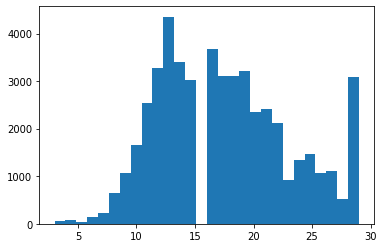

In [60]:
sentenceLengths= [l for l in sentLengthList]

plt.hist(np.array(sentenceLengths), bins=(max_length-2))

An average sentence length of ~25 (incl. extra tokens!) is roughly expected. It turns out that on these types of corpora an average sentence length of ~20 tends to be seen. The big spike on the right obviously corresponds to all sentences that we had to truncate. 

Next, we analyze the distribution of ner labels. First, we assign numbers to the labels and look at the overall distribution:

### III.5. Train/Test Split and Final Data Preparation<a id="split" />

In the last step we need to prepare both labels and input for the model, including the train/test split.

In [61]:
bert_inputs = np.array([bertSentenceIDs, bertMasks, bertSequenceIDs])

In [62]:
numSentences = len(bert_inputs[0])
np.random.seed(0)
training_examples = np.random.binomial(1, 0.7, numSentences)

In [63]:
trainSentence_ids = []
trainMasks = []
trainSequence_ids = []

trainLabel_ids = []

testSentence_ids = []
testMasks = []
testSequence_ids = []

testLabels_ids = []

count = 0

for example in range(numSentences):
    if training_examples[example] == 1:
        trainSentence_ids.append(bert_inputs[0][example])
        trainMasks.append(bert_inputs[1][example])
        trainSequence_ids.append(bert_inputs[2][example])
        trainLabel_ids.append(new_labels1h[count])

    else:
        testSentence_ids.append(bert_inputs[0][example])
        testMasks.append(bert_inputs[1][example])
        testSequence_ids.append(bert_inputs[2][example])
        testLabels_ids.append(new_labels1h[count])
    count += 1

        
X_train = np.array([trainSentence_ids,trainMasks,trainSequence_ids])
X_test = np.array([testSentence_ids,testMasks,testSequence_ids])

trainLabel_ids = np.array(trainLabel_ids)
testLabels_ids = np.array(testLabels_ids)

In [64]:
X_train[0,0]

array([  101, 25793,  1104, 23755, 10556, 15501,  1107, 15109,  1112,
        3103,  7086, 20245,   102,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0])

In [65]:
print(sentenceTokenList[0])

['[CLS]', 'Hundreds', 'of', 'Palestinians', 'flee', 'floods', 'in', 'Gaza', 'as', 'Israel', 'opens', 'dams', '[SEP]', '[PAD]', '[PAD]', '[PAD]', '[PAD]', '[PAD]', '[PAD]', '[PAD]', '[PAD]', '[PAD]', '[PAD]', '[PAD]', '[PAD]', '[PAD]', '[PAD]', '[PAD]', '[PAD]', '[PAD]']


In [66]:
training_examples[:10]

array([1, 0, 1, 1, 1, 1, 1, 0, 0, 1])

In [67]:
# Use a parameter pair k_start, k_end to look at slices. This helps with quick tests.

k_start = 0
k_end = -1

if k_end == -1:
    k_end_train = X_train[0].shape[0]
    k_end_test = X_test[0].shape[0]
else:
    k_end_train = k_end_test = k_end
    


bert_inputs_train_k = [X_train[0][k_start:k_end_train], X_train[1][k_start:k_end_train], 
                       X_train[2][k_start:k_end_train]]
bert_inputs_test_k = [X_test[0][k_start:k_end_test], X_test[1][k_start:k_end_test], 
                      X_test[2][k_start:k_end_test]]


labels_train_k = trainLabel_ids[k_start:k_end_train]
labels_test_k = testLabels_ids[k_start:k_end_test]

#labels_train_k = nerLabels_train[k_start:k_end_train]
#labels_test_k = nerLabels_test[k_start:k_end_test]

In [68]:
bert_inputs.shape
X_train.shape

(3, 35090, 30)

In [69]:
new_labels1h.shape

(49972, 4)

In [70]:
trainLabel_ids.shape

(35090, 4)

## IV. The Model<a id="model"/>

### IV.1. Custom Loss & Accuracy<a id="custom"/>

We need a **custom loss function** because we only want to optimize for the labels that we actually had in the text, not the extra ones like '[nerPAD]', etc. Our cost function is therefore derived from sparse_categorical_crossentropy, but we choose to modify the function a bit:  we want to mask out all tokens that have a token id larger or equal of 17, corresponding to the extra tokens:  

In [71]:
def custom_loss(y_true, y_pred):
    """
    calculate loss function explicitly, filtering out 'extra inserted labels'
    
    y_true: Shape: (batch x (max_length + 1) )
    y_pred: predictions. Shape: (batch x x (max_length + 1) x num_distinct_ner_tokens ) 
    
    returns:  cost
    """

    #get labels and predictions
    
    y_label = tf.reshape(tf.layers.Flatten()(tf.cast(y_true, tf.int32)),[-1])
    
    mask = (y_label < 17)   # This mask is used to remove all tokens that do not correspond to the original base text.

    y_label_masked = tf.boolean_mask(y_label, mask)  # mask the labels
    
    y_flat_pred = tf.reshape(tf.layers.Flatten()(tf.cast(y_pred, tf.float32)),[-1, 7])
    
    y_flat_pred_masked = tf.boolean_mask(y_flat_pred, mask) # mask the predictions
    
    return tf.reduce_mean(sparse_categorical_crossentropy(y_label_masked, y_flat_pred_masked,from_logits=False ))



### IV.2 Keras BERT Layer<a id="bert_layer"/>


We start by creating a Keras layer for the BERT module from Tensorflow hub. (Note: This code is simply a more specified and for our purposes adjusted version of the equivalent cell in (https://towardsdatascience.com/bert-in-keras-with-tensorflow-hub-76bcbc9417b)   

Note, how then trainable variables are built. (See also: https://www.tensorflow.org/api_docs/python/tf/keras/layers/Layer)

In [72]:
adam_customized = tf.keras.optimizers.Adam(lr=0.001, beta_1=0.91, beta_2=0.999, epsilon=None, decay=0.1, amsgrad=False)

In [73]:
# class BertLayer(tf.keras.layers.Layer):
#     """
#     Create BERT layer, following https://towardsdatascience.com/bert-in-keras-with-tensorflow-hub-76bcbc9417b
#     init:  initialize layer. Specify various parameters regarding output types and dimensions. Very important is
#            to set the number of trainable layers.
#     build: build the layer based on parameters
#     call:  call the BERT layer within a model
#     """
    
#     def __init__(
#         self,
#         n_fine_tune_layers=10,
#         pooling="sequence",
#         bert_url="https://tfhub.dev/google/bert_cased_L-12_H-768_A-12/1",
#         **kwargs,
#     ):
#         self.n_fine_tune_layers = n_fine_tune_layers
#         self.trainable = True
#         self.output_size = 768
#         self.pooling = pooling
#         self.bert_url = bert_url

#         super(BertLayer, self).__init__(**kwargs)

#     def build(self, input_shape):
#         self.bert = hub.Module(
#             self.bert_url, trainable=self.trainable, name=f"{self.name}_module"
#         )

#         # Remove unused layers
#         trainable_vars = self.bert.variables
#         trainable_vars = [
#                 var
#                 for var in trainable_vars
#                 if not "/cls/" in var.name and not "/pooler/" in var.name
#             ]
#         trainable_layers = []


#         # Select how many layers to fine tune
#         for i in range(self.n_fine_tune_layers):
#             trainable_layers.append(f"encoder/layer_{str(11 - i)}")

#         # Update trainable vars to contain only the specified layers
#         trainable_vars = [
#             var
#             for var in trainable_vars
#             if any([l in var.name for l in trainable_layers])
#         ]

#         # Add to trainable weights
#         for var in trainable_vars:
#             self._trainable_weights.append(var)

#         for var in self.bert.variables:
#             if var not in self._trainable_weights:
#                 self._non_trainable_weights.append(var)

#         super(BertLayer, self).build(input_shape)

#     def call(self, inputs):
#         inputs = [K.cast(x, dtype="int32") for x in inputs]
#         input_ids, input_mask, segment_ids = inputs
#         bert_inputs = dict(
#             input_ids=input_ids, input_mask=input_mask, segment_ids=segment_ids
#         )
#         result = self.bert(inputs=bert_inputs, signature="tokens", as_dict=True)[
#                 "sequence_output"
#             ]

#         mul_mask = lambda x, m: x * tf.expand_dims(m, axis=-1)

#         return result

#     def compute_output_shape(self, input_shape):
#         return (input_shape[0], self.output_size)

In [74]:
class BertLayer(tf.keras.layers.Layer):

    def __init__(
        self,
        n_fine_tune_layers=10,
        pooling="sequence",
        bert_url="https://tfhub.dev/google/bert_cased_L-12_H-768_A-12/1",
        **kwargs,
    ):

        self.n_fine_tune_layers = n_fine_tune_layers
        self.trainable = True
        self.output_size = 768
        self.pooling = pooling
        self.bert_url = bert_url        

        super(BertLayer, self).__init__(**kwargs)



    def build(self, input_shape):
        self.bert = hub.Module(
            self.bert_url, trainable=self.trainable, name=f"{self.name}_module"
        )

        trainable_vars = self.bert.variables

        

        # Remove unused layers

        trainable_vars = [var for var in trainable_vars if not "/cls/" in var.name]

        

        # Select how many layers to fine tune

        trainable_vars = trainable_vars[-self.n_fine_tune_layers :]

        

        # Add to trainable weights

        for var in trainable_vars:

            self._trainable_weights.append(var)

        

        # Add non-trainable weights

        for var in self.bert.variables:

            if var not in self._trainable_weights:

                self._non_trainable_weights.append(var)

        

        super(BertLayer, self).build(input_shape)



    def call(self, inputs):

        inputs = [K.cast(x, dtype="int32") for x in inputs]

        input_ids, input_mask, segment_ids = inputs

        bert_inputs = dict(

            input_ids=input_ids, input_mask=input_mask, segment_ids=segment_ids

        )

        result = self.bert(inputs=bert_inputs, signature="tokens", as_dict=True)[

            "pooled_output"

        ]

        return result



    def compute_output_shape(self, input_shape):

        return (input_shape[0], self.output_size)

In [75]:
def variable_summaries(var):
    """Attach a lot of summaries to a Tensor (for TensorBoard visualization)."""
    with tf.name_scope('summaries'):
        mean = tf.reduce_mean(var)
        tf.summary.scalar('mean', mean)
        with tf.name_scope('stddev'):
            stddev = tf.sqrt(tf.reduce_mean(tf.square(var - mean)))
        tf.summary.scalar('stddev', stddev)
        tf.summary.scalar('max', tf.reduce_max(var))
        tf.summary.scalar('min', tf.reduce_min(var))
        tf.summary.histogram('histogram', var)

### IV.3 Model Construction<a id="ner_model"/>

In [76]:
def stance_model(max_input_length, train_layers, optimizer):
    """
    Implementation of Sentence Class model
    
    variables:
        max_input_length: number of tokens (max_length + 1)
        train_layers: number of layers to be retrained
        optimizer: optimizer to be used
    
    returns: model
    """
    
    in_id = tf.keras.layers.Input(shape=(max_length,), name="input_ids")
    in_mask = tf.keras.layers.Input(shape=(max_length,), name="input_masks")
    in_segment = tf.keras.layers.Input(shape=(max_length,), name="segment_ids")
    
    
    bert_inputs = [in_id, in_mask, in_segment]
    
    bert_sequence = BertLayer(n_fine_tune_layers=train_layers)(bert_inputs)
    
    print(bert_sequence)
    
    dense = tf.keras.layers.Dense(256, activation='relu', name='dense')(bert_sequence)
    
    dense = tf.keras.layers.Dropout(rate=0.1)(dense)
    
    pred = tf.keras.layers.Dense(21, activation='softmax', name='ner')(dense)
     
    print('pred: ', pred)
    
    ## Prepare for multipe loss functions, although not used here
    
    losses = {
        "ner": custom_loss,
        }
    lossWeights = {"ner": 1.0
                  }
    
    model = tf.keras.models.Model(inputs=bert_inputs, outputs=pred)

    model.compile(loss=losses, optimizer=optimizer, metrics=['accuracy'])
    
    
    model.summary()
    
    return model

def initialize_vars(sess):
    sess.run(tf.local_variables_initializer())
    sess.run(tf.global_variables_initializer())
    sess.run(tf.tables_initializer())
    K.set_session(sess)


## V. Model Runs/Experiments<a id="runs"/>

### V.1. With BERT-Layer Re-Training<a id="retrain"/>

It is time to run the first test.

In [77]:
#Start session

sess = tf.Session()

model = stance_model(max_length + 1, train_layers=4, optimizer = adam_customized)



INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


Tensor("bert_layer/bert_layer_module_apply_tokens/bert/pooler/dense/Tanh:0", shape=(?, 768), dtype=float32)
pred:  Tensor("ner/Softmax:0", shape=(?, 21), dtype=float32)
Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_ids (InputLayer)          [(None, 30)]         0                                            
__________________________________________________________________________________________________
input_masks (InputLayer)        [(None, 30)]         0                                            
__________________________________________________________________________________________________
segment_ids (InputLayer)        [(None, 30)]         0                                            
__________________________________________________________________________________________________
bert_layer (BertLayer)

In [78]:
# Instantiate variables
initialize_vars(sess)

#tensorboard = TensorBoard(log_dir="logs/{}".format(time()))

model.fit(
    bert_inputs_train_k, 
    {"ner": labels_train_k },
    validation_data=(bert_inputs_test_k, {"ner": labels_test_k }),
    epochs=8,
    batch_size=32#,
    #callbacks=[tensorboard]
)

Train on 35090 samples, validate on 14880 samples
Epoch 1/8
35090/35090 [==============================] - 101s 3ms/sample - loss: 0.9226 - acc: 0.0143 - val_loss: 0.9097 - val_acc: 0.0167
Epoch 2/8
35090/35090 [==============================] - 100s 3ms/sample - loss: 0.9163 - acc: 0.0152 - val_loss: 0.9098 - val_acc: 0.0167
Epoch 3/8
35090/35090 [==============================] - 100s 3ms/sample - loss: 0.9150 - acc: 0.0151 - val_loss: 0.9092 - val_acc: 0.0167
Epoch 4/8
35090/35090 [==============================] - 100s 3ms/sample - loss: 0.9150 - acc: 0.0147 - val_loss: 0.9093 - val_acc: 0.0167
Epoch 5/8
35090/35090 [==============================] - 100s 3ms/sample - loss: 0.9142 - acc: 0.0144 - val_loss: 0.9091 - val_acc: 0.0167
Epoch 6/8
35090/35090 [==============================] - 100s 3ms/sample - loss: 0.9139 - acc: 0.0145 - val_loss: 0.9091 - val_acc: 0.0167
Epoch 7/8
35090/35090 [==============================] - 100s 3ms/sample - loss: 0.9136 - acc: 0.0145 - val_loss: 0.

In [80]:
#Start session

sess = tf.Session()

model = stance_model(max_length + 1, train_layers=4, optimizer = adam_customized)

# Instantiate variables
initialize_vars(sess)

#tensorboard = TensorBoard(log_dir="logs/{}".format(time()))

model.fit(
    bert_inputs_train_k, 
    {"ner": labels_train_k },
    validation_data=(bert_inputs_test_k, {"ner": labels_test_k }),
    epochs=8,
    batch_size=32#,
    #callbacks=[tensorboard]
)


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


Tensor("bert_layer_1/bert_layer_1_module_apply_tokens/bert/pooler/dense/Tanh:0", shape=(?, 768), dtype=float32)
pred:  Tensor("ner_1/Softmax:0", shape=(?, 21), dtype=float32)
Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_ids (InputLayer)          [(None, 30)]         0                                            
__________________________________________________________________________________________________
input_masks (InputLayer)        [(None, 30)]         0                                            
__________________________________________________________________________________________________
segment_ids (InputLayer)        [(None, 30)]         0                                            
__________________________________________________________________________________________________
bert_layer_1 (Be

In [81]:
bert_inputs_infer = [X_test[0], X_test[1], X_test[2]]

result = model.predict(
    bert_inputs_infer, 
    batch_size=32
)

In [82]:
print(result.shape)

(14880, 21)


In [86]:
sess = tf.Session()

model = stance_model(max_length + 1,train_layers=0,optimizer='adam')

# Instantiate variables
initialize_vars(sess)

#tensorboard = TensorBoard(log_dir="logs/{}".format(time()))

model.fit(
    bert_inputs_train_k, 
    {"ner": labels_train_k },
    validation_data=(bert_inputs_test_k, {"ner": labels_test_k}),
    epochs=8,
    batch_size=32#,
    #callbacks=[tensorboard]
)



INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


Tensor("bert_layer_2/bert_layer_2_module_apply_tokens/bert/pooler/dense/Tanh:0", shape=(?, 768), dtype=float32)
pred:  Tensor("ner_2/Softmax:0", shape=(?, 21), dtype=float32)
Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_ids (InputLayer)          [(None, 30)]         0                                            
__________________________________________________________________________________________________
input_masks (InputLayer)        [(None, 30)]         0                                            
__________________________________________________________________________________________________
segment_ids (InputLayer)        [(None, 30)]         0                                            
__________________________________________________________________________________________________
bert_layer_2 (Be